# Training and Saving Models for CIFAR Classifier

This notebook demonstrates how to train a model on the CIFAR-100 dataset and save it in a format that can be loaded by our TensorFlow.js application.

## Setup and Dependencies

First, let's install the required packages:

In [1]:
!pip install tensorflow tensorflowjs matplotlib numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/89.1 kB ? eta -:--:--

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.3 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/16.1 MB ? eta -:--:--

     ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/16.1 MB 25.6 MB/s eta 0:00:01

     ━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/16.1 MB 30.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 7.3/16.1 MB 42.0 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━ 10.8/16.1 MB 55.5 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 16.1/16.1 MB 99.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 16.1/16.1 MB 99.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 48.7 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 4.6 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/12.0 MB ? eta -:--:--

     ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━ 5.3/12.0 MB 159.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━ 7.2/12.0 MB 69.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 12.0/12.0 MB 82.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 19.0 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 40.4 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/644.8 MB 144.9 MB/s eta 0:00:05

     ╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/644.8 MB 143.3 MB/s eta 0:00:05

     ━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.9/644.8 MB 151.1 MB/s eta 0:00:05

     ━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.9/644.8 MB 151.1 MB/s eta 0:00:05

     ━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/644.8 MB 75.0 MB/s eta 0:00:09

     ━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.7/644.8 MB 170.3 MB/s eta 0:00:04

     ━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/644.8 MB 169.4 MB/s eta 0:00:04

     ━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/644.8 MB 159.7 MB/s eta 0:00:04

     ━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/644.8 MB 164.6 MB/s eta 0:00:04

     ━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/644.8 MB 167.2 MB/s eta 0:00:04

     ━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.4/644.8 MB 171.3 MB/s eta 0:00:04

     ━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/644.8 MB 171.3 MB/s eta 0:00:04

     ━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/644.8 MB 169.7 MB/s eta 0:00:04

     ━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.6/644.8 MB 168.0 MB/s eta 0:00:04

     ━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.6/644.8 MB 168.0 MB/s eta 0:00:04

     ━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.2/644.8 MB 85.1 MB/s eta 0:00:07

     ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/644.8 MB 170.6 MB/s eta 0:00:04

     ━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.8/644.8 MB 155.3 MB/s eta 0:00:04

     ━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/644.8 MB 143.1 MB/s eta 0:00:04

     ━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.7/644.8 MB 171.4 MB/s eta 0:00:03

     ━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.6/644.8 MB 170.9 MB/s eta 0:00:03

     ━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.8/644.8 MB 144.2 MB/s eta 0:00:04

     ━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.9/644.8 MB 144.6 MB/s eta 0:00:04

     ━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.3/644.8 MB 152.0 MB/s eta 0:00:04

     ━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.1/644.8 MB 158.9 MB/s eta 0:00:03

     ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.2/644.8 MB 160.3 MB/s eta 0:00:03

     ━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━ 196.2/644.8 MB 162.9 MB/s eta 0:00:03

     ━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━ 202.1/644.8 MB 171.3 MB/s eta 0:00:03

     ━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━ 214.0/644.8 MB 172.5 MB/s eta 0:00:03

     ━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/644.8 MB 176.0 MB/s eta 0:00:03

     ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━ 228.7/644.8 MB 127.3 MB/s eta 0:00:04

     ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━ 234.7/644.8 MB 171.7 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━ 246.2/644.8 MB 167.2 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━ 252.0/644.8 MB 169.3 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 263.6/644.8 MB 166.9 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 269.2/644.8 MB 165.0 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━ 280.9/644.8 MB 168.3 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━ 286.8/644.8 MB 173.2 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 298.7/644.8 MB 170.9 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 304.4/644.8 MB 170.7 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━ 310.1/644.8 MB 165.7 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━ 321.8/644.8 MB 167.9 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━ 327.7/644.8 MB 169.3 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━ 339.6/644.8 MB 172.6 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 345.4/644.8 MB 170.1 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━ 357.0/644.8 MB 168.5 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━ 362.6/644.8 MB 165.6 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━ 374.6/644.8 MB 174.5 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 380.4/644.8 MB 169.8 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━ 392.0/644.8 MB 168.6 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━ 397.5/644.8 MB 161.9 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━ 403.3/644.8 MB 164.6 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━ 414.8/644.8 MB 165.1 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 419.8/644.8 MB 152.3 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━ 430.9/644.8 MB 161.8 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━ 436.0/644.8 MB 157.3 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━ 446.5/644.8 MB 152.7 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━ 452.2/644.8 MB 163.0 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━ 463.3/644.8 MB 160.9 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━ 468.7/644.8 MB 157.9 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━ 479.8/644.8 MB 159.7 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━ 485.4/644.8 MB 161.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 496.9/644.8 MB 166.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━ 502.4/644.8 MB 161.5 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━ 507.7/644.8 MB 156.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━ 519.2/644.8 MB 166.5 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━ 525.0/644.8 MB 168.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 536.5/644.8 MB 166.2 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━ 542.2/644.8 MB 165.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━ 553.7/644.8 MB 167.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━ 559.4/644.8 MB 165.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 571.0/644.8 MB 167.8 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━ 576.8/644.8 MB 169.9 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━ 588.5/644.8 MB 169.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━ 594.1/644.8 MB 167.8 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 604.9/644.8 MB 154.2 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━ 610.6/644.8 MB 165.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━ 616.1/644.8 MB 163.0 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━ 627.0/644.8 MB 157.2 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺ 632.7/644.8 MB 154.0 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.4/644.8 MB 169.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 644.8/644.8 MB 164.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.8/644.8 MB 636.8 kB/s eta 0:00:00


INFO: pip is looking at multiple versions of tensorflow-decision-forests to determine which version is compatible with other requirements. This could take a while.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/15.9 MB ? eta -:--:--

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━ 11.7/15.9 MB 171.1 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 15.9/15.9 MB 160.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 67.6 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/615.3 MB ? eta -:--:--

     ╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/615.3 MB 171.1 MB/s eta 0:00:04

     ━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/615.3 MB 106.0 MB/s eta 0:00:06

     ━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.0/615.3 MB 169.0 MB/s eta 0:00:04

     ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/615.3 MB 170.6 MB/s eta 0:00:04

     ━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/615.3 MB 168.5 MB/s eta 0:00:04

     ━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.3/615.3 MB 169.4 MB/s eta 0:00:04

     ━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/615.3 MB 169.8 MB/s eta 0:00:04

     ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.9/615.3 MB 171.2 MB/s eta 0:00:04

     ━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.8/615.3 MB 171.7 MB/s eta 0:00:04

     ━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.5/615.3 MB 170.1 MB/s eta 0:00:04

     ━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.4/615.3 MB 170.8 MB/s eta 0:00:04

     ━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.1/615.3 MB 170.3 MB/s eta 0:00:03

     ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.9/615.3 MB 169.8 MB/s eta 0:00:03

     ━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.8/615.3 MB 172.4 MB/s eta 0:00:03

     ━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.7/615.3 MB 170.9 MB/s eta 0:00:03

     ━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.5/615.3 MB 170.4 MB/s eta 0:00:03

     ━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.3/615.3 MB 171.7 MB/s eta 0:00:03

     ━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.2/615.3 MB 171.3 MB/s eta 0:00:03

     ━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.3/615.3 MB 161.5 MB/s eta 0:00:03

     ━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.1/615.3 MB 159.9 MB/s eta 0:00:03

     ━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.6/615.3 MB 137.0 MB/s eta 0:00:04

     ━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━ 185.4/615.3 MB 165.3 MB/s eta 0:00:03

     ━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━ 191.1/615.3 MB 111.9 MB/s eta 0:00:04

     ━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.2/615.3 MB 79.1 MB/s eta 0:00:06

     ━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.7/615.3 MB 51.7 MB/s eta 0:00:09

     ━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━ 195.3/615.3 MB 48.5 MB/s eta 0:00:09

     ━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━ 205.0/615.3 MB 136.2 MB/s eta 0:00:04

     ━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━ 211.0/615.3 MB 173.2 MB/s eta 0:00:03

     ━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━ 222.9/615.3 MB 174.5 MB/s eta 0:00:03

     ━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━ 228.6/615.3 MB 168.9 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━ 234.1/615.3 MB 162.1 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━ 245.9/615.3 MB 171.1 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━ 251.8/615.3 MB 171.5 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━ 263.6/615.3 MB 171.3 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━ 269.6/615.3 MB 170.9 MB/s eta 0:00:03

     ━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━ 281.5/615.3 MB 173.8 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 287.0/615.3 MB 165.2 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━ 298.8/615.3 MB 171.4 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━ 304.8/615.3 MB 172.0 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━ 316.3/615.3 MB 166.8 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━ 322.3/615.3 MB 173.0 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━ 334.1/615.3 MB 170.7 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━ 340.1/615.3 MB 173.1 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━ 351.9/615.3 MB 170.2 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 358.0/615.3 MB 175.0 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━ 364.0/615.3 MB 174.9 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━ 376.0/615.3 MB 173.7 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━ 382.0/615.3 MB 172.6 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━ 394.0/615.3 MB 174.1 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 399.9/615.3 MB 173.9 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━ 411.8/615.3 MB 173.2 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━ 417.8/615.3 MB 173.1 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━ 429.7/615.3 MB 173.8 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━ 435.5/615.3 MB 171.4 MB/s eta 0:00:02

     ━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━ 447.5/615.3 MB 174.5 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━ 453.4/615.3 MB 171.6 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━ 465.4/615.3 MB 173.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━ 471.1/615.3 MB 169.0 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━ 482.3/615.3 MB 161.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━ 487.6/615.3 MB 153.9 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━ 499.4/615.3 MB 170.7 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━ 505.3/615.3 MB 170.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 511.2/615.3 MB 170.9 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━ 522.7/615.3 MB 167.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━ 528.1/615.3 MB 162.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━ 539.0/615.3 MB 157.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 544.9/615.3 MB 165.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━ 556.1/615.3 MB 161.8 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━ 561.4/615.3 MB 157.9 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━ 572.5/615.3 MB 160.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 578.5/615.3 MB 168.8 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━ 590.3/615.3 MB 170.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━ 596.2/615.3 MB 171.2 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 607.7/615.3 MB 165.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 612.8/615.3 MB 153.4 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 615.3/615.3 MB 151.3 MB/s eta 0:00:01

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 617.0 kB/s eta 0:00:00


  Attempting uninstall: packaging
    Found existing installation: packaging 25.0
    Uninstalling packaging-25.0:


      Successfully uninstalled packaging-25.0


  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.18.1


    Uninstalling tensorflow-2.18.1:


      Successfully uninstalled tensorflow-2.18.1



[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

2025-05-22 14:05:03.439686: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered


E0000 00:00:1747922703.461980      74 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747922703.469477      74 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Load and Preprocess CIFAR-100 Dataset

In [3]:
# Load CIFAR-100 dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar100.load_data()

# Normalize pixel values to be between 0 and 1
x_train, x_test = x_train / 255.0, x_test / 255.0

# Print dataset shapes
print(f'Training data shape: {x_train.shape}')
print(f'Training labels shape: {y_train.shape}')
print(f'Test data shape: {x_test.shape}')
print(f'Test labels shape: {y_test.shape}')

        0/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

     8192/169001437 ━━━━━━━━━━━━━━━━━━━━ 32:06 11us/step

    40960/169001437 ━━━━━━━━━━━━━━━━━━━━ 12:53 5us/step 

    98304/169001437 ━━━━━━━━━━━━━━━━━━━━ 8:03 3us/step 

   212992/169001437 ━━━━━━━━━━━━━━━━━━━━ 4:57 2us/step

   442368/169001437 ━━━━━━━━━━━━━━━━━━━━ 2:58 1us/step

   909312/169001437 ━━━━━━━━━━━━━━━━━━━━ 1:44 1us/step

  1826816/169001437 ━━━━━━━━━━━━━━━━━━━━ 1:00 0us/step

  3686400/169001437 ━━━━━━━━━━━━━━━━━━━━ 33s 0us/step 

  6815744/169001437 ━━━━━━━━━━━━━━━━━━━━ 20s 0us/step

  9936896/169001437 ━━━━━━━━━━━━━━━━━━━━ 15s 0us/step

 13058048/169001437 ━━━━━━━━━━━━━━━━━━━━ 12s 0us/step

 16031744/169001437 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step

 16252928/169001437 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step

 19169280/169001437 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step 

 21397504/169001437 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step

 22462464/169001437 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step

 23789568/169001437 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step

 25608192/169001437 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step

 27156480/169001437 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step

 28631040/169001437 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step

 30957568/169001437 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step

 31940608/169001437 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step

 34004992/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

 34914304/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

 37314560/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

 38240256/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

 40378368/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

 41189376/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

 43458560/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 44474368/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 46686208/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 49102848/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 49971200/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 52199424/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 53272576/169001437 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

 55427072/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 56541184/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 58351616/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 59359232/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 61308928/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 62275584/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 63971328/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 65200128/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 66912256/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 68182016/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 69730304/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 71180288/169001437 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

 72638464/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 74129408/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 75554816/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 77053952/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 78487552/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 79978496/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 81543168/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 83017728/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 84377600/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 85893120/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 87449600/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 88809472/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 90374144/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 91676672/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 93298688/169001437 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 94756864/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

 96157696/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

 97640448/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

 99155968/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

100605952/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

101941248/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

103514112/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

105013248/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

106438656/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

107929600/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

109363200/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

110837760/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

112304128/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

113713152/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

115138560/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

116654080/169001437 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

118063104/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

119611392/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

120930304/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

122494976/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

123887616/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

125419520/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

126779392/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

128401408/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

129769472/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

131399680/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

132759552/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

134316032/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

135725056/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

137330688/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

138633216/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

140320768/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

141688832/169001437 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

143294464/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

144646144/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

146268160/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

147628032/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

149372928/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

150880256/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

152608768/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

154296320/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

155729920/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

157351936/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

158851072/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

160415744/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

162013184/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

163520512/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

165142528/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

166567936/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

168132608/169001437 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

169001437/169001437 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Training data shape: (50000, 32, 32, 3)
Training labels shape: (50000, 1)
Test data shape: (10000, 32, 32, 3)
Test labels shape: (10000, 1)


## Visualize Some Examples

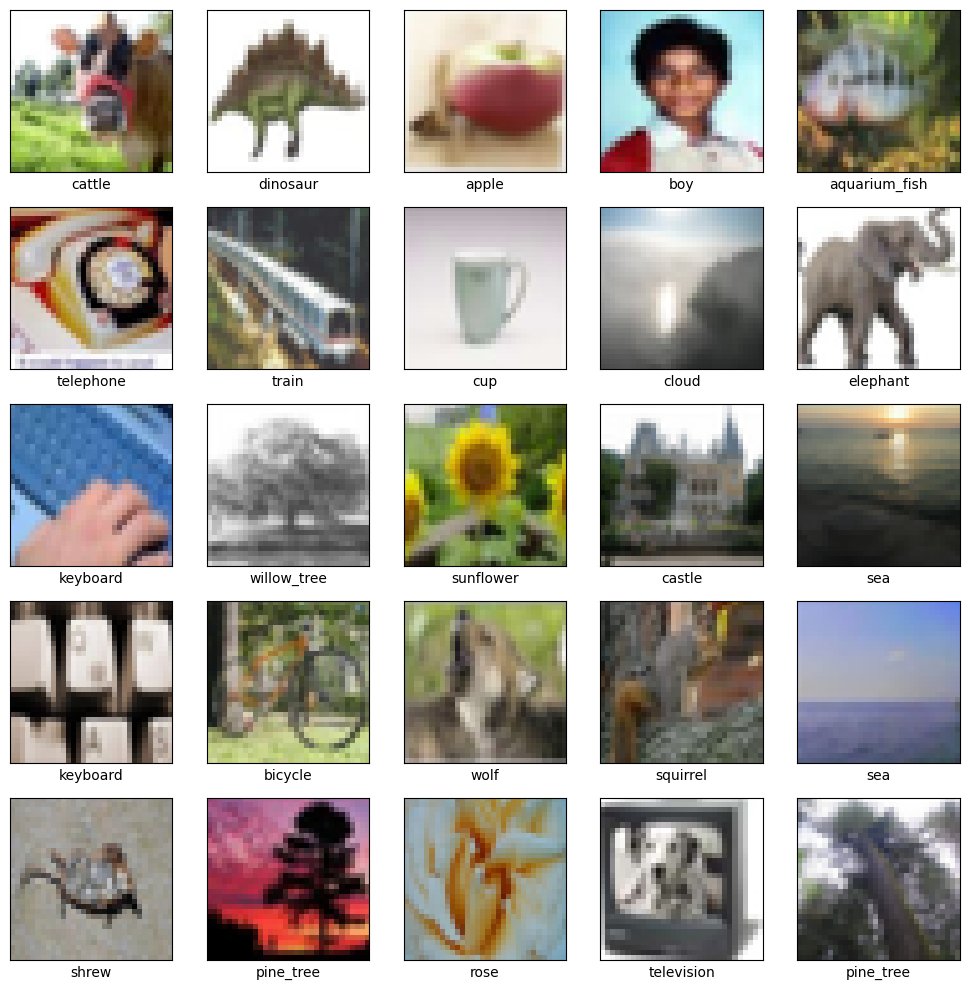

In [4]:
# Define CIFAR-100 class names
class_names = [
    'apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle',
    'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel',
    'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock',
    'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur',
    'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster',
    'house', 'kangaroo', 'keyboard', 'lamp', 'lawn_mower', 'leopard', 'lion',
    'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse',
    'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear',
    'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine',
    'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose',
    'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake',
    'spider', 'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table',
    'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout',
    'tulip', 'turtle', 'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman',
    'worm'
]

# Display some training images
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[i])
    # The CIFAR100 labels are 2D arrays with a single value, so we need to flatten them
    plt.xlabel(class_names[y_train[i][0]])
plt.tight_layout()
plt.show()

## Create a CNN Model for CIFAR-100

In [5]:
def create_model():
    model = tf.keras.Sequential([
        # Input layer - expects 32x32 RGB images
        tf.keras.layers.Input(shape=(32, 32, 3)),
        
        # First convolutional block
        tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.2),
        
        # Second convolutional block
        tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.3),
        
        # Third convolutional block
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.4),
        
        # Flatten and dense layers
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='softmax')  # 100 classes for CIFAR-100
    ])
    
    return model

# Create and compile the model
model = create_model()
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Display model summary
model.summary()

2025-05-22 14:05:29.113362: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 8, 8, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 564,484 (2.15 MB)

 Trainable params: 563,332 (2.15 MB)

 Non-trainable params: 1,152 (4.50 KB)

## Train the Model

This will take some time to run. You may want to use a GPU runtime if available.

In [6]:
# Define callbacks for training
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-6)
]

# Train the model
history = model.fit(
    x_train, y_train,
    epochs=50,  # You may want to reduce this for testing
    batch_size=64,
    validation_split=0.2,
    callbacks=callbacks
)

Epoch 1/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 40:11 4s/step - accuracy: 0.0156 - loss: 6.0420

  2/625 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - accuracy: 0.0117 - loss: 5.9132

  3/625 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - accuracy: 0.0113 - loss: 5.8500

  4/625 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.0114 - loss: 5.8110

  5/625 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - accuracy: 0.0116 - loss: 5.7743

  6/625 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - accuracy: 0.0118 - loss: 5.7519

  7/625 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - accuracy: 0.0121 - loss: 5.7314

  8/625 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.0123 - loss: 5.7168

  9/625 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - accuracy: 0.0126 - loss: 5.7014

 10/625 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - accuracy: 0.0129 - loss: 5.6866

 11/625 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - accuracy: 0.0131 - loss: 5.6776

 12/625 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - accuracy: 0.0133 - loss: 5.6676

 13/625 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - accuracy: 0.0135 - loss: 5.6591

 14/625 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - accuracy: 0.0139 - loss: 5.6508

 15/625 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - accuracy: 0.0140 - loss: 5.6436

 16/625 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - accuracy: 0.0145 - loss: 5.6358

 17/625 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - accuracy: 0.0150 - loss: 5.6282

 18/625 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - accuracy: 0.0154 - loss: 5.6211

 19/625 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - accuracy: 0.0157 - loss: 5.6134

 20/625 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - accuracy: 0.0161 - loss: 5.6061

 21/625 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - accuracy: 0.0164 - loss: 5.5991

 22/625 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - accuracy: 0.0166 - loss: 5.5924

 23/625 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - accuracy: 0.0169 - loss: 5.5856

 24/625 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - accuracy: 0.0171 - loss: 5.5788

 25/625 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - accuracy: 0.0173 - loss: 5.5720

 26/625 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - accuracy: 0.0175 - loss: 5.5652

 27/625 ━━━━━━━━━━━━━━━━━━━━ 50s 84ms/step - accuracy: 0.0177 - loss: 5.5584

 28/625 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - accuracy: 0.0179 - loss: 5.5515

 29/625 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - accuracy: 0.0182 - loss: 5.5449

 30/625 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - accuracy: 0.0183 - loss: 5.5382

 31/625 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - accuracy: 0.0185 - loss: 5.5316

 32/625 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - accuracy: 0.0186 - loss: 5.5254

 33/625 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - accuracy: 0.0187 - loss: 5.5194

 34/625 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - accuracy: 0.0188 - loss: 5.5133

 35/625 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - accuracy: 0.0189 - loss: 5.5075

 36/625 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - accuracy: 0.0190 - loss: 5.5017

 37/625 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - accuracy: 0.0191 - loss: 5.4961

 38/625 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - accuracy: 0.0191 - loss: 5.4904

 39/625 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - accuracy: 0.0192 - loss: 5.4848

 40/625 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - accuracy: 0.0193 - loss: 5.4797

 41/625 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - accuracy: 0.0194 - loss: 5.4746

 42/625 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - accuracy: 0.0194 - loss: 5.4695

 43/625 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.0195 - loss: 5.4645

 44/625 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.0196 - loss: 5.4596

 45/625 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.0197 - loss: 5.4545

 46/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0197 - loss: 5.4494

 47/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0198 - loss: 5.4443

 48/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0199 - loss: 5.4393

 49/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0200 - loss: 5.4345

 50/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0201 - loss: 5.4296

 51/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0202 - loss: 5.4248

 52/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0203 - loss: 5.4199

 53/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0203 - loss: 5.4151

 54/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0204 - loss: 5.4102

 55/625 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.0206 - loss: 5.4055

 56/625 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.0207 - loss: 5.4008

 57/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.0208 - loss: 5.3962

 58/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.0209 - loss: 5.3918

 59/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.0210 - loss: 5.3873

 60/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.0211 - loss: 5.3830

 61/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.0212 - loss: 5.3787

 62/625 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - accuracy: 0.0213 - loss: 5.3744

 63/625 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - accuracy: 0.0214 - loss: 5.3702

 64/625 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - accuracy: 0.0215 - loss: 5.3660

 65/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.0215 - loss: 5.3618

 66/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.0216 - loss: 5.3578

 67/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.0217 - loss: 5.3538

 68/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.0218 - loss: 5.3500

 69/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.0219 - loss: 5.3461

 70/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.0220 - loss: 5.3424

 71/625 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - accuracy: 0.0220 - loss: 5.3387

 72/625 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - accuracy: 0.0221 - loss: 5.3350

 73/625 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - accuracy: 0.0222 - loss: 5.3314

 74/625 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - accuracy: 0.0223 - loss: 5.3278

 75/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0224 - loss: 5.3243

 76/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0224 - loss: 5.3208

 77/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0225 - loss: 5.3173

 78/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0226 - loss: 5.3139

 79/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0227 - loss: 5.3105

 80/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0227 - loss: 5.3072

 81/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.0228 - loss: 5.3039

 82/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0229 - loss: 5.3007

 83/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0229 - loss: 5.2975

 84/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0230 - loss: 5.2943

 85/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0230 - loss: 5.2911

 86/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0231 - loss: 5.2880

 87/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0231 - loss: 5.2849

 88/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0232 - loss: 5.2819

 89/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0232 - loss: 5.2789

 90/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.0233 - loss: 5.2758

 91/625 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - accuracy: 0.0233 - loss: 5.2729

 92/625 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - accuracy: 0.0234 - loss: 5.2699

 93/625 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - accuracy: 0.0234 - loss: 5.2670

 94/625 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - accuracy: 0.0235 - loss: 5.2641

 95/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.0235 - loss: 5.2612

 96/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.0236 - loss: 5.2584

 97/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.0236 - loss: 5.2555

 98/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.0237 - loss: 5.2527

 99/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.0237 - loss: 5.2499

100/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0238 - loss: 5.2471

101/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0238 - loss: 5.2443

102/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0239 - loss: 5.2415

103/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0239 - loss: 5.2387

104/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0240 - loss: 5.2359

105/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0241 - loss: 5.2331

106/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0241 - loss: 5.2303

107/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0242 - loss: 5.2276

108/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0242 - loss: 5.2249

109/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0243 - loss: 5.2222

110/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.0243 - loss: 5.2195

111/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0244 - loss: 5.2169

112/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0244 - loss: 5.2143

113/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0245 - loss: 5.2117

114/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0245 - loss: 5.2091

115/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0246 - loss: 5.2065

116/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0247 - loss: 5.2040

117/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0247 - loss: 5.2014

118/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0248 - loss: 5.1989

119/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0248 - loss: 5.1964

120/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0249 - loss: 5.1939

121/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0249 - loss: 5.1914

122/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.0250 - loss: 5.1890

123/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0251 - loss: 5.1865

124/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0251 - loss: 5.1840

125/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0252 - loss: 5.1816

126/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0253 - loss: 5.1791

127/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0253 - loss: 5.1767

128/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0254 - loss: 5.1743

129/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0255 - loss: 5.1719

130/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0255 - loss: 5.1695

131/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0256 - loss: 5.1671

132/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0257 - loss: 5.1648

133/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.0257 - loss: 5.1624

134/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0258 - loss: 5.1600

135/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0259 - loss: 5.1577

136/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0259 - loss: 5.1554

137/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0260 - loss: 5.1531

138/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0261 - loss: 5.1508

139/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0262 - loss: 5.1485

140/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0262 - loss: 5.1462

141/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0263 - loss: 5.1439

142/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.0264 - loss: 5.1416

143/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.0264 - loss: 5.1393

144/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.0265 - loss: 5.1371

145/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0266 - loss: 5.1349

146/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0266 - loss: 5.1327

147/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0267 - loss: 5.1304

148/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0268 - loss: 5.1282

149/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0269 - loss: 5.1261

150/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0270 - loss: 5.1239

151/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0270 - loss: 5.1217

152/625 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.0271 - loss: 5.1196

153/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0272 - loss: 5.1174

154/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0273 - loss: 5.1153

155/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0273 - loss: 5.1132

156/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0274 - loss: 5.1111

157/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0275 - loss: 5.1090

158/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0276 - loss: 5.1069

159/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0276 - loss: 5.1048

160/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0277 - loss: 5.1028

161/625 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0278 - loss: 5.1007

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.0278 - loss: 5.0987

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.0279 - loss: 5.0966

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0280 - loss: 5.0946

165/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0281 - loss: 5.0926

166/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0281 - loss: 5.0906

167/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0282 - loss: 5.0885

168/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0283 - loss: 5.0865

169/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0283 - loss: 5.0846

170/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0284 - loss: 5.0826

171/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0285 - loss: 5.0806

172/625 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.0286 - loss: 5.0787

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0286 - loss: 5.0767

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0287 - loss: 5.0748

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0288 - loss: 5.0729

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0288 - loss: 5.0710

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0289 - loss: 5.0691

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0290 - loss: 5.0672

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0290 - loss: 5.0653

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0291 - loss: 5.0634

181/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0292 - loss: 5.0615

182/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0292 - loss: 5.0597

183/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.0293 - loss: 5.0578

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0294 - loss: 5.0560

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0294 - loss: 5.0541

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0295 - loss: 5.0523

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0296 - loss: 5.0505

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0296 - loss: 5.0487

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0297 - loss: 5.0469

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0297 - loss: 5.0451

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0298 - loss: 5.0433

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0299 - loss: 5.0415

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0299 - loss: 5.0397

194/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.0300 - loss: 5.0379

195/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.0301 - loss: 5.0361

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0301 - loss: 5.0344

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0302 - loss: 5.0326

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0302 - loss: 5.0308

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0303 - loss: 5.0290

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0304 - loss: 5.0273

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0304 - loss: 5.0255

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0305 - loss: 5.0238

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0306 - loss: 5.0221

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0306 - loss: 5.0203

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0307 - loss: 5.0186

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0308 - loss: 5.0169

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0308 - loss: 5.0152

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0309 - loss: 5.0135

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0310 - loss: 5.0118

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0310 - loss: 5.0101

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0311 - loss: 5.0084

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0312 - loss: 5.0067

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0312 - loss: 5.0050

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0313 - loss: 5.0034

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0314 - loss: 5.0017

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0314 - loss: 5.0001

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0315 - loss: 4.9984

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.0316 - loss: 4.9968

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0316 - loss: 4.9951

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0317 - loss: 4.9935

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0318 - loss: 4.9919

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0318 - loss: 4.9903

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0319 - loss: 4.9887

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0320 - loss: 4.9871

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0320 - loss: 4.9855

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0321 - loss: 4.9839

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0322 - loss: 4.9823

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.0322 - loss: 4.9807

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.0323 - loss: 4.9792

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.0324 - loss: 4.9776

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0324 - loss: 4.9761

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0325 - loss: 4.9745

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0326 - loss: 4.9730

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0326 - loss: 4.9714

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0327 - loss: 4.9699

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0328 - loss: 4.9684

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0328 - loss: 4.9669

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0329 - loss: 4.9653

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0330 - loss: 4.9638

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0330 - loss: 4.9623

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0331 - loss: 4.9608

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0332 - loss: 4.9593

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.0332 - loss: 4.9578

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0333 - loss: 4.9563

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0334 - loss: 4.9549

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0334 - loss: 4.9534

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0335 - loss: 4.9519

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0336 - loss: 4.9504

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0336 - loss: 4.9490

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0337 - loss: 4.9475

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0338 - loss: 4.9461

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0338 - loss: 4.9447

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0339 - loss: 4.9432

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0340 - loss: 4.9418

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0340 - loss: 4.9404

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.0341 - loss: 4.9389

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0341 - loss: 4.9375

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0342 - loss: 4.9361

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0343 - loss: 4.9347

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0343 - loss: 4.9333

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0344 - loss: 4.9319

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0345 - loss: 4.9305

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0345 - loss: 4.9291

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0346 - loss: 4.9278

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0346 - loss: 4.9264

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0347 - loss: 4.9250

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0348 - loss: 4.9237

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0348 - loss: 4.9223

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0349 - loss: 4.9210

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.0349 - loss: 4.9196

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.0350 - loss: 4.9183

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.0351 - loss: 4.9170

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0351 - loss: 4.9156

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.0352 - loss: 4.9143

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.0352 - loss: 4.9130

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.0353 - loss: 4.9116

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0353 - loss: 4.9103

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0354 - loss: 4.9090

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0355 - loss: 4.9077

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0355 - loss: 4.9064

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0356 - loss: 4.9051

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0356 - loss: 4.9038

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0357 - loss: 4.9025

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0358 - loss: 4.9012

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.0358 - loss: 4.8999

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0359 - loss: 4.8986

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0359 - loss: 4.8973

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0360 - loss: 4.8960

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0360 - loss: 4.8948

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0361 - loss: 4.8935

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0362 - loss: 4.8922

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0362 - loss: 4.8910

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0363 - loss: 4.8897

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0363 - loss: 4.8885

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0364 - loss: 4.8872

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0364 - loss: 4.8860

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0365 - loss: 4.8847

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.0365 - loss: 4.8835

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.0366 - loss: 4.8822

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.0367 - loss: 4.8810

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0367 - loss: 4.8798

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0368 - loss: 4.8785

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0368 - loss: 4.8773

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0369 - loss: 4.8761

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0369 - loss: 4.8748

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0370 - loss: 4.8736

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0371 - loss: 4.8724

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0371 - loss: 4.8712

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0372 - loss: 4.8700

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0372 - loss: 4.8688

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.0373 - loss: 4.8676

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0373 - loss: 4.8664

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0374 - loss: 4.8652

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0375 - loss: 4.8640

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0375 - loss: 4.8628

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0376 - loss: 4.8616

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0376 - loss: 4.8604

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0377 - loss: 4.8592

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0377 - loss: 4.8580

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0378 - loss: 4.8568

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0379 - loss: 4.8556

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0379 - loss: 4.8545

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0380 - loss: 4.8533

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.0380 - loss: 4.8521

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0381 - loss: 4.8510

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0382 - loss: 4.8498

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0382 - loss: 4.8486

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0383 - loss: 4.8475

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0383 - loss: 4.8463

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0384 - loss: 4.8452

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0384 - loss: 4.8440

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0385 - loss: 4.8429

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0386 - loss: 4.8417

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0386 - loss: 4.8406

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0387 - loss: 4.8395

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0387 - loss: 4.8383

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.0388 - loss: 4.8372

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0388 - loss: 4.8360

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0389 - loss: 4.8349

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0390 - loss: 4.8338

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0390 - loss: 4.8326

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0391 - loss: 4.8315

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0391 - loss: 4.8304

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0392 - loss: 4.8293

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0392 - loss: 4.8282

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0393 - loss: 4.8270

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0394 - loss: 4.8259

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0394 - loss: 4.8248

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0395 - loss: 4.8237

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.0395 - loss: 4.8226

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0396 - loss: 4.8215

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0396 - loss: 4.8204

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0397 - loss: 4.8193

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0398 - loss: 4.8182

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0398 - loss: 4.8171

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0399 - loss: 4.8160

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0399 - loss: 4.8149

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0400 - loss: 4.8139

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0400 - loss: 4.8128

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0401 - loss: 4.8117

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0402 - loss: 4.8106

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0402 - loss: 4.8095

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.0403 - loss: 4.8085

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0403 - loss: 4.8074

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0404 - loss: 4.8063

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0404 - loss: 4.8053

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0405 - loss: 4.8042

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0406 - loss: 4.8031

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0406 - loss: 4.8021

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0407 - loss: 4.8010

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0407 - loss: 4.8000

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0408 - loss: 4.7989

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0408 - loss: 4.7979

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0409 - loss: 4.7968

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0409 - loss: 4.7958

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0410 - loss: 4.7947

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.0410 - loss: 4.7937

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0411 - loss: 4.7926

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0412 - loss: 4.7916

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0412 - loss: 4.7906

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0413 - loss: 4.7895

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0413 - loss: 4.7885

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0414 - loss: 4.7875

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0414 - loss: 4.7864

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0415 - loss: 4.7854

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0416 - loss: 4.7844

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0416 - loss: 4.7834

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0417 - loss: 4.7823

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0417 - loss: 4.7813

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0418 - loss: 4.7803

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.0418 - loss: 4.7793

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0419 - loss: 4.7783

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0419 - loss: 4.7773

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0420 - loss: 4.7762

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0421 - loss: 4.7752

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0421 - loss: 4.7742

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0422 - loss: 4.7732

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0422 - loss: 4.7722

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0423 - loss: 4.7712

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0423 - loss: 4.7702

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0424 - loss: 4.7692

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0425 - loss: 4.7682

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0425 - loss: 4.7673

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0426 - loss: 4.7663

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.0426 - loss: 4.7653

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0427 - loss: 4.7643

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0427 - loss: 4.7633

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0428 - loss: 4.7623

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0428 - loss: 4.7613

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0429 - loss: 4.7604

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0430 - loss: 4.7594

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0430 - loss: 4.7584

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0431 - loss: 4.7574

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0431 - loss: 4.7565

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0432 - loss: 4.7555

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0432 - loss: 4.7545

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0433 - loss: 4.7536

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0433 - loss: 4.7526

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.0434 - loss: 4.7516

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0435 - loss: 4.7507

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0435 - loss: 4.7497

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0436 - loss: 4.7488

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0436 - loss: 4.7478

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0437 - loss: 4.7469

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0437 - loss: 4.7459

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0438 - loss: 4.7450

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0438 - loss: 4.7440

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0439 - loss: 4.7431

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0440 - loss: 4.7422

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0440 - loss: 4.7412

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0441 - loss: 4.7403

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.0441 - loss: 4.7393

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0442 - loss: 4.7384

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0442 - loss: 4.7375

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0443 - loss: 4.7366

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0443 - loss: 4.7356

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0444 - loss: 4.7347

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0445 - loss: 4.7338

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0445 - loss: 4.7329

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0446 - loss: 4.7319

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0446 - loss: 4.7310

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0447 - loss: 4.7301

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0447 - loss: 4.7292

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0448 - loss: 4.7283

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0448 - loss: 4.7273

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.0449 - loss: 4.7264

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0450 - loss: 4.7255

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0450 - loss: 4.7246

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0451 - loss: 4.7237

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0451 - loss: 4.7228

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0452 - loss: 4.7219

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0452 - loss: 4.7210

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0453 - loss: 4.7201

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0453 - loss: 4.7192

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0454 - loss: 4.7183

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0455 - loss: 4.7174

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0455 - loss: 4.7165

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0456 - loss: 4.7156

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0456 - loss: 4.7147

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.0457 - loss: 4.7138

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0457 - loss: 4.7130

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0458 - loss: 4.7121

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0458 - loss: 4.7112

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0459 - loss: 4.7103

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0459 - loss: 4.7094

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0460 - loss: 4.7086

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0461 - loss: 4.7077

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0461 - loss: 4.7068

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0462 - loss: 4.7059

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0462 - loss: 4.7051

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0463 - loss: 4.7042

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0463 - loss: 4.7033

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.0464 - loss: 4.7025

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0464 - loss: 4.7016

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0465 - loss: 4.7008

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0465 - loss: 4.6999

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0466 - loss: 4.6990

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0466 - loss: 4.6982

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0467 - loss: 4.6973

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0468 - loss: 4.6965

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0468 - loss: 4.6956

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0469 - loss: 4.6948

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0469 - loss: 4.6939

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0470 - loss: 4.6931

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0470 - loss: 4.6922

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0471 - loss: 4.6914

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.0471 - loss: 4.6905

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0472 - loss: 4.6897 

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0472 - loss: 4.6889

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0473 - loss: 4.6880

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0473 - loss: 4.6872

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0474 - loss: 4.6863

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0474 - loss: 4.6855

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0475 - loss: 4.6847

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0475 - loss: 4.6838

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0476 - loss: 4.6830

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0477 - loss: 4.6822

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0477 - loss: 4.6814

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0478 - loss: 4.6805

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0478 - loss: 4.6797

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.0479 - loss: 4.6789

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0479 - loss: 4.6780

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0480 - loss: 4.6772

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0480 - loss: 4.6764

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0481 - loss: 4.6756

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0481 - loss: 4.6748

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0482 - loss: 4.6740

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0482 - loss: 4.6731

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0483 - loss: 4.6723

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0483 - loss: 4.6715

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0484 - loss: 4.6707

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0484 - loss: 4.6699

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0485 - loss: 4.6691

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.0485 - loss: 4.6683

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0486 - loss: 4.6675

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0486 - loss: 4.6667

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0487 - loss: 4.6659

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0487 - loss: 4.6651

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0488 - loss: 4.6643

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0488 - loss: 4.6635

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.0489 - loss: 4.6627

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0490 - loss: 4.6619

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0490 - loss: 4.6611

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0491 - loss: 4.6603

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0491 - loss: 4.6595

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0492 - loss: 4.6588

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0492 - loss: 4.6580

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.0493 - loss: 4.6572

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0493 - loss: 4.6564

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0494 - loss: 4.6556

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0494 - loss: 4.6548

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0495 - loss: 4.6541

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0495 - loss: 4.6533

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0496 - loss: 4.6525

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.0496 - loss: 4.6517

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0497 - loss: 4.6509

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0497 - loss: 4.6502

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0498 - loss: 4.6494

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0498 - loss: 4.6486

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0499 - loss: 4.6479

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0499 - loss: 4.6471

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.0500 - loss: 4.6463

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.0500 - loss: 4.6456

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.0501 - loss: 4.6448

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0501 - loss: 4.6440

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0502 - loss: 4.6433

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0502 - loss: 4.6425

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0503 - loss: 4.6418

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0503 - loss: 4.6410

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0504 - loss: 4.6402

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0504 - loss: 4.6395

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0505 - loss: 4.6387

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0505 - loss: 4.6380

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0506 - loss: 4.6372

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.0506 - loss: 4.6365

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0507 - loss: 4.6357

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0507 - loss: 4.6349

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0508 - loss: 4.6342

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0508 - loss: 4.6334

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0509 - loss: 4.6327

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0509 - loss: 4.6319

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0510 - loss: 4.6312

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0510 - loss: 4.6304

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0511 - loss: 4.6297

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0511 - loss: 4.6290

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0512 - loss: 4.6282

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0512 - loss: 4.6275

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0513 - loss: 4.6267

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.0513 - loss: 4.6260

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0514 - loss: 4.6252

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0514 - loss: 4.6245

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0515 - loss: 4.6238

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0515 - loss: 4.6230

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0516 - loss: 4.6223

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0516 - loss: 4.6216

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0517 - loss: 4.6208

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0517 - loss: 4.6201

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0518 - loss: 4.6194

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0518 - loss: 4.6186

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0519 - loss: 4.6179

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0520 - loss: 4.6172

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0520 - loss: 4.6165

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.0521 - loss: 4.6157

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0521 - loss: 4.6150

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0522 - loss: 4.6143

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0522 - loss: 4.6136

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0523 - loss: 4.6128

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0523 - loss: 4.6121

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0524 - loss: 4.6114

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0524 - loss: 4.6107

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0525 - loss: 4.6100

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0525 - loss: 4.6092

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0526 - loss: 4.6085

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0526 - loss: 4.6078

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0527 - loss: 4.6071

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0527 - loss: 4.6064

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.0528 - loss: 4.6057

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0528 - loss: 4.6050

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0529 - loss: 4.6043

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0529 - loss: 4.6036

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0530 - loss: 4.6028

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0530 - loss: 4.6021

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0531 - loss: 4.6014

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0531 - loss: 4.6007

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0532 - loss: 4.6000

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0532 - loss: 4.5993

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0533 - loss: 4.5986

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0533 - loss: 4.5979

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0534 - loss: 4.5972

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0534 - loss: 4.5965

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.0535 - loss: 4.5958

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0535 - loss: 4.5951

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0536 - loss: 4.5944

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0536 - loss: 4.5937

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0537 - loss: 4.5930

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0537 - loss: 4.5923

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0538 - loss: 4.5917

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0538 - loss: 4.5910

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0539 - loss: 4.5903

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0539 - loss: 4.5896

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0540 - loss: 4.5889

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0540 - loss: 4.5882

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0541 - loss: 4.5875

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0541 - loss: 4.5868

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.0542 - loss: 4.5861

625/625 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.0542 - loss: 4.5855 - val_accuracy: 0.1591 - val_loss: 3.5813 - learning_rate: 0.0010


Epoch 2/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 110ms/step - accuracy: 0.1250 - loss: 3.7141

  2/625 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - accuracy: 0.1289 - loss: 3.7512  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - accuracy: 0.1276 - loss: 3.7275

  4/625 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - accuracy: 0.1289 - loss: 3.7119

  5/625 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - accuracy: 0.1338 - loss: 3.6869

  6/625 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - accuracy: 0.1371 - loss: 3.6655

  7/625 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - accuracy: 0.1385 - loss: 3.6572

  8/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.1405 - loss: 3.6464

  9/625 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - accuracy: 0.1419 - loss: 3.6385

 10/625 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - accuracy: 0.1435 - loss: 3.6295

 11/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.1449 - loss: 3.6233

 12/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.1459 - loss: 3.6189

 13/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.1464 - loss: 3.6164

 14/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.1466 - loss: 3.6140

 15/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.1468 - loss: 3.6121

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.1470 - loss: 3.6107

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.1473 - loss: 3.6087

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.1474 - loss: 3.6072

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.1476 - loss: 3.6051

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.1477 - loss: 3.6032

 21/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.1479 - loss: 3.6014

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.1479 - loss: 3.5999

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.1480 - loss: 3.5989

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.1481 - loss: 3.5980

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.1481 - loss: 3.5974

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.1480 - loss: 3.5973

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.1479 - loss: 3.5969

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.1479 - loss: 3.5961

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.1479 - loss: 3.5955

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1479 - loss: 3.5948

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1479 - loss: 3.5939

 32/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.1481 - loss: 3.5929

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1482 - loss: 3.5919

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1483 - loss: 3.5909

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1484 - loss: 3.5900

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1484 - loss: 3.5891

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1485 - loss: 3.5882

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1486 - loss: 3.5873

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1487 - loss: 3.5866

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1487 - loss: 3.5859

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1489 - loss: 3.5850

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.1490 - loss: 3.5841

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1491 - loss: 3.5833

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1493 - loss: 3.5826

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1494 - loss: 3.5820

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1495 - loss: 3.5814

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1496 - loss: 3.5807

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1498 - loss: 3.5801

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1499 - loss: 3.5796

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1500 - loss: 3.5790

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.1501 - loss: 3.5786

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.1502 - loss: 3.5782

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.1504 - loss: 3.5778

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.1505 - loss: 3.5775

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1506 - loss: 3.5772

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1506 - loss: 3.5770

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1507 - loss: 3.5768

 58/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.1508 - loss: 3.5766

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1508 - loss: 3.5763

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1509 - loss: 3.5761

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1509 - loss: 3.5759

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1509 - loss: 3.5758

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5757

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5757

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1510 - loss: 3.5756

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5756

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5756

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5756

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5755

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.1510 - loss: 3.5755

 71/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1510 - loss: 3.5755

 72/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1511 - loss: 3.5754

 73/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1511 - loss: 3.5753

 74/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1512 - loss: 3.5752

 75/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1512 - loss: 3.5750

 76/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1513 - loss: 3.5749

 77/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.1513 - loss: 3.5748

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1514 - loss: 3.5746

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1514 - loss: 3.5745

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1515 - loss: 3.5744

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1515 - loss: 3.5742

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1516 - loss: 3.5741

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1516 - loss: 3.5739

 84/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1517 - loss: 3.5737

 85/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1518 - loss: 3.5735

 86/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1518 - loss: 3.5733

 87/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1519 - loss: 3.5731

 88/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1519 - loss: 3.5729

 89/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1520 - loss: 3.5727

 90/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.1521 - loss: 3.5725

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1521 - loss: 3.5722

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1522 - loss: 3.5720

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1522 - loss: 3.5718

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1523 - loss: 3.5715

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1524 - loss: 3.5712

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1524 - loss: 3.5710

 97/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1525 - loss: 3.5707

 98/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1526 - loss: 3.5704

 99/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1526 - loss: 3.5702

100/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1527 - loss: 3.5698

101/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1527 - loss: 3.5695

102/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1528 - loss: 3.5693

103/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1528 - loss: 3.5690

104/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.1529 - loss: 3.5687

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1530 - loss: 3.5684

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1530 - loss: 3.5681

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1531 - loss: 3.5679

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1531 - loss: 3.5676

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1532 - loss: 3.5673

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1532 - loss: 3.5670

111/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1533 - loss: 3.5667

112/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1533 - loss: 3.5664

113/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1534 - loss: 3.5661

114/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1535 - loss: 3.5658

115/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1535 - loss: 3.5655

116/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.1536 - loss: 3.5652

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.1537 - loss: 3.5649

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.1537 - loss: 3.5646

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.1538 - loss: 3.5643

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.1539 - loss: 3.5640

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.1539 - loss: 3.5637

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.1540 - loss: 3.5635

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.1540 - loss: 3.5632

124/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.1541 - loss: 3.5629

125/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.1542 - loss: 3.5626

126/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.1542 - loss: 3.5624

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1543 - loss: 3.5621

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1544 - loss: 3.5619

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1544 - loss: 3.5616

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1545 - loss: 3.5613

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1545 - loss: 3.5611

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1546 - loss: 3.5609

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1546 - loss: 3.5607

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1547 - loss: 3.5605

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1548 - loss: 3.5602

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1548 - loss: 3.5600

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1549 - loss: 3.5598

138/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.1549 - loss: 3.5596

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1550 - loss: 3.5594

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1550 - loss: 3.5592

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1551 - loss: 3.5590

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1551 - loss: 3.5588

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1552 - loss: 3.5586

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1552 - loss: 3.5584

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1553 - loss: 3.5582

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1553 - loss: 3.5580

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1554 - loss: 3.5578

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1555 - loss: 3.5576

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1555 - loss: 3.5575

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.1556 - loss: 3.5573

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.1556 - loss: 3.5572

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.1557 - loss: 3.5570

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.1557 - loss: 3.5568

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.1558 - loss: 3.5566

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.1558 - loss: 3.5565

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1559 - loss: 3.5563

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1559 - loss: 3.5561

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1560 - loss: 3.5559

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1560 - loss: 3.5557

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1561 - loss: 3.5556

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1561 - loss: 3.5554

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1562 - loss: 3.5552

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1562 - loss: 3.5551

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1563 - loss: 3.5549

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1563 - loss: 3.5547

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1564 - loss: 3.5546

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1564 - loss: 3.5544

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1565 - loss: 3.5543

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1565 - loss: 3.5541

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1566 - loss: 3.5540

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1566 - loss: 3.5538

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1566 - loss: 3.5536

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1567 - loss: 3.5535

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1567 - loss: 3.5533

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.1568 - loss: 3.5532

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1568 - loss: 3.5530

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1569 - loss: 3.5528

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1569 - loss: 3.5527

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1570 - loss: 3.5525

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1570 - loss: 3.5523

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1570 - loss: 3.5522

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1571 - loss: 3.5520

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1571 - loss: 3.5519

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.1571 - loss: 3.5517

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1572 - loss: 3.5516

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.1572 - loss: 3.5514

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1572 - loss: 3.5513

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1573 - loss: 3.5511

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.1573 - loss: 3.5510

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1573 - loss: 3.5508

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1574 - loss: 3.5507

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1574 - loss: 3.5505

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1574 - loss: 3.5504

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1575 - loss: 3.5502

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1575 - loss: 3.5501

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1575 - loss: 3.5500

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1575 - loss: 3.5498

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1576 - loss: 3.5497

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1576 - loss: 3.5495

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1576 - loss: 3.5494

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1577 - loss: 3.5492

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1577 - loss: 3.5491

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.1577 - loss: 3.5489

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1577 - loss: 3.5488

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1578 - loss: 3.5486

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1578 - loss: 3.5485

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1578 - loss: 3.5483

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1579 - loss: 3.5482

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1579 - loss: 3.5480

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1579 - loss: 3.5479

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1579 - loss: 3.5477

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1580 - loss: 3.5476

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1580 - loss: 3.5474

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1580 - loss: 3.5473

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1581 - loss: 3.5471

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.1581 - loss: 3.5470

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1581 - loss: 3.5469

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1582 - loss: 3.5467

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1582 - loss: 3.5466

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1582 - loss: 3.5464

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1582 - loss: 3.5463

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1583 - loss: 3.5462

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1583 - loss: 3.5460

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1583 - loss: 3.5459

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1584 - loss: 3.5458

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1584 - loss: 3.5456

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1584 - loss: 3.5455

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1584 - loss: 3.5454

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1585 - loss: 3.5452

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1585 - loss: 3.5451

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1585 - loss: 3.5450

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1586 - loss: 3.5448

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1586 - loss: 3.5447

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1586 - loss: 3.5446

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1586 - loss: 3.5445

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1587 - loss: 3.5444

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1587 - loss: 3.5442

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1587 - loss: 3.5441

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.1587 - loss: 3.5440

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1588 - loss: 3.5439

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1588 - loss: 3.5438

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1588 - loss: 3.5437

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.1588 - loss: 3.5436

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1589 - loss: 3.5434

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1589 - loss: 3.5433

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1589 - loss: 3.5432

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1589 - loss: 3.5431

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1590 - loss: 3.5430

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1590 - loss: 3.5428

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1590 - loss: 3.5427

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1590 - loss: 3.5426

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1591 - loss: 3.5425

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1591 - loss: 3.5424

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1591 - loss: 3.5423

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1591 - loss: 3.5422

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1592 - loss: 3.5420

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1592 - loss: 3.5419

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.1592 - loss: 3.5418

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1592 - loss: 3.5417

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1593 - loss: 3.5416

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1593 - loss: 3.5415

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1593 - loss: 3.5413

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1593 - loss: 3.5412

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1594 - loss: 3.5411

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1594 - loss: 3.5410

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1594 - loss: 3.5408

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1594 - loss: 3.5407

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1594 - loss: 3.5406

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1595 - loss: 3.5405

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1595 - loss: 3.5404

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1595 - loss: 3.5402

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.1595 - loss: 3.5401

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1596 - loss: 3.5400

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1596 - loss: 3.5399

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1596 - loss: 3.5397

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1596 - loss: 3.5396

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1597 - loss: 3.5395

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1597 - loss: 3.5394

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1597 - loss: 3.5392

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1597 - loss: 3.5391

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1597 - loss: 3.5390

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1598 - loss: 3.5389

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1598 - loss: 3.5387

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1598 - loss: 3.5386

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1598 - loss: 3.5385

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.1599 - loss: 3.5384

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1599 - loss: 3.5382

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1599 - loss: 3.5381

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1599 - loss: 3.5380

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1600 - loss: 3.5378

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1600 - loss: 3.5377

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1600 - loss: 3.5376

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1600 - loss: 3.5374

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1600 - loss: 3.5373

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1601 - loss: 3.5372

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1601 - loss: 3.5370

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1601 - loss: 3.5369

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1601 - loss: 3.5367

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.1602 - loss: 3.5366

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1602 - loss: 3.5364

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1602 - loss: 3.5363

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1602 - loss: 3.5361

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1603 - loss: 3.5360

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1603 - loss: 3.5358

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1603 - loss: 3.5357

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1603 - loss: 3.5355

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1604 - loss: 3.5354

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1604 - loss: 3.5352

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1604 - loss: 3.5351

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1604 - loss: 3.5349

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1605 - loss: 3.5348

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1605 - loss: 3.5346

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1605 - loss: 3.5345

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.1605 - loss: 3.5343

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1606 - loss: 3.5342

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1606 - loss: 3.5340

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1606 - loss: 3.5339

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1606 - loss: 3.5337

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1607 - loss: 3.5335

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1607 - loss: 3.5334

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1607 - loss: 3.5332

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1608 - loss: 3.5331

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1608 - loss: 3.5329

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1608 - loss: 3.5327

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1608 - loss: 3.5326

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1609 - loss: 3.5324

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.1609 - loss: 3.5322

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1609 - loss: 3.5321

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1609 - loss: 3.5319

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1610 - loss: 3.5317

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1610 - loss: 3.5316

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1610 - loss: 3.5314

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1610 - loss: 3.5313

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1611 - loss: 3.5311

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1611 - loss: 3.5309

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1611 - loss: 3.5308

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1611 - loss: 3.5306

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1611 - loss: 3.5305

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1612 - loss: 3.5303

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1612 - loss: 3.5301

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.1612 - loss: 3.5300

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1612 - loss: 3.5298

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1612 - loss: 3.5297

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1613 - loss: 3.5295

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1613 - loss: 3.5293

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1613 - loss: 3.5292

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1613 - loss: 3.5290

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1614 - loss: 3.5288

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1614 - loss: 3.5287

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1614 - loss: 3.5285

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1614 - loss: 3.5283

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1614 - loss: 3.5282

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1615 - loss: 3.5280

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.1615 - loss: 3.5278

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1615 - loss: 3.5276

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1615 - loss: 3.5275

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1616 - loss: 3.5273

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1616 - loss: 3.5271

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1616 - loss: 3.5270

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1616 - loss: 3.5268

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1617 - loss: 3.5267

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1617 - loss: 3.5265

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1617 - loss: 3.5263

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1617 - loss: 3.5262

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1617 - loss: 3.5260

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1618 - loss: 3.5258

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.1618 - loss: 3.5257

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1618 - loss: 3.5255

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1618 - loss: 3.5253

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1619 - loss: 3.5252

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1619 - loss: 3.5250

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1619 - loss: 3.5248

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1619 - loss: 3.5247

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1619 - loss: 3.5245

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1620 - loss: 3.5243

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1620 - loss: 3.5242

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1620 - loss: 3.5240

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1620 - loss: 3.5239

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1621 - loss: 3.5237

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1621 - loss: 3.5235

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.1621 - loss: 3.5234

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1621 - loss: 3.5232

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1621 - loss: 3.5230

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1622 - loss: 3.5229

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1622 - loss: 3.5227

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1622 - loss: 3.5225

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1622 - loss: 3.5224

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1623 - loss: 3.5222

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1623 - loss: 3.5220

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1623 - loss: 3.5219

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1623 - loss: 3.5217

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1624 - loss: 3.5216

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1624 - loss: 3.5214

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1624 - loss: 3.5212

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.1624 - loss: 3.5211

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1624 - loss: 3.5209

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1625 - loss: 3.5208

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1625 - loss: 3.5206

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1625 - loss: 3.5204

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1625 - loss: 3.5203

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1626 - loss: 3.5201

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1626 - loss: 3.5200

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1626 - loss: 3.5198

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1626 - loss: 3.5197

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1627 - loss: 3.5195

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1627 - loss: 3.5193

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1627 - loss: 3.5192

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.1627 - loss: 3.5190

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1627 - loss: 3.5189

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1628 - loss: 3.5187

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1628 - loss: 3.5186

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1628 - loss: 3.5184

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1628 - loss: 3.5182

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1629 - loss: 3.5181

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1629 - loss: 3.5179

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1629 - loss: 3.5178

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1629 - loss: 3.5176

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1629 - loss: 3.5175

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1630 - loss: 3.5173

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1630 - loss: 3.5171

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.1630 - loss: 3.5170

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1630 - loss: 3.5168

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1631 - loss: 3.5167

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1631 - loss: 3.5165

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1631 - loss: 3.5163

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1631 - loss: 3.5162

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1631 - loss: 3.5160

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1632 - loss: 3.5159

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1632 - loss: 3.5157

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1632 - loss: 3.5155

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1632 - loss: 3.5154

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1633 - loss: 3.5152

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1633 - loss: 3.5151

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.1633 - loss: 3.5149

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1633 - loss: 3.5147

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1634 - loss: 3.5146

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1634 - loss: 3.5144

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1634 - loss: 3.5143

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1634 - loss: 3.5141

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1634 - loss: 3.5140

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1635 - loss: 3.5138

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1635 - loss: 3.5136

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1635 - loss: 3.5135

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1635 - loss: 3.5133

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1636 - loss: 3.5132

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1636 - loss: 3.5130

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1636 - loss: 3.5128

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.1636 - loss: 3.5127

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1637 - loss: 3.5125

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1637 - loss: 3.5123

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1637 - loss: 3.5122

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1637 - loss: 3.5120

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1637 - loss: 3.5118

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1638 - loss: 3.5117

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1638 - loss: 3.5115

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1638 - loss: 3.5113

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1638 - loss: 3.5112

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1639 - loss: 3.5110

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1639 - loss: 3.5108

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1639 - loss: 3.5107

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1639 - loss: 3.5105

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.1640 - loss: 3.5103

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1640 - loss: 3.5102

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1640 - loss: 3.5100

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1640 - loss: 3.5098

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1641 - loss: 3.5097

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1641 - loss: 3.5095

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1641 - loss: 3.5093

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1641 - loss: 3.5092

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1642 - loss: 3.5090

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1642 - loss: 3.5089

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1642 - loss: 3.5087

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1642 - loss: 3.5085

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1643 - loss: 3.5084

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.1643 - loss: 3.5082

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1643 - loss: 3.5080

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1643 - loss: 3.5079

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1644 - loss: 3.5077

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1644 - loss: 3.5075

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1644 - loss: 3.5074

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1644 - loss: 3.5072

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1645 - loss: 3.5071

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1645 - loss: 3.5069

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1645 - loss: 3.5067

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1645 - loss: 3.5066

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1646 - loss: 3.5064

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1646 - loss: 3.5062

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1646 - loss: 3.5061

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.1646 - loss: 3.5059

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1646 - loss: 3.5058 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1647 - loss: 3.5056

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1647 - loss: 3.5054

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1647 - loss: 3.5053

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1647 - loss: 3.5051

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1648 - loss: 3.5049

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1648 - loss: 3.5048

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1648 - loss: 3.5046

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1648 - loss: 3.5045

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1649 - loss: 3.5043

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1649 - loss: 3.5041

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1649 - loss: 3.5040

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.1649 - loss: 3.5038

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1650 - loss: 3.5036

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1650 - loss: 3.5035

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1650 - loss: 3.5033

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1650 - loss: 3.5032

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1651 - loss: 3.5030

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1651 - loss: 3.5028

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1651 - loss: 3.5027

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1651 - loss: 3.5025

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1652 - loss: 3.5024

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1652 - loss: 3.5022

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1652 - loss: 3.5020

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1652 - loss: 3.5019

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1653 - loss: 3.5017

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.1653 - loss: 3.5015

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1653 - loss: 3.5014

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1653 - loss: 3.5012

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1654 - loss: 3.5010

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1654 - loss: 3.5009

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1654 - loss: 3.5007

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1654 - loss: 3.5006

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1655 - loss: 3.5004

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1655 - loss: 3.5002

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1655 - loss: 3.5001

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1655 - loss: 3.4999

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1656 - loss: 3.4998

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1656 - loss: 3.4996

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1656 - loss: 3.4994

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.1656 - loss: 3.4993

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1657 - loss: 3.4991

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1657 - loss: 3.4989

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1657 - loss: 3.4988

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1657 - loss: 3.4986

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1658 - loss: 3.4984

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1658 - loss: 3.4983

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1658 - loss: 3.4981

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1658 - loss: 3.4980

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1659 - loss: 3.4978

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1659 - loss: 3.4976

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1659 - loss: 3.4975

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1659 - loss: 3.4973

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.1660 - loss: 3.4971

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1660 - loss: 3.4970

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1660 - loss: 3.4968

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1660 - loss: 3.4966

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1661 - loss: 3.4965

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1661 - loss: 3.4963

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1661 - loss: 3.4961

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1661 - loss: 3.4960

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1662 - loss: 3.4958

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1662 - loss: 3.4957

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1662 - loss: 3.4955

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1662 - loss: 3.4953

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1663 - loss: 3.4952

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1663 - loss: 3.4950

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.1663 - loss: 3.4948

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1664 - loss: 3.4947

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1664 - loss: 3.4945

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1664 - loss: 3.4943

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1664 - loss: 3.4942

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1665 - loss: 3.4940

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1665 - loss: 3.4938

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1665 - loss: 3.4937

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1665 - loss: 3.4935

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1666 - loss: 3.4933

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1666 - loss: 3.4932

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1666 - loss: 3.4930

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1666 - loss: 3.4928

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.1667 - loss: 3.4927

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1667 - loss: 3.4925

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1667 - loss: 3.4923

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1668 - loss: 3.4922

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1668 - loss: 3.4920

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1668 - loss: 3.4918

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1668 - loss: 3.4917

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1669 - loss: 3.4915

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1669 - loss: 3.4913

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1669 - loss: 3.4912

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1669 - loss: 3.4910

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1670 - loss: 3.4908

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1670 - loss: 3.4907

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1670 - loss: 3.4905

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.1671 - loss: 3.4903

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1671 - loss: 3.4902

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1671 - loss: 3.4900

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1671 - loss: 3.4898

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1672 - loss: 3.4897

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1672 - loss: 3.4895

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1672 - loss: 3.4893

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1673 - loss: 3.4891

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1673 - loss: 3.4890

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1673 - loss: 3.4888

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1673 - loss: 3.4886

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1674 - loss: 3.4885

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1674 - loss: 3.4883

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.1674 - loss: 3.4881

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1675 - loss: 3.4880

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1675 - loss: 3.4878

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1675 - loss: 3.4876

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1675 - loss: 3.4875

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1676 - loss: 3.4873

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1676 - loss: 3.4871

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1676 - loss: 3.4870

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1676 - loss: 3.4868

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1677 - loss: 3.4866

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1677 - loss: 3.4865

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1677 - loss: 3.4863

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1678 - loss: 3.4861

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1678 - loss: 3.4860

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.1678 - loss: 3.4858

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1678 - loss: 3.4856

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1679 - loss: 3.4855

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1679 - loss: 3.4853

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1679 - loss: 3.4851

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1679 - loss: 3.4850

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1680 - loss: 3.4848

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1680 - loss: 3.4846

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1680 - loss: 3.4844

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1681 - loss: 3.4843

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1681 - loss: 3.4841

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1681 - loss: 3.4839

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1681 - loss: 3.4838

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1682 - loss: 3.4836

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.1682 - loss: 3.4834

625/625 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - accuracy: 0.1682 - loss: 3.4833 - val_accuracy: 0.2329 - val_loss: 3.1392 - learning_rate: 0.0010


Epoch 3/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - accuracy: 0.1250 - loss: 3.5756

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.1562 - loss: 3.5311  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.1788 - loss: 3.4394

  4/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.1888 - loss: 3.3840

  5/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.1985 - loss: 3.3440

  6/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.2032 - loss: 3.3251

  7/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.2054 - loss: 3.3136

  8/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.2081 - loss: 3.2998

  9/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.2106 - loss: 3.2910

 10/625 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - accuracy: 0.2130 - loss: 3.2807

 11/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.2154 - loss: 3.2708

 12/625 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - accuracy: 0.2179 - loss: 3.2624

 13/625 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - accuracy: 0.2194 - loss: 3.2574

 14/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.2203 - loss: 3.2535

 15/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2215 - loss: 3.2489

 16/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2226 - loss: 3.2440

 17/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.2237 - loss: 3.2391

 18/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2251 - loss: 3.2335

 19/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2264 - loss: 3.2283

 20/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2273 - loss: 3.2244

 21/625 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - accuracy: 0.2280 - loss: 3.2214

 22/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2285 - loss: 3.2180

 23/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2289 - loss: 3.2146

 24/625 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - accuracy: 0.2293 - loss: 3.2110

 25/625 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - accuracy: 0.2297 - loss: 3.2075

 26/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2300 - loss: 3.2041

 27/625 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - accuracy: 0.2303 - loss: 3.2008

 28/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2306 - loss: 3.1977

 29/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.2309 - loss: 3.1944

 30/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.2312 - loss: 3.1916

 31/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.2315 - loss: 3.1888

 32/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.2316 - loss: 3.1861

 33/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.2318 - loss: 3.1838

 34/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.2320 - loss: 3.1815

 35/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.2321 - loss: 3.1796

 36/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2322 - loss: 3.1776

 37/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.2323 - loss: 3.1758

 38/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.2324 - loss: 3.1741

 39/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2325 - loss: 3.1722

 40/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.2326 - loss: 3.1705

 41/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.2327 - loss: 3.1689

 42/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2328 - loss: 3.1672

 43/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2328 - loss: 3.1655

 44/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2328 - loss: 3.1641

 45/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.2329 - loss: 3.1626

 46/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2329 - loss: 3.1613

 47/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2329 - loss: 3.1600

 48/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.2329 - loss: 3.1587

 49/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2329 - loss: 3.1574

 50/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2329 - loss: 3.1561

 51/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2329 - loss: 3.1548

 52/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2330 - loss: 3.1535

 53/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2331 - loss: 3.1522

 54/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2331 - loss: 3.1508

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.2332 - loss: 3.1495

 56/625 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.2333 - loss: 3.1482

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.2333 - loss: 3.1469

 58/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2334 - loss: 3.1455

 59/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2335 - loss: 3.1443

 60/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2335 - loss: 3.1432

 61/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2336 - loss: 3.1421

 62/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2337 - loss: 3.1410

 63/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.2337 - loss: 3.1400

 64/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.2338 - loss: 3.1390

 65/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.2339 - loss: 3.1380

 66/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.2339 - loss: 3.1371

 67/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2340 - loss: 3.1362

 68/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2341 - loss: 3.1354

 69/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2341 - loss: 3.1346

 70/625 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.2342 - loss: 3.1338

 71/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2342 - loss: 3.1330

 72/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2343 - loss: 3.1323

 73/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2343 - loss: 3.1317

 74/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.2343 - loss: 3.1311

 75/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2344 - loss: 3.1306

 76/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2344 - loss: 3.1300

 77/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2344 - loss: 3.1294

 78/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2344 - loss: 3.1289

 79/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2345 - loss: 3.1283

 80/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2345 - loss: 3.1278

 81/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2345 - loss: 3.1273

 82/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2345 - loss: 3.1268

 83/625 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.2346 - loss: 3.1263

 84/625 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.2346 - loss: 3.1258

 85/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2346 - loss: 3.1254

 86/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2346 - loss: 3.1250

 87/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2346 - loss: 3.1246

 88/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2346 - loss: 3.1241

 89/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2346 - loss: 3.1237

 90/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2347 - loss: 3.1233

 91/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.2347 - loss: 3.1229

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2347 - loss: 3.1224

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2347 - loss: 3.1219

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2348 - loss: 3.1214

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2348 - loss: 3.1209

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2349 - loss: 3.1205

 97/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2349 - loss: 3.1200

 98/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2349 - loss: 3.1195

 99/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.2350 - loss: 3.1191

100/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.2350 - loss: 3.1186

101/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.2350 - loss: 3.1181

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2351 - loss: 3.1176

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2351 - loss: 3.1171

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2351 - loss: 3.1166

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.2352 - loss: 3.1161

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2352 - loss: 3.1156

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.2352 - loss: 3.1152

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2353 - loss: 3.1147

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2353 - loss: 3.1142

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2353 - loss: 3.1137

111/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2353 - loss: 3.1132

112/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.2354 - loss: 3.1127

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2354 - loss: 3.1122

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2354 - loss: 3.1118

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2354 - loss: 3.1113

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2354 - loss: 3.1109

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2355 - loss: 3.1104

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2355 - loss: 3.1100

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2355 - loss: 3.1095

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2355 - loss: 3.1091

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2355 - loss: 3.1086

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2356 - loss: 3.1081

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2356 - loss: 3.1077

124/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.2356 - loss: 3.1072

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.2357 - loss: 3.1068

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.2357 - loss: 3.1063

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.2357 - loss: 3.1059

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.2358 - loss: 3.1054

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.2358 - loss: 3.1050

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.2358 - loss: 3.1046

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.2358 - loss: 3.1042

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.2359 - loss: 3.1039

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.2359 - loss: 3.1035

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2359 - loss: 3.1032

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2359 - loss: 3.1029

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2359 - loss: 3.1026

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2359 - loss: 3.1023

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2359 - loss: 3.1020

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2359 - loss: 3.1017

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2360 - loss: 3.1014

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2360 - loss: 3.1012

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2360 - loss: 3.1009

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.2360 - loss: 3.1006

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.2360 - loss: 3.1004

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.2360 - loss: 3.1001

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.2360 - loss: 3.0999

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.2360 - loss: 3.0997

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.2360 - loss: 3.0994

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.2360 - loss: 3.0992

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.2361 - loss: 3.0990

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.2361 - loss: 3.0988

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.2361 - loss: 3.0986

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.2361 - loss: 3.0984

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.2361 - loss: 3.0982

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.2361 - loss: 3.0980

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2361 - loss: 3.0978

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2361 - loss: 3.0976

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2361 - loss: 3.0974

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2362 - loss: 3.0971

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2362 - loss: 3.0969

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2362 - loss: 3.0967

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2362 - loss: 3.0965

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2362 - loss: 3.0963

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2363 - loss: 3.0960

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2363 - loss: 3.0958

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2363 - loss: 3.0956

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.2363 - loss: 3.0954

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2363 - loss: 3.0951

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2364 - loss: 3.0949

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2364 - loss: 3.0947

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2364 - loss: 3.0945

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2364 - loss: 3.0943

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2365 - loss: 3.0940

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2365 - loss: 3.0938

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2365 - loss: 3.0936

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2365 - loss: 3.0934

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2365 - loss: 3.0933

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2365 - loss: 3.0931

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2366 - loss: 3.0929

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.2366 - loss: 3.0927

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2366 - loss: 3.0926

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2366 - loss: 3.0924

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2366 - loss: 3.0922

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2366 - loss: 3.0920

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2367 - loss: 3.0918

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2367 - loss: 3.0916

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2367 - loss: 3.0915

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2367 - loss: 3.0913

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2367 - loss: 3.0911

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2367 - loss: 3.0909

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2368 - loss: 3.0907

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.2368 - loss: 3.0905

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.2368 - loss: 3.0904

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.2368 - loss: 3.0902

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.2368 - loss: 3.0900

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.2368 - loss: 3.0898

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.2369 - loss: 3.0896

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2369 - loss: 3.0894

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2369 - loss: 3.0892

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2369 - loss: 3.0890

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2369 - loss: 3.0888

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2369 - loss: 3.0887

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2369 - loss: 3.0885

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0883

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0881

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0879

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0878

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0876

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0874

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0873

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0871

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2370 - loss: 3.0870

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2371 - loss: 3.0868

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2371 - loss: 3.0866

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2371 - loss: 3.0865

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2371 - loss: 3.0863

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2371 - loss: 3.0861

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2371 - loss: 3.0860

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2372 - loss: 3.0858

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2372 - loss: 3.0856

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2372 - loss: 3.0854

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2372 - loss: 3.0852

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2372 - loss: 3.0851

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2372 - loss: 3.0849

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2373 - loss: 3.0847

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2373 - loss: 3.0846

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2373 - loss: 3.0844

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2373 - loss: 3.0842

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2373 - loss: 3.0840

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2374 - loss: 3.0838

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2374 - loss: 3.0837

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2374 - loss: 3.0835

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2374 - loss: 3.0833

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2374 - loss: 3.0831

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2375 - loss: 3.0829

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2375 - loss: 3.0828

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2375 - loss: 3.0826

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2375 - loss: 3.0824

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2375 - loss: 3.0822

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2376 - loss: 3.0820

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2376 - loss: 3.0819

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2376 - loss: 3.0817

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2376 - loss: 3.0815

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2377 - loss: 3.0813

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.2377 - loss: 3.0812

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2377 - loss: 3.0810

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2377 - loss: 3.0808

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2378 - loss: 3.0807

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2378 - loss: 3.0805

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2378 - loss: 3.0803

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2378 - loss: 3.0801

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2379 - loss: 3.0800

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2379 - loss: 3.0798

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2379 - loss: 3.0796

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2379 - loss: 3.0795

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2380 - loss: 3.0793

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2380 - loss: 3.0791

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2380 - loss: 3.0790

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.2380 - loss: 3.0788

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2381 - loss: 3.0787

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2381 - loss: 3.0785

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2381 - loss: 3.0784

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2381 - loss: 3.0782

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2382 - loss: 3.0781

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2382 - loss: 3.0779

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2382 - loss: 3.0777

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2382 - loss: 3.0776

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2383 - loss: 3.0774

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2383 - loss: 3.0772

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2383 - loss: 3.0771

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2384 - loss: 3.0769

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2384 - loss: 3.0767

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2384 - loss: 3.0766

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.2384 - loss: 3.0764

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2385 - loss: 3.0762

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2385 - loss: 3.0761

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2385 - loss: 3.0759

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2386 - loss: 3.0757

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2386 - loss: 3.0756

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2386 - loss: 3.0754

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2387 - loss: 3.0752

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2387 - loss: 3.0751

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2387 - loss: 3.0749

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2387 - loss: 3.0748

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2388 - loss: 3.0746

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2388 - loss: 3.0745

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2388 - loss: 3.0743

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.2389 - loss: 3.0742

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2389 - loss: 3.0740

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2389 - loss: 3.0739

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2389 - loss: 3.0737

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2390 - loss: 3.0736

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2390 - loss: 3.0734

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2390 - loss: 3.0733

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2390 - loss: 3.0731

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2391 - loss: 3.0730

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2391 - loss: 3.0728

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2391 - loss: 3.0727

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2391 - loss: 3.0725

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2392 - loss: 3.0724

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2392 - loss: 3.0722

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2392 - loss: 3.0720

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2392 - loss: 3.0719

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2393 - loss: 3.0717

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2393 - loss: 3.0716

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2393 - loss: 3.0714

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2393 - loss: 3.0712

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2394 - loss: 3.0711

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2394 - loss: 3.0709

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2394 - loss: 3.0708

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2394 - loss: 3.0706

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2395 - loss: 3.0704

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2395 - loss: 3.0703

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2395 - loss: 3.0701

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2395 - loss: 3.0700

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.2396 - loss: 3.0698

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2396 - loss: 3.0697

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2396 - loss: 3.0696

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2396 - loss: 3.0694

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2396 - loss: 3.0693

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2397 - loss: 3.0691

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2397 - loss: 3.0690

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2397 - loss: 3.0688

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2397 - loss: 3.0687

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2398 - loss: 3.0686

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2398 - loss: 3.0684

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2398 - loss: 3.0683

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2398 - loss: 3.0681

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2399 - loss: 3.0680

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2399 - loss: 3.0678

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.2399 - loss: 3.0677

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2399 - loss: 3.0675

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2400 - loss: 3.0674

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2400 - loss: 3.0672

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2400 - loss: 3.0671

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2400 - loss: 3.0669

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2400 - loss: 3.0668

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2401 - loss: 3.0666

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.2401 - loss: 3.0665

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2401 - loss: 3.0664

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2401 - loss: 3.0662

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2402 - loss: 3.0661

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2402 - loss: 3.0659

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2402 - loss: 3.0658

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.2402 - loss: 3.0657

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2403 - loss: 3.0655

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2403 - loss: 3.0654

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2403 - loss: 3.0652

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2403 - loss: 3.0651

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2404 - loss: 3.0649

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2404 - loss: 3.0648

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2404 - loss: 3.0646

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2404 - loss: 3.0645

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2405 - loss: 3.0644

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2405 - loss: 3.0642

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2405 - loss: 3.0641

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2405 - loss: 3.0639

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2406 - loss: 3.0638

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.2406 - loss: 3.0636

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2406 - loss: 3.0635

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2407 - loss: 3.0633

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2407 - loss: 3.0632

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2407 - loss: 3.0630

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2407 - loss: 3.0629

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2408 - loss: 3.0627

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2408 - loss: 3.0626

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2408 - loss: 3.0625

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2408 - loss: 3.0623

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2409 - loss: 3.0622

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2409 - loss: 3.0620

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2409 - loss: 3.0619

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.2409 - loss: 3.0618

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2410 - loss: 3.0616

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2410 - loss: 3.0615

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2410 - loss: 3.0614

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2410 - loss: 3.0612

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2411 - loss: 3.0611

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2411 - loss: 3.0610

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2411 - loss: 3.0608

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2411 - loss: 3.0607

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2412 - loss: 3.0605

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2412 - loss: 3.0604

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2412 - loss: 3.0603

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2413 - loss: 3.0601

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2413 - loss: 3.0600

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.2413 - loss: 3.0598

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2413 - loss: 3.0597

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2414 - loss: 3.0596

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2414 - loss: 3.0594

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2414 - loss: 3.0593

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2414 - loss: 3.0591

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2415 - loss: 3.0590

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2415 - loss: 3.0589

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.2415 - loss: 3.0587

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2415 - loss: 3.0586

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2416 - loss: 3.0585

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2416 - loss: 3.0583

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2416 - loss: 3.0582

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2416 - loss: 3.0580

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2417 - loss: 3.0579

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.2417 - loss: 3.0578

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2417 - loss: 3.0576

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2417 - loss: 3.0575

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2417 - loss: 3.0574

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2418 - loss: 3.0572

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2418 - loss: 3.0571

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2418 - loss: 3.0570

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2418 - loss: 3.0568

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2419 - loss: 3.0567

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2419 - loss: 3.0566

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2419 - loss: 3.0564

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2419 - loss: 3.0563

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2420 - loss: 3.0561

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2420 - loss: 3.0560

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.2420 - loss: 3.0559

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2420 - loss: 3.0557

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2421 - loss: 3.0556

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2421 - loss: 3.0555

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2421 - loss: 3.0553

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2421 - loss: 3.0552

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2422 - loss: 3.0551

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2422 - loss: 3.0549

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2422 - loss: 3.0548

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2422 - loss: 3.0547

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2422 - loss: 3.0545

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2423 - loss: 3.0544

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2423 - loss: 3.0542

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2423 - loss: 3.0541

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.2423 - loss: 3.0540

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2424 - loss: 3.0538

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2424 - loss: 3.0537

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2424 - loss: 3.0536

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2424 - loss: 3.0534

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2425 - loss: 3.0533

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2425 - loss: 3.0532

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2425 - loss: 3.0530

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2425 - loss: 3.0529

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2426 - loss: 3.0528

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2426 - loss: 3.0526

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2426 - loss: 3.0525

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2426 - loss: 3.0524

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2427 - loss: 3.0522

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2427 - loss: 3.0521

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2427 - loss: 3.0520

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2427 - loss: 3.0518

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2428 - loss: 3.0517

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2428 - loss: 3.0516

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2428 - loss: 3.0514

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2428 - loss: 3.0513

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2428 - loss: 3.0512

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2429 - loss: 3.0510

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2429 - loss: 3.0509

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2429 - loss: 3.0508

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2429 - loss: 3.0506

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2430 - loss: 3.0505

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2430 - loss: 3.0504

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.2430 - loss: 3.0502

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2430 - loss: 3.0501

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2431 - loss: 3.0500

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2431 - loss: 3.0498

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2431 - loss: 3.0497

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2431 - loss: 3.0496

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2432 - loss: 3.0494

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2432 - loss: 3.0493

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2432 - loss: 3.0492

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2432 - loss: 3.0491

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2433 - loss: 3.0489

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2433 - loss: 3.0488

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2433 - loss: 3.0487

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2433 - loss: 3.0486

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.2434 - loss: 3.0484

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2434 - loss: 3.0483

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2434 - loss: 3.0482

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2434 - loss: 3.0481

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2434 - loss: 3.0479

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2435 - loss: 3.0478

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2435 - loss: 3.0477

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2435 - loss: 3.0476

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2435 - loss: 3.0474

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2436 - loss: 3.0473

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2436 - loss: 3.0472

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2436 - loss: 3.0470

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2436 - loss: 3.0469

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2437 - loss: 3.0468

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2437 - loss: 3.0467

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2437 - loss: 3.0465 

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2437 - loss: 3.0464

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2438 - loss: 3.0463

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2438 - loss: 3.0462

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2438 - loss: 3.0460

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2438 - loss: 3.0459

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2439 - loss: 3.0458

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2439 - loss: 3.0457

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2439 - loss: 3.0455

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2439 - loss: 3.0454

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2440 - loss: 3.0453

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2440 - loss: 3.0451

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2440 - loss: 3.0450

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.2440 - loss: 3.0449

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2441 - loss: 3.0448

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2441 - loss: 3.0446

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2441 - loss: 3.0445

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2441 - loss: 3.0444

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2442 - loss: 3.0442

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2442 - loss: 3.0441

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2442 - loss: 3.0440

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2442 - loss: 3.0439

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2443 - loss: 3.0437

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2443 - loss: 3.0436

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2443 - loss: 3.0435

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2443 - loss: 3.0434

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2444 - loss: 3.0432

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.2444 - loss: 3.0431

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2444 - loss: 3.0430

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2444 - loss: 3.0428

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2444 - loss: 3.0427

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2445 - loss: 3.0426

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2445 - loss: 3.0425

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2445 - loss: 3.0424

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2445 - loss: 3.0422

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2446 - loss: 3.0421

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2446 - loss: 3.0420

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2446 - loss: 3.0419

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2446 - loss: 3.0417

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2447 - loss: 3.0416

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2447 - loss: 3.0415

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.2447 - loss: 3.0414

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2447 - loss: 3.0412

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2448 - loss: 3.0411

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2448 - loss: 3.0410

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2448 - loss: 3.0409

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2448 - loss: 3.0407

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2449 - loss: 3.0406

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2449 - loss: 3.0405

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2449 - loss: 3.0404

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2449 - loss: 3.0402

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2450 - loss: 3.0401

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2450 - loss: 3.0400

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2450 - loss: 3.0398

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2450 - loss: 3.0397

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.2451 - loss: 3.0396

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2451 - loss: 3.0395

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2451 - loss: 3.0393

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2451 - loss: 3.0392

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2452 - loss: 3.0391

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2452 - loss: 3.0389

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2452 - loss: 3.0388

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2452 - loss: 3.0387

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2453 - loss: 3.0386

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2453 - loss: 3.0384

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2453 - loss: 3.0383

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2453 - loss: 3.0382

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2454 - loss: 3.0380

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2454 - loss: 3.0379

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.2454 - loss: 3.0378

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2454 - loss: 3.0377

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2455 - loss: 3.0375

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2455 - loss: 3.0374

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2455 - loss: 3.0373

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2455 - loss: 3.0371

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2456 - loss: 3.0370

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2456 - loss: 3.0369

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2456 - loss: 3.0368

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2456 - loss: 3.0366

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2456 - loss: 3.0365

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2457 - loss: 3.0364

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2457 - loss: 3.0362

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2457 - loss: 3.0361

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.2457 - loss: 3.0360

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2458 - loss: 3.0359

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2458 - loss: 3.0357

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2458 - loss: 3.0356

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2458 - loss: 3.0355

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2459 - loss: 3.0354

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2459 - loss: 3.0352

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2459 - loss: 3.0351

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2459 - loss: 3.0350

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2460 - loss: 3.0348

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2460 - loss: 3.0347

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2460 - loss: 3.0346

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2460 - loss: 3.0345

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2461 - loss: 3.0343

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.2461 - loss: 3.0342

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2461 - loss: 3.0341

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2461 - loss: 3.0340

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2462 - loss: 3.0338

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2462 - loss: 3.0337

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2462 - loss: 3.0336

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2462 - loss: 3.0335

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2462 - loss: 3.0333

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2463 - loss: 3.0332

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2463 - loss: 3.0331

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2463 - loss: 3.0330

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2463 - loss: 3.0328

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2464 - loss: 3.0327

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2464 - loss: 3.0326

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.2464 - loss: 3.0325

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2464 - loss: 3.0323

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2465 - loss: 3.0322

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2465 - loss: 3.0321

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2465 - loss: 3.0320

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2465 - loss: 3.0318

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2466 - loss: 3.0317

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2466 - loss: 3.0316

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2466 - loss: 3.0315

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2466 - loss: 3.0313

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2466 - loss: 3.0312

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2467 - loss: 3.0311

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2467 - loss: 3.0310

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2467 - loss: 3.0309

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.2467 - loss: 3.0307

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2468 - loss: 3.0306

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2468 - loss: 3.0305

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2468 - loss: 3.0304

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2468 - loss: 3.0302

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2469 - loss: 3.0301

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2469 - loss: 3.0300

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2469 - loss: 3.0299

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2469 - loss: 3.0297

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2469 - loss: 3.0296

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2470 - loss: 3.0295

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2470 - loss: 3.0294

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2470 - loss: 3.0293

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2470 - loss: 3.0291

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.2471 - loss: 3.0290

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.2471 - loss: 3.0289 - val_accuracy: 0.2823 - val_loss: 2.8929 - learning_rate: 0.0010


Epoch 4/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step - accuracy: 0.3281 - loss: 2.6162

  2/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.3594 - loss: 2.5701  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.3472 - loss: 2.5922

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.3444 - loss: 2.6038

  5/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3393 - loss: 2.6142

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.3348 - loss: 2.6257

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3319 - loss: 2.6318

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.3300 - loss: 2.6355

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3281 - loss: 2.6380

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3271 - loss: 2.6398

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3257 - loss: 2.6431

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.3241 - loss: 2.6474

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.3232 - loss: 2.6514

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.3221 - loss: 2.6552

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3212 - loss: 2.6576

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.3201 - loss: 2.6604

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3189 - loss: 2.6639

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3174 - loss: 2.6678

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3161 - loss: 2.6706

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3151 - loss: 2.6727

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.3145 - loss: 2.6740

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3139 - loss: 2.6754

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.3134 - loss: 2.6765

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3130 - loss: 2.6775

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3128 - loss: 2.6782

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.3124 - loss: 2.6786

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.3120 - loss: 2.6791

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3114 - loss: 2.6801

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3108 - loss: 2.6812

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3103 - loss: 2.6822

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3099 - loss: 2.6828

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3095 - loss: 2.6836

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3091 - loss: 2.6844

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3087 - loss: 2.6849

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3084 - loss: 2.6852

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3081 - loss: 2.6856

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3079 - loss: 2.6860

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3076 - loss: 2.6864

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3074 - loss: 2.6868

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3072 - loss: 2.6874

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.3070 - loss: 2.6880

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3068 - loss: 2.6886

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3066 - loss: 2.6893

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3064 - loss: 2.6900

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3062 - loss: 2.6905

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3061 - loss: 2.6910

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.3059 - loss: 2.6915

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3058 - loss: 2.6919

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3056 - loss: 2.6923

 50/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3055 - loss: 2.6927

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3053 - loss: 2.6932

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3052 - loss: 2.6936

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3050 - loss: 2.6942

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3049 - loss: 2.6948

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3048 - loss: 2.6953

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.3046 - loss: 2.6958

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3045 - loss: 2.6963

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3044 - loss: 2.6967

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3043 - loss: 2.6972

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3042 - loss: 2.6977

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3041 - loss: 2.6982

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3040 - loss: 2.6986

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3039 - loss: 2.6991

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3038 - loss: 2.6996

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3037 - loss: 2.7001

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3037 - loss: 2.7006

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3036 - loss: 2.7011

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3035 - loss: 2.7016

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3034 - loss: 2.7021

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3034 - loss: 2.7025

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3033 - loss: 2.7030

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3032 - loss: 2.7035

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3032 - loss: 2.7039

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3031 - loss: 2.7044

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3030 - loss: 2.7048

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3030 - loss: 2.7052

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3030 - loss: 2.7055

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3029 - loss: 2.7058

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3029 - loss: 2.7061

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3029 - loss: 2.7064

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3029 - loss: 2.7066

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3029 - loss: 2.7068

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3028 - loss: 2.7070

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3028 - loss: 2.7072

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3028 - loss: 2.7074

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3028 - loss: 2.7076

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3028 - loss: 2.7078

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3028 - loss: 2.7080

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3028 - loss: 2.7082

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3028 - loss: 2.7084

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3028 - loss: 2.7086

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3027 - loss: 2.7088

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3027 - loss: 2.7090

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3027 - loss: 2.7091

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7093

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7094

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7095

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7097

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7098

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7099

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7101

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7103

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7104

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7106

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7107

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7109

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7110

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7111

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7112

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7113

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7114

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3027 - loss: 2.7116

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.3027 - loss: 2.7117

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.3028 - loss: 2.7118

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.3028 - loss: 2.7120

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.3028 - loss: 2.7122

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7123

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7125

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7126

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7127

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7128

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7129

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7130

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7131

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7132

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7133

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7134

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7135

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.3028 - loss: 2.7136

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7136

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7137

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7138

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7138

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7139

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7140

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7141

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7141

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7142

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7143

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7144

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3028 - loss: 2.7145

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3027 - loss: 2.7146

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.3027 - loss: 2.7147

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.3027 - loss: 2.7148

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.3027 - loss: 2.7149

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.3027 - loss: 2.7150

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.3027 - loss: 2.7151

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.3027 - loss: 2.7152

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.3027 - loss: 2.7152

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7153

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7154

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7154

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7155

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7155

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7156

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7157

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7158

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7158

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7159

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3027 - loss: 2.7160

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.3026 - loss: 2.7161

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.3026 - loss: 2.7162

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.3026 - loss: 2.7163

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7163

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7164

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7165

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7166

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7167

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7168

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7169

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7170

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7171

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3026 - loss: 2.7172

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7172

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7173

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7174

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7175

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7175

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7176

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.3025 - loss: 2.7177

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7177

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7178

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7178

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7179

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7180

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7180

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7181

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7181

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7182

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7183

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7183

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7184

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.3025 - loss: 2.7185

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7185

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7186

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7187

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7187

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7188

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7188

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7189

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7190

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7190

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7191

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7191

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7192

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.3025 - loss: 2.7193

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7193

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7194

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7195

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7195

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7196

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7196

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7197

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7197

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7198

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7198

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7199

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7200

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.3025 - loss: 2.7200

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7201

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7201

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7202

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7202

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7203

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7203

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7204

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7204

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7204

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7204

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7205

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7205

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7205

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3025 - loss: 2.7206

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7206

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7207

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7207

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7207

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7208

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7208

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7209

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7209

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7209

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7209

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7210

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7210

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.3025 - loss: 2.7210

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7211

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7211

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7212

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7212

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7212

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7213

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7213

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3024 - loss: 2.7213

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3024 - loss: 2.7214

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3024 - loss: 2.7214

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7214

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.3025 - loss: 2.7215

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7215

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7215

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7215

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7215

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7215

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7215

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.3025 - loss: 2.7216

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3025 - loss: 2.7216

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.3026 - loss: 2.7216

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.3026 - loss: 2.7216

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3026 - loss: 2.7216

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7216

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7215

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7215

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7215

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7215

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7215

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.3027 - loss: 2.7215

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3027 - loss: 2.7215

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.3028 - loss: 2.7215

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3028 - loss: 2.7215

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7215

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7215

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7215

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7215

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3029 - loss: 2.7214

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3030 - loss: 2.7214

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.3030 - loss: 2.7214

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7213

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7212

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3030 - loss: 2.7212

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3031 - loss: 2.7212

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3031 - loss: 2.7212

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3031 - loss: 2.7211

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3031 - loss: 2.7211

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3031 - loss: 2.7211

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3031 - loss: 2.7211

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3031 - loss: 2.7210

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3031 - loss: 2.7210

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3031 - loss: 2.7210

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7210

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7209

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7209

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7209

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7209

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7208

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7208

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.3032 - loss: 2.7208

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7207

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7207

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7207

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7206

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7206

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7206

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7205

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7205

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3033 - loss: 2.7205

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3034 - loss: 2.7205

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3034 - loss: 2.7204

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3034 - loss: 2.7204

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3034 - loss: 2.7204

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.3034 - loss: 2.7203

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3034 - loss: 2.7203

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3034 - loss: 2.7203

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7203

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7202

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7202

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7202

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7202

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7201

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7201

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3035 - loss: 2.7201

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3036 - loss: 2.7200

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3036 - loss: 2.7200

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.3036 - loss: 2.7200

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3036 - loss: 2.7199

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3036 - loss: 2.7199

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3036 - loss: 2.7199

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3036 - loss: 2.7198

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3036 - loss: 2.7198

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7198

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7197

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7197

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7197

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7196

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7196

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7196

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3037 - loss: 2.7195

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.3038 - loss: 2.7195

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3038 - loss: 2.7195

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3038 - loss: 2.7194

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3038 - loss: 2.7194

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3038 - loss: 2.7194

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3038 - loss: 2.7193

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3038 - loss: 2.7193

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3039 - loss: 2.7192

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3039 - loss: 2.7192

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3039 - loss: 2.7192

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3039 - loss: 2.7191

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3039 - loss: 2.7191

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3039 - loss: 2.7191

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.3040 - loss: 2.7190

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3040 - loss: 2.7190

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3040 - loss: 2.7189

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3040 - loss: 2.7189

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3040 - loss: 2.7189

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3040 - loss: 2.7188

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3040 - loss: 2.7188

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7188

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7187

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7187

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7186

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7186

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7186

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7185

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.3041 - loss: 2.7185

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7185

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7184

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7184

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7183

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7183

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7183

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3042 - loss: 2.7182

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3043 - loss: 2.7182

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3043 - loss: 2.7181

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3043 - loss: 2.7181

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3043 - loss: 2.7181

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3043 - loss: 2.7180

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3043 - loss: 2.7180

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3043 - loss: 2.7180

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3043 - loss: 2.7179

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7179

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7178

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7178

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7178

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7177

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7177

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3044 - loss: 2.7176

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3045 - loss: 2.7176

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3045 - loss: 2.7176

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3045 - loss: 2.7175

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3045 - loss: 2.7175

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3045 - loss: 2.7175

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3045 - loss: 2.7174

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3045 - loss: 2.7174

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3045 - loss: 2.7173

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7173

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7173

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7172

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7172

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7171

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7171

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3046 - loss: 2.7171

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3047 - loss: 2.7170

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3047 - loss: 2.7170

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3047 - loss: 2.7169

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3047 - loss: 2.7169

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3047 - loss: 2.7169

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3047 - loss: 2.7168

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3047 - loss: 2.7168

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7168

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7167

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7167

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7167

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7166

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7166

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7165

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3048 - loss: 2.7165

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3049 - loss: 2.7165

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3049 - loss: 2.7164

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3049 - loss: 2.7164

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3049 - loss: 2.7164

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3049 - loss: 2.7164

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3049 - loss: 2.7163

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3049 - loss: 2.7163

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3049 - loss: 2.7163

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7162

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7162

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7162

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7161

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7161

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7161

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3050 - loss: 2.7160

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3050 - loss: 2.7160 

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3050 - loss: 2.7160

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7160

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7159

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7159

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7159

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7158

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7158

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7158

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3051 - loss: 2.7157

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3052 - loss: 2.7157

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3052 - loss: 2.7157

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3052 - loss: 2.7157

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3052 - loss: 2.7156

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3052 - loss: 2.7156

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3052 - loss: 2.7156

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3052 - loss: 2.7155

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3052 - loss: 2.7155

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7155

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7154

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7154

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7154

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7154

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7153

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7153

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3053 - loss: 2.7153

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3054 - loss: 2.7152

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3054 - loss: 2.7152

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3054 - loss: 2.7152

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3054 - loss: 2.7151

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3054 - loss: 2.7151

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3054 - loss: 2.7151

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3054 - loss: 2.7150

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3054 - loss: 2.7150

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7150

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7149

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7149

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7149

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7148

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7148

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7148

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3055 - loss: 2.7147

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7147

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7146

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7146

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7146

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7145

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7145

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3056 - loss: 2.7145

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7144

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7144

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7144

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7143

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7143

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7143

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3057 - loss: 2.7142

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3057 - loss: 2.7142

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7142

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7141

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7141

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7140

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7140

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7140

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7139

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3058 - loss: 2.7139

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3059 - loss: 2.7139

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3059 - loss: 2.7138

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3059 - loss: 2.7138

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3059 - loss: 2.7137

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3059 - loss: 2.7137

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3059 - loss: 2.7137

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3059 - loss: 2.7136

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3059 - loss: 2.7136

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7136

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7135

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7135

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7135

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7134

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7134

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3060 - loss: 2.7133

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3061 - loss: 2.7133

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3061 - loss: 2.7133

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3061 - loss: 2.7132

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3061 - loss: 2.7132

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3061 - loss: 2.7132

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3061 - loss: 2.7131

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3061 - loss: 2.7131

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3061 - loss: 2.7130

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7130

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7130

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7129

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7129

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7129

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7128

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7128

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3062 - loss: 2.7128

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3063 - loss: 2.7127

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7127

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7127

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7126

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7126

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7125

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7125

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7125

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3063 - loss: 2.7124

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3064 - loss: 2.7124

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3064 - loss: 2.7124

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3064 - loss: 2.7123

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3064 - loss: 2.7123

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3064 - loss: 2.7123

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3064 - loss: 2.7122

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3064 - loss: 2.7122

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3064 - loss: 2.7122

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7121

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7121

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7120

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7120

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7120

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7119

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7119

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3065 - loss: 2.7119

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3066 - loss: 2.7118

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3066 - loss: 2.7118

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3066 - loss: 2.7117

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3066 - loss: 2.7117

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3066 - loss: 2.7117

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3066 - loss: 2.7116

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3066 - loss: 2.7116

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3066 - loss: 2.7116

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3066 - loss: 2.7115

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7115

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7114

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7114

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7114

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7113

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7113

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7112

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3067 - loss: 2.7112

625/625 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - accuracy: 0.3068 - loss: 2.7112 - val_accuracy: 0.3815 - val_loss: 2.3540 - learning_rate: 0.0010


Epoch 5/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.3594 - loss: 2.3645

  2/625 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - accuracy: 0.3438 - loss: 2.4267  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.3368 - loss: 2.4280

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.3337 - loss: 2.4398

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.3351 - loss: 2.4360

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.3382 - loss: 2.4280

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.3413 - loss: 2.4223

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3443 - loss: 2.4218

  9/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3469 - loss: 2.4226

 10/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3480 - loss: 2.4258

 11/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3490 - loss: 2.4267

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3490 - loss: 2.4293

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3491 - loss: 2.4308

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3490 - loss: 2.4324

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3489 - loss: 2.4355

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3491 - loss: 2.4382

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3493 - loss: 2.4419

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.3494 - loss: 2.4456

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3494 - loss: 2.4485

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3496 - loss: 2.4505

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.3498 - loss: 2.4523

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.3500 - loss: 2.4540

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.3502 - loss: 2.4555

 24/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3503 - loss: 2.4573

 25/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3504 - loss: 2.4591

 26/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3505 - loss: 2.4602

 27/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3504 - loss: 2.4615

 28/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3502 - loss: 2.4629

 29/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3503 - loss: 2.4633

 30/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3504 - loss: 2.4635

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3505 - loss: 2.4636

 32/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3506 - loss: 2.4639

 33/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.3507 - loss: 2.4642

 34/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.3507 - loss: 2.4645

 35/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.3507 - loss: 2.4647

 36/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.3507 - loss: 2.4649

 37/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.3506 - loss: 2.4653

 38/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3504 - loss: 2.4659

 39/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.3503 - loss: 2.4667

 40/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3501 - loss: 2.4673

 41/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3501 - loss: 2.4676

 42/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3499 - loss: 2.4683

 43/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3498 - loss: 2.4690

 44/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.3496 - loss: 2.4698

 45/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3494 - loss: 2.4705

 46/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3493 - loss: 2.4711

 47/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.3491 - loss: 2.4717

 48/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3490 - loss: 2.4723

 49/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3489 - loss: 2.4727

 50/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3489 - loss: 2.4731

 51/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3488 - loss: 2.4736

 52/625 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.3487 - loss: 2.4741

 53/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3486 - loss: 2.4747

 54/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3485 - loss: 2.4752

 55/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3484 - loss: 2.4757

 56/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3483 - loss: 2.4764

 57/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3482 - loss: 2.4772

 58/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3481 - loss: 2.4780

 59/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3480 - loss: 2.4787

 60/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3479 - loss: 2.4794

 61/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3478 - loss: 2.4800

 62/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3478 - loss: 2.4805

 63/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3477 - loss: 2.4811

 64/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3476 - loss: 2.4816

 65/625 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.3475 - loss: 2.4821

 66/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3475 - loss: 2.4826

 67/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3474 - loss: 2.4831

 68/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3473 - loss: 2.4836

 69/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3472 - loss: 2.4841

 70/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3472 - loss: 2.4845

 71/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3471 - loss: 2.4851

 72/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3470 - loss: 2.4855

 73/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3470 - loss: 2.4860

 74/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3469 - loss: 2.4866

 75/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3469 - loss: 2.4872

 76/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3468 - loss: 2.4877

 77/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3468 - loss: 2.4882

 78/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3467 - loss: 2.4887

 79/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3467 - loss: 2.4893

 80/625 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - accuracy: 0.3466 - loss: 2.4898

 81/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3466 - loss: 2.4902

 82/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3466 - loss: 2.4907

 83/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3465 - loss: 2.4912

 84/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3464 - loss: 2.4917

 85/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3464 - loss: 2.4922

 86/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3463 - loss: 2.4927

 87/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3463 - loss: 2.4931

 88/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3462 - loss: 2.4936

 89/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3461 - loss: 2.4940

 90/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3461 - loss: 2.4944

 91/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.3460 - loss: 2.4947

 92/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3460 - loss: 2.4951

 93/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3460 - loss: 2.4954

 94/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3459 - loss: 2.4957

 95/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3459 - loss: 2.4959

 96/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3459 - loss: 2.4963

 97/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3458 - loss: 2.4966

 98/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3458 - loss: 2.4969

 99/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3458 - loss: 2.4972

100/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3457 - loss: 2.4976

101/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3457 - loss: 2.4979

102/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3457 - loss: 2.4982

103/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3457 - loss: 2.4985

104/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3457 - loss: 2.4988

105/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.3457 - loss: 2.4991

106/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.4994

107/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.4996

108/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.4999

109/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5002

110/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5005

111/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5009

112/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5012

113/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5015

114/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5018

115/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5022

116/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5025

117/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5029

118/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5033

119/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5036

120/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3457 - loss: 2.5039

121/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3457 - loss: 2.5043

122/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3457 - loss: 2.5046

123/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3457 - loss: 2.5049

124/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3457 - loss: 2.5052

125/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5055

126/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5058

127/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5062

128/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5065

129/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5068

130/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5071

131/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5074

132/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.3456 - loss: 2.5077

133/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3456 - loss: 2.5080

134/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3456 - loss: 2.5083

135/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3456 - loss: 2.5087

136/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3456 - loss: 2.5090

137/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3456 - loss: 2.5093

138/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5096

139/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5099

140/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5102

141/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5105

142/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5109

143/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5111

144/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5114

145/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.3455 - loss: 2.5117

146/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5119

147/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5122

148/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5125

149/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5127

150/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5130

151/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5132

152/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5134

153/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5137

154/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5139

155/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5141

156/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3454 - loss: 2.5144

157/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3453 - loss: 2.5146

158/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5148

159/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5150

160/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5153

161/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5155

162/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5156

163/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5158

164/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5160

165/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3453 - loss: 2.5162

166/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5163

167/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5165

168/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5167

169/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5168

170/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5170

171/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5172

172/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3452 - loss: 2.5174

173/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3451 - loss: 2.5176

174/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3451 - loss: 2.5178

175/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3451 - loss: 2.5179

176/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3451 - loss: 2.5181

177/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3451 - loss: 2.5183

178/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5184

179/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5186

180/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5188

181/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5189

182/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5191

183/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5192

184/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5194

185/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3450 - loss: 2.5195

186/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3449 - loss: 2.5196

187/625 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.3449 - loss: 2.5198

188/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3449 - loss: 2.5199

189/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3449 - loss: 2.5201

190/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3449 - loss: 2.5202

191/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3449 - loss: 2.5203

192/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3448 - loss: 2.5205

193/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3448 - loss: 2.5206

194/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3448 - loss: 2.5207

195/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3448 - loss: 2.5208

196/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3448 - loss: 2.5209

197/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3448 - loss: 2.5210

198/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3448 - loss: 2.5211

199/625 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.3448 - loss: 2.5212

200/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3448 - loss: 2.5213

201/625 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.3447 - loss: 2.5214

202/625 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.3447 - loss: 2.5215

203/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3447 - loss: 2.5216

204/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3447 - loss: 2.5217

205/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3447 - loss: 2.5218

206/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3447 - loss: 2.5219

207/625 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.3447 - loss: 2.5220

208/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3446 - loss: 2.5221

209/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3446 - loss: 2.5222

210/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3446 - loss: 2.5223

211/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3446 - loss: 2.5224

212/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3446 - loss: 2.5226

213/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3445 - loss: 2.5227

214/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3445 - loss: 2.5228

215/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3445 - loss: 2.5229

216/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3445 - loss: 2.5230

217/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3444 - loss: 2.5230

218/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3444 - loss: 2.5231

219/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3444 - loss: 2.5232

220/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3444 - loss: 2.5233

221/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3444 - loss: 2.5234

222/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3443 - loss: 2.5235

223/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3443 - loss: 2.5236

224/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3443 - loss: 2.5237

225/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3443 - loss: 2.5237

226/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3443 - loss: 2.5238

227/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3443 - loss: 2.5239

228/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5240

229/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5240

230/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5241

231/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5242

232/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5242

233/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5243

234/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3442 - loss: 2.5243

235/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3441 - loss: 2.5244

236/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5244

237/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5245

238/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5245

239/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5246

240/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5246

241/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5247

242/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5247

243/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3441 - loss: 2.5248

244/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3440 - loss: 2.5248

245/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3440 - loss: 2.5249

246/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3440 - loss: 2.5249

247/625 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.3440 - loss: 2.5250

248/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3440 - loss: 2.5250

249/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3440 - loss: 2.5251

250/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3440 - loss: 2.5251

251/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3440 - loss: 2.5252

252/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3440 - loss: 2.5252

253/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5253

254/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5253

255/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5254

256/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5254

257/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5255

258/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5255

259/625 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.3439 - loss: 2.5256

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3438 - loss: 2.5256

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3438 - loss: 2.5257

262/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3438 - loss: 2.5258

263/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3438 - loss: 2.5258

264/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3438 - loss: 2.5259

265/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3438 - loss: 2.5259

266/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3437 - loss: 2.5260

267/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3437 - loss: 2.5260

268/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3437 - loss: 2.5261

269/625 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.3437 - loss: 2.5262

270/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3437 - loss: 2.5262

271/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3437 - loss: 2.5263

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5263

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5264

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5264

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5265

276/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5265

277/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5266

278/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3436 - loss: 2.5266

279/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3435 - loss: 2.5267

280/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3435 - loss: 2.5267

281/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3435 - loss: 2.5268

282/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3435 - loss: 2.5268

283/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3435 - loss: 2.5268

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3435 - loss: 2.5269

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3435 - loss: 2.5269

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5269

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5270

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5270

289/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5270

290/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5271

291/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5271

292/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5271

293/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3434 - loss: 2.5272

294/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3433 - loss: 2.5272

295/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3433 - loss: 2.5272

296/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3433 - loss: 2.5272

297/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3433 - loss: 2.5273

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3433 - loss: 2.5273

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3433 - loss: 2.5273

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3433 - loss: 2.5274

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3433 - loss: 2.5274

302/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5274

303/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5275

304/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5275

305/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5275

306/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5275

307/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5276

308/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5276

309/625 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.3432 - loss: 2.5276

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3432 - loss: 2.5276

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3432 - loss: 2.5276

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5277

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5277

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5277

315/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5277

316/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5277

317/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5277

318/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5278

319/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5278

320/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5278

321/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5278

322/625 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.3431 - loss: 2.5278

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3431 - loss: 2.5278

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

329/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

330/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5278

331/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5279

332/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5279

333/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5279

334/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5279

335/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5279

336/625 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.3430 - loss: 2.5279

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3430 - loss: 2.5279

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3430 - loss: 2.5279

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

342/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

343/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

344/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

345/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

346/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

347/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

348/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5279

349/625 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.3429 - loss: 2.5278

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

355/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

356/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

357/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

358/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5278

359/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5277

360/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5277

361/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5277

362/625 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.3429 - loss: 2.5277

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5277

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5277

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5277

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5277

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

368/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

369/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

370/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

371/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

372/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

373/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

374/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

375/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

376/625 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.3429 - loss: 2.5276

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5276

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5276

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

382/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

383/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

384/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

385/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

386/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

387/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5275

388/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5274

389/625 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.3429 - loss: 2.5274

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5274

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5274

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5274

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5274

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5274

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5274

396/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5273

397/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5273

398/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5273

399/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5273

400/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5273

401/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5273

402/625 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.3429 - loss: 2.5272

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5272

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5272

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5272

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5272

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5271

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5271

409/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5271

410/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5271

411/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5270

412/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5270

413/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3429 - loss: 2.5270

414/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3430 - loss: 2.5270

415/625 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.3430 - loss: 2.5269

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5269

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5269

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5268

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5268

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5268

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5268

422/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5267

423/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5267

424/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5267

425/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5267

426/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5266

427/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5266

428/625 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - accuracy: 0.3430 - loss: 2.5266

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5266

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5265

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5265

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5265

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5265

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5264

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5264

436/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5264

437/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5264

438/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5263

439/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5263

440/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3430 - loss: 2.5263

441/625 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.3431 - loss: 2.5263

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5263

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5262

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5262

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5262

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5262

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5262

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5261

449/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5261

450/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5261

451/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5261

452/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5261

453/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5260

454/625 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.3431 - loss: 2.5260

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5260

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5260

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5260

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5259

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5259

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5259

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5259

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5259

463/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3431 - loss: 2.5258

464/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3432 - loss: 2.5258

465/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3432 - loss: 2.5258

466/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3432 - loss: 2.5258

467/625 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - accuracy: 0.3432 - loss: 2.5257

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5257

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5257

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5257

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5256

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5256

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5256

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5256

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5255

476/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5255

477/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5255

478/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5255

479/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3432 - loss: 2.5254

480/625 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3433 - loss: 2.5254

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5254

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5254

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5253

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5253

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5253

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5253

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5252

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5252

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5252

490/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5252

491/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5251

492/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5251

493/625 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.3433 - loss: 2.5251

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3433 - loss: 2.5251 

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5250

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5250

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5250

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5250

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5249

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5249

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5249

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5249

503/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5248

504/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5248

505/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5248

506/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5248

507/625 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.3434 - loss: 2.5247

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5247

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5247

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5247

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5247

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5246

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5246

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3434 - loss: 2.5246

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3435 - loss: 2.5245

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3435 - loss: 2.5245

517/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3435 - loss: 2.5245

518/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3435 - loss: 2.5245

519/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3435 - loss: 2.5244

520/625 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.3435 - loss: 2.5244

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5244

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5244

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5243

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5243

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5243

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5243

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5243

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5242

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5242

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5242

531/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5242

532/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5241

533/625 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.3435 - loss: 2.5241

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3435 - loss: 2.5241

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3435 - loss: 2.5241

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5240

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5240

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5240

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5239

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5239

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5239

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5239

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5238

544/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5238

545/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5238

546/625 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3436 - loss: 2.5238

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5237

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5237

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5237

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5237

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5236

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5236

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5236

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5235

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5235

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3436 - loss: 2.5235

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3437 - loss: 2.5235

558/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3437 - loss: 2.5234

559/625 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3437 - loss: 2.5234

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5234

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5234

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5233

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5233

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5233

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5232

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5232

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5232

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5232

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5231

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5231

571/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5231

572/625 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - accuracy: 0.3437 - loss: 2.5230

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3437 - loss: 2.5230

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5230

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5229

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5229

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5229

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5229

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5228

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5228

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5228

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5227

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5227

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5227

585/625 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.3438 - loss: 2.5227

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3438 - loss: 2.5226

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3438 - loss: 2.5226

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3438 - loss: 2.5226

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3438 - loss: 2.5226

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5225

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5225

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5225

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5225

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5224

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5224

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5224

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5223

598/625 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.3439 - loss: 2.5223

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5223

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5223

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5222

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5222

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5222

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5222

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5221

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5221

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3439 - loss: 2.5221

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3440 - loss: 2.5221

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3440 - loss: 2.5220

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3440 - loss: 2.5220

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.3440 - loss: 2.5220

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5220

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5219

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5219

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5219

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5219

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5218

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5218

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5218

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5218

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5217

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5217

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5217

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5217

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3440 - loss: 2.5216

625/625 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.3440 - loss: 2.5216 - val_accuracy: 0.3805 - val_loss: 2.3566 - learning_rate: 0.0010


Epoch 6/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - accuracy: 0.3438 - loss: 2.6009

  2/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.3398 - loss: 2.6877  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.3325 - loss: 2.6787

  4/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3333 - loss: 2.6695

  5/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.3379 - loss: 2.6452

  6/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.3445 - loss: 2.6109

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.3482 - loss: 2.5895

  8/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3516 - loss: 2.5695

  9/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3546 - loss: 2.5521

 10/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3568 - loss: 2.5372

 11/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3584 - loss: 2.5251

 12/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3606 - loss: 2.5130

 13/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.3625 - loss: 2.5016

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3648 - loss: 2.4898

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3666 - loss: 2.4799

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3681 - loss: 2.4706

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3692 - loss: 2.4642

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.3701 - loss: 2.4597

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.3709 - loss: 2.4552

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3715 - loss: 2.4517

 21/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3720 - loss: 2.4488

 22/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3725 - loss: 2.4460

 23/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3730 - loss: 2.4436

 24/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3733 - loss: 2.4416

 25/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3737 - loss: 2.4393

 26/625 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - accuracy: 0.3741 - loss: 2.4372

 27/625 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - accuracy: 0.3745 - loss: 2.4350

 28/625 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - accuracy: 0.3750 - loss: 2.4332

 29/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.3754 - loss: 2.4316

 30/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.3757 - loss: 2.4305

 31/625 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - accuracy: 0.3761 - loss: 2.4292

 32/625 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - accuracy: 0.3764 - loss: 2.4282

 33/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.3766 - loss: 2.4273

 34/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.3769 - loss: 2.4264

 35/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3772 - loss: 2.4255

 36/625 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - accuracy: 0.3774 - loss: 2.4245

 37/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3776 - loss: 2.4236

 38/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3777 - loss: 2.4228

 39/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3778 - loss: 2.4221

 40/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3779 - loss: 2.4215

 41/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3780 - loss: 2.4207

 42/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3781 - loss: 2.4199

 43/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3782 - loss: 2.4190

 44/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3783 - loss: 2.4180

 45/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3784 - loss: 2.4170

 46/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.3786 - loss: 2.4161

 47/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3787 - loss: 2.4151

 48/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3789 - loss: 2.4141

 49/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.3790 - loss: 2.4131

 50/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3792 - loss: 2.4122

 51/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3794 - loss: 2.4113

 52/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3795 - loss: 2.4105

 53/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3796 - loss: 2.4097

 54/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3797 - loss: 2.4090

 55/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3799 - loss: 2.4083

 56/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3800 - loss: 2.4077

 57/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.3801 - loss: 2.4072

 58/625 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.3802 - loss: 2.4067

 59/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3802 - loss: 2.4062

 60/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3803 - loss: 2.4058

 61/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3803 - loss: 2.4055

 62/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3803 - loss: 2.4051

 63/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3803 - loss: 2.4048

 64/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3803 - loss: 2.4045

 65/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3803 - loss: 2.4043

 66/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3802 - loss: 2.4042

 67/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3802 - loss: 2.4040

 68/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3802 - loss: 2.4038

 69/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.3802 - loss: 2.4035

 70/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3801 - loss: 2.4034

 71/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3801 - loss: 2.4032

 72/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3801 - loss: 2.4030

 73/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3801 - loss: 2.4028

 74/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3800 - loss: 2.4026

 75/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3800 - loss: 2.4023

 76/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3800 - loss: 2.4021

 77/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3800 - loss: 2.4019

 78/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3800 - loss: 2.4017

 79/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3800 - loss: 2.4015

 80/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.3799 - loss: 2.4013

 81/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.3799 - loss: 2.4010

 82/625 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - accuracy: 0.3799 - loss: 2.4007

 83/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.3799 - loss: 2.4005

 84/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.3799 - loss: 2.4003

 85/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.3799 - loss: 2.4000

 86/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.3799 - loss: 2.3998

 87/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.3799 - loss: 2.3995

 88/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3799 - loss: 2.3993

 89/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3799 - loss: 2.3992

 90/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3798 - loss: 2.3990

 91/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3798 - loss: 2.3989

 92/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3798 - loss: 2.3987

 93/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3797 - loss: 2.3985

 94/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3797 - loss: 2.3983

 95/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3797 - loss: 2.3982

 96/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3796 - loss: 2.3981

 97/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3796 - loss: 2.3980

 98/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3795 - loss: 2.3979

 99/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3795 - loss: 2.3977

100/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.3795 - loss: 2.3976

101/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3794 - loss: 2.3975

102/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3794 - loss: 2.3974

103/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3793 - loss: 2.3973

104/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3793 - loss: 2.3972

105/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3792 - loss: 2.3971

106/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3792 - loss: 2.3970

107/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3791 - loss: 2.3969

108/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3791 - loss: 2.3968

109/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3790 - loss: 2.3967

110/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3790 - loss: 2.3967

111/625 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.3789 - loss: 2.3966

112/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3789 - loss: 2.3965

113/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3789 - loss: 2.3964

114/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3788 - loss: 2.3963

115/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3788 - loss: 2.3962

116/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3788 - loss: 2.3961

117/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3787 - loss: 2.3960

118/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3787 - loss: 2.3959

119/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.3787 - loss: 2.3958

120/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3786 - loss: 2.3957

121/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3786 - loss: 2.3956

122/625 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.3786 - loss: 2.3955

123/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3785 - loss: 2.3954

124/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3785 - loss: 2.3953

125/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3785 - loss: 2.3952

126/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3785 - loss: 2.3951

127/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3784 - loss: 2.3950

128/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3784 - loss: 2.3949

129/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3784 - loss: 2.3948

130/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3784 - loss: 2.3947

131/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3784 - loss: 2.3946

132/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3784 - loss: 2.3945

133/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3783 - loss: 2.3944

134/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3783 - loss: 2.3943

135/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3783 - loss: 2.3942

136/625 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.3783 - loss: 2.3942

137/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3783 - loss: 2.3941

138/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3783 - loss: 2.3940

139/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3783 - loss: 2.3939

140/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3783 - loss: 2.3938

141/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3782 - loss: 2.3938

142/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3782 - loss: 2.3937

143/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3782 - loss: 2.3936

144/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3782 - loss: 2.3935

145/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3782 - loss: 2.3934

146/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3781 - loss: 2.3933

147/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3781 - loss: 2.3932

148/625 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.3781 - loss: 2.3932

149/625 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.3781 - loss: 2.3931

150/625 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.3780 - loss: 2.3930

151/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3780 - loss: 2.3930

152/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3780 - loss: 2.3929

153/625 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.3780 - loss: 2.3929

154/625 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.3780 - loss: 2.3928

155/625 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.3779 - loss: 2.3927

156/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3779 - loss: 2.3927

157/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3779 - loss: 2.3926

158/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3779 - loss: 2.3926

159/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.3779 - loss: 2.3925

160/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3924

161/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3924

162/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3923

163/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3923

164/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3922

165/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3921

166/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3920

167/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3919

168/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3918

169/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3778 - loss: 2.3918

170/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3777 - loss: 2.3917

171/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.3777 - loss: 2.3917

172/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3777 - loss: 2.3916

173/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3777 - loss: 2.3916

174/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3777 - loss: 2.3915

175/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3914

176/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3913

177/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3912

178/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3912

179/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3911

180/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3910

181/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3776 - loss: 2.3909

182/625 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.3775 - loss: 2.3909

183/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3775 - loss: 2.3908

184/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3775 - loss: 2.3908

185/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3775 - loss: 2.3907

186/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3775 - loss: 2.3907

187/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3775 - loss: 2.3906

188/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3774 - loss: 2.3906

189/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3774 - loss: 2.3906

190/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3774 - loss: 2.3905

191/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3774 - loss: 2.3905

192/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3773 - loss: 2.3904

193/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3773 - loss: 2.3904

194/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3773 - loss: 2.3904

195/625 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.3773 - loss: 2.3903

196/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3773 - loss: 2.3903

197/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3772 - loss: 2.3903

198/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3772 - loss: 2.3903

199/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3772 - loss: 2.3902

200/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3772 - loss: 2.3902

201/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3902

202/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3902

203/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3902

204/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3901

205/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3901

206/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3901

207/625 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3771 - loss: 2.3900

208/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3900

209/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3900

210/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3899

211/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3899

212/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3899

213/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3899

214/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3898

215/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3898

216/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3770 - loss: 2.3898

217/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3769 - loss: 2.3897

218/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3769 - loss: 2.3897

219/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3769 - loss: 2.3897

220/625 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.3769 - loss: 2.3896

221/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3769 - loss: 2.3896

222/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3769 - loss: 2.3896

223/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3769 - loss: 2.3895

224/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3769 - loss: 2.3895

225/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3768 - loss: 2.3895

226/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3768 - loss: 2.3894

227/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3768 - loss: 2.3894

228/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3768 - loss: 2.3893

229/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.3768 - loss: 2.3893

230/625 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.3768 - loss: 2.3893

231/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.3768 - loss: 2.3892

232/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.3768 - loss: 2.3892

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3768 - loss: 2.3892

234/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3768 - loss: 2.3891

235/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3891

236/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3891

237/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3890

238/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3890

239/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3890

240/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3890

241/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3767 - loss: 2.3889

242/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3766 - loss: 2.3889

243/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3766 - loss: 2.3889

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3889

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3889

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3888

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3888

248/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3888

249/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3888

250/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3887

251/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3766 - loss: 2.3887

252/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3765 - loss: 2.3887

253/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3765 - loss: 2.3887

254/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3765 - loss: 2.3886

255/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3765 - loss: 2.3886

256/625 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3765 - loss: 2.3886

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3886

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3886

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3885

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3885

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3885

262/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3885

263/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3885

264/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3885

265/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3884

266/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3884

267/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3765 - loss: 2.3884

268/625 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.3764 - loss: 2.3884

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3884

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3884

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3883

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3883

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3883

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3883

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3883

276/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3883

277/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3882

278/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3882

279/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3882

280/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3882

281/625 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.3764 - loss: 2.3882

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3764 - loss: 2.3882

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.3764 - loss: 2.3881

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3764 - loss: 2.3881

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3764 - loss: 2.3881

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3764 - loss: 2.3881

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3764 - loss: 2.3881

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3763 - loss: 2.3881

289/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3763 - loss: 2.3881

290/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3763 - loss: 2.3880

291/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3763 - loss: 2.3880

292/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.3763 - loss: 2.3880

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3880

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3880

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3880

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3880

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3880

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3879

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3879

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3879

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3879

302/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3879

303/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3763 - loss: 2.3879

304/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3762 - loss: 2.3879

305/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.3762 - loss: 2.3879

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3879

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3879

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3879

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3879

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3879

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

315/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

316/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

317/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.3762 - loss: 2.3878

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3762 - loss: 2.3878

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3762 - loss: 2.3878

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

329/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

330/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.3761 - loss: 2.3878

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3761 - loss: 2.3878

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3761 - loss: 2.3878

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3760 - loss: 2.3878

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3760 - loss: 2.3878

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3760 - loss: 2.3878

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3760 - loss: 2.3878

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3760 - loss: 2.3878

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.3760 - loss: 2.3878

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3760 - loss: 2.3878

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3760 - loss: 2.3878

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3760 - loss: 2.3878

342/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.3760 - loss: 2.3878

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3760 - loss: 2.3878

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3760 - loss: 2.3878

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3760 - loss: 2.3878

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3760 - loss: 2.3878

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3760 - loss: 2.3878

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

355/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

356/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.3759 - loss: 2.3878

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3759 - loss: 2.3878

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3759 - loss: 2.3878

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3759 - loss: 2.3878

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3759 - loss: 2.3878

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3759 - loss: 2.3878

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3878

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3878

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3878

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3878

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3878

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3879

368/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3879

369/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.3758 - loss: 2.3879

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3758 - loss: 2.3879

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3758 - loss: 2.3879

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3758 - loss: 2.3879

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3758 - loss: 2.3879

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

382/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.3757 - loss: 2.3879

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3879

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3879

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3879

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.3757 - loss: 2.3878

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3878

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3877

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3877

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.3756 - loss: 2.3877

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3877

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3876

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3876

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3876

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.3756 - loss: 2.3876

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3876

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3876

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3876

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3875

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.3756 - loss: 2.3874

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.3755 - loss: 2.3874

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3874

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3873

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.3755 - loss: 2.3873

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3873

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3872

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3872

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3872

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3872

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3755 - loss: 2.3872

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3872

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3872

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3872

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3871

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3870

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.3755 - loss: 2.3870

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3870

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3869

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3869

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3869

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3869

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3869

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3755 - loss: 2.3869

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3869 

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3868

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3867

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3867

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3867

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3867

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3867

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.3755 - loss: 2.3867

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3867

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3867

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3867

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3866

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3865

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.3755 - loss: 2.3865

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3865

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.3755 - loss: 2.3864

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3864

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3864

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.3755 - loss: 2.3863

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3862

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3861

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3861

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3861

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.3755 - loss: 2.3861

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3861

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3861

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3861

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3861

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3860

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3860

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3860

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3755 - loss: 2.3860

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3756 - loss: 2.3860

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3756 - loss: 2.3860

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3756 - loss: 2.3860

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3756 - loss: 2.3860

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3756 - loss: 2.3859

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.3756 - loss: 2.3859

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3859

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3858

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3858

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3858

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3858

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.3756 - loss: 2.3858

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.3756 - loss: 2.3858

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3858

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3857

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3857

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3857

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3857

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.3756 - loss: 2.3857

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.3756 - loss: 2.3857

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.3756 - loss: 2.3857 - val_accuracy: 0.4296 - val_loss: 2.1810 - learning_rate: 0.0010


Epoch 7/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 122ms/step - accuracy: 0.3125 - loss: 2.5399

  2/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.3438 - loss: 2.4416  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.3611 - loss: 2.3900

  4/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3695 - loss: 2.3670

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.3731 - loss: 2.3496

  6/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.3756 - loss: 2.3341

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3784 - loss: 2.3169

  8/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.3821 - loss: 2.3029

  9/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3840 - loss: 2.2907

 10/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3865 - loss: 2.2808

 11/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3890 - loss: 2.2713

 12/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3907 - loss: 2.2633

 13/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3917 - loss: 2.2591

 14/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3926 - loss: 2.2550

 15/625 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - accuracy: 0.3933 - loss: 2.2514

 16/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.3938 - loss: 2.2493

 17/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3942 - loss: 2.2480

 18/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3947 - loss: 2.2465

 19/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3951 - loss: 2.2453

 20/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3957 - loss: 2.2436

 21/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.3961 - loss: 2.2419

 22/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3965 - loss: 2.2409

 23/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3969 - loss: 2.2394

 24/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3973 - loss: 2.2378

 25/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3975 - loss: 2.2367

 26/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.3977 - loss: 2.2360

 27/625 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.3977 - loss: 2.2355

 28/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3977 - loss: 2.2353

 29/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3977 - loss: 2.2352

 30/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.3976 - loss: 2.2357

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.3975 - loss: 2.2365

 32/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3975 - loss: 2.2369

 33/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3975 - loss: 2.2373

 34/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3975 - loss: 2.2377

 35/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3975 - loss: 2.2382

 36/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.3974 - loss: 2.2385

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.3973 - loss: 2.2385

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.3973 - loss: 2.2385

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.3973 - loss: 2.2385

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.3972 - loss: 2.2388

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.3972 - loss: 2.2394

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.3970 - loss: 2.2401

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.3969 - loss: 2.2408

 44/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.3968 - loss: 2.2415

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.3967 - loss: 2.2420

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.3966 - loss: 2.2425

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.3966 - loss: 2.2430

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.3965 - loss: 2.2434

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.3965 - loss: 2.2438

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.3964 - loss: 2.2441

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.3964 - loss: 2.2445

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3964 - loss: 2.2448

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3963 - loss: 2.2453

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3963 - loss: 2.2457

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3963 - loss: 2.2462

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3962 - loss: 2.2468

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3962 - loss: 2.2473

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3962 - loss: 2.2479

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3961 - loss: 2.2485

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3961 - loss: 2.2489

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3961 - loss: 2.2493

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.3960 - loss: 2.2496

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2500

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2504

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2507

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2511

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2514

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2517

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2519

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.3960 - loss: 2.2521

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2524

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.3960 - loss: 2.2526

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3960 - loss: 2.2529

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3961 - loss: 2.2532

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3961 - loss: 2.2534

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3961 - loss: 2.2537

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3961 - loss: 2.2539

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3961 - loss: 2.2541

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3961 - loss: 2.2542

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3962 - loss: 2.2544

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.3962 - loss: 2.2545

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3962 - loss: 2.2546

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3962 - loss: 2.2547

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3963 - loss: 2.2548

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3963 - loss: 2.2548

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3963 - loss: 2.2549

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3964 - loss: 2.2549

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.3964 - loss: 2.2549

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3964 - loss: 2.2549

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3965 - loss: 2.2549

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3965 - loss: 2.2549

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3965 - loss: 2.2549

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.3966 - loss: 2.2548

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.3966 - loss: 2.2548

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.3966 - loss: 2.2549

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3967 - loss: 2.2549

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.3967 - loss: 2.2548

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.3967 - loss: 2.2548

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.3968 - loss: 2.2548

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3968 - loss: 2.2547

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3969 - loss: 2.2547

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3969 - loss: 2.2547

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3969 - loss: 2.2547

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3969 - loss: 2.2546

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3970 - loss: 2.2546

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3970 - loss: 2.2546

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3970 - loss: 2.2546

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.3970 - loss: 2.2546

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2546

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2546

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2547

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2547

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2547

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2548

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3971 - loss: 2.2548

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3972 - loss: 2.2548

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3972 - loss: 2.2548

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3972 - loss: 2.2548

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3972 - loss: 2.2548

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3973 - loss: 2.2548

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3973 - loss: 2.2548

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3973 - loss: 2.2548

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3973 - loss: 2.2548

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.3974 - loss: 2.2548

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3974 - loss: 2.2548

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3974 - loss: 2.2549

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3974 - loss: 2.2549

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3975 - loss: 2.2548

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3975 - loss: 2.2548

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3975 - loss: 2.2548

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3976 - loss: 2.2548

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3976 - loss: 2.2549

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3976 - loss: 2.2549

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3976 - loss: 2.2549

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.3976 - loss: 2.2549

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3976 - loss: 2.2549

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3977 - loss: 2.2549

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3977 - loss: 2.2550

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3977 - loss: 2.2550

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3977 - loss: 2.2550

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3978 - loss: 2.2550

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3978 - loss: 2.2550

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3978 - loss: 2.2550

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3978 - loss: 2.2550

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3979 - loss: 2.2550

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3979 - loss: 2.2550

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3979 - loss: 2.2550

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3979 - loss: 2.2550

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3979 - loss: 2.2551

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.3980 - loss: 2.2551

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3980 - loss: 2.2551

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3980 - loss: 2.2551

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3980 - loss: 2.2551

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3981 - loss: 2.2551

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3981 - loss: 2.2552

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3981 - loss: 2.2552

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3981 - loss: 2.2552

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3981 - loss: 2.2553

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3981 - loss: 2.2553

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3982 - loss: 2.2554

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3982 - loss: 2.2554

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3982 - loss: 2.2555

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3982 - loss: 2.2555

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3982 - loss: 2.2556

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.3982 - loss: 2.2556

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3982 - loss: 2.2556

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2557

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2558

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2558

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2559

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2559

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2560

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2561

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2561

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3983 - loss: 2.2562

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3984 - loss: 2.2562

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3984 - loss: 2.2563

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3984 - loss: 2.2564

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3984 - loss: 2.2565

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.3984 - loss: 2.2565

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3984 - loss: 2.2566

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3984 - loss: 2.2567

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3984 - loss: 2.2568

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3984 - loss: 2.2568

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3984 - loss: 2.2569

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2570

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2571

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2571

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2572

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2573

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2574

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2575

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3985 - loss: 2.2575

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2576

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2577

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2578

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2579

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2580

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2581

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2581

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2582

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2583

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2584

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2584

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2585

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2586

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2587

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.3985 - loss: 2.2587

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2588

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2589

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2590

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2591

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2591

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2592

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2593

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2594

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2594

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2595

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2596

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3985 - loss: 2.2596

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2597

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2598

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2598

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2599

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2599

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2600

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2600

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2601

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2601

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2602

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2603

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2603

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3985 - loss: 2.2604

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.3985 - loss: 2.2604

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.3985 - loss: 2.2605

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.3985 - loss: 2.2605

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.3985 - loss: 2.2605

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.3985 - loss: 2.2606

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2606

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2606

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2606

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2607

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2607

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2607

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2607

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.3986 - loss: 2.2608

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3986 - loss: 2.2608

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3986 - loss: 2.2608

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3986 - loss: 2.2609

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3986 - loss: 2.2609

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3986 - loss: 2.2609

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3986 - loss: 2.2609

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.3987 - loss: 2.2610

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2610

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2610

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2610

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2611

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2611

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2611

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2612

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.3987 - loss: 2.2612

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3987 - loss: 2.2612

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3987 - loss: 2.2612

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3987 - loss: 2.2613

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3987 - loss: 2.2613

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3987 - loss: 2.2614

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3987 - loss: 2.2614

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2614

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2615

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2615

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2615

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2616

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2616

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.3988 - loss: 2.2617

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2617

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2617

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2618

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2618

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2618

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2619

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2619

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2619

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2620

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2620

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2620

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2621

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2621

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.3988 - loss: 2.2622

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3988 - loss: 2.2622

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2622

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2623

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2623

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2623

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2624

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2624

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2625

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2625

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2625

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2626

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2626

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3987 - loss: 2.2626

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2627

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2627

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2627

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2628

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2628

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2629

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2629

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2629

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2630

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2630

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2631

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3987 - loss: 2.2631

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3986 - loss: 2.2631

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.3986 - loss: 2.2632

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2632

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2632

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2633

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2633

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2633

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2634

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2634

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2634

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2634

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2635

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2635

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2635

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2636

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2636

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.3986 - loss: 2.2636

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2637

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2637

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2637

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2638

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2638

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2638

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2638

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2639

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2639

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2639

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2640

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2640

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.3986 - loss: 2.2640

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3986 - loss: 2.2640

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3986 - loss: 2.2641

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3986 - loss: 2.2641

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3986 - loss: 2.2641

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3986 - loss: 2.2641

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3986 - loss: 2.2641

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2642

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.3987 - loss: 2.2643

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2643

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2643

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2643

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2643

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2643

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2643

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.3987 - loss: 2.2644

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2644

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2644

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2644

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2644

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2645

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2645

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2645

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2645

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3987 - loss: 2.2645

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3988 - loss: 2.2645

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3988 - loss: 2.2645

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3988 - loss: 2.2645

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3988 - loss: 2.2645

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.3988 - loss: 2.2646

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2646

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2647

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3988 - loss: 2.2647

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2647

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2648

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2648

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2648

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2648

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.3988 - loss: 2.2648

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3988 - loss: 2.2648

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3988 - loss: 2.2648

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2648

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2648

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2648

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2648

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.3989 - loss: 2.2649

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2650

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2651

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2651

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2651

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2651

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.3989 - loss: 2.2651

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2651

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2651

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2652

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2652

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2652

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2652

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2652

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2652

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2653

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2653

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2653

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2653

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2653

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.3989 - loss: 2.2653

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2654

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2654

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2654

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2654

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2654

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2655

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2655

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2655

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2655

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2655

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2656

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2656

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2656

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.3989 - loss: 2.2656

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2656

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2656

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2657

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2657

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2657

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2657

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2657

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2658

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2658

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3989 - loss: 2.2658

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3988 - loss: 2.2658

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3988 - loss: 2.2658

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3988 - loss: 2.2658

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3988 - loss: 2.2659

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2659 

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2659

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2659

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2659

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2659

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2659

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.3988 - loss: 2.2660

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2661

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2662

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2662

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2662

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2662

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2662

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2663

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.3988 - loss: 2.2663

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2663

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2663

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2663

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2663

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2664

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2664

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2664

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2664

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2664

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2665

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2665

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2665

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2665

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.3988 - loss: 2.2665

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2666

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2666

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2666

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2666

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2667

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2667

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2667

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2667

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2668

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2668

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2668

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2668

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2668

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.3987 - loss: 2.2669

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2669

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2669

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2669

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2670

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2670

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2670

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2670

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2670

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3987 - loss: 2.2670

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3986 - loss: 2.2671

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3986 - loss: 2.2671

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3986 - loss: 2.2671

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3986 - loss: 2.2671

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.3986 - loss: 2.2671

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2672

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2672

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2672

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2672

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2672

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2673

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2673

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2673

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2673

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2673

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2674

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2674

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2674

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.3986 - loss: 2.2674

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2675

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2675

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2675

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2675

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2675

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2676

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3986 - loss: 2.2676

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2676

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2676

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2676

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2677

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2677

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2677

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2677

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.3985 - loss: 2.2678

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2678

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2678

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2678

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2678

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2679

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2679

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.3985 - loss: 2.2679

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2679

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2679

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2680

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2680

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2680

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2680

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.3985 - loss: 2.2681

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3985 - loss: 2.2681

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3985 - loss: 2.2681

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3985 - loss: 2.2681

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3985 - loss: 2.2682

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3985 - loss: 2.2682

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3985 - loss: 2.2682

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2682

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2682

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2683

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2683

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2683

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2683

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2683

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.3984 - loss: 2.2684

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2684

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2684

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2684

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2684

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2685

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2685

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2685

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2685

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2685

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2685

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2686

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2686

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2686

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.3984 - loss: 2.2686

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.3984 - loss: 2.2686 - val_accuracy: 0.4644 - val_loss: 1.9938 - learning_rate: 0.0010


Epoch 8/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 108ms/step - accuracy: 0.4062 - loss: 2.3103

  2/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.4102 - loss: 2.2303  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - accuracy: 0.4158 - loss: 2.1726

  4/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.4183 - loss: 2.1348

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.4203 - loss: 2.1031

  6/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.4171 - loss: 2.1027

  7/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.4165 - loss: 2.0998

  8/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.4167 - loss: 2.1014

  9/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.4169 - loss: 2.1023

 10/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.4177 - loss: 2.1024

 11/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.4180 - loss: 2.1038

 12/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.4177 - loss: 2.1069

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4180 - loss: 2.1080

 14/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4180 - loss: 2.1099

 15/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.4183 - loss: 2.1098

 16/625 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.4184 - loss: 2.1085

 17/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.4186 - loss: 2.1073

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4187 - loss: 2.1068

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4189 - loss: 2.1059

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4194 - loss: 2.1046

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4197 - loss: 2.1040

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4200 - loss: 2.1029

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4204 - loss: 2.1021

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4207 - loss: 2.1012

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4209 - loss: 2.1006

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4211 - loss: 2.1001

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4213 - loss: 2.0995

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4213 - loss: 2.0999

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4212 - loss: 2.1007

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4211 - loss: 2.1016

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4211 - loss: 2.1025

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4209 - loss: 2.1037

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4208 - loss: 2.1048

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4208 - loss: 2.1056

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4208 - loss: 2.1061

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4207 - loss: 2.1068

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4207 - loss: 2.1075

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4206 - loss: 2.1082

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4205 - loss: 2.1091

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4204 - loss: 2.1097

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4203 - loss: 2.1105

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4201 - loss: 2.1116

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4200 - loss: 2.1127

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4198 - loss: 2.1136

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4197 - loss: 2.1146

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4195 - loss: 2.1155

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4194 - loss: 2.1165

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4192 - loss: 2.1175

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4191 - loss: 2.1185

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4189 - loss: 2.1196

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4188 - loss: 2.1206

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4187 - loss: 2.1215

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.4186 - loss: 2.1225

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.4185 - loss: 2.1236

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4184 - loss: 2.1246

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4183 - loss: 2.1254

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4182 - loss: 2.1263

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.4182 - loss: 2.1272

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4181 - loss: 2.1279

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4181 - loss: 2.1287

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4180 - loss: 2.1294

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4180 - loss: 2.1301

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4179 - loss: 2.1308

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.4179 - loss: 2.1315

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.4178 - loss: 2.1322

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4177 - loss: 2.1329

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4176 - loss: 2.1335

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4176 - loss: 2.1341

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4175 - loss: 2.1347

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4174 - loss: 2.1353

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4174 - loss: 2.1358

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4173 - loss: 2.1363

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4173 - loss: 2.1368

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4172 - loss: 2.1372

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4172 - loss: 2.1376

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4172 - loss: 2.1380

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4171 - loss: 2.1384

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4171 - loss: 2.1388

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4170 - loss: 2.1391

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4170 - loss: 2.1395

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4170 - loss: 2.1398

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4169 - loss: 2.1402

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4169 - loss: 2.1405

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4169 - loss: 2.1407

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1410

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1412

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1415

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4168 - loss: 2.1418

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4168 - loss: 2.1420

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4168 - loss: 2.1422

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1424

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1426

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1427

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4169 - loss: 2.1429

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1430

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1431

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1433

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1435

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1437

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1438

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1439

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1441

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1442

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1443

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4169 - loss: 2.1444

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4169 - loss: 2.1445

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1446

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1447

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1448

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1449

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1450

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1451

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1452

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1453

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1454

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1455

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1455

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4170 - loss: 2.1456

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1457

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1458

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1459

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1460

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1461

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1461

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1462

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1463

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1464

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1466

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1467

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1468

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1469

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4170 - loss: 2.1470

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4169 - loss: 2.1471

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4169 - loss: 2.1472

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4169 - loss: 2.1473

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4169 - loss: 2.1475

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4169 - loss: 2.1476

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4168 - loss: 2.1477

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4168 - loss: 2.1478

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4168 - loss: 2.1479

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4168 - loss: 2.1480

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4168 - loss: 2.1481

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4167 - loss: 2.1482

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4167 - loss: 2.1483

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4167 - loss: 2.1484

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4167 - loss: 2.1485

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4166 - loss: 2.1487

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4166 - loss: 2.1488

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4166 - loss: 2.1489

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4166 - loss: 2.1490

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4165 - loss: 2.1491

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4165 - loss: 2.1493

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4165 - loss: 2.1494

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4165 - loss: 2.1495

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4165 - loss: 2.1496

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4164 - loss: 2.1497

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4164 - loss: 2.1498

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4164 - loss: 2.1499

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4164 - loss: 2.1500

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1501

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1502

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1502

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1503

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1504

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1504

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1505

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1505

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4164 - loss: 2.1506

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4163 - loss: 2.1507

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4163 - loss: 2.1508

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4163 - loss: 2.1508

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4163 - loss: 2.1509

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1510

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1511

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1511

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1512

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1513

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1513

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1514

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4163 - loss: 2.1514

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1515

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1515

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1516

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1516

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1517

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1518

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1518

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4162 - loss: 2.1519

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4162 - loss: 2.1520

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4162 - loss: 2.1520

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4162 - loss: 2.1521

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1522

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1522

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1523

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1523

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1524

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1525

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1525

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1526

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1526

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1527

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4161 - loss: 2.1528

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1528

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1529

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1529

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1530

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1531

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1532

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4160 - loss: 2.1533

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4159 - loss: 2.1533

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4159 - loss: 2.1534

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4159 - loss: 2.1535

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4159 - loss: 2.1536

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4159 - loss: 2.1536

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4159 - loss: 2.1537

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4159 - loss: 2.1538

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4159 - loss: 2.1538

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4159 - loss: 2.1539

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4159 - loss: 2.1540

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1540

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1541

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1542

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1543

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1543

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1544

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4158 - loss: 2.1545

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4158 - loss: 2.1545

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4158 - loss: 2.1546

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4158 - loss: 2.1546

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1547

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1547

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1548

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1548

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1549

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1549

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1550

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1550

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1551

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1551

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1552

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4157 - loss: 2.1552

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4157 - loss: 2.1553

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4157 - loss: 2.1553

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1554

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1554

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1555

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1555

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1556

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1556

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1557

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1557

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1558

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4156 - loss: 2.1558

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4155 - loss: 2.1559

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4155 - loss: 2.1560

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4155 - loss: 2.1560

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1561

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1561

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1562

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1562

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1563

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1564

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4155 - loss: 2.1564

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4154 - loss: 2.1565

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4154 - loss: 2.1565

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4154 - loss: 2.1566

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4154 - loss: 2.1566

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4154 - loss: 2.1567

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4154 - loss: 2.1568

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4154 - loss: 2.1568

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1569

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1569

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1570

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1570

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1571

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1571

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4153 - loss: 2.1572

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4152 - loss: 2.1572

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1573

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1574

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1574

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1575

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1575

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1576

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4152 - loss: 2.1577

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1577

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1578

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1579

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1579

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1580

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1581

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4151 - loss: 2.1581

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1582

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1582

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1583

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1584

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1584

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1585

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1585

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4150 - loss: 2.1586

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4149 - loss: 2.1587

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1587

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1588

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1588

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1589

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1589

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1590

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1590

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1591

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4149 - loss: 2.1591

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4148 - loss: 2.1592

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4148 - loss: 2.1593

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4148 - loss: 2.1593

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4148 - loss: 2.1594

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4148 - loss: 2.1594

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4148 - loss: 2.1595

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4148 - loss: 2.1595

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4148 - loss: 2.1596

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4148 - loss: 2.1597

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1597

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1598

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1599

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1599

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1600

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1601

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1601

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4147 - loss: 2.1602

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4146 - loss: 2.1602

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4146 - loss: 2.1603

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4146 - loss: 2.1604

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4146 - loss: 2.1604

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4146 - loss: 2.1605

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4146 - loss: 2.1605

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4146 - loss: 2.1606

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4146 - loss: 2.1607

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1607

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1608

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1608

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1609

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1609

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1610

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1611

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4145 - loss: 2.1611

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4144 - loss: 2.1612

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4144 - loss: 2.1613

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4144 - loss: 2.1613

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4144 - loss: 2.1614

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4144 - loss: 2.1615

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4144 - loss: 2.1615

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4144 - loss: 2.1616

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1617

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1617

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1618

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1619

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1619

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1620

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4143 - loss: 2.1621

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4142 - loss: 2.1621

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1622

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1623

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1623

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1624

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1625

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1625

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4142 - loss: 2.1626

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1627

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1627

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1628

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1629

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1629

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1630

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4141 - loss: 2.1631

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4141 - loss: 2.1631

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1632

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1633

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1633

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1634

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1635

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1635

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1636

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4140 - loss: 2.1637

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4139 - loss: 2.1638

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4139 - loss: 2.1638

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4139 - loss: 2.1639

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4139 - loss: 2.1640

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4139 - loss: 2.1640

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4139 - loss: 2.1641

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4139 - loss: 2.1642

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4139 - loss: 2.1642

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1643

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1644

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1644

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1645

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1646

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1646

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1647

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4138 - loss: 2.1647

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4137 - loss: 2.1648

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4137 - loss: 2.1649

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4137 - loss: 2.1649

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1650

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1651

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1651

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1652

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1652

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1653

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4137 - loss: 2.1654

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1654

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1655

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1655

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1656

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1657

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1657

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4136 - loss: 2.1658

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4136 - loss: 2.1658

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4136 - loss: 2.1659

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4136 - loss: 2.1659

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4136 - loss: 2.1660

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1660

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1661

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1662

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1662

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1663

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1663

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1664

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1664

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4135 - loss: 2.1665

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.4135 - loss: 2.1665

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.4135 - loss: 2.1666

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4135 - loss: 2.1666

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4135 - loss: 2.1667

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4135 - loss: 2.1667

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4135 - loss: 2.1668

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4135 - loss: 2.1668

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1669

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1669

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1670

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1670

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1671

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1671

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1672

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1672

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.4134 - loss: 2.1673

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1673

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1674

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1674

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1675

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1675

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1676

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1676

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1676

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1677

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1677

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1678

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4134 - loss: 2.1678

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4133 - loss: 2.1679

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4133 - loss: 2.1679

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1680

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1680

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1681

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1681

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1682

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1682

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1683

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1683

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1684

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1684

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1685

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1685

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1686

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.4133 - loss: 2.1686

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4133 - loss: 2.1686

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4133 - loss: 2.1687

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4133 - loss: 2.1687

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4133 - loss: 2.1688

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1688

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1689

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1689

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1690

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1690

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1691

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1691

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1692

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1692

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4132 - loss: 2.1693

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1693 

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1694

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1694

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1694

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1695

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1695

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1696

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1696

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1697

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1697

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1698

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4132 - loss: 2.1698

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4131 - loss: 2.1699

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4131 - loss: 2.1699

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1699

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1700

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1700

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1701

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1701

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1702

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1702

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1703

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1703

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1703

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1704

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1704

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1705

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.4131 - loss: 2.1705

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1706

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1706

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1707

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1707

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1707

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1708

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1708

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1709

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4131 - loss: 2.1709

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4130 - loss: 2.1710

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4130 - loss: 2.1710

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4130 - loss: 2.1711

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4130 - loss: 2.1711

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.4130 - loss: 2.1711

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1712

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1712

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1713

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1713

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1714

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1714

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1714

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1715

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1715

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1716

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1716

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1716

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1717

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.4130 - loss: 2.1717

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1718

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1718

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1719

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1719

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1719

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1720

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1720

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1721

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1721

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4130 - loss: 2.1721

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4129 - loss: 2.1722

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4129 - loss: 2.1722

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4129 - loss: 2.1722

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.4129 - loss: 2.1723

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1723

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1723

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1724

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1724

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1724

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1725

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1725

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1725

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1726

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1726

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1727

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1727

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1727

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4129 - loss: 2.1728

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1728

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1728

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1729

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1729

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1729

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1730

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1730

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1730

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1731

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.4129 - loss: 2.1731

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4129 - loss: 2.1731

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4129 - loss: 2.1732

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4129 - loss: 2.1732

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4129 - loss: 2.1732

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1733

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1733

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1733

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1733

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1734

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1734

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1734

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1735

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4129 - loss: 2.1735

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4128 - loss: 2.1735

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4128 - loss: 2.1736

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4128 - loss: 2.1736

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4128 - loss: 2.1736

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4128 - loss: 2.1737

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1737

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1737

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1738

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1738

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1738

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1739

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1739

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1739

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1739

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1740

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1740

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1740

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1741

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4128 - loss: 2.1741

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1741

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1742

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1742

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1742

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1743

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1743

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1743

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1744

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1744

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1744

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1745

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1745

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1745

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4128 - loss: 2.1746

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.4128 - loss: 2.1746 - val_accuracy: 0.4544 - val_loss: 2.0185 - learning_rate: 0.0010


Epoch 9/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 111ms/step - accuracy: 0.4688 - loss: 2.0869

  2/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4609 - loss: 2.0766  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.4566 - loss: 2.0739

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4557 - loss: 2.0578

  5/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4521 - loss: 2.0527

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4484 - loss: 2.0564

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4471 - loss: 2.0588

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.4464 - loss: 2.0604

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.4458 - loss: 2.0601

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4468 - loss: 2.0568

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4473 - loss: 2.0549

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.4474 - loss: 2.0534

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4470 - loss: 2.0551

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4468 - loss: 2.0556

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4467 - loss: 2.0561

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4467 - loss: 2.0563

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4467 - loss: 2.0564

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4469 - loss: 2.0558

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4467 - loss: 2.0556

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4466 - loss: 2.0554

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4467 - loss: 2.0545

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4467 - loss: 2.0544

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4467 - loss: 2.0541

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4466 - loss: 2.0545

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4464 - loss: 2.0548

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4461 - loss: 2.0554

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4460 - loss: 2.0558

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4459 - loss: 2.0564

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4459 - loss: 2.0565

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4459 - loss: 2.0564

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4460 - loss: 2.0561

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4460 - loss: 2.0561

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4461 - loss: 2.0558

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4462 - loss: 2.0556

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4463 - loss: 2.0552

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4463 - loss: 2.0554

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4463 - loss: 2.0555

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4462 - loss: 2.0556

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4462 - loss: 2.0557

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4461 - loss: 2.0560

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4460 - loss: 2.0566

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4458 - loss: 2.0570

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4457 - loss: 2.0574

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4456 - loss: 2.0578

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4455 - loss: 2.0583

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4454 - loss: 2.0588

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.4453 - loss: 2.0592

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4452 - loss: 2.0598

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4451 - loss: 2.0605

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4450 - loss: 2.0611

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4449 - loss: 2.0616

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4449 - loss: 2.0620

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4448 - loss: 2.0623

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4447 - loss: 2.0626

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4447 - loss: 2.0628

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4447 - loss: 2.0631

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4447 - loss: 2.0633

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4447 - loss: 2.0634

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4447 - loss: 2.0635

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4447 - loss: 2.0636

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4447 - loss: 2.0638

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4447 - loss: 2.0641

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4446 - loss: 2.0643

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4446 - loss: 2.0645

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4446 - loss: 2.0648

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4445 - loss: 2.0651

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4444 - loss: 2.0655

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4443 - loss: 2.0658

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4443 - loss: 2.0662

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4442 - loss: 2.0665

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4442 - loss: 2.0667

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4441 - loss: 2.0669

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4440 - loss: 2.0671

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4440 - loss: 2.0672

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4439 - loss: 2.0675

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4439 - loss: 2.0677

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4439 - loss: 2.0680

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4438 - loss: 2.0682

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4437 - loss: 2.0684

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4437 - loss: 2.0686

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4436 - loss: 2.0688

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4436 - loss: 2.0691

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4435 - loss: 2.0694

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4434 - loss: 2.0696

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4433 - loss: 2.0698

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4432 - loss: 2.0701

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4431 - loss: 2.0703

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4430 - loss: 2.0705

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4430 - loss: 2.0707

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4429 - loss: 2.0708

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4428 - loss: 2.0710

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4427 - loss: 2.0713

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4426 - loss: 2.0714

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4425 - loss: 2.0716

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4424 - loss: 2.0718

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4424 - loss: 2.0720

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4423 - loss: 2.0722

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4422 - loss: 2.0724

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4421 - loss: 2.0726

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4420 - loss: 2.0728

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4419 - loss: 2.0730

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4418 - loss: 2.0732

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4417 - loss: 2.0734

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4416 - loss: 2.0736

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4415 - loss: 2.0738

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4414 - loss: 2.0740

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4413 - loss: 2.0742

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4412 - loss: 2.0744

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4411 - loss: 2.0746

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4410 - loss: 2.0748

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4409 - loss: 2.0750

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4408 - loss: 2.0752

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4408 - loss: 2.0754

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4407 - loss: 2.0757

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4406 - loss: 2.0759

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4406 - loss: 2.0761

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4405 - loss: 2.0763

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4404 - loss: 2.0765

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4403 - loss: 2.0767

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4402 - loss: 2.0770

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4402 - loss: 2.0771

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4401 - loss: 2.0773

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4400 - loss: 2.0775

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4400 - loss: 2.0776

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4399 - loss: 2.0778

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4398 - loss: 2.0780

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4397 - loss: 2.0781

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4397 - loss: 2.0783

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4396 - loss: 2.0784

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4395 - loss: 2.0786

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4394 - loss: 2.0788

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4394 - loss: 2.0789

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4393 - loss: 2.0790

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4393 - loss: 2.0791

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4392 - loss: 2.0793

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4391 - loss: 2.0794

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4391 - loss: 2.0795

138/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4390 - loss: 2.0796

139/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4390 - loss: 2.0798

140/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4389 - loss: 2.0799

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4388 - loss: 2.0800

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4388 - loss: 2.0801

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4387 - loss: 2.0802

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4387 - loss: 2.0804

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4386 - loss: 2.0805

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4386 - loss: 2.0806

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4385 - loss: 2.0807

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4384 - loss: 2.0808

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4384 - loss: 2.0810

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4383 - loss: 2.0811

151/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4383 - loss: 2.0812

152/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4382 - loss: 2.0813

153/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4381 - loss: 2.0815

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4381 - loss: 2.0816

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4380 - loss: 2.0817

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4379 - loss: 2.0819

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4379 - loss: 2.0820

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4378 - loss: 2.0821

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4377 - loss: 2.0822

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4377 - loss: 2.0823

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4376 - loss: 2.0824

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4376 - loss: 2.0825

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4375 - loss: 2.0825

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4375 - loss: 2.0826

165/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4375 - loss: 2.0827

166/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4374 - loss: 2.0827

167/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4374 - loss: 2.0828

168/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.4373 - loss: 2.0828

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4373 - loss: 2.0829

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4373 - loss: 2.0829

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4372 - loss: 2.0830

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4372 - loss: 2.0830

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4372 - loss: 2.0831

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4371 - loss: 2.0831

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4371 - loss: 2.0832

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4371 - loss: 2.0832

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4371 - loss: 2.0832

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4370 - loss: 2.0833

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4370 - loss: 2.0833

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4370 - loss: 2.0833

181/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.4370 - loss: 2.0833

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4369 - loss: 2.0833

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4369 - loss: 2.0834

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4369 - loss: 2.0834

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4369 - loss: 2.0834

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4369 - loss: 2.0834

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4369 - loss: 2.0834

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0834

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0834

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0834

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0834

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0835

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0835

194/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.4368 - loss: 2.0835

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4368 - loss: 2.0835

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4367 - loss: 2.0836

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4366 - loss: 2.0836

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4366 - loss: 2.0836

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.4366 - loss: 2.0836

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0836

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0836

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0836

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0836

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

220/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.4366 - loss: 2.0835

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4366 - loss: 2.0835

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4366 - loss: 2.0835

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4366 - loss: 2.0835

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4366 - loss: 2.0835

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4366 - loss: 2.0835

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4366 - loss: 2.0835

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0835

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0835

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0835

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0835

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0834

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0834

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0834

234/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.4365 - loss: 2.0834

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0834

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0835

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0834

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0834

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.4365 - loss: 2.0834

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4365 - loss: 2.0834

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4365 - loss: 2.0835

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4365 - loss: 2.0835

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4365 - loss: 2.0835

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4365 - loss: 2.0835

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0835

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0835

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0835

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0835

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0835

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0836

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0836

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.4364 - loss: 2.0836

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0836

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0836

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4364 - loss: 2.0837

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4363 - loss: 2.0838

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4363 - loss: 2.0838

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4363 - loss: 2.0838

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.4363 - loss: 2.0838

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0838

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0839

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0839

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0839

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0839

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0840

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0840

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0840

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0840

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0840

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0841

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0841

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.4363 - loss: 2.0841

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4363 - loss: 2.0841

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4363 - loss: 2.0841

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4363 - loss: 2.0841

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4363 - loss: 2.0842

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4363 - loss: 2.0842

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0842

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.4362 - loss: 2.0843

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0843

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0844

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0844

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0844

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.4362 - loss: 2.0844

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0844

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0844

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0844

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0844

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0844

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0845

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0845

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0845

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0845

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0845

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0846

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0846

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0846

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.4362 - loss: 2.0846

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0847

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0847

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0847

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0847

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0848

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0848

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0848

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.4362 - loss: 2.0848

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.4362 - loss: 2.0849

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.4361 - loss: 2.0849

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.4361 - loss: 2.0849

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.4361 - loss: 2.0850

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0850

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0850

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0850

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0851

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0851

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0851

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0852

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0852

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0852

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0853

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0853

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0853

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0854

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.4361 - loss: 2.0854

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4361 - loss: 2.0854

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4361 - loss: 2.0854

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0855

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0855

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0855

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0855

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0856

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0856

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0856

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0856

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0857

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0857

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.4360 - loss: 2.0857

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0857

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0858

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0858

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0858

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0858

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0858

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0859

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0859

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0859

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0859

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0859

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0859

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0860

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.4360 - loss: 2.0860

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0860

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0860

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0860

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0860

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0861

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0861

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0861

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0861

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0861

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0861

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0862

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0862

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.4360 - loss: 2.0862

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0862

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0862

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0862

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0863

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0863

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0863

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0863

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0863

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0864

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0864

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0864

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0864

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0865

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.4360 - loss: 2.0865

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4360 - loss: 2.0865

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4360 - loss: 2.0865

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0865

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0866

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0866

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0866

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0866

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0867

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0867

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0867

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0867

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0867

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0868

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.4359 - loss: 2.0868

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0868

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0868

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0868

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0868

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0869

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0869

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0869

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0869

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0869

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0870

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0870

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0870

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.4359 - loss: 2.0870

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0870

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0870

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0871

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0872

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0872

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0872

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0872

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4359 - loss: 2.0872

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0872

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0872

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0873

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0874

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.4359 - loss: 2.0874

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0874

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0875

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0875

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0875

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.4359 - loss: 2.0875

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0875

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0875

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0875

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0875

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0876

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4359 - loss: 2.0877

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4359 - loss: 2.0877 

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4359 - loss: 2.0877

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0877

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0878

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0878

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0878

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0878

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.4358 - loss: 2.0878

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0878

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0879

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0879

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0879

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0879

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0879

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.4358 - loss: 2.0879

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.4358 - loss: 2.0879

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0879

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0879

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0879

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0879

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0879

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.4358 - loss: 2.0880

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0880

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0881

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0881

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0881

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0881

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.4358 - loss: 2.0881

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0881

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0882

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0882

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0882

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.4358 - loss: 2.0882

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0882

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0882

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0882

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0882

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0882

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0882

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.4358 - loss: 2.0883

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0883

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0883

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0884

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0885

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0885

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0885

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.4358 - loss: 2.0885

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0885

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0885

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0885

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0885

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0886

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0887

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4358 - loss: 2.0887

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0887

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0887

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0887

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0887

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0887

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0887

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0888

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.4358 - loss: 2.0889

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.4358 - loss: 2.0889 - val_accuracy: 0.4346 - val_loss: 2.1563 - learning_rate: 0.0010


Epoch 10/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step - accuracy: 0.5000 - loss: 1.8367

  2/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.4805 - loss: 1.9115  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.4696 - loss: 1.9509

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4645 - loss: 1.9666

  5/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4597 - loss: 1.9707

  6/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.4586 - loss: 1.9683

  7/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4572 - loss: 1.9736

  8/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.4582 - loss: 1.9721

  9/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.4584 - loss: 1.9726

 10/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4577 - loss: 1.9727

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4569 - loss: 1.9737

 12/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4565 - loss: 1.9750

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4557 - loss: 1.9785

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4552 - loss: 1.9800

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4546 - loss: 1.9818

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4538 - loss: 1.9853

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4533 - loss: 1.9875

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4527 - loss: 1.9901

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4521 - loss: 1.9928

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4515 - loss: 1.9947

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4511 - loss: 1.9964

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4509 - loss: 1.9973

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4508 - loss: 1.9980

 24/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4506 - loss: 1.9985

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4504 - loss: 1.9996

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4503 - loss: 1.9999

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4502 - loss: 2.0003

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4503 - loss: 2.0003

 29/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4504 - loss: 2.0002

 30/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.4505 - loss: 2.0002

 31/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4507 - loss: 2.0004

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4508 - loss: 2.0006

 33/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4510 - loss: 2.0008

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4512 - loss: 2.0009

 35/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4514 - loss: 2.0009

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4516 - loss: 2.0010

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4518 - loss: 2.0011

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4521 - loss: 2.0010

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4523 - loss: 2.0009

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4525 - loss: 2.0010

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4527 - loss: 2.0009

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4529 - loss: 2.0009

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4531 - loss: 2.0008

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4533 - loss: 2.0007

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4535 - loss: 2.0007

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4537 - loss: 2.0005

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4539 - loss: 2.0005

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4540 - loss: 2.0005

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4541 - loss: 2.0007

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4542 - loss: 2.0009

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4542 - loss: 2.0010

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4543 - loss: 2.0011

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4543 - loss: 2.0012

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4544 - loss: 2.0014

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4544 - loss: 2.0016

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4545 - loss: 2.0018

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4545 - loss: 2.0019

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4545 - loss: 2.0021

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4545 - loss: 2.0023

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4544 - loss: 2.0025

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4544 - loss: 2.0028

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.4543 - loss: 2.0031

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.4542 - loss: 2.0034

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.4542 - loss: 2.0036

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.4541 - loss: 2.0038

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4540 - loss: 2.0040

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4540 - loss: 2.0041

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4540 - loss: 2.0041

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4539 - loss: 2.0042

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4539 - loss: 2.0042

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4539 - loss: 2.0043

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4539 - loss: 2.0044

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0045

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0046

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0047

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0048

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0049

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0050

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0050

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4538 - loss: 2.0050

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4538 - loss: 2.0050

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4538 - loss: 2.0050

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4538 - loss: 2.0050

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4539 - loss: 2.0050

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4539 - loss: 2.0050

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4539 - loss: 2.0050

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4539 - loss: 2.0051

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4540 - loss: 2.0051

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4540 - loss: 2.0051

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4540 - loss: 2.0052

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4541 - loss: 2.0052

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4541 - loss: 2.0053

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4541 - loss: 2.0054

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4541 - loss: 2.0055

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4541 - loss: 2.0056

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4541 - loss: 2.0057

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0059

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0060

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0061

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0061

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0062

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0063

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0064

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0065

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0066

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.4542 - loss: 2.0067

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4542 - loss: 2.0068

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4542 - loss: 2.0069

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4542 - loss: 2.0069

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0069

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0069

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0069

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4543 - loss: 2.0069

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0069

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0070

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0070

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.4543 - loss: 2.0070

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4544 - loss: 2.0070

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4544 - loss: 2.0070

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4544 - loss: 2.0071

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4544 - loss: 2.0071

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4544 - loss: 2.0071

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4544 - loss: 2.0071

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4544 - loss: 2.0071

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4544 - loss: 2.0072

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4544 - loss: 2.0072

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4544 - loss: 2.0072

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4545 - loss: 2.0072

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4545 - loss: 2.0071

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4545 - loss: 2.0071

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4545 - loss: 2.0071

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4546 - loss: 2.0071

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4546 - loss: 2.0070

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4546 - loss: 2.0070

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4546 - loss: 2.0070

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4546 - loss: 2.0070

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4547 - loss: 2.0069

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4547 - loss: 2.0069

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4547 - loss: 2.0069

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4547 - loss: 2.0069

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4547 - loss: 2.0068

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4548 - loss: 2.0068

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4548 - loss: 2.0068

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4548 - loss: 2.0068

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4548 - loss: 2.0068

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4548 - loss: 2.0068

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4549 - loss: 2.0067

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4549 - loss: 2.0067

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4549 - loss: 2.0067

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4549 - loss: 2.0067

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4549 - loss: 2.0067

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4549 - loss: 2.0067

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4549 - loss: 2.0067

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4550 - loss: 2.0067

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4550 - loss: 2.0066

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0066

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0066

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0066

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0066

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4551 - loss: 2.0065

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0065

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0065

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0066

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0066

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0066

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0067

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0067

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0067

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0067

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0068

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0068

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0068

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0069

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4551 - loss: 2.0069

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4550 - loss: 2.0070

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0070

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0071

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0071

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0071

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0072

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0072

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0073

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0073

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0073

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0073

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0074

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0074

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0074

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4550 - loss: 2.0074

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0075

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0075

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0075

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0076

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0076

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0076

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4550 - loss: 2.0076

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0077

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0077

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0077

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0077

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0077

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0077

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4549 - loss: 2.0078

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0078

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0078

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0079

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0079

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0079

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0079

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0079

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0080

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0080

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0080

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0080

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0081

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0081

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0081

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4549 - loss: 2.0082

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4549 - loss: 2.0082

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0082

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0083

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0083

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0083

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0084

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0084

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0084

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0085

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0085

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0085

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0086

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0086

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0086

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0086

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4548 - loss: 2.0087

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4548 - loss: 2.0087

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4548 - loss: 2.0087

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4548 - loss: 2.0087

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4548 - loss: 2.0087

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4548 - loss: 2.0088

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4548 - loss: 2.0088

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0088

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0088

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0088

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0089

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0089

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0089

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0089

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4547 - loss: 2.0089

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4547 - loss: 2.0089

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4547 - loss: 2.0089

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4547 - loss: 2.0089

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0090

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4548 - loss: 2.0091

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4547 - loss: 2.0091

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4547 - loss: 2.0091

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4547 - loss: 2.0091

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0091

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0091

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0092

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0092

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0092

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0092

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0092

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0093

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0093

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0093

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0093

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0094

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0094

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4547 - loss: 2.0094

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0094

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0094

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0095

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0095

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0095

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0095

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0095

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0096

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0096

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0096

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0096

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0096

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0096

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4547 - loss: 2.0097

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0097

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0097

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0097

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0098

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0098

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0098

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0099

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0099

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0099

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0099

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0100

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0100

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0100

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0101

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4546 - loss: 2.0101

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0101

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0102

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0102

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0102

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0103

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0103

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0103

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0103

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0104

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0104

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0104

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0105

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4546 - loss: 2.0105

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4546 - loss: 2.0105

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4546 - loss: 2.0105

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0105

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0106

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0106

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0106

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0106

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0107

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0107

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0107

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0108

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0108

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0108

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.4545 - loss: 2.0109

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0109

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0109

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0110

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0110

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0110

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0111

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0111

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0112

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0112

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0112

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0113

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0113

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4545 - loss: 2.0113

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.4544 - loss: 2.0114

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0114

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0114

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0115

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0115

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0115

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0116

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0116

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0117

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0117

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0117

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0118

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0118

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0118

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4544 - loss: 2.0119

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4544 - loss: 2.0119

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4544 - loss: 2.0119

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4544 - loss: 2.0120

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0120

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0120

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0121

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0121

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0121

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0122

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0122

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0122

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0123

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0123

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0123

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4543 - loss: 2.0124

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0124

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0124

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0124

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0125

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0125

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0125

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0126

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0126

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0126

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0126

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4543 - loss: 2.0127

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4542 - loss: 2.0127

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4542 - loss: 2.0127

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4542 - loss: 2.0127

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0127

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0128

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0128

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0128

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0128

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0129

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0129

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0129

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0129

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0130

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0130

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0130

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0130

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4542 - loss: 2.0131

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0131

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0131

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0131

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0132

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0132

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0132

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0133

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0133

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4542 - loss: 2.0133

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4541 - loss: 2.0133

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4541 - loss: 2.0134

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4541 - loss: 2.0134

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4541 - loss: 2.0134

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4541 - loss: 2.0134

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4541 - loss: 2.0135

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0135

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0135

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0136

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0136

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0136

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0136

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0137

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0137

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0137

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0137

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0138

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4541 - loss: 2.0138

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4540 - loss: 2.0138

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4540 - loss: 2.0139

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0139

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0139

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0139

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0140

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0140

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0140

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0141

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0141

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0141

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0142

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0142

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0142

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4540 - loss: 2.0143

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4539 - loss: 2.0143

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4539 - loss: 2.0143

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0144

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0144

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0144

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0145

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0145

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0145

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0146

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0146

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0146

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0147

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0147

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4539 - loss: 2.0147

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4538 - loss: 2.0148

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4538 - loss: 2.0148

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0148 

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0148

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0149

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0149

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0149

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0150

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0150

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0151

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0151

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0151

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0152

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0152

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4538 - loss: 2.0152

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4537 - loss: 2.0153

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4537 - loss: 2.0153

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0153

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0154

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0154

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0155

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0155

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0155

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0156

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0156

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0156

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0157

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4537 - loss: 2.0157

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4536 - loss: 2.0157

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4536 - loss: 2.0158

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4536 - loss: 2.0158

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0159

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0159

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0159

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0160

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0160

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0160

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0161

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0161

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0162

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0162

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4536 - loss: 2.0162

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4535 - loss: 2.0163

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4535 - loss: 2.0163

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4535 - loss: 2.0164

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0164

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0164

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0165

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0165

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0166

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0166

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0166

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0167

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0167

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4535 - loss: 2.0167

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4534 - loss: 2.0168

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4534 - loss: 2.0168

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4534 - loss: 2.0169

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4534 - loss: 2.0169

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0169

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0170

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0170

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0171

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0171

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0171

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0172

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0172

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4534 - loss: 2.0173

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4533 - loss: 2.0173

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4533 - loss: 2.0173

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4533 - loss: 2.0174

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4533 - loss: 2.0174

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4533 - loss: 2.0174

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0175

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0175

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0176

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0176

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0176

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0177

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0177

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0177

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4533 - loss: 2.0178

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4532 - loss: 2.0178

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4532 - loss: 2.0179

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4532 - loss: 2.0179

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4532 - loss: 2.0179

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4532 - loss: 2.0180

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4532 - loss: 2.0180

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4532 - loss: 2.0180

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4532 - loss: 2.0181

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4532 - loss: 2.0181

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4532 - loss: 2.0182

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4532 - loss: 2.0182

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4532 - loss: 2.0182

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4532 - loss: 2.0183

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0183

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0183

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0184

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0184

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0184

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0185

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4531 - loss: 2.0185

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4531 - loss: 2.0185

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4531 - loss: 2.0186

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4531 - loss: 2.0186

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4531 - loss: 2.0186

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4531 - loss: 2.0187

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4531 - loss: 2.0187

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0187

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0188

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0188

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0188

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0189

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0189

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0189

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4530 - loss: 2.0189

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4530 - loss: 2.0190

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4530 - loss: 2.0190

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4530 - loss: 2.0190

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4530 - loss: 2.0191

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4530 - loss: 2.0191

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4530 - loss: 2.0191

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4530 - loss: 2.0191

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4530 - loss: 2.0192

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4529 - loss: 2.0192

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4529 - loss: 2.0192

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4529 - loss: 2.0193

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4529 - loss: 2.0193

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4529 - loss: 2.0193

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4529 - loss: 2.0193

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0194

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0194

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0194

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0195

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0195

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0195

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0195

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0196

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0196

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0196

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0197

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4529 - loss: 2.0197

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4528 - loss: 2.0197

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4528 - loss: 2.0197

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4528 - loss: 2.0198

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.4528 - loss: 2.0198 - val_accuracy: 0.4992 - val_loss: 1.8524 - learning_rate: 0.0010


Epoch 11/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - accuracy: 0.4688 - loss: 1.8275

  2/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.4727 - loss: 1.8777 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4661 - loss: 1.9112

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4619 - loss: 1.9366

  5/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.4602 - loss: 1.9519

  6/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.4625 - loss: 1.9478

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.4637 - loss: 1.9435

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4636 - loss: 1.9438

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4642 - loss: 1.9437

 10/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4646 - loss: 1.9427

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4654 - loss: 1.9417

 12/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4651 - loss: 1.9435

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4651 - loss: 1.9437

 14/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4646 - loss: 1.9462

 15/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4640 - loss: 1.9496

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4638 - loss: 1.9515

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4635 - loss: 1.9526

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4629 - loss: 1.9543

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4624 - loss: 1.9559

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4620 - loss: 1.9570

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4619 - loss: 1.9575

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4618 - loss: 1.9577

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4618 - loss: 1.9572

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4617 - loss: 1.9575

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4617 - loss: 1.9573

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4617 - loss: 1.9573

 27/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4618 - loss: 1.9572

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4619 - loss: 1.9569

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4620 - loss: 1.9564

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4622 - loss: 1.9559

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4623 - loss: 1.9554

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4623 - loss: 1.9548

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4624 - loss: 1.9542

 34/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.4626 - loss: 1.9534

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4627 - loss: 1.9530

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4629 - loss: 1.9524

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4631 - loss: 1.9519

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4633 - loss: 1.9514

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4634 - loss: 1.9511

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4635 - loss: 1.9510

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4636 - loss: 1.9509

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4637 - loss: 1.9509

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4637 - loss: 1.9508

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4638 - loss: 1.9509

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4638 - loss: 1.9510

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4639 - loss: 1.9510

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4640 - loss: 1.9508

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4640 - loss: 1.9507

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4641 - loss: 1.9505

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4642 - loss: 1.9503

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4642 - loss: 1.9503

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4643 - loss: 1.9502

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4643 - loss: 1.9502

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4644 - loss: 1.9501

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4644 - loss: 1.9500

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4645 - loss: 1.9501

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4645 - loss: 1.9501

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4646 - loss: 1.9501

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4647 - loss: 1.9500

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4647 - loss: 1.9499

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4648 - loss: 1.9499

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4649 - loss: 1.9498

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4649 - loss: 1.9498

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4649 - loss: 1.9498

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4650 - loss: 1.9497

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4650 - loss: 1.9496

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4650 - loss: 1.9496

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4651 - loss: 1.9496

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4651 - loss: 1.9495

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4652 - loss: 1.9494

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.4652 - loss: 1.9494

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4653 - loss: 1.9493

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4653 - loss: 1.9493

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4654 - loss: 1.9492

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4654 - loss: 1.9492

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4654 - loss: 1.9493

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9493

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9494

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9494

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4655 - loss: 1.9495

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4655 - loss: 1.9496

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4655 - loss: 1.9496

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4655 - loss: 1.9497

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9497

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9498

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9498

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9499

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4654 - loss: 1.9499

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4654 - loss: 1.9500

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4654 - loss: 1.9500

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4654 - loss: 1.9501

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4653 - loss: 1.9502

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4653 - loss: 1.9503

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4653 - loss: 1.9504

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4653 - loss: 1.9505

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4653 - loss: 1.9506

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4652 - loss: 1.9507

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4652 - loss: 1.9508

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4652 - loss: 1.9510

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4652 - loss: 1.9511

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4652 - loss: 1.9512

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4651 - loss: 1.9512

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4651 - loss: 1.9513

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4651 - loss: 1.9514

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4651 - loss: 1.9515

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4650 - loss: 1.9515

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4650 - loss: 1.9517

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4649 - loss: 1.9518

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4649 - loss: 1.9519

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4649 - loss: 1.9520

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4648 - loss: 1.9521

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4648 - loss: 1.9522

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4647 - loss: 1.9524

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4647 - loss: 1.9525

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4646 - loss: 1.9526

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4645 - loss: 1.9528

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4645 - loss: 1.9529

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4644 - loss: 1.9531

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4644 - loss: 1.9532

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4643 - loss: 1.9533

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4643 - loss: 1.9534

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4643 - loss: 1.9535

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4642 - loss: 1.9535

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4642 - loss: 1.9536

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.4642 - loss: 1.9536

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4641 - loss: 1.9537

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4641 - loss: 1.9537

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4641 - loss: 1.9537

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4641 - loss: 1.9538

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4640 - loss: 1.9538

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4640 - loss: 1.9539

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4640 - loss: 1.9539

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4640 - loss: 1.9540

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4639 - loss: 1.9540

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4639 - loss: 1.9541

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4639 - loss: 1.9542

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4639 - loss: 1.9542

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4639 - loss: 1.9543

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4639 - loss: 1.9543

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4639 - loss: 1.9544

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4639 - loss: 1.9544

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9545

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9545

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9545

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9546

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9546

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9546

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9547

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9547

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4638 - loss: 1.9548

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4637 - loss: 1.9548

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4637 - loss: 1.9549

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9549

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9549

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9549

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9549

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9550

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9551

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4637 - loss: 1.9551

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4636 - loss: 1.9552

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4636 - loss: 1.9552

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4636 - loss: 1.9553

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4636 - loss: 1.9553

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4636 - loss: 1.9554

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4636 - loss: 1.9555

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4636 - loss: 1.9555

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4636 - loss: 1.9556

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4636 - loss: 1.9557

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9557

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9558

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9559

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9559

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9560

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9561

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9562

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9562

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4635 - loss: 1.9563

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4634 - loss: 1.9563

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9564

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9564

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9565

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9565

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9566

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9566

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9567

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9567

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9568

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4634 - loss: 1.9569

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4633 - loss: 1.9570

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4633 - loss: 1.9570

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4633 - loss: 1.9571

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4633 - loss: 1.9572

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.4633 - loss: 1.9573

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.4633 - loss: 1.9574

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.4632 - loss: 1.9575

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.4632 - loss: 1.9576

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4632 - loss: 1.9577

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4632 - loss: 1.9578

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4632 - loss: 1.9579

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4632 - loss: 1.9580

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4631 - loss: 1.9581

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4631 - loss: 1.9582

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4631 - loss: 1.9583

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4631 - loss: 1.9584

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4631 - loss: 1.9585

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4630 - loss: 1.9587

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4630 - loss: 1.9588

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4630 - loss: 1.9589

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4630 - loss: 1.9590

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4630 - loss: 1.9591

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4630 - loss: 1.9591

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9592

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9593

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9594

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9595

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9596

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9597

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4629 - loss: 1.9598

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4628 - loss: 1.9599

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9599

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9600

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9601

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9602

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9602

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9603

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9604

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4628 - loss: 1.9605

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4627 - loss: 1.9605

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4627 - loss: 1.9606

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4627 - loss: 1.9606

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4627 - loss: 1.9607

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4627 - loss: 1.9607

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4627 - loss: 1.9608

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9608

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9609

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9609

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9610

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9611

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9611

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4627 - loss: 1.9612

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4626 - loss: 1.9612

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4626 - loss: 1.9613

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4626 - loss: 1.9613

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4626 - loss: 1.9614

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4626 - loss: 1.9614

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4626 - loss: 1.9614

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.4626 - loss: 1.9615

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9615

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9616

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9616

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9617

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9617

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9617

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9618

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9618

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9618

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4626 - loss: 1.9619

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4626 - loss: 1.9619

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4626 - loss: 1.9619

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9619

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9619

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.4626 - loss: 1.9619

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9620

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9621

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.4626 - loss: 1.9621

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4626 - loss: 1.9621

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4626 - loss: 1.9621

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4626 - loss: 1.9621

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4626 - loss: 1.9621

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4626 - loss: 1.9622

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9622

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9622

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9622

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9623

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9623

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9623

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9623

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9623

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.4627 - loss: 1.9624

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9624

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9624

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9624

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9624

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9625

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9625

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9625

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9625

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9625

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9625

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9626

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9626

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9626

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.4627 - loss: 1.9626

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9626

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9627

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9627

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9627

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9627

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9628

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9629

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9629

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.4627 - loss: 1.9629

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9629

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9629

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9629

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9629

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9630

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.4627 - loss: 1.9631

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9631

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9631

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9631

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9631

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9631

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9631

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9632

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9632

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9632

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9632

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9632

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9632

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9633

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.4627 - loss: 1.9633

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9633

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9633

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9633

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9634

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9634

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9634

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9634

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9634

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9635

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9635

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9635

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9635

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9636

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.4627 - loss: 1.9636

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9636

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9637

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9637

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9637

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9637

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9638

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9638

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9638

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9638

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9639

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9639

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9639

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9640

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.4627 - loss: 1.9640

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9640

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9640

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9641

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9641

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9641

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9642

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9642

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9642

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9643

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9643

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9644

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9644

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4627 - loss: 1.9645

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4627 - loss: 1.9645

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4627 - loss: 1.9645

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4627 - loss: 1.9646

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4627 - loss: 1.9646

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4627 - loss: 1.9647

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4627 - loss: 1.9647

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9648

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9648

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9649

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9649

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9649

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9650

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9650

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.4626 - loss: 1.9651

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9651

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9652

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9652

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9653

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9653

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9654

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9654

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9655

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9655

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9656

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9656

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9657

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4626 - loss: 1.9657

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.4625 - loss: 1.9658

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.4625 - loss: 1.9658

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.4625 - loss: 1.9659

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9659

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9660

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9660

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9661

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9661

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9662

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9662

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9663

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9663

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9664

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9664

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4625 - loss: 1.9665

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4625 - loss: 1.9665

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4625 - loss: 1.9666

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9666

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9667

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9667

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9668

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9668

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9668

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9669

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9669

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9670

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9670

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4624 - loss: 1.9671

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9671

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9672

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9672

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9673

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9673

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9674

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9674

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9674

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4624 - loss: 1.9675

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4623 - loss: 1.9675

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4623 - loss: 1.9676

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4623 - loss: 1.9676

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4623 - loss: 1.9677

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4623 - loss: 1.9677

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9677

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9678

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9678

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9679

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9679

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9680

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9680

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9680

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9681

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9681

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9682

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9682

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9682

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4623 - loss: 1.9683

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9683

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9684

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9684

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9684

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9685

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9685

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9686

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9686

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9686

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4623 - loss: 1.9687

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4622 - loss: 1.9687

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4622 - loss: 1.9687

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4622 - loss: 1.9688

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4622 - loss: 1.9688

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9689 

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9689

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9689

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9690

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9690

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9690

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9691

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9691

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9692

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9692

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9692

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9693

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9693

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4622 - loss: 1.9694

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9694

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9694

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9695

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9695

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9696

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9696

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9696

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9697

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9697

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9698

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9698

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9698

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9699

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4622 - loss: 1.9699

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9699

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9700

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9700

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9701

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9701

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9701

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9702

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9702

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4622 - loss: 1.9702

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4621 - loss: 1.9703

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4621 - loss: 1.9703

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4621 - loss: 1.9703

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4621 - loss: 1.9704

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4621 - loss: 1.9704

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9705

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9705

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9705

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9706

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9706

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9706

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9707

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9707

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9707

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9708

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9708

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9708

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9709

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4621 - loss: 1.9709

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9709

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9710

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9710

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9710

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9711

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9711

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9711

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9712

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9712

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9712

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9713

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9713

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9713

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4621 - loss: 1.9714

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9714

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9714

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9715

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9715

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9715

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9716

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4621 - loss: 1.9716

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9716

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9717

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9717

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9717

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9718

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9718

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4620 - loss: 1.9718

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9719

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9719

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9719

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9720

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9720

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9720

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9721

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9721

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9721

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9722

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9722

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9722

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9723

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4620 - loss: 1.9723

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9723

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9724

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9724

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9724

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9724

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9725

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9725

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9725

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9726

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9726

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9726

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9727

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9727

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4620 - loss: 1.9727

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9728

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9728

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9728

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9729

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9729

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9729

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9730

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9730

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9730

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9731

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9731

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9731

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9732

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4620 - loss: 1.9732

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9732

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9732

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9733

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9733

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9733

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9734

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9734

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9734

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4620 - loss: 1.9735

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4619 - loss: 1.9735

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4619 - loss: 1.9735

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4619 - loss: 1.9735

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4619 - loss: 1.9736

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4619 - loss: 1.9736

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4619 - loss: 1.9736

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.4619 - loss: 1.9736 - val_accuracy: 0.4887 - val_loss: 1.9019 - learning_rate: 0.0010


Epoch 12/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 108ms/step - accuracy: 0.5000 - loss: 1.7411

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.4844 - loss: 1.7480  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4861 - loss: 1.7300

  4/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4886 - loss: 1.7323

  5/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.4871 - loss: 1.7403

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4875 - loss: 1.7405

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4880 - loss: 1.7415

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4883 - loss: 1.7438

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4890 - loss: 1.7458

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.4900 - loss: 1.7473

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.4906 - loss: 1.7497

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.4903 - loss: 1.7544

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4901 - loss: 1.7575

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4901 - loss: 1.7597

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4901 - loss: 1.7622

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4901 - loss: 1.7646

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4901 - loss: 1.7675

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4900 - loss: 1.7714

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4901 - loss: 1.7744

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4900 - loss: 1.7775

 21/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.4900 - loss: 1.7803

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4902 - loss: 1.7831

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4901 - loss: 1.7863

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4903 - loss: 1.7890

 25/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4902 - loss: 1.7915

 26/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4902 - loss: 1.7940

 27/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4900 - loss: 1.7968

 28/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4898 - loss: 1.7994

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4897 - loss: 1.8020

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4895 - loss: 1.8044

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4894 - loss: 1.8062

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4891 - loss: 1.8081

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4890 - loss: 1.8095

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4889 - loss: 1.8109

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4887 - loss: 1.8125

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4886 - loss: 1.8141

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4884 - loss: 1.8157

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4883 - loss: 1.8171

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4881 - loss: 1.8183

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4880 - loss: 1.8194

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4879 - loss: 1.8205

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4878 - loss: 1.8215

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4877 - loss: 1.8225

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4876 - loss: 1.8236

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4875 - loss: 1.8247

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4873 - loss: 1.8259

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4871 - loss: 1.8270

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4869 - loss: 1.8281

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4867 - loss: 1.8291

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4865 - loss: 1.8301

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4864 - loss: 1.8311

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4862 - loss: 1.8322

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4860 - loss: 1.8333

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4859 - loss: 1.8343

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4857 - loss: 1.8353

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4856 - loss: 1.8363

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4854 - loss: 1.8373

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4853 - loss: 1.8382

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4851 - loss: 1.8392

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4849 - loss: 1.8402

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4847 - loss: 1.8411

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4845 - loss: 1.8419

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4843 - loss: 1.8428

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4841 - loss: 1.8436

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4839 - loss: 1.8445

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4837 - loss: 1.8453

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4835 - loss: 1.8461

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4833 - loss: 1.8468

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4832 - loss: 1.8476

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4830 - loss: 1.8483

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4828 - loss: 1.8490

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4827 - loss: 1.8495

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4826 - loss: 1.8500

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4824 - loss: 1.8505

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4823 - loss: 1.8509

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4822 - loss: 1.8513

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4821 - loss: 1.8517

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4820 - loss: 1.8521

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4819 - loss: 1.8525

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4818 - loss: 1.8529

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4816 - loss: 1.8533

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4815 - loss: 1.8538

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4814 - loss: 1.8542

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4813 - loss: 1.8545

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4812 - loss: 1.8549

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4811 - loss: 1.8553

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.4810 - loss: 1.8557

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4809 - loss: 1.8561

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4809 - loss: 1.8565

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4808 - loss: 1.8568

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4807 - loss: 1.8572

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4806 - loss: 1.8575

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4806 - loss: 1.8579

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4805 - loss: 1.8582

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4804 - loss: 1.8586

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4804 - loss: 1.8589

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4803 - loss: 1.8592

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4803 - loss: 1.8595

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4802 - loss: 1.8598

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4802 - loss: 1.8601

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4801 - loss: 1.8604

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4801 - loss: 1.8606

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4800 - loss: 1.8609

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4800 - loss: 1.8612

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4799 - loss: 1.8614

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4799 - loss: 1.8617

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4798 - loss: 1.8620

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4798 - loss: 1.8623

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4797 - loss: 1.8626

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4796 - loss: 1.8628

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4796 - loss: 1.8631

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4795 - loss: 1.8633

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4795 - loss: 1.8636

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4794 - loss: 1.8638

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4794 - loss: 1.8641

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4793 - loss: 1.8643

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4793 - loss: 1.8645

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4792 - loss: 1.8647

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4792 - loss: 1.8649

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4791 - loss: 1.8651

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4791 - loss: 1.8653

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4790 - loss: 1.8656

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4790 - loss: 1.8658

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4789 - loss: 1.8660

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4789 - loss: 1.8663

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4788 - loss: 1.8666

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4788 - loss: 1.8668

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4787 - loss: 1.8671

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4786 - loss: 1.8674

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4786 - loss: 1.8676

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4785 - loss: 1.8679

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4785 - loss: 1.8681

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4784 - loss: 1.8684

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4784 - loss: 1.8686

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4783 - loss: 1.8688

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4783 - loss: 1.8690

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4782 - loss: 1.8692

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4782 - loss: 1.8695

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4781 - loss: 1.8697

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4780 - loss: 1.8700

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4780 - loss: 1.8702

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4780 - loss: 1.8704

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4779 - loss: 1.8706

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4779 - loss: 1.8709

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4778 - loss: 1.8711

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.4778 - loss: 1.8712

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4778 - loss: 1.8714

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4777 - loss: 1.8715

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4777 - loss: 1.8717

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4777 - loss: 1.8718

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4777 - loss: 1.8720

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4776 - loss: 1.8721

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4776 - loss: 1.8723

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4776 - loss: 1.8724

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4776 - loss: 1.8725

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4775 - loss: 1.8727

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4775 - loss: 1.8728

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.4775 - loss: 1.8730

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4775 - loss: 1.8731

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4775 - loss: 1.8732

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8733

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8734

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8735

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8736

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8737

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8738

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8739

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4774 - loss: 1.8740

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4773 - loss: 1.8740

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4773 - loss: 1.8741

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4773 - loss: 1.8742

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4773 - loss: 1.8743

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.4773 - loss: 1.8743

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8744

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8745

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8745

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8746

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8746

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8747

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8747

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8748

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8749

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8750

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8751

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8752

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4773 - loss: 1.8753

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4772 - loss: 1.8754

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8755

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8756

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8757

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8757

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8758

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8759

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4772 - loss: 1.8760

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4771 - loss: 1.8761

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4771 - loss: 1.8762

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4771 - loss: 1.8763

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4771 - loss: 1.8764

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4771 - loss: 1.8765

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4771 - loss: 1.8766

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4771 - loss: 1.8767

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4771 - loss: 1.8768

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8769

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8770

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8771

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4770 - loss: 1.8772

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4770 - loss: 1.8773

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8774

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8776

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8777

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4770 - loss: 1.8778

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4769 - loss: 1.8779

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4769 - loss: 1.8780

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4769 - loss: 1.8781

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4769 - loss: 1.8782

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4769 - loss: 1.8783

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4769 - loss: 1.8784

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4769 - loss: 1.8785

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4769 - loss: 1.8786

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4769 - loss: 1.8787

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4768 - loss: 1.8788

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4768 - loss: 1.8790

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4768 - loss: 1.8791

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4768 - loss: 1.8792

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4768 - loss: 1.8793

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4768 - loss: 1.8794

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4767 - loss: 1.8795

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4767 - loss: 1.8796

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8797

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8798

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8798

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8799

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8800

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8801

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8802

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4767 - loss: 1.8803

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4766 - loss: 1.8804

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4766 - loss: 1.8805

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4766 - loss: 1.8806

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4766 - loss: 1.8807

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4766 - loss: 1.8808

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4766 - loss: 1.8809

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8810

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8811

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8812

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8812

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8813

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8814

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4766 - loss: 1.8815

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4765 - loss: 1.8816

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4765 - loss: 1.8817

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4765 - loss: 1.8817

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4765 - loss: 1.8818

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4765 - loss: 1.8819

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4765 - loss: 1.8820

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4765 - loss: 1.8821

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4765 - loss: 1.8822

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4765 - loss: 1.8822

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4765 - loss: 1.8823

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4765 - loss: 1.8824

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4765 - loss: 1.8825

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4765 - loss: 1.8825

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8826

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8827

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8828

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8828

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8829

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8830

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8830

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4764 - loss: 1.8831

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4764 - loss: 1.8832

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4764 - loss: 1.8832

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4764 - loss: 1.8833

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4764 - loss: 1.8834

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4764 - loss: 1.8834

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4764 - loss: 1.8835

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4764 - loss: 1.8835

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4764 - loss: 1.8836

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4763 - loss: 1.8836

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4763 - loss: 1.8837

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4763 - loss: 1.8838

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4763 - loss: 1.8838

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4763 - loss: 1.8839

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4763 - loss: 1.8840

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4763 - loss: 1.8841

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4763 - loss: 1.8841

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4763 - loss: 1.8842

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4763 - loss: 1.8843

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4763 - loss: 1.8844

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4763 - loss: 1.8844

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4763 - loss: 1.8845

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4763 - loss: 1.8846

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8847

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8847

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8848

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8849

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8850

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8850

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4762 - loss: 1.8851

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8852

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8853

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8853

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8854

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8855

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8856

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8856

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8857

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4762 - loss: 1.8858

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4761 - loss: 1.8859

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4761 - loss: 1.8859

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4761 - loss: 1.8860

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4761 - loss: 1.8861

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4761 - loss: 1.8862

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8862

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8863

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8864

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8865

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8865

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8866

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8867

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8868

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8868

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4761 - loss: 1.8869

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4760 - loss: 1.8870

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4760 - loss: 1.8871

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4760 - loss: 1.8872

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4760 - loss: 1.8872

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8873

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8874

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8875

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8876

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8877

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8877

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8878

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4760 - loss: 1.8879

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8880

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8881

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8881

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8882

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8883

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8884

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4759 - loss: 1.8885

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4759 - loss: 1.8885

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4759 - loss: 1.8886

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4759 - loss: 1.8887

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8888

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8889

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8889

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8890

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8891

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8892

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8893

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8893

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8894

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4758 - loss: 1.8895

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4757 - loss: 1.8896

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8897

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8897

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8898

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8899

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8900

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8901

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8901

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8902

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8903

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4757 - loss: 1.8904

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4756 - loss: 1.8904

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4756 - loss: 1.8905

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4756 - loss: 1.8906

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8907

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8907

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8908

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8909

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8910

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8910

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8911

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8912

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4756 - loss: 1.8912

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8913

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4756 - loss: 1.8914

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4755 - loss: 1.8914

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4755 - loss: 1.8915

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.4755 - loss: 1.8916

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8916

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8917

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8918

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8918

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8919

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8920

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8920

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8921

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8922

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8922

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8923

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8923

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8924

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4755 - loss: 1.8925

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4755 - loss: 1.8925

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4755 - loss: 1.8926

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8927

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8927

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8928

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8929

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8929

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8930

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8931

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8931

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8932

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8933

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8933

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.4754 - loss: 1.8934

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4754 - loss: 1.8935

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4754 - loss: 1.8935

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4754 - loss: 1.8936

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4754 - loss: 1.8936

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4754 - loss: 1.8937

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4754 - loss: 1.8938

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8938

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8939

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8939

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8940

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8941

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8941

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8942

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4753 - loss: 1.8942

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8943

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8944

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8944

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8945

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8946

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8946

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8947

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8948

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8948

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8949

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8949

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8950

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8951

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.4753 - loss: 1.8951

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8952

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8953

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8953

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8954

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8954

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8955

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4753 - loss: 1.8956

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8956

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8957

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8957

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8958

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8959

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8959

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.4752 - loss: 1.8960

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8960

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8961

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8962

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8962

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8963

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8964

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8964

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8965

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8965

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8966

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8966

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8967

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8968

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4752 - loss: 1.8968

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8969

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8969

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8970

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8971

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8971

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8972

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8972

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4752 - loss: 1.8973

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4751 - loss: 1.8974

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4751 - loss: 1.8974

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4751 - loss: 1.8975

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4751 - loss: 1.8975

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4751 - loss: 1.8976

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4751 - loss: 1.8977

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8977 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8978

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8978

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8979

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8979

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8980

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8981

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8981

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8982

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8982

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8983

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8983

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8984

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4751 - loss: 1.8984

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8985

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8986

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8986

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8987

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8987

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8988

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8988

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8989

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8989

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8990

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8990

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8991

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8992

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8992

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4751 - loss: 1.8993

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8993

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8994

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8994

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8995

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8995

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8996

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8996

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8997

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8997

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8998

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8998

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8999

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.8999

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4751 - loss: 1.9000

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4751 - loss: 1.9000

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4751 - loss: 1.9001

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4751 - loss: 1.9001

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4751 - loss: 1.9002

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4751 - loss: 1.9002

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4751 - loss: 1.9002

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9003

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9003

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9004

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9004

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9005

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9006

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9006

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4750 - loss: 1.9007

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9007

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9008

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9008

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9009

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9009

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9010

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9010

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9011

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9011

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9012

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9012

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9013

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9013

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9014

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4750 - loss: 1.9014

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9015

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9015

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9016

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9016

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9017

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9017

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9018

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9018

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9019

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9019

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9020

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9020

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9021

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4750 - loss: 1.9021

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9022

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9022

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9023

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9023

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9024

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9024

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4750 - loss: 1.9025

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9025

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9026

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9026

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9026

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9027

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9027

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4749 - loss: 1.9028

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9028

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9029

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9029

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9030

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9030

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9031

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9031

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9031

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9032

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9032

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9033

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9033

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9034

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9034

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4749 - loss: 1.9035

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9035

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9035

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9036

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9036

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9037

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9037

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9038

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9038

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9038

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9039

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9039

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9040

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9040

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4749 - loss: 1.9041

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9041

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9041

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9042

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9042

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9043

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9043

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9044

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9044

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9044

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9045

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9045

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9046

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9046

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9047

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4749 - loss: 1.9047

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.4749 - loss: 1.9047 - val_accuracy: 0.5063 - val_loss: 1.8450 - learning_rate: 0.0010


Epoch 13/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - accuracy: 0.4062 - loss: 2.0535

  2/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.3867 - loss: 2.0374  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.3915 - loss: 2.0402

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4020 - loss: 2.0178

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4104 - loss: 1.9940

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4188 - loss: 1.9714

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4240 - loss: 1.9583

  8/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4286 - loss: 1.9484

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4314 - loss: 1.9441

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4346 - loss: 1.9378

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.4367 - loss: 1.9352

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4383 - loss: 1.9322

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.4403 - loss: 1.9285

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4423 - loss: 1.9257

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.4446 - loss: 1.9217

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4470 - loss: 1.9172

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.4490 - loss: 1.9131

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.4505 - loss: 1.9098

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.4521 - loss: 1.9064

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4536 - loss: 1.9032

 21/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4551 - loss: 1.9006

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4564 - loss: 1.8981

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4574 - loss: 1.8969

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4584 - loss: 1.8954

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4594 - loss: 1.8940

 26/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4604 - loss: 1.8927

 27/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4614 - loss: 1.8914

 28/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4623 - loss: 1.8909

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4631 - loss: 1.8901

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4639 - loss: 1.8894

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4647 - loss: 1.8885

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4655 - loss: 1.8874

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4662 - loss: 1.8865

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4669 - loss: 1.8858

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4676 - loss: 1.8849

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4682 - loss: 1.8839

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4689 - loss: 1.8830

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4696 - loss: 1.8820

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4702 - loss: 1.8811

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4708 - loss: 1.8802

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4714 - loss: 1.8793

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4719 - loss: 1.8784

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4724 - loss: 1.8776

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4728 - loss: 1.8769

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4732 - loss: 1.8764

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4735 - loss: 1.8759

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4738 - loss: 1.8756

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4741 - loss: 1.8753

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4744 - loss: 1.8749

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4746 - loss: 1.8746

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4749 - loss: 1.8743

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4751 - loss: 1.8740

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4753 - loss: 1.8736

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4756 - loss: 1.8732

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4758 - loss: 1.8728

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4761 - loss: 1.8724

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4763 - loss: 1.8720

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4765 - loss: 1.8717

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4768 - loss: 1.8714

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4770 - loss: 1.8711

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4773 - loss: 1.8707

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4776 - loss: 1.8703

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4779 - loss: 1.8699

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4781 - loss: 1.8696

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4784 - loss: 1.8692

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4787 - loss: 1.8687

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4790 - loss: 1.8683

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4793 - loss: 1.8679

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4796 - loss: 1.8674

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4798 - loss: 1.8671

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4801 - loss: 1.8667

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.4803 - loss: 1.8664

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4805 - loss: 1.8662

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4807 - loss: 1.8659

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4809 - loss: 1.8656

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4811 - loss: 1.8653

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.4812 - loss: 1.8650

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4814 - loss: 1.8648

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4816 - loss: 1.8645

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4817 - loss: 1.8643

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4819 - loss: 1.8641

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4821 - loss: 1.8639

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4822 - loss: 1.8636

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4824 - loss: 1.8634

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4826 - loss: 1.8632

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4828 - loss: 1.8630

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4829 - loss: 1.8627

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.4831 - loss: 1.8625

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4832 - loss: 1.8623

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4834 - loss: 1.8621

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4835 - loss: 1.8619

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4836 - loss: 1.8617

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4838 - loss: 1.8615

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4839 - loss: 1.8612

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4840 - loss: 1.8610

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4842 - loss: 1.8608

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4843 - loss: 1.8605

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4844 - loss: 1.8603

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4845 - loss: 1.8600

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4846 - loss: 1.8598

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.4847 - loss: 1.8595

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4849 - loss: 1.8593

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4850 - loss: 1.8590

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.4851 - loss: 1.8587

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4852 - loss: 1.8585

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4854 - loss: 1.8582

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4855 - loss: 1.8580

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.4856 - loss: 1.8578

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.4857 - loss: 1.8576

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4858 - loss: 1.8573

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4859 - loss: 1.8571

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.4860 - loss: 1.8569

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.4861 - loss: 1.8568

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.4862 - loss: 1.8566

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4863 - loss: 1.8564

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4863 - loss: 1.8563

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4864 - loss: 1.8561

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.4865 - loss: 1.8560

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4866 - loss: 1.8559

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4866 - loss: 1.8558

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4867 - loss: 1.8557

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4868 - loss: 1.8556

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4868 - loss: 1.8555

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4869 - loss: 1.8554

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4870 - loss: 1.8553

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.4870 - loss: 1.8552

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4871 - loss: 1.8551

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4872 - loss: 1.8550

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4872 - loss: 1.8548

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4873 - loss: 1.8547

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4873 - loss: 1.8546

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4874 - loss: 1.8545

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4875 - loss: 1.8544

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4875 - loss: 1.8543

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4875 - loss: 1.8542

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4876 - loss: 1.8542

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4876 - loss: 1.8541

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4877 - loss: 1.8541

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4877 - loss: 1.8540

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.4877 - loss: 1.8540

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4878 - loss: 1.8539

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4878 - loss: 1.8539

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4878 - loss: 1.8539

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4879 - loss: 1.8538

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4879 - loss: 1.8538

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4879 - loss: 1.8538

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4880 - loss: 1.8539

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4880 - loss: 1.8539

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4880 - loss: 1.8539

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4880 - loss: 1.8539

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4881 - loss: 1.8539

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4881 - loss: 1.8539

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4882 - loss: 1.8539

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.4882 - loss: 1.8538

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4882 - loss: 1.8538

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4883 - loss: 1.8538

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4883 - loss: 1.8538

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4884 - loss: 1.8537

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4884 - loss: 1.8537

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4884 - loss: 1.8537

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4885 - loss: 1.8536

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4885 - loss: 1.8536

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4886 - loss: 1.8536

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4886 - loss: 1.8535

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4886 - loss: 1.8535

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4887 - loss: 1.8535

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4887 - loss: 1.8534

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.4888 - loss: 1.8534

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4888 - loss: 1.8533

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4889 - loss: 1.8533

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4889 - loss: 1.8532

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4889 - loss: 1.8531

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4890 - loss: 1.8531

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4890 - loss: 1.8530

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4890 - loss: 1.8530

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4891 - loss: 1.8529

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4891 - loss: 1.8529

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4892 - loss: 1.8528

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4892 - loss: 1.8528

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4892 - loss: 1.8527

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.4893 - loss: 1.8527

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4893 - loss: 1.8526

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4893 - loss: 1.8526

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4894 - loss: 1.8526

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4894 - loss: 1.8525

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4894 - loss: 1.8525

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4895 - loss: 1.8524

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4895 - loss: 1.8524

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4895 - loss: 1.8523

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4896 - loss: 1.8523

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4896 - loss: 1.8522

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4896 - loss: 1.8522

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4897 - loss: 1.8521

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4897 - loss: 1.8521

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4897 - loss: 1.8520

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4897 - loss: 1.8520

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4898 - loss: 1.8520

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4898 - loss: 1.8519

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4898 - loss: 1.8519

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4899 - loss: 1.8519

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4899 - loss: 1.8519

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4899 - loss: 1.8519

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4899 - loss: 1.8518

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4900 - loss: 1.8518

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4900 - loss: 1.8518

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4900 - loss: 1.8518

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4900 - loss: 1.8518

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4900 - loss: 1.8518

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4901 - loss: 1.8517

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.4901 - loss: 1.8517

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4901 - loss: 1.8517

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4901 - loss: 1.8517

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4901 - loss: 1.8517

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4901 - loss: 1.8517

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4902 - loss: 1.8517

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4902 - loss: 1.8517

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4902 - loss: 1.8517

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4902 - loss: 1.8517

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4902 - loss: 1.8516

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4903 - loss: 1.8516

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4903 - loss: 1.8516

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4903 - loss: 1.8516

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4903 - loss: 1.8516

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4903 - loss: 1.8515

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.4904 - loss: 1.8515

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4904 - loss: 1.8515

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4904 - loss: 1.8515

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4904 - loss: 1.8515

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4904 - loss: 1.8514

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4905 - loss: 1.8514

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4905 - loss: 1.8514

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4905 - loss: 1.8514

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4905 - loss: 1.8514

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4905 - loss: 1.8514

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4906 - loss: 1.8513

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4906 - loss: 1.8513

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4906 - loss: 1.8513

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.4906 - loss: 1.8513

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4906 - loss: 1.8513

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4906 - loss: 1.8513

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4907 - loss: 1.8512

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4908 - loss: 1.8512

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4908 - loss: 1.8512

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4908 - loss: 1.8512

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4908 - loss: 1.8512

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4908 - loss: 1.8512

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.4908 - loss: 1.8512

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4908 - loss: 1.8512

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4908 - loss: 1.8512

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4908 - loss: 1.8512

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8512

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8512

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8512

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8512

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8512

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8512

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8513

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8513

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8513

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8513

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.4909 - loss: 1.8513

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8513

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8513

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8513

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8513

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8513

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8514

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.4909 - loss: 1.8515

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8515

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8515

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8515

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8515

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8516

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.4909 - loss: 1.8517

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8517

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8518

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.4909 - loss: 1.8518

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4909 - loss: 1.8518

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.4908 - loss: 1.8518

323/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8518

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8519

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.4908 - loss: 1.8520

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.4908 - loss: 1.8520

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.4908 - loss: 1.8520

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.4908 - loss: 1.8520

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.4908 - loss: 1.8520

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.4908 - loss: 1.8521

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4908 - loss: 1.8521

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8521

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8521

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8522

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8522

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8522

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8523

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8523

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8523

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8523

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8524

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4907 - loss: 1.8524

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4906 - loss: 1.8524

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.4906 - loss: 1.8524

352/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8525

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8525

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8525

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8526

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8526

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8526

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8526

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8527

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4906 - loss: 1.8527

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4905 - loss: 1.8527

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4905 - loss: 1.8527

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4905 - loss: 1.8528

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4905 - loss: 1.8528

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.4905 - loss: 1.8528

366/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8528

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8529

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8529

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8529

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8529

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8529

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8530

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4905 - loss: 1.8530

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4904 - loss: 1.8530

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4904 - loss: 1.8530

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4904 - loss: 1.8530

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4904 - loss: 1.8530

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4904 - loss: 1.8530

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.4904 - loss: 1.8531

380/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8531

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4904 - loss: 1.8532

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4903 - loss: 1.8532

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4903 - loss: 1.8532

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4903 - loss: 1.8532

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4903 - loss: 1.8532

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.4903 - loss: 1.8532

394/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8532

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8532

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4903 - loss: 1.8533

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4902 - loss: 1.8533

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.4902 - loss: 1.8534

408/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

409/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8534

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.4902 - loss: 1.8535

423/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4902 - loss: 1.8535

424/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4902 - loss: 1.8536

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8536

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8536

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8536

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8536

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8536

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8536

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8537

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8537

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8537

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8537

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8537

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8537

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.4901 - loss: 1.8538

438/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4901 - loss: 1.8538

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4901 - loss: 1.8538

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4901 - loss: 1.8538

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8538

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8538

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8539

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8539

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8539

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8539

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8539

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8540

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8540

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8540

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8540

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.4900 - loss: 1.8540

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4900 - loss: 1.8541

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4900 - loss: 1.8541

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4900 - loss: 1.8541

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4900 - loss: 1.8541

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4899 - loss: 1.8541

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4899 - loss: 1.8542

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4899 - loss: 1.8542

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.4899 - loss: 1.8542

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4899 - loss: 1.8543

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4899 - loss: 1.8543

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4899 - loss: 1.8543

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4899 - loss: 1.8543

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4899 - loss: 1.8544

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4899 - loss: 1.8544

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4899 - loss: 1.8544

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4899 - loss: 1.8545

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8545

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8545

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8545

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8546

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8546

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8546

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8546

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8547

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8547

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8547

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8547

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8548

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4898 - loss: 1.8548

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4898 - loss: 1.8548 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4898 - loss: 1.8548

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8549

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8549

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8549

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8549

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8550

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8550

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8550

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8550

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8550

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8551

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8551

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8551

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.4897 - loss: 1.8551

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4897 - loss: 1.8551

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4897 - loss: 1.8552

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4897 - loss: 1.8552

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4897 - loss: 1.8552

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4897 - loss: 1.8552

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4897 - loss: 1.8553

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8553

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8553

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8553

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8554

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8554

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8554

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8555

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.4896 - loss: 1.8555

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8555

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8555

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8556

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8556

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8556

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8556

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8557

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8557

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8557

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4896 - loss: 1.8557

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4895 - loss: 1.8558

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4895 - loss: 1.8558

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4895 - loss: 1.8558

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.4895 - loss: 1.8558

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8559

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8559

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8559

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8559

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8560

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8560

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8560

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8560

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8561

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8561

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8561

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8561

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8562

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.4895 - loss: 1.8562

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4895 - loss: 1.8562

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8562

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8563

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8563

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8563

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8563

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8564

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8564

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8564

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8564

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8565

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8565

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8565

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8566

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.4894 - loss: 1.8566

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4894 - loss: 1.8566

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4894 - loss: 1.8566

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4894 - loss: 1.8567

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4894 - loss: 1.8567

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4894 - loss: 1.8567

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8567

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8568

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8568

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8568

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8568

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8569

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8569

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8569

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.4893 - loss: 1.8569

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8570

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8570

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8570

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8570

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8571

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8571

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8571

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8571

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8572

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8572

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8572

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8573

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4893 - loss: 1.8573

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.4892 - loss: 1.8573

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8573

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8574

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8574

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8574

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8574

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8575

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8575

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8575

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8575

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8576

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8576

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8576

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8576

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8577

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.4892 - loss: 1.8577

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8577

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8577

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8578

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8578

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8578

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8579

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8579

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8579

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8579

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4892 - loss: 1.8580

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4891 - loss: 1.8580

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4891 - loss: 1.8580

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4891 - loss: 1.8580

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.4891 - loss: 1.8581

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8581

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8581

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8581

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8582

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8582

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8582

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8582

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8583

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8583

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8583

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8584

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8584

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8584

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8584

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.4891 - loss: 1.8585

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.4891 - loss: 1.8585 - val_accuracy: 0.5056 - val_loss: 1.8043 - learning_rate: 0.0010


Epoch 14/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - accuracy: 0.4531 - loss: 1.8065

  2/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.4531 - loss: 1.8313 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.4618 - loss: 1.8216

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4645 - loss: 1.8076

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.4722 - loss: 1.7937

  6/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.4773 - loss: 1.7883

  7/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.4815 - loss: 1.7847

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4841 - loss: 1.7815

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4866 - loss: 1.7744

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4884 - loss: 1.7678

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4898 - loss: 1.7643

 12/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.4910 - loss: 1.7617

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4918 - loss: 1.7605

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4924 - loss: 1.7613

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4929 - loss: 1.7617

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4933 - loss: 1.7623

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.4936 - loss: 1.7624

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4940 - loss: 1.7621

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4941 - loss: 1.7627

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.4943 - loss: 1.7632

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4945 - loss: 1.7633

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4944 - loss: 1.7647

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4944 - loss: 1.7658

 24/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4944 - loss: 1.7670

 25/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4945 - loss: 1.7675

 26/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4945 - loss: 1.7682

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4944 - loss: 1.7693

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4943 - loss: 1.7703

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.4944 - loss: 1.7707

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4946 - loss: 1.7711

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4946 - loss: 1.7717

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4946 - loss: 1.7724

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4945 - loss: 1.7733

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4943 - loss: 1.7742

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4940 - loss: 1.7752

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4938 - loss: 1.7763

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4936 - loss: 1.7772

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4934 - loss: 1.7782

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4933 - loss: 1.7793

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4930 - loss: 1.7804

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4928 - loss: 1.7813

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4927 - loss: 1.7821

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4926 - loss: 1.7828

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4925 - loss: 1.7835

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4924 - loss: 1.7842

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4923 - loss: 1.7847

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4923 - loss: 1.7852

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4923 - loss: 1.7857

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4923 - loss: 1.7864

 50/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7871

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7880

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7888

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7895

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7902

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7910

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7917

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.4922 - loss: 1.7924

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4922 - loss: 1.7930

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4922 - loss: 1.7937

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4922 - loss: 1.7945

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4922 - loss: 1.7952

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4921 - loss: 1.7959

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4921 - loss: 1.7966

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4920 - loss: 1.7973

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4920 - loss: 1.7979

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4919 - loss: 1.7985

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4919 - loss: 1.7992

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4918 - loss: 1.7999

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4917 - loss: 1.8006

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4916 - loss: 1.8013

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4916 - loss: 1.8020

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4915 - loss: 1.8027

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4914 - loss: 1.8033

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4914 - loss: 1.8038

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.4914 - loss: 1.8044

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4914 - loss: 1.8048

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4914 - loss: 1.8052

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4914 - loss: 1.8057

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4914 - loss: 1.8061

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4914 - loss: 1.8065

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4914 - loss: 1.8070

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4913 - loss: 1.8074

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4913 - loss: 1.8078

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4913 - loss: 1.8082

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4913 - loss: 1.8085

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4913 - loss: 1.8089

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4912 - loss: 1.8092

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4912 - loss: 1.8095

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4912 - loss: 1.8098

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.4912 - loss: 1.8102

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4912 - loss: 1.8105

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4913 - loss: 1.8107

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4913 - loss: 1.8109

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4913 - loss: 1.8111

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4914 - loss: 1.8113

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4914 - loss: 1.8114

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4915 - loss: 1.8116

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4915 - loss: 1.8118

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4915 - loss: 1.8120

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4915 - loss: 1.8123

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4915 - loss: 1.8125

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.4916 - loss: 1.8127

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4916 - loss: 1.8129

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4916 - loss: 1.8131

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4917 - loss: 1.8132

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4917 - loss: 1.8134

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4917 - loss: 1.8135

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4918 - loss: 1.8136

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4918 - loss: 1.8138

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4918 - loss: 1.8139

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4918 - loss: 1.8140

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4919 - loss: 1.8142

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4919 - loss: 1.8143

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4919 - loss: 1.8143

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4920 - loss: 1.8144

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.4920 - loss: 1.8145

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4920 - loss: 1.8145

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4920 - loss: 1.8146

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8147

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8148

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8149

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8150

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8151

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8152

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4921 - loss: 1.8153

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4922 - loss: 1.8153

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4922 - loss: 1.8154

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.4922 - loss: 1.8154

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4922 - loss: 1.8154

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4923 - loss: 1.8155

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4923 - loss: 1.8156

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4923 - loss: 1.8156

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4923 - loss: 1.8157

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4923 - loss: 1.8157

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4924 - loss: 1.8158

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4924 - loss: 1.8158

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4924 - loss: 1.8159

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4924 - loss: 1.8159

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4925 - loss: 1.8160

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.4925 - loss: 1.8160

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4925 - loss: 1.8160

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4925 - loss: 1.8161

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4926 - loss: 1.8161

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4926 - loss: 1.8161

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4926 - loss: 1.8161

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4926 - loss: 1.8161

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4927 - loss: 1.8161

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4927 - loss: 1.8161

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4927 - loss: 1.8161

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4928 - loss: 1.8161

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.4928 - loss: 1.8161

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4928 - loss: 1.8161

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4928 - loss: 1.8162

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4928 - loss: 1.8162

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4929 - loss: 1.8162

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4929 - loss: 1.8162

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4929 - loss: 1.8162

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4929 - loss: 1.8162

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4929 - loss: 1.8162

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4930 - loss: 1.8163

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4930 - loss: 1.8163

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4930 - loss: 1.8163

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4930 - loss: 1.8163

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.4930 - loss: 1.8164

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4930 - loss: 1.8164

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4930 - loss: 1.8165

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4930 - loss: 1.8165

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4931 - loss: 1.8165

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4931 - loss: 1.8165

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4931 - loss: 1.8165

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4931 - loss: 1.8166

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4931 - loss: 1.8166

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4932 - loss: 1.8166

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4932 - loss: 1.8166

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4932 - loss: 1.8166

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4932 - loss: 1.8166

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4933 - loss: 1.8167

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.4933 - loss: 1.8167

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4933 - loss: 1.8167

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4933 - loss: 1.8168

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4934 - loss: 1.8168

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4934 - loss: 1.8168

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4934 - loss: 1.8168

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4934 - loss: 1.8168

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4935 - loss: 1.8168

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4935 - loss: 1.8168

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4935 - loss: 1.8168

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4935 - loss: 1.8168

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4936 - loss: 1.8169

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.4936 - loss: 1.8169

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4936 - loss: 1.8169

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4936 - loss: 1.8169

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4936 - loss: 1.8169

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8169

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8170

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8170

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8170

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8171

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8171

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8171

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4937 - loss: 1.8172

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4938 - loss: 1.8172

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8173

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8173

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8173

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8173

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8174

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8174

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8174

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8175

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4938 - loss: 1.8175

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4939 - loss: 1.8175

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4939 - loss: 1.8176

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4939 - loss: 1.8176

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.4939 - loss: 1.8176

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8177

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8177

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8177

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8178

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8178

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8178

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8179

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8179

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8179

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8180

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8180

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8180

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8181

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.4939 - loss: 1.8181

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8182

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8182

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8182

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8183

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8183

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8183

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8184

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8184

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8185

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8185

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8186

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8186

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8187

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8187

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.4939 - loss: 1.8188

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8188

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8189

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8189

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8190

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8190

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8191

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8192

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8192

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8193

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8193

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8194

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8195

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8196

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.4939 - loss: 1.8196

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8197

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8198

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8199

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8199

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8200

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8201

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8202

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8203

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8203

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4939 - loss: 1.8204

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4938 - loss: 1.8205

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4938 - loss: 1.8206

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4938 - loss: 1.8207

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.4938 - loss: 1.8207

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8208

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8209

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8210

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8211

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8211

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8212

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8213

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8214

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8215

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4938 - loss: 1.8216

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4937 - loss: 1.8216

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4937 - loss: 1.8217

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4937 - loss: 1.8218

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.4937 - loss: 1.8219

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8220

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8221

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8222

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8222

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8223

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8224

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8225

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8226

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4937 - loss: 1.8227

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4936 - loss: 1.8228

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4936 - loss: 1.8229

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4936 - loss: 1.8229

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.4936 - loss: 1.8230

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8231

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8232

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8233

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8234

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8234

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8235

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8236

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8237

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8238

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8238

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8239

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8240

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8241

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.4936 - loss: 1.8241

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8242

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8243

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8244

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8244

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8245

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8246

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8246

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8247

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8248

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8248

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8249

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8250

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8250

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.4936 - loss: 1.8251

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8251

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8252

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8253

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8253

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8254

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8255

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4936 - loss: 1.8255

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8256

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8256

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8257

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8258

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8258

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8259

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8260

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.4935 - loss: 1.8260

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8261

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8262

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8262

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8263

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8263

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8264

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8264

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8265

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8265

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8266

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8266

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8267

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8267

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.4935 - loss: 1.8268

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8268

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8269

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8269

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8270

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8270

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8271

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8271

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8271

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8272

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8272

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8273

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8273

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8274

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.4935 - loss: 1.8274

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4935 - loss: 1.8275

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4935 - loss: 1.8276

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4935 - loss: 1.8276

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4935 - loss: 1.8277

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4935 - loss: 1.8277

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4935 - loss: 1.8278

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8278

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8279

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8279

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8280

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8280

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8280

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8281

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.4934 - loss: 1.8281

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8282

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8282

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8283

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8283

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8283

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8284

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8284

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8285

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8285

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8286

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8286

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8287

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8287

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4934 - loss: 1.8288

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8288

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8289

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8289

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8290

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8290

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8291

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8291

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8292

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8292

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8293

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8293

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8294

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8294

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.4934 - loss: 1.8294

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4934 - loss: 1.8295

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4934 - loss: 1.8295

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4934 - loss: 1.8296

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4934 - loss: 1.8296

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4934 - loss: 1.8297

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.4934 - loss: 1.8297

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4934 - loss: 1.8297

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4934 - loss: 1.8298

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4933 - loss: 1.8298

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4933 - loss: 1.8298

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4933 - loss: 1.8299

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4933 - loss: 1.8299

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4933 - loss: 1.8300

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.4933 - loss: 1.8300

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8300

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8301

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8301

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8302

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8302

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8302

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8303

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8303

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8304

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8304

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8304

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8305

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8305

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8306

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.4933 - loss: 1.8306

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8306

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8307

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8307

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8307

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8308

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8308

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8309

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8309

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4933 - loss: 1.8309

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4932 - loss: 1.8310

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4932 - loss: 1.8310

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4932 - loss: 1.8310

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4932 - loss: 1.8311

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4932 - loss: 1.8311

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8311

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8312

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8312

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8312

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8313

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8313

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8313

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8314

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8314

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8314

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8315

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8315

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8315

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4932 - loss: 1.8315

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8316

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8316

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8316

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8317

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8317

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8317

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8318

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8318

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8318

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8318

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8319

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8319

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8319

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4932 - loss: 1.8319

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8320 

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8320

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8320

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8320

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8321

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8321

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8321

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8322

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8322

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8322

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8323

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8323

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8323

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8323

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4932 - loss: 1.8324

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8324

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8324

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8325

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8325

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8325

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8326

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8326

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8326

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8326

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8327

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8327

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8327

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8328

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.4932 - loss: 1.8328

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4932 - loss: 1.8328

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8328

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8329

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8329

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8329

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8329

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8330

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8330

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8330

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8331

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8331

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8331

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8331

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.4931 - loss: 1.8331

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8332

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8332

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8332

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8332

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8333

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8333

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8333

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8333

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8333

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8334

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8334

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8334

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8334

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.4931 - loss: 1.8335

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4931 - loss: 1.8335

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4931 - loss: 1.8335

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4931 - loss: 1.8335

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4931 - loss: 1.8336

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4931 - loss: 1.8336

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4931 - loss: 1.8336

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8336

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8337

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8337

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8337

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8337

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8338

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8338

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.4932 - loss: 1.8338

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8338

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8339

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8339

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8339

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8339

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8339

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8340

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8340

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8340

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4932 - loss: 1.8340

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4931 - loss: 1.8341

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4931 - loss: 1.8341

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4931 - loss: 1.8341

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.4931 - loss: 1.8341

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8342

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8342

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8342

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4932 - loss: 1.8342

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8343

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8343

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8343

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8343

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8344

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8344

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8344

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8344

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8345

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.4931 - loss: 1.8345

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8345

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8345

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8346

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8346

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8346

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8347

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8347

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8347

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8347

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8348

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8348

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8348

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8348

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.4931 - loss: 1.8349

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8349

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8349

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8349

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8350

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8350

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8350

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8351

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8351

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8351

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8351

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8352

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8352

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8352

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.4931 - loss: 1.8352

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8353

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8353

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8353

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8353

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8354

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8354

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8354

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8354

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8355

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8355

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8355

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8355

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8356

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8356

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.4931 - loss: 1.8356

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.4931 - loss: 1.8357 - val_accuracy: 0.5243 - val_loss: 1.7328 - learning_rate: 0.0010


Epoch 15/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - accuracy: 0.5156 - loss: 1.7284

  2/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5078 - loss: 1.7787  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5000 - loss: 1.8018

  4/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.4941 - loss: 1.8144

  5/625 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - accuracy: 0.4872 - loss: 1.8392

  6/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.4859 - loss: 1.8464

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4856 - loss: 1.8523

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4855 - loss: 1.8536

  9/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4856 - loss: 1.8519

 10/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.4856 - loss: 1.8500

 11/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.4848 - loss: 1.8500

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4841 - loss: 1.8492

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4841 - loss: 1.8466

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4845 - loss: 1.8438

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4848 - loss: 1.8409

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4847 - loss: 1.8399

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4848 - loss: 1.8382

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4849 - loss: 1.8365

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4852 - loss: 1.8343

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4856 - loss: 1.8320

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4862 - loss: 1.8292

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4867 - loss: 1.8266

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4869 - loss: 1.8249

 24/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4873 - loss: 1.8234

 25/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.4878 - loss: 1.8214

 26/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4883 - loss: 1.8194

 27/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4888 - loss: 1.8176

 28/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4893 - loss: 1.8156

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4898 - loss: 1.8137

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4904 - loss: 1.8120

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4909 - loss: 1.8103

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.4913 - loss: 1.8086

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4919 - loss: 1.8069

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4923 - loss: 1.8055

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4927 - loss: 1.8043

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4931 - loss: 1.8031

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4934 - loss: 1.8021

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.4937 - loss: 1.8012

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4939 - loss: 1.8003

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.4941 - loss: 1.7992

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4943 - loss: 1.7983

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4945 - loss: 1.7974

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4947 - loss: 1.7964

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4950 - loss: 1.7955

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.4951 - loss: 1.7947

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4954 - loss: 1.7939

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4956 - loss: 1.7931

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4958 - loss: 1.7924

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4959 - loss: 1.7917

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4961 - loss: 1.7911

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4962 - loss: 1.7907

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4963 - loss: 1.7903

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4965 - loss: 1.7898

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4966 - loss: 1.7893

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4968 - loss: 1.7888

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4969 - loss: 1.7883

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4971 - loss: 1.7877

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4973 - loss: 1.7871

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4974 - loss: 1.7867

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4976 - loss: 1.7862

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.4977 - loss: 1.7857

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4978 - loss: 1.7852

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4979 - loss: 1.7847

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4981 - loss: 1.7842

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4982 - loss: 1.7836

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.4983 - loss: 1.7831

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4984 - loss: 1.7827

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4986 - loss: 1.7823

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4987 - loss: 1.7819

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4988 - loss: 1.7814

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4989 - loss: 1.7810

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4990 - loss: 1.7806

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4991 - loss: 1.7802

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4993 - loss: 1.7798

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4994 - loss: 1.7794

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4995 - loss: 1.7791

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.4996 - loss: 1.7788

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4997 - loss: 1.7784

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4998 - loss: 1.7781

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.4999 - loss: 1.7778

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5000 - loss: 1.7776

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5000 - loss: 1.7774

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5001 - loss: 1.7772

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5001 - loss: 1.7771

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5002 - loss: 1.7769

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5003 - loss: 1.7767

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5003 - loss: 1.7765

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5004 - loss: 1.7764

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5004 - loss: 1.7764

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5005 - loss: 1.7763

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5005 - loss: 1.7762

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5006 - loss: 1.7762

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5006 - loss: 1.7761

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5007 - loss: 1.7760

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5008 - loss: 1.7760

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5008 - loss: 1.7760

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5009 - loss: 1.7760

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5009 - loss: 1.7759

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5009 - loss: 1.7759

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5010 - loss: 1.7759

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5011 - loss: 1.7758

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5011 - loss: 1.7758

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5011 - loss: 1.7758

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5012 - loss: 1.7758

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5012 - loss: 1.7758

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5013 - loss: 1.7758

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5013 - loss: 1.7759

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5013 - loss: 1.7760

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5014 - loss: 1.7760

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5014 - loss: 1.7761

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5015 - loss: 1.7761

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5015 - loss: 1.7762

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5016 - loss: 1.7762

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5016 - loss: 1.7762

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5017 - loss: 1.7762

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5017 - loss: 1.7763

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5017 - loss: 1.7763

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5018 - loss: 1.7763

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5018 - loss: 1.7763

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5018 - loss: 1.7763

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5019 - loss: 1.7763

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5019 - loss: 1.7763

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5019 - loss: 1.7763

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5019 - loss: 1.7763

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5020 - loss: 1.7763

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5020 - loss: 1.7763

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5020 - loss: 1.7763

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5021 - loss: 1.7763

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5021 - loss: 1.7763

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5021 - loss: 1.7763

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5021 - loss: 1.7763

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5022 - loss: 1.7763

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5022 - loss: 1.7763

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5023 - loss: 1.7762

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5023 - loss: 1.7762

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5024 - loss: 1.7761

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5024 - loss: 1.7761

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5024 - loss: 1.7761

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5025 - loss: 1.7760

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5025 - loss: 1.7760

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5026 - loss: 1.7759

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5026 - loss: 1.7758

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5026 - loss: 1.7757

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5027 - loss: 1.7757

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5027 - loss: 1.7756

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5028 - loss: 1.7755

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5028 - loss: 1.7754

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5029 - loss: 1.7754

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5029 - loss: 1.7753

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5029 - loss: 1.7753

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5030 - loss: 1.7752

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5030 - loss: 1.7751

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5030 - loss: 1.7751

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5031 - loss: 1.7751

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5031 - loss: 1.7750

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5031 - loss: 1.7750

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5032 - loss: 1.7750

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5032 - loss: 1.7750

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5032 - loss: 1.7749

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5032 - loss: 1.7749

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5033 - loss: 1.7749

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5033 - loss: 1.7748

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5033 - loss: 1.7748

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5034 - loss: 1.7748

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5034 - loss: 1.7747

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5034 - loss: 1.7747

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5034 - loss: 1.7747

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5035 - loss: 1.7746

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5035 - loss: 1.7746

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5035 - loss: 1.7745

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5036 - loss: 1.7745

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5036 - loss: 1.7744

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5036 - loss: 1.7744

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5036 - loss: 1.7743

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5037 - loss: 1.7743

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5037 - loss: 1.7742

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5037 - loss: 1.7742

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5037 - loss: 1.7741

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5038 - loss: 1.7741

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5038 - loss: 1.7740

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5038 - loss: 1.7739

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5038 - loss: 1.7739

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5039 - loss: 1.7738

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5039 - loss: 1.7737

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5039 - loss: 1.7737

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5040 - loss: 1.7736

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5040 - loss: 1.7735

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5040 - loss: 1.7735

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5040 - loss: 1.7734

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5041 - loss: 1.7734

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5041 - loss: 1.7733

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5041 - loss: 1.7732

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5041 - loss: 1.7731

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7731

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7730

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7729

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7729

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7728

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7727

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5042 - loss: 1.7727

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5043 - loss: 1.7726

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5043 - loss: 1.7726

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5043 - loss: 1.7725

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5043 - loss: 1.7725

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7724

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7724

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7723

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7723

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7722

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7722

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 1.7722

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 1.7721

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 1.7721

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 1.7720

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 1.7720

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 1.7720

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 1.7719

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7719

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7718

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7718

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7717

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7717

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7716

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7716

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5044 - loss: 1.7715

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5045 - loss: 1.7715

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5045 - loss: 1.7714

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5045 - loss: 1.7714

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5045 - loss: 1.7713

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5045 - loss: 1.7713

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5045 - loss: 1.7712

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5045 - loss: 1.7712

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5045 - loss: 1.7711

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5045 - loss: 1.7711

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5045 - loss: 1.7710

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7710

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7709

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7709

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7709

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7708

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7708

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7708

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7707

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7707

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7706

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5046 - loss: 1.7706

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5046 - loss: 1.7706

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7706

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7705

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7705

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7705

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7705

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7704

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7704

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7704

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7704

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7703

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7703

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7703

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7702

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5047 - loss: 1.7702

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5047 - loss: 1.7702

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5047 - loss: 1.7701

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7701

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7701

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7700

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7700

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7700

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7699

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7699

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7699

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7698

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7698

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5048 - loss: 1.7698

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5048 - loss: 1.7698

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5048 - loss: 1.7697

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5048 - loss: 1.7697

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5048 - loss: 1.7697

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5048 - loss: 1.7696

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5048 - loss: 1.7696

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7696

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7696

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7695

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7695

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7695

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7695

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7694

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5049 - loss: 1.7694

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5049 - loss: 1.7694

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5049 - loss: 1.7694

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5049 - loss: 1.7694

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7695

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7696

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7696

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7696

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5049 - loss: 1.7696

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5049 - loss: 1.7696

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5049 - loss: 1.7697

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5049 - loss: 1.7697

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5049 - loss: 1.7697

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5050 - loss: 1.7697

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7697

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5050 - loss: 1.7698

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5050 - loss: 1.7698

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5050 - loss: 1.7698

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5050 - loss: 1.7698

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5050 - loss: 1.7698

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5050 - loss: 1.7699

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5050 - loss: 1.7699

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7699

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7699

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7699

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7699

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7699

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5050 - loss: 1.7700

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5050 - loss: 1.7700

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7701

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7702

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7702

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7702

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7702

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7702

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5050 - loss: 1.7702

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7703

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7704

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7704

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7704

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7704

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7704

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7704

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5050 - loss: 1.7705

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7705

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7705

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7705

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7705

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7705

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7706

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7706

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7706

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7706

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7706

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7707

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7707

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7707

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5050 - loss: 1.7707

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7707

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7708

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7708

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7708

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7708

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7708

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7709

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7709

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7709

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7709

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7709

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7710

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7710

476/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5050 - loss: 1.7710

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7710

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7711

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7711

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7711

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7711

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7711

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7712

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7712

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7712

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7712

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7713

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7713

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5050 - loss: 1.7713

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7714 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7714

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7714

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7714

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7715

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7715

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7715

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5050 - loss: 1.7715

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5049 - loss: 1.7716

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5049 - loss: 1.7716

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5049 - loss: 1.7716

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5049 - loss: 1.7717

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5049 - loss: 1.7717

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7717

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7717

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7718

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7718

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7718

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7718

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7719

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7719

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7719

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7719

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7720

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7720

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7720

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5049 - loss: 1.7720

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7721

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7721

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7721

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7722

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7722

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7722

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7722

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7723

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5049 - loss: 1.7723

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5048 - loss: 1.7723

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5048 - loss: 1.7723

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5048 - loss: 1.7724

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5048 - loss: 1.7724

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5048 - loss: 1.7724

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7725

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7725

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7725

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7725

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7726

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7726

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7726

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7727

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7727

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7727

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7727

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7728

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5048 - loss: 1.7728

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5048 - loss: 1.7728

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5048 - loss: 1.7728

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5048 - loss: 1.7729

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5048 - loss: 1.7729

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5048 - loss: 1.7729

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5048 - loss: 1.7730

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7730

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7730

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7730

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7731

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7731

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7731

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7731

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5047 - loss: 1.7732

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7732

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7732

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7732

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7733

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7733

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7733

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7733

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7734

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7734

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7734

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7734

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7735

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5047 - loss: 1.7735

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7735

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7735

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7736

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7736

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7736

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7736

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7737

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7737

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5047 - loss: 1.7737

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5046 - loss: 1.7737

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5046 - loss: 1.7738

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5046 - loss: 1.7738

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5046 - loss: 1.7738

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5046 - loss: 1.7738

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7738

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7739

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7739

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7739

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7739

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7740

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7740

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7740

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7740

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7741

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7741

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7741

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5046 - loss: 1.7741

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7741

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7742

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7742

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7742

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7742

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7743

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7743

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7743

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7743

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5046 - loss: 1.7743

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7744

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7744

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7744

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5046 - loss: 1.7744

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5046 - loss: 1.7744

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5046 - loss: 1.7745

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5046 - loss: 1.7745

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5046 - loss: 1.7745

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5046 - loss: 1.7745

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5046 - loss: 1.7745

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7746

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7746

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7746

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7746

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7746

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7747

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7747

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5045 - loss: 1.7747

625/625 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - accuracy: 0.5045 - loss: 1.7747 - val_accuracy: 0.5268 - val_loss: 1.7166 - learning_rate: 0.0010


Epoch 16/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - accuracy: 0.5938 - loss: 1.4439

  2/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5742 - loss: 1.5557  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5738 - loss: 1.5945

  4/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5719 - loss: 1.6140

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5701 - loss: 1.6311

  6/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.5679 - loss: 1.6429

  7/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5636 - loss: 1.6559

  8/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5620 - loss: 1.6593

  9/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5604 - loss: 1.6637

 10/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5588 - loss: 1.6660

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5571 - loss: 1.6707

 12/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.5557 - loss: 1.6745

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5549 - loss: 1.6763

 14/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.5540 - loss: 1.6776

 15/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.5527 - loss: 1.6792

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5518 - loss: 1.6808

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5508 - loss: 1.6817

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5501 - loss: 1.6815

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5497 - loss: 1.6806

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5493 - loss: 1.6795

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5488 - loss: 1.6794

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5483 - loss: 1.6796

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5478 - loss: 1.6802

 24/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5474 - loss: 1.6807

 25/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5470 - loss: 1.6812

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5465 - loss: 1.6815

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5461 - loss: 1.6817

 28/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5457 - loss: 1.6818

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5453 - loss: 1.6819

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5448 - loss: 1.6826

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5443 - loss: 1.6835

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5438 - loss: 1.6844

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5432 - loss: 1.6852

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5427 - loss: 1.6863

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5421 - loss: 1.6874

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5416 - loss: 1.6885

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5412 - loss: 1.6896

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5407 - loss: 1.6907

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5402 - loss: 1.6917

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5398 - loss: 1.6928

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5393 - loss: 1.6936

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5388 - loss: 1.6947

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5383 - loss: 1.6955

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5378 - loss: 1.6962

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5373 - loss: 1.6970

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5368 - loss: 1.6977

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5363 - loss: 1.6986

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5358 - loss: 1.6993

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5354 - loss: 1.6999

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5350 - loss: 1.7004

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5346 - loss: 1.7010

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5343 - loss: 1.7015

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5340 - loss: 1.7019

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5336 - loss: 1.7024

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5333 - loss: 1.7030

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5329 - loss: 1.7035

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5326 - loss: 1.7040

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5322 - loss: 1.7046

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5319 - loss: 1.7052

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5315 - loss: 1.7057

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5312 - loss: 1.7063

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5309 - loss: 1.7068

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5307 - loss: 1.7072

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5304 - loss: 1.7076

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5301 - loss: 1.7081

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5298 - loss: 1.7086

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5295 - loss: 1.7091

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5293 - loss: 1.7096

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5291 - loss: 1.7100

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5289 - loss: 1.7104

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5287 - loss: 1.7107

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5285 - loss: 1.7110

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5283 - loss: 1.7114

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5281 - loss: 1.7117

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5280 - loss: 1.7119

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5278 - loss: 1.7121

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5276 - loss: 1.7123

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5275 - loss: 1.7125

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5273 - loss: 1.7127

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5272 - loss: 1.7129

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5270 - loss: 1.7131

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5269 - loss: 1.7134

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5267 - loss: 1.7137

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5266 - loss: 1.7140

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5265 - loss: 1.7143

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5263 - loss: 1.7146

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5262 - loss: 1.7149

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5261 - loss: 1.7152

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5259 - loss: 1.7154

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5258 - loss: 1.7156

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5257 - loss: 1.7159

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5257 - loss: 1.7161

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5256 - loss: 1.7163

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5255 - loss: 1.7166

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5254 - loss: 1.7168

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5253 - loss: 1.7169

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5252 - loss: 1.7171

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5252 - loss: 1.7172

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5251 - loss: 1.7173

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5250 - loss: 1.7175

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5249 - loss: 1.7176

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5249 - loss: 1.7177

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5248 - loss: 1.7178

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5247 - loss: 1.7179

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5246 - loss: 1.7180

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5246 - loss: 1.7181

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5245 - loss: 1.7182

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5244 - loss: 1.7183

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5244 - loss: 1.7184

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5243 - loss: 1.7184

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5243 - loss: 1.7185

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5242 - loss: 1.7186

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5241 - loss: 1.7187

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5241 - loss: 1.7188

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5240 - loss: 1.7189

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5240 - loss: 1.7190

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5239 - loss: 1.7191

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5239 - loss: 1.7191

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5238 - loss: 1.7192

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5238 - loss: 1.7193

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5237 - loss: 1.7193

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5237 - loss: 1.7194

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5236 - loss: 1.7195

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5236 - loss: 1.7195

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5235 - loss: 1.7196

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5235 - loss: 1.7198

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5234 - loss: 1.7199

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5233 - loss: 1.7201

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5233 - loss: 1.7202

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5232 - loss: 1.7203

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5232 - loss: 1.7205

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5231 - loss: 1.7206

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5230 - loss: 1.7208

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5230 - loss: 1.7210

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5229 - loss: 1.7211

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5229 - loss: 1.7213

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5228 - loss: 1.7214

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5228 - loss: 1.7215

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5228 - loss: 1.7216

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5227 - loss: 1.7217

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5227 - loss: 1.7218

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5226 - loss: 1.7219

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5226 - loss: 1.7220

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5226 - loss: 1.7222

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5226 - loss: 1.7223

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5225 - loss: 1.7223

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5225 - loss: 1.7224

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5225 - loss: 1.7225

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5225 - loss: 1.7226

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5224 - loss: 1.7227

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5224 - loss: 1.7228

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5224 - loss: 1.7228

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5224 - loss: 1.7229

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5224 - loss: 1.7230

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5223 - loss: 1.7230

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5223 - loss: 1.7231

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5223 - loss: 1.7232

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5223 - loss: 1.7232

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5223 - loss: 1.7233

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5223 - loss: 1.7233

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5222 - loss: 1.7234

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5222 - loss: 1.7234

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5222 - loss: 1.7235

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5222 - loss: 1.7236

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5221 - loss: 1.7236

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5221 - loss: 1.7237

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5221 - loss: 1.7237

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5221 - loss: 1.7238

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5220 - loss: 1.7238

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5220 - loss: 1.7239

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5220 - loss: 1.7239

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5220 - loss: 1.7240

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5219 - loss: 1.7240

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5219 - loss: 1.7240

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5219 - loss: 1.7241

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5219 - loss: 1.7241

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5218 - loss: 1.7241

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5218 - loss: 1.7242

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5218 - loss: 1.7242

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5218 - loss: 1.7243

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5218 - loss: 1.7243

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5217 - loss: 1.7243

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5217 - loss: 1.7244

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5217 - loss: 1.7244

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5217 - loss: 1.7245

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5217 - loss: 1.7245

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5216 - loss: 1.7246

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5216 - loss: 1.7247

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5216 - loss: 1.7248

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5215 - loss: 1.7248

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5215 - loss: 1.7249

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5215 - loss: 1.7250

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5214 - loss: 1.7251

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5214 - loss: 1.7252

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5214 - loss: 1.7253

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5214 - loss: 1.7254

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5213 - loss: 1.7255

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5213 - loss: 1.7255

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5213 - loss: 1.7256

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5212 - loss: 1.7257

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5212 - loss: 1.7258

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5212 - loss: 1.7259

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5212 - loss: 1.7259

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5211 - loss: 1.7260

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5211 - loss: 1.7261

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5211 - loss: 1.7261

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5211 - loss: 1.7262

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5210 - loss: 1.7262

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5210 - loss: 1.7263

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5210 - loss: 1.7263

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5210 - loss: 1.7264

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5209 - loss: 1.7264

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5209 - loss: 1.7265

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5209 - loss: 1.7265

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5209 - loss: 1.7266

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5209 - loss: 1.7266

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5208 - loss: 1.7267

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5208 - loss: 1.7267

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5208 - loss: 1.7268

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5208 - loss: 1.7268

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5207 - loss: 1.7269

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5207 - loss: 1.7269

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5207 - loss: 1.7269

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5207 - loss: 1.7270

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5207 - loss: 1.7270

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5206 - loss: 1.7271

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5206 - loss: 1.7271

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5206 - loss: 1.7272

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5206 - loss: 1.7272

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5205 - loss: 1.7273

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5205 - loss: 1.7273

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5205 - loss: 1.7274

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5204 - loss: 1.7275

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5204 - loss: 1.7276

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5204 - loss: 1.7276

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5203 - loss: 1.7277

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5203 - loss: 1.7278

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5203 - loss: 1.7278

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5203 - loss: 1.7279

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5202 - loss: 1.7279

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5202 - loss: 1.7280

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5202 - loss: 1.7281

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5202 - loss: 1.7282

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5201 - loss: 1.7282

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5201 - loss: 1.7283

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5201 - loss: 1.7284

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5200 - loss: 1.7284

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5200 - loss: 1.7285

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5200 - loss: 1.7286

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5200 - loss: 1.7287

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5199 - loss: 1.7287

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5199 - loss: 1.7288

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5199 - loss: 1.7289

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5198 - loss: 1.7289

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5198 - loss: 1.7290

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5198 - loss: 1.7291

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5198 - loss: 1.7292

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5197 - loss: 1.7292

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5197 - loss: 1.7293

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5197 - loss: 1.7294

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5196 - loss: 1.7294

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5196 - loss: 1.7295

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5196 - loss: 1.7296

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5196 - loss: 1.7297

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5195 - loss: 1.7297

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5195 - loss: 1.7298

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5195 - loss: 1.7299

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5195 - loss: 1.7299

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5194 - loss: 1.7300

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5194 - loss: 1.7301

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5194 - loss: 1.7301

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5193 - loss: 1.7302

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5193 - loss: 1.7302

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5193 - loss: 1.7303

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5193 - loss: 1.7304

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5192 - loss: 1.7304

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5192 - loss: 1.7305

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5192 - loss: 1.7305

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5192 - loss: 1.7306

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5192 - loss: 1.7306

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5191 - loss: 1.7307

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5191 - loss: 1.7307

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5191 - loss: 1.7308

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5191 - loss: 1.7308

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5191 - loss: 1.7309

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5190 - loss: 1.7309

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5190 - loss: 1.7310

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5190 - loss: 1.7310

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5190 - loss: 1.7311

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5190 - loss: 1.7311

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5189 - loss: 1.7311

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5189 - loss: 1.7312

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5189 - loss: 1.7312

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5189 - loss: 1.7313

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5189 - loss: 1.7313

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5189 - loss: 1.7313

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5188 - loss: 1.7314

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5188 - loss: 1.7314

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5188 - loss: 1.7315

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5188 - loss: 1.7315

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5188 - loss: 1.7315

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5188 - loss: 1.7316

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5187 - loss: 1.7316

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5187 - loss: 1.7317

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5187 - loss: 1.7317

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5187 - loss: 1.7317

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5187 - loss: 1.7318

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5186 - loss: 1.7318

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5186 - loss: 1.7318

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5186 - loss: 1.7319

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5186 - loss: 1.7319

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5186 - loss: 1.7319

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5186 - loss: 1.7320

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5185 - loss: 1.7320

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5185 - loss: 1.7320

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5185 - loss: 1.7321

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5185 - loss: 1.7321

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5185 - loss: 1.7321

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5185 - loss: 1.7321

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5185 - loss: 1.7322

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5184 - loss: 1.7322

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5184 - loss: 1.7322

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5184 - loss: 1.7322

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5184 - loss: 1.7323

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5184 - loss: 1.7323

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5184 - loss: 1.7323

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5183 - loss: 1.7324

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5183 - loss: 1.7324

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5183 - loss: 1.7324

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5183 - loss: 1.7324

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5183 - loss: 1.7325

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5183 - loss: 1.7325

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5183 - loss: 1.7325

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7325

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7326

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7326

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7326

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7326

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7327

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7327

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5182 - loss: 1.7327

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5181 - loss: 1.7327

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5181 - loss: 1.7328

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5181 - loss: 1.7328

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5181 - loss: 1.7328

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5181 - loss: 1.7329

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5181 - loss: 1.7329

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5181 - loss: 1.7329

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7329

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7330

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7330

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7330

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7330

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7331

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5180 - loss: 1.7331

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5179 - loss: 1.7331

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5179 - loss: 1.7332

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5179 - loss: 1.7332

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5179 - loss: 1.7332

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5179 - loss: 1.7333

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5179 - loss: 1.7333

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5179 - loss: 1.7333

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5179 - loss: 1.7334

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7334

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7334

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7335

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7335

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7335

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7336

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5178 - loss: 1.7336

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5177 - loss: 1.7336

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5177 - loss: 1.7337

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5177 - loss: 1.7337

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5177 - loss: 1.7337

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5177 - loss: 1.7338

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5177 - loss: 1.7338

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5177 - loss: 1.7338

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5177 - loss: 1.7338

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7339

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7339

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7339

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7340

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7340

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7340

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7341

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5176 - loss: 1.7341

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5175 - loss: 1.7341

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5175 - loss: 1.7342

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5175 - loss: 1.7342

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5175 - loss: 1.7342

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5175 - loss: 1.7343

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5175 - loss: 1.7343

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5175 - loss: 1.7343

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5175 - loss: 1.7344

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5174 - loss: 1.7344

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5174 - loss: 1.7344

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5174 - loss: 1.7345

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5174 - loss: 1.7345

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5174 - loss: 1.7345

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5174 - loss: 1.7346

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5174 - loss: 1.7346

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5174 - loss: 1.7346

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5174 - loss: 1.7346

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5174 - loss: 1.7346

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5173 - loss: 1.7347

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5173 - loss: 1.7347

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5173 - loss: 1.7347

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5173 - loss: 1.7347

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5173 - loss: 1.7347

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5173 - loss: 1.7348

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5173 - loss: 1.7348

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5173 - loss: 1.7348

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5173 - loss: 1.7348

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5173 - loss: 1.7348

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5173 - loss: 1.7348

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7348

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7348

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7348

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7349

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7349

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7349

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7349

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5173 - loss: 1.7349

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5172 - loss: 1.7349

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5172 - loss: 1.7349

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5172 - loss: 1.7349

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5172 - loss: 1.7349

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5172 - loss: 1.7349

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5172 - loss: 1.7349

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7350

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7351

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5172 - loss: 1.7351

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7351

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7352

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7352

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7352

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7352

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5172 - loss: 1.7352

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5172 - loss: 1.7352

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5172 - loss: 1.7352

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7352

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7352

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7353

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7354

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5171 - loss: 1.7354

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7354

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7354

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7354

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7354

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7354

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7354

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7355

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7355

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7355

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7355

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5171 - loss: 1.7355

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5170 - loss: 1.7355

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5170 - loss: 1.7355

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5170 - loss: 1.7356

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7356 

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7356

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7356

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7356

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7356

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7356

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7357

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7357

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7357

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7357

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7357

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7358

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5170 - loss: 1.7358

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5169 - loss: 1.7358

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7358

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7359

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7359

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7359

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7359

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7359

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7360

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7360

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7360

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7360

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7360

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7361

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5169 - loss: 1.7361

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5168 - loss: 1.7361

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7361

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7362

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7362

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7362

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7362

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7362

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7363

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7363

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7363

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7363

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7364

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7364

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5168 - loss: 1.7364

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5167 - loss: 1.7364

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7365

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7365

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7365

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7365

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7366

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7366

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7366

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7367

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7367

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7367

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5167 - loss: 1.7367

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5166 - loss: 1.7368

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5166 - loss: 1.7368

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5166 - loss: 1.7368

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7369

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7369

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7369

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7370

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7370

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7370

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7370

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7371

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7371

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7371

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5166 - loss: 1.7372

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5165 - loss: 1.7372

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5165 - loss: 1.7372

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5165 - loss: 1.7372

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7373

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7373

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7373

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7373

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7374

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7374

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7374

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7374

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7375

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7375

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5165 - loss: 1.7375

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5164 - loss: 1.7376

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5164 - loss: 1.7376

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5164 - loss: 1.7376

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7377

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7377

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7377

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7377

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7378

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7378

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7378

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7379

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7379

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7379

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7380

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5164 - loss: 1.7380

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5163 - loss: 1.7380

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5163 - loss: 1.7381

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7381

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7381

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7382

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7382

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7382

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7382

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7383

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7383

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7383

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7384

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5163 - loss: 1.7384

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5162 - loss: 1.7384

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5162 - loss: 1.7385

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5162 - loss: 1.7385

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7385

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7386

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7386

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7386

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7387

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7387

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7387

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7387

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7388

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5162 - loss: 1.7388

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5161 - loss: 1.7388

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5161 - loss: 1.7389

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5161 - loss: 1.7389

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5161 - loss: 1.7390

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7390

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7390

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7391

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7391

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7391

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7392

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7392

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5161 - loss: 1.7392

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7393

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7393

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7393

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7394

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7394

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7395

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5160 - loss: 1.7395

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.5160 - loss: 1.7395 - val_accuracy: 0.5002 - val_loss: 1.8625 - learning_rate: 0.0010


Epoch 17/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - accuracy: 0.6094 - loss: 1.4615

  2/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.5742 - loss: 1.5178  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.5582 - loss: 1.5461

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5456 - loss: 1.5756

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5415 - loss: 1.5842

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5393 - loss: 1.5876

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5375 - loss: 1.5889

  8/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5365 - loss: 1.5901

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5353 - loss: 1.5967

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5348 - loss: 1.5995

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5339 - loss: 1.6041

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5330 - loss: 1.6091

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5329 - loss: 1.6113

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5330 - loss: 1.6130

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5340 - loss: 1.6123

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5345 - loss: 1.6123

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5348 - loss: 1.6128

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5352 - loss: 1.6129

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5356 - loss: 1.6134

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5360 - loss: 1.6133

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5361 - loss: 1.6134

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5363 - loss: 1.6133

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5366 - loss: 1.6133

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5369 - loss: 1.6135

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5372 - loss: 1.6138

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5374 - loss: 1.6142

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5375 - loss: 1.6145

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5375 - loss: 1.6155

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5375 - loss: 1.6163

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5375 - loss: 1.6171

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5373 - loss: 1.6181

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5371 - loss: 1.6193

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5369 - loss: 1.6204

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5368 - loss: 1.6212

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5367 - loss: 1.6217

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5367 - loss: 1.6221

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5366 - loss: 1.6227

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.5366 - loss: 1.6234

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5365 - loss: 1.6241

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5365 - loss: 1.6246

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5365 - loss: 1.6251

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5364 - loss: 1.6256

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5364 - loss: 1.6261

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5364 - loss: 1.6267

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5364 - loss: 1.6272

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.5364 - loss: 1.6278

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.5363 - loss: 1.6283

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.5363 - loss: 1.6291

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.5362 - loss: 1.6302

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5361 - loss: 1.6311

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5359 - loss: 1.6321

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5358 - loss: 1.6330

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5357 - loss: 1.6338

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5356 - loss: 1.6347

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.5355 - loss: 1.6355

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5353 - loss: 1.6363

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.5352 - loss: 1.6370

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5351 - loss: 1.6377

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.5349 - loss: 1.6384

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5348 - loss: 1.6392

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5346 - loss: 1.6398

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5345 - loss: 1.6406

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5344 - loss: 1.6412

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5343 - loss: 1.6418

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5341 - loss: 1.6425

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5340 - loss: 1.6431

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5339 - loss: 1.6437

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5337 - loss: 1.6444

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5336 - loss: 1.6451

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5335 - loss: 1.6457

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5334 - loss: 1.6463

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.5333 - loss: 1.6470

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5332 - loss: 1.6476

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5331 - loss: 1.6482

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5330 - loss: 1.6487

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5329 - loss: 1.6492

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5328 - loss: 1.6497

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5327 - loss: 1.6502

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5326 - loss: 1.6507

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5326 - loss: 1.6511

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5325 - loss: 1.6515

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5324 - loss: 1.6520

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5323 - loss: 1.6524

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5323 - loss: 1.6529

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5322 - loss: 1.6533

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5321 - loss: 1.6537

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5321 - loss: 1.6540

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5320 - loss: 1.6544

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5320 - loss: 1.6547

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5319 - loss: 1.6549

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5319 - loss: 1.6552

 92/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5318 - loss: 1.6555

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5318 - loss: 1.6557

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5317 - loss: 1.6560

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5317 - loss: 1.6562

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5316 - loss: 1.6565

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5316 - loss: 1.6567

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5316 - loss: 1.6569

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5315 - loss: 1.6571

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5315 - loss: 1.6573

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5315 - loss: 1.6575

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5315 - loss: 1.6577

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5314 - loss: 1.6579

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5314 - loss: 1.6581

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5314 - loss: 1.6582

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5314 - loss: 1.6584

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6586

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6587

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6589

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6590

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6592

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6594

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5313 - loss: 1.6595

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5312 - loss: 1.6597

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5312 - loss: 1.6599

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5312 - loss: 1.6600

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5312 - loss: 1.6602

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5312 - loss: 1.6604

119/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5312 - loss: 1.6606

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5312 - loss: 1.6607

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5311 - loss: 1.6608

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5311 - loss: 1.6609

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5311 - loss: 1.6611

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5311 - loss: 1.6612

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5311 - loss: 1.6613

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6615

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6616

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6617

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6617

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6618

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6619

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5310 - loss: 1.6620

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5309 - loss: 1.6621

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5309 - loss: 1.6622

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5309 - loss: 1.6623

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5309 - loss: 1.6624

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5309 - loss: 1.6625

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5309 - loss: 1.6626

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5309 - loss: 1.6627

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6628

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6629

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6630

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6631

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6632

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6632

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6633

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6634

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6635

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5308 - loss: 1.6635

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.5308 - loss: 1.6636

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.5308 - loss: 1.6637

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.5308 - loss: 1.6638

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.5308 - loss: 1.6639

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.5308 - loss: 1.6639

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5308 - loss: 1.6640

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5308 - loss: 1.6641

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6641

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6642

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6642

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6643

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6644

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6644

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6645

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5307 - loss: 1.6646

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5306 - loss: 1.6646

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6647

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6647

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6648

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6648

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6649

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6649

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5306 - loss: 1.6650

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6650

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6651

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6651

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6652

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6652

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6653

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6653

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5305 - loss: 1.6654

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6655

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6655

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6656

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6656

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6657

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6657

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6658

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5304 - loss: 1.6658

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6659

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6659

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6660

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6660

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6661

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6661

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6662

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5303 - loss: 1.6662

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5303 - loss: 1.6662

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5303 - loss: 1.6663

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5303 - loss: 1.6663

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5303 - loss: 1.6664

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5303 - loss: 1.6664

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6665

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6666

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6666

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6667

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6667

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6668

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6668

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6669

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6669

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5302 - loss: 1.6670

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6670

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6671

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6671

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6672

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6672

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6673

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5301 - loss: 1.6674

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5300 - loss: 1.6674

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5300 - loss: 1.6675

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5300 - loss: 1.6676

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5300 - loss: 1.6677

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5300 - loss: 1.6678

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5299 - loss: 1.6679

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5299 - loss: 1.6680

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5299 - loss: 1.6680

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5299 - loss: 1.6681

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5299 - loss: 1.6682

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5299 - loss: 1.6683

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5298 - loss: 1.6684

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5298 - loss: 1.6685

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5298 - loss: 1.6686

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5298 - loss: 1.6686

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5298 - loss: 1.6687

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5297 - loss: 1.6688

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5297 - loss: 1.6689

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5297 - loss: 1.6690

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5297 - loss: 1.6691

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5297 - loss: 1.6692

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5296 - loss: 1.6693

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5296 - loss: 1.6694

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5296 - loss: 1.6695

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5296 - loss: 1.6696

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5295 - loss: 1.6697

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5295 - loss: 1.6698

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5295 - loss: 1.6698

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5295 - loss: 1.6699

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5295 - loss: 1.6700

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5294 - loss: 1.6701

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5294 - loss: 1.6702

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5294 - loss: 1.6703

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5294 - loss: 1.6704

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5293 - loss: 1.6705

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5293 - loss: 1.6706

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5293 - loss: 1.6706

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5293 - loss: 1.6707

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5292 - loss: 1.6708

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5292 - loss: 1.6709

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5292 - loss: 1.6710

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5292 - loss: 1.6711

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5292 - loss: 1.6711

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5291 - loss: 1.6712

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5291 - loss: 1.6713

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5291 - loss: 1.6714

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5291 - loss: 1.6714

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5291 - loss: 1.6715

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5291 - loss: 1.6716

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5290 - loss: 1.6717

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5290 - loss: 1.6718

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5290 - loss: 1.6718

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5290 - loss: 1.6719

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5290 - loss: 1.6720

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5289 - loss: 1.6721

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5289 - loss: 1.6722

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5289 - loss: 1.6723

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5289 - loss: 1.6723

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5288 - loss: 1.6724

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5288 - loss: 1.6725

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5288 - loss: 1.6726

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5288 - loss: 1.6727

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5288 - loss: 1.6728

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5287 - loss: 1.6729

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5287 - loss: 1.6729

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5287 - loss: 1.6730

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5287 - loss: 1.6731

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5286 - loss: 1.6732

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5286 - loss: 1.6733

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5286 - loss: 1.6734

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5286 - loss: 1.6734

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5286 - loss: 1.6735

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5286 - loss: 1.6736

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5285 - loss: 1.6737

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5285 - loss: 1.6738

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5285 - loss: 1.6739

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5285 - loss: 1.6739

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5285 - loss: 1.6740

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5284 - loss: 1.6741

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5284 - loss: 1.6742

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5284 - loss: 1.6743

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5284 - loss: 1.6743

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5284 - loss: 1.6744

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5283 - loss: 1.6745

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5283 - loss: 1.6746

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5283 - loss: 1.6747

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5283 - loss: 1.6747

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5283 - loss: 1.6748

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5282 - loss: 1.6749

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5282 - loss: 1.6750

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5282 - loss: 1.6751

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5282 - loss: 1.6752

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5282 - loss: 1.6752

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5282 - loss: 1.6753

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5281 - loss: 1.6754

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5281 - loss: 1.6755

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5281 - loss: 1.6756

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5281 - loss: 1.6757

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5281 - loss: 1.6757

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5280 - loss: 1.6758

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5280 - loss: 1.6759

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5280 - loss: 1.6760

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5280 - loss: 1.6761

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5280 - loss: 1.6762

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5279 - loss: 1.6763

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5279 - loss: 1.6764

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5279 - loss: 1.6765

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5279 - loss: 1.6766

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5278 - loss: 1.6766

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5278 - loss: 1.6767

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5278 - loss: 1.6768

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5278 - loss: 1.6769

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5278 - loss: 1.6770

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5277 - loss: 1.6771

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5277 - loss: 1.6772

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5277 - loss: 1.6772

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5277 - loss: 1.6773

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5277 - loss: 1.6774

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5276 - loss: 1.6775

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5276 - loss: 1.6776

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5276 - loss: 1.6777

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5276 - loss: 1.6778

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5276 - loss: 1.6778

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5275 - loss: 1.6779

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5275 - loss: 1.6780

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5275 - loss: 1.6781

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5275 - loss: 1.6782

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5275 - loss: 1.6782

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5274 - loss: 1.6783

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5274 - loss: 1.6784

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5274 - loss: 1.6785

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5274 - loss: 1.6786

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5274 - loss: 1.6786

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5273 - loss: 1.6787

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5273 - loss: 1.6788

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5273 - loss: 1.6789

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5273 - loss: 1.6790

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5273 - loss: 1.6791

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5272 - loss: 1.6792

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5272 - loss: 1.6792

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5272 - loss: 1.6793

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5272 - loss: 1.6794

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5272 - loss: 1.6795

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5271 - loss: 1.6796

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5271 - loss: 1.6797

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5271 - loss: 1.6798

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5271 - loss: 1.6798

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5271 - loss: 1.6799

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5270 - loss: 1.6800

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5270 - loss: 1.6801

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5270 - loss: 1.6802

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5270 - loss: 1.6803

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5270 - loss: 1.6804

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5269 - loss: 1.6804

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5269 - loss: 1.6805

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5269 - loss: 1.6806

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5269 - loss: 1.6807

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5269 - loss: 1.6808

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5268 - loss: 1.6809

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5268 - loss: 1.6810

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5268 - loss: 1.6811

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5268 - loss: 1.6812

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5268 - loss: 1.6812

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5267 - loss: 1.6813

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5267 - loss: 1.6814

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5267 - loss: 1.6815

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5267 - loss: 1.6816

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5267 - loss: 1.6817

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5267 - loss: 1.6818

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5266 - loss: 1.6818

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5266 - loss: 1.6819

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5266 - loss: 1.6820

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5266 - loss: 1.6821

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5266 - loss: 1.6822

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5266 - loss: 1.6822

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5265 - loss: 1.6823

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5265 - loss: 1.6824

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5265 - loss: 1.6825

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5265 - loss: 1.6826

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5265 - loss: 1.6826

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5265 - loss: 1.6827

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5265 - loss: 1.6828

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5264 - loss: 1.6829

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5264 - loss: 1.6829

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5264 - loss: 1.6830

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5264 - loss: 1.6831

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5264 - loss: 1.6832

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5264 - loss: 1.6832

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5264 - loss: 1.6833

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6834

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6835

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6835

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6836

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6837

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6837

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5263 - loss: 1.6838

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5262 - loss: 1.6839

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5262 - loss: 1.6839

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5262 - loss: 1.6840

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5262 - loss: 1.6841

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5262 - loss: 1.6841

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5262 - loss: 1.6842

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5262 - loss: 1.6843

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5262 - loss: 1.6843

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6844

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6845

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6845

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6846

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6847

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6847

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6848

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5261 - loss: 1.6848

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5261 - loss: 1.6849

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6850

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6850

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6851

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6852

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6852

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6853

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6853

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6854

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5260 - loss: 1.6855

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5259 - loss: 1.6855

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5259 - loss: 1.6856

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5259 - loss: 1.6857

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5259 - loss: 1.6857

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5259 - loss: 1.6858

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5259 - loss: 1.6858

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5259 - loss: 1.6859

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5259 - loss: 1.6860

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5259 - loss: 1.6860

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5259 - loss: 1.6861

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6861

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6862

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6863

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6863

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6864

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6865

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6865

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6866

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5258 - loss: 1.6866

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5258 - loss: 1.6867

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6868

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6868

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6869

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6869

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6870

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6871

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6871

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6872

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6872

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5257 - loss: 1.6873

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5256 - loss: 1.6874

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5256 - loss: 1.6874

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5256 - loss: 1.6875

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6875

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6876

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6877

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6877

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6878

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6878

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5256 - loss: 1.6879

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6880

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6880

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6881

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6881

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6882

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6882

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5255 - loss: 1.6883

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5255 - loss: 1.6884 

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5255 - loss: 1.6884

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5255 - loss: 1.6885

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5255 - loss: 1.6885

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6886

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6886

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6887

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6887

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6888

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6888

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6889

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6890

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5254 - loss: 1.6890

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5254 - loss: 1.6891

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5254 - loss: 1.6891

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5254 - loss: 1.6892

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6892

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6893

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6894

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6894

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6895

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6895

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6896

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6896

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6897

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6897

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5253 - loss: 1.6898

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5253 - loss: 1.6898

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6899

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6900

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6900

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6901

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6901

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6902

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6902

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6903

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6903

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6904

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6904

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5252 - loss: 1.6905

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5251 - loss: 1.6906

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6906

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6907

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6907

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6908

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6908

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6909

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6909

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6910

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6910

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6911

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6912

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5251 - loss: 1.6912

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5250 - loss: 1.6913

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5250 - loss: 1.6913

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6914

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6914

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6915

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6915

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6916

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6917

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6917

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6918

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5250 - loss: 1.6918

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5249 - loss: 1.6919

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5249 - loss: 1.6919

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5249 - loss: 1.6920

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5249 - loss: 1.6920

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5249 - loss: 1.6921

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6921

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6922

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6923

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6923

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6924

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6924

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5249 - loss: 1.6925

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5248 - loss: 1.6925

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5248 - loss: 1.6926

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5248 - loss: 1.6927

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5248 - loss: 1.6927

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5248 - loss: 1.6928

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5248 - loss: 1.6928

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5248 - loss: 1.6929

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5248 - loss: 1.6929

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5248 - loss: 1.6930

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5248 - loss: 1.6931

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5248 - loss: 1.6931

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6932

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6932

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6933

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6933

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6934

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6934

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6935

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6936

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5247 - loss: 1.6936

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5247 - loss: 1.6937

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5247 - loss: 1.6937

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6938

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6938

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6939

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6939

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6940

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6941

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6941

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6942

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6942

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5246 - loss: 1.6943

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5245 - loss: 1.6943

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5245 - loss: 1.6944

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6944

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6945

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6945

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6946

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6946

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6947

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6948

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5245 - loss: 1.6948

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5244 - loss: 1.6949

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5244 - loss: 1.6949

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5244 - loss: 1.6950

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5244 - loss: 1.6950

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5244 - loss: 1.6951

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5244 - loss: 1.6951

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5244 - loss: 1.6952

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5244 - loss: 1.6952

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5244 - loss: 1.6953

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5244 - loss: 1.6953

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6954

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6954

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6955

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6956

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6956

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6957

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6957

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6958

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6958

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5243 - loss: 1.6959

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.5243 - loss: 1.6959 - val_accuracy: 0.5330 - val_loss: 1.7202 - learning_rate: 0.0010


Epoch 18/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.5156 - loss: 1.7822

  2/625 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step - accuracy: 0.5039 - loss: 1.7521  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.5095 - loss: 1.7182

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5140 - loss: 1.7112

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5181 - loss: 1.6976

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5198 - loss: 1.6916

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5208 - loss: 1.6901

  8/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5219 - loss: 1.6863

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5239 - loss: 1.6839

 10/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5263 - loss: 1.6795

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5280 - loss: 1.6775

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5301 - loss: 1.6743

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5309 - loss: 1.6729

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5316 - loss: 1.6718

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5322 - loss: 1.6702

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5322 - loss: 1.6715

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5318 - loss: 1.6748

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5316 - loss: 1.6773

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5310 - loss: 1.6798

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5307 - loss: 1.6811

 21/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5304 - loss: 1.6819

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5304 - loss: 1.6820

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5302 - loss: 1.6826

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5302 - loss: 1.6834

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5301 - loss: 1.6840

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5299 - loss: 1.6850

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5299 - loss: 1.6856

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5298 - loss: 1.6861

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5297 - loss: 1.6872

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5297 - loss: 1.6877

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5297 - loss: 1.6881

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5297 - loss: 1.6883

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5299 - loss: 1.6885

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5300 - loss: 1.6885

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5303 - loss: 1.6881

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5305 - loss: 1.6877

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5306 - loss: 1.6874

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5308 - loss: 1.6870

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5309 - loss: 1.6866

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5310 - loss: 1.6861

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5311 - loss: 1.6856

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5312 - loss: 1.6851

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5314 - loss: 1.6843

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5315 - loss: 1.6836

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5317 - loss: 1.6829

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5318 - loss: 1.6822

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5319 - loss: 1.6816

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5319 - loss: 1.6812

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5320 - loss: 1.6807

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5321 - loss: 1.6803

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5321 - loss: 1.6800

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5321 - loss: 1.6798

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5321 - loss: 1.6795

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5321 - loss: 1.6793

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5322 - loss: 1.6790

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5322 - loss: 1.6787

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5323 - loss: 1.6785

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5323 - loss: 1.6783

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5323 - loss: 1.6780

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5324 - loss: 1.6777

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5324 - loss: 1.6775

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5324 - loss: 1.6773

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5324 - loss: 1.6772

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5324 - loss: 1.6771

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5324 - loss: 1.6770

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5325 - loss: 1.6768

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5325 - loss: 1.6766

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5325 - loss: 1.6764

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5325 - loss: 1.6763

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5325 - loss: 1.6762

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5325 - loss: 1.6761

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5325 - loss: 1.6761

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5325 - loss: 1.6761

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5324 - loss: 1.6761

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5324 - loss: 1.6762

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5323 - loss: 1.6762

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5323 - loss: 1.6762

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5322 - loss: 1.6761

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5322 - loss: 1.6760

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5322 - loss: 1.6760

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5321 - loss: 1.6759

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5321 - loss: 1.6759

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5321 - loss: 1.6758

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5320 - loss: 1.6758

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5320 - loss: 1.6757

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5320 - loss: 1.6756

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5320 - loss: 1.6755

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5320 - loss: 1.6754

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5319 - loss: 1.6753

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5319 - loss: 1.6752

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5319 - loss: 1.6751

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5319 - loss: 1.6751

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5319 - loss: 1.6751

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5318 - loss: 1.6751

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5318 - loss: 1.6751

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5318 - loss: 1.6751

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5318 - loss: 1.6751

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5318 - loss: 1.6751

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5318 - loss: 1.6751

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5318 - loss: 1.6751

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5318 - loss: 1.6751

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5317 - loss: 1.6750

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5317 - loss: 1.6750

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5317 - loss: 1.6750

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5317 - loss: 1.6749

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5317 - loss: 1.6749

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5317 - loss: 1.6749

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5316 - loss: 1.6749

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5316 - loss: 1.6749

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5316 - loss: 1.6749

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5316 - loss: 1.6750

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5316 - loss: 1.6749

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5316 - loss: 1.6750

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5316 - loss: 1.6750

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5315 - loss: 1.6750

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5315 - loss: 1.6750

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5315 - loss: 1.6750

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5315 - loss: 1.6750

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5315 - loss: 1.6750

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5315 - loss: 1.6750

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5314 - loss: 1.6750

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5314 - loss: 1.6750

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5314 - loss: 1.6750

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5314 - loss: 1.6750

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.5313 - loss: 1.6750

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5313 - loss: 1.6750

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5313 - loss: 1.6750

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5313 - loss: 1.6750

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5312 - loss: 1.6750

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5312 - loss: 1.6751

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5312 - loss: 1.6751

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5312 - loss: 1.6752

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5311 - loss: 1.6752

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5311 - loss: 1.6752

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5311 - loss: 1.6753

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5311 - loss: 1.6753

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5311 - loss: 1.6753

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5310 - loss: 1.6753

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5310 - loss: 1.6754

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5310 - loss: 1.6754

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5310 - loss: 1.6754

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5309 - loss: 1.6754

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5309 - loss: 1.6754

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5309 - loss: 1.6755

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5309 - loss: 1.6755

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5308 - loss: 1.6755

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5308 - loss: 1.6756

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5308 - loss: 1.6756

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5308 - loss: 1.6757

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5307 - loss: 1.6758

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5307 - loss: 1.6758

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5307 - loss: 1.6759

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5306 - loss: 1.6760

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5306 - loss: 1.6760

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5306 - loss: 1.6761

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5305 - loss: 1.6762

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5305 - loss: 1.6762

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5305 - loss: 1.6763

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5304 - loss: 1.6764

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5304 - loss: 1.6764

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5304 - loss: 1.6765

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5303 - loss: 1.6766

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5303 - loss: 1.6766

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5303 - loss: 1.6767

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5302 - loss: 1.6768

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5302 - loss: 1.6768

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5302 - loss: 1.6769

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5302 - loss: 1.6769

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5301 - loss: 1.6770

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5301 - loss: 1.6770

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5301 - loss: 1.6771

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5300 - loss: 1.6772

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5300 - loss: 1.6772

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5300 - loss: 1.6773

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5299 - loss: 1.6773

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5299 - loss: 1.6774

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5299 - loss: 1.6775

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5298 - loss: 1.6775

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5298 - loss: 1.6775

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5298 - loss: 1.6776

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5297 - loss: 1.6777

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5297 - loss: 1.6777

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5297 - loss: 1.6778

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5296 - loss: 1.6778

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5296 - loss: 1.6778

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5296 - loss: 1.6779

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5296 - loss: 1.6779

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5295 - loss: 1.6780

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5295 - loss: 1.6780

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5295 - loss: 1.6781

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5295 - loss: 1.6781

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5294 - loss: 1.6781

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5294 - loss: 1.6782

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5294 - loss: 1.6782

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5294 - loss: 1.6782

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5293 - loss: 1.6783

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5293 - loss: 1.6783

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5293 - loss: 1.6783

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.5293 - loss: 1.6783

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5293 - loss: 1.6784

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5293 - loss: 1.6784

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5293 - loss: 1.6784

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6784

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6785

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5292 - loss: 1.6785

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5291 - loss: 1.6785

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.5291 - loss: 1.6785

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6784

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5291 - loss: 1.6785

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5290 - loss: 1.6785

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5290 - loss: 1.6785

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5290 - loss: 1.6785

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5290 - loss: 1.6785

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.5290 - loss: 1.6785

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5290 - loss: 1.6785

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5290 - loss: 1.6785

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6785

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6785

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6786

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6786

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6786

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6786

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6786

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5289 - loss: 1.6786

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5288 - loss: 1.6786

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.5288 - loss: 1.6786

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.5288 - loss: 1.6786

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5287 - loss: 1.6786

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5287 - loss: 1.6786

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5287 - loss: 1.6786

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5287 - loss: 1.6786

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5287 - loss: 1.6786

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5287 - loss: 1.6786

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5287 - loss: 1.6786

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5287 - loss: 1.6786

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5287 - loss: 1.6786

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5287 - loss: 1.6786

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5287 - loss: 1.6786

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6786

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5286 - loss: 1.6787

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5286 - loss: 1.6787

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5286 - loss: 1.6787

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5286 - loss: 1.6787

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5286 - loss: 1.6787

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5285 - loss: 1.6787

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5284 - loss: 1.6787

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5284 - loss: 1.6787

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.5284 - loss: 1.6787

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.5283 - loss: 1.6786

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5283 - loss: 1.6786

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5283 - loss: 1.6786

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5283 - loss: 1.6786

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5283 - loss: 1.6786

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6786

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6786

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5283 - loss: 1.6785

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5282 - loss: 1.6785

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.5282 - loss: 1.6784

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5282 - loss: 1.6784

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5282 - loss: 1.6784

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5281 - loss: 1.6784

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5281 - loss: 1.6784

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5281 - loss: 1.6784

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5281 - loss: 1.6784

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5281 - loss: 1.6784

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5281 - loss: 1.6784

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5281 - loss: 1.6784

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5280 - loss: 1.6784

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.5280 - loss: 1.6784

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6784

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6785

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6785

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6785

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.5280 - loss: 1.6785

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5280 - loss: 1.6785

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6785

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6786

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6786

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6786

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6786

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5279 - loss: 1.6786

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.5278 - loss: 1.6786

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6786

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5278 - loss: 1.6787

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5277 - loss: 1.6788

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5277 - loss: 1.6788

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5277 - loss: 1.6788

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.5277 - loss: 1.6788

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6788

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6788

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6788

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6788

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6788

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6789

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6789

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5277 - loss: 1.6789

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5276 - loss: 1.6789

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5276 - loss: 1.6789

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5276 - loss: 1.6789

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5276 - loss: 1.6790

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5276 - loss: 1.6790

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6790

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6790

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6790

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6790

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6790

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6790

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5276 - loss: 1.6791

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5275 - loss: 1.6791

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6791

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6791

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6791

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6791

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5275 - loss: 1.6792

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5274 - loss: 1.6792

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6792

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6792

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6793

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6794

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6794

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6794

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6794

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5274 - loss: 1.6794

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5274 - loss: 1.6794

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5274 - loss: 1.6794

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5274 - loss: 1.6795

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5274 - loss: 1.6795

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6795

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6795

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6795

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6795

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6795

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6796

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6796

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6796

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6796

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5273 - loss: 1.6796

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6796

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6797

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6797

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6797

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6797

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6797

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6797

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6798

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6798

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6798

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6798

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5273 - loss: 1.6798

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5272 - loss: 1.6798

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5272 - loss: 1.6799

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6799

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6799

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6799

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6799

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6800

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6800

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6800

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6800

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6801

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6801

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6801

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6801

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6801

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5272 - loss: 1.6802

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6802

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6802

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6802

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6803

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6803

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6803

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6803

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6803

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5272 - loss: 1.6804

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5271 - loss: 1.6804

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5271 - loss: 1.6804

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5271 - loss: 1.6804

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5271 - loss: 1.6804

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5271 - loss: 1.6805

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6805 

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6805

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6805

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6806

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6806

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6806

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6806

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6807

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6807

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6807

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6807

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6807

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5271 - loss: 1.6808

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5271 - loss: 1.6808

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5271 - loss: 1.6808

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5271 - loss: 1.6808

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5271 - loss: 1.6808

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5271 - loss: 1.6809

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5271 - loss: 1.6809

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6809

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6809

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6810

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6810

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6810

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6810

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6810

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5270 - loss: 1.6811

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6811

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6811

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6811

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6811

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6812

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6812

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6812

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6812

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6813

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6813

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6813

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6813

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6814

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5270 - loss: 1.6814

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5270 - loss: 1.6814

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5270 - loss: 1.6814

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6815

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6815

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6815

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6815

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6816

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6816

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6816

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6816

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6817

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6817

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5269 - loss: 1.6817

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6817

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6818

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6818

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6818

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6819

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6819

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6819

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5269 - loss: 1.6819

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5268 - loss: 1.6820

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5268 - loss: 1.6820

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5268 - loss: 1.6820

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5268 - loss: 1.6821

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5268 - loss: 1.6821

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5268 - loss: 1.6821

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6822

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6822

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6822

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6823

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6823

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6824

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6824

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6824

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6825

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5268 - loss: 1.6825

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5267 - loss: 1.6826

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5267 - loss: 1.6826

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5267 - loss: 1.6826

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5267 - loss: 1.6827

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6827

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6827

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6828

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6828

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6829

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6829

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6829

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6830

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6830

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6830

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6831

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6831

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5267 - loss: 1.6832

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6832

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6832

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6833

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6833

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6833

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6834

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6834

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6834

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6835

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6835

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6836

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6836

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6836

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5266 - loss: 1.6837

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5266 - loss: 1.6837

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5266 - loss: 1.6837

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6838

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6838

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6838

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6839

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6839

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6840

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6840

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6840

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6841

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6841

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6841

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5265 - loss: 1.6842

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5265 - loss: 1.6842

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5265 - loss: 1.6842

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6843

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6843

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6844

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6844

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6844

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6845

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6845

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6845

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6846

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6846

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6846

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5264 - loss: 1.6847

625/625 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - accuracy: 0.5264 - loss: 1.6847 - val_accuracy: 0.5230 - val_loss: 1.7419 - learning_rate: 0.0010


Epoch 19/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.5469 - loss: 1.5635

  2/625 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - accuracy: 0.5391 - loss: 1.5803  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.5295 - loss: 1.6271

  4/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5290 - loss: 1.6351

  5/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5313 - loss: 1.6321

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5361 - loss: 1.6285

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5392 - loss: 1.6238

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5429 - loss: 1.6188

  9/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5464 - loss: 1.6122

 10/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5497 - loss: 1.6081

 11/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5520 - loss: 1.6040

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5535 - loss: 1.6018

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5544 - loss: 1.5998

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5549 - loss: 1.5977

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5552 - loss: 1.5956

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5554 - loss: 1.5939

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5558 - loss: 1.5913

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5564 - loss: 1.5893

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5569 - loss: 1.5871

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5575 - loss: 1.5846

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5582 - loss: 1.5820

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5587 - loss: 1.5796

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5593 - loss: 1.5775

 24/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5599 - loss: 1.5758

 25/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5603 - loss: 1.5746

 26/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5608 - loss: 1.5737

 27/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5612 - loss: 1.5726

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5616 - loss: 1.5716

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5620 - loss: 1.5703

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5625 - loss: 1.5689

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5628 - loss: 1.5678

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5631 - loss: 1.5666

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5633 - loss: 1.5656

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5636 - loss: 1.5645

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5638 - loss: 1.5637

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5639 - loss: 1.5631

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5639 - loss: 1.5624

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5639 - loss: 1.5617

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5640 - loss: 1.5611

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5640 - loss: 1.5605

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5639 - loss: 1.5601

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5638 - loss: 1.5599

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5637 - loss: 1.5597

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5637 - loss: 1.5595

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5636 - loss: 1.5594

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5636 - loss: 1.5591

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5635 - loss: 1.5590

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5635 - loss: 1.5588

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5635 - loss: 1.5586

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5635 - loss: 1.5583

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5635 - loss: 1.5581

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5634 - loss: 1.5579

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5634 - loss: 1.5577

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5633 - loss: 1.5575

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5633 - loss: 1.5572

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5633 - loss: 1.5570

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5632 - loss: 1.5569

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5632 - loss: 1.5569

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5632 - loss: 1.5568

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5632 - loss: 1.5568

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5631 - loss: 1.5568

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5631 - loss: 1.5568

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5631 - loss: 1.5568

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5630 - loss: 1.5568

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.5630 - loss: 1.5568

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5630 - loss: 1.5568

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5630 - loss: 1.5567

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5629 - loss: 1.5567

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5629 - loss: 1.5568

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5628 - loss: 1.5569

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5627 - loss: 1.5570

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5627 - loss: 1.5571

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5626 - loss: 1.5573

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5625 - loss: 1.5575

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5624 - loss: 1.5577

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5623 - loss: 1.5579

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5622 - loss: 1.5581

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.5621 - loss: 1.5584

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5620 - loss: 1.5586

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5619 - loss: 1.5589

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5618 - loss: 1.5592

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5617 - loss: 1.5594

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5616 - loss: 1.5596

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5615 - loss: 1.5598

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5614 - loss: 1.5599

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5613 - loss: 1.5601

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5612 - loss: 1.5603

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5611 - loss: 1.5604

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.5610 - loss: 1.5605

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5610 - loss: 1.5606

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5609 - loss: 1.5607

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5609 - loss: 1.5609

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5608 - loss: 1.5609

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5607 - loss: 1.5610

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5607 - loss: 1.5611

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5606 - loss: 1.5612

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5605 - loss: 1.5613

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5605 - loss: 1.5614

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5604 - loss: 1.5615

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5604 - loss: 1.5616

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5603 - loss: 1.5617

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5602 - loss: 1.5618

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5602 - loss: 1.5619

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5601 - loss: 1.5619

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5600 - loss: 1.5620

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5600 - loss: 1.5621

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5599 - loss: 1.5622

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5599 - loss: 1.5623

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5598 - loss: 1.5624

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5598 - loss: 1.5626

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5597 - loss: 1.5627

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5597 - loss: 1.5628

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5597 - loss: 1.5629

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5596 - loss: 1.5629

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5596 - loss: 1.5630

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5596 - loss: 1.5630

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5596 - loss: 1.5631

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5596 - loss: 1.5631

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5595 - loss: 1.5631

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5595 - loss: 1.5632

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5595 - loss: 1.5632

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5595 - loss: 1.5632

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5595 - loss: 1.5633

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5594 - loss: 1.5633

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5594 - loss: 1.5633

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5594 - loss: 1.5634

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5593 - loss: 1.5634

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5593 - loss: 1.5635

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5593 - loss: 1.5635

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5593 - loss: 1.5636

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5592 - loss: 1.5636

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5592 - loss: 1.5637

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5592 - loss: 1.5638

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5591 - loss: 1.5638

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5591 - loss: 1.5639

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5591 - loss: 1.5640

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5590 - loss: 1.5641

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5590 - loss: 1.5641

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5589 - loss: 1.5642

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5589 - loss: 1.5643

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5589 - loss: 1.5643

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5588 - loss: 1.5644

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5588 - loss: 1.5644

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5588 - loss: 1.5645

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5587 - loss: 1.5646

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5587 - loss: 1.5646

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5587 - loss: 1.5647

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5586 - loss: 1.5648

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5586 - loss: 1.5648

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5586 - loss: 1.5649

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5585 - loss: 1.5649

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5585 - loss: 1.5650

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5585 - loss: 1.5650

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5585 - loss: 1.5650

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5584 - loss: 1.5651

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5584 - loss: 1.5651

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5584 - loss: 1.5651

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5584 - loss: 1.5651

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5584 - loss: 1.5652

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5583 - loss: 1.5652

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5652

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5652

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5652

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5652

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.5583 - loss: 1.5653

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5583 - loss: 1.5653

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5584 - loss: 1.5653

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.5584 - loss: 1.5653

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5653

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5653

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5653

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5653

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5653

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5652

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5584 - loss: 1.5652

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5652

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5652

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5651

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5651

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5651

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5651

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.5585 - loss: 1.5651

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5651

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5650

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5650

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5650

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5650

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5650

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5650

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5649

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5649

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5586 - loss: 1.5649

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5587 - loss: 1.5649

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5587 - loss: 1.5649

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5587 - loss: 1.5648

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.5587 - loss: 1.5648

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5587 - loss: 1.5648

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5587 - loss: 1.5648

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5587 - loss: 1.5648

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5587 - loss: 1.5647

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5587 - loss: 1.5647

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5588 - loss: 1.5647

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.5589 - loss: 1.5646

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5646

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5589 - loss: 1.5645

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5590 - loss: 1.5645

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5590 - loss: 1.5645

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.5590 - loss: 1.5645

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5645

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5644

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5590 - loss: 1.5644

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5591 - loss: 1.5644

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5591 - loss: 1.5644

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5591 - loss: 1.5644

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.5591 - loss: 1.5644

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5644

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5643

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5643

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5643

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5643

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5643

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5591 - loss: 1.5643

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5643

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5643

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5642

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5642

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5642

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5642

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5592 - loss: 1.5642

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5592 - loss: 1.5642

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5593 - loss: 1.5642

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5593 - loss: 1.5641

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5593 - loss: 1.5641

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5593 - loss: 1.5641

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5641

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5640

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5593 - loss: 1.5640

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5594 - loss: 1.5640

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5594 - loss: 1.5640

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5640

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5639

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5639

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5639

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5639

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5594 - loss: 1.5639

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5595 - loss: 1.5639

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5595 - loss: 1.5639

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5595 - loss: 1.5638

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5638

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5638

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5638

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5638

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5595 - loss: 1.5637

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5637

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5637

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5637

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5637

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5637

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5595 - loss: 1.5636

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5595 - loss: 1.5636

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5595 - loss: 1.5636

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5636

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5636

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5636

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5636

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5636

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5636

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5594 - loss: 1.5637

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5594 - loss: 1.5637

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5637

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5637

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5638

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5638

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5638

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5638

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5638

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5594 - loss: 1.5638

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5593 - loss: 1.5638

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5593 - loss: 1.5638

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5593 - loss: 1.5638

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5593 - loss: 1.5638

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5593 - loss: 1.5638

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5593 - loss: 1.5638

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5638

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5639

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5639

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5639

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5593 - loss: 1.5639

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5593 - loss: 1.5639

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5593 - loss: 1.5639

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5592 - loss: 1.5639

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5592 - loss: 1.5640

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5591 - loss: 1.5640

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5640

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5640

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5640

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5640

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5640

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5591 - loss: 1.5641

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5590 - loss: 1.5641

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5590 - loss: 1.5641

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5590 - loss: 1.5641

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5590 - loss: 1.5641

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5590 - loss: 1.5641

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5590 - loss: 1.5641

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5590 - loss: 1.5641

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5590 - loss: 1.5641

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5589 - loss: 1.5641

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641 

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5640

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5589 - loss: 1.5641

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5589 - loss: 1.5641

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5588 - loss: 1.5641

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5588 - loss: 1.5641

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5588 - loss: 1.5641

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5588 - loss: 1.5641

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5588 - loss: 1.5641

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5641

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5641

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5641

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5641

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5641

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5587 - loss: 1.5642

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5642

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5643

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5643

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5587 - loss: 1.5643

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5587 - loss: 1.5643

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5587 - loss: 1.5643

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5587 - loss: 1.5643

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5643

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5644

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5586 - loss: 1.5644

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5586 - loss: 1.5644

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5644

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5644

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5644

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5644

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5644

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5644

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5645

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5645

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5645

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5645

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5586 - loss: 1.5645

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5585 - loss: 1.5645

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5585 - loss: 1.5645

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5585 - loss: 1.5645

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5645

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5585 - loss: 1.5646

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.5585 - loss: 1.5646 - val_accuracy: 0.5597 - val_loss: 1.5820 - learning_rate: 5.0000e-04


Epoch 20/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step - accuracy: 0.5625 - loss: 1.3992

  2/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5430 - loss: 1.4839  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.5408 - loss: 1.4833

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5443 - loss: 1.4829

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5485 - loss: 1.4846

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5530 - loss: 1.4830

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5569 - loss: 1.4833

  8/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5576 - loss: 1.4924

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5574 - loss: 1.5018

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.5573 - loss: 1.5081

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5579 - loss: 1.5127

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5578 - loss: 1.5183

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5579 - loss: 1.5219

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5580 - loss: 1.5250

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5584 - loss: 1.5267

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5585 - loss: 1.5290

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5586 - loss: 1.5311

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5588 - loss: 1.5328

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5593 - loss: 1.5329

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5602 - loss: 1.5320

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5609 - loss: 1.5312

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5618 - loss: 1.5301

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5624 - loss: 1.5295

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5628 - loss: 1.5290

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5632 - loss: 1.5283

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5635 - loss: 1.5282

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5639 - loss: 1.5279

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5641 - loss: 1.5280

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5644 - loss: 1.5277

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5648 - loss: 1.5274

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5650 - loss: 1.5272

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5652 - loss: 1.5270

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5655 - loss: 1.5267

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5658 - loss: 1.5264

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.5661 - loss: 1.5260

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5665 - loss: 1.5255

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5669 - loss: 1.5252

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5673 - loss: 1.5248

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.5677 - loss: 1.5242

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5681 - loss: 1.5236

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5685 - loss: 1.5229

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5688 - loss: 1.5222

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5691 - loss: 1.5215

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5695 - loss: 1.5208

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5698 - loss: 1.5200

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5701 - loss: 1.5192

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.5703 - loss: 1.5184

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5705 - loss: 1.5178

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5707 - loss: 1.5172

 50/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5709 - loss: 1.5167

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5710 - loss: 1.5163

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5711 - loss: 1.5161

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5712 - loss: 1.5159

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5713 - loss: 1.5157

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5713 - loss: 1.5157

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5713 - loss: 1.5158

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5712 - loss: 1.5158

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.5712 - loss: 1.5159

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5712 - loss: 1.5160

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5712 - loss: 1.5161

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5712 - loss: 1.5163

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5712 - loss: 1.5165

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5712 - loss: 1.5167

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5712 - loss: 1.5169

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5711 - loss: 1.5170

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5711 - loss: 1.5173

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5711 - loss: 1.5175

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5711 - loss: 1.5177

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5710 - loss: 1.5179

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5710 - loss: 1.5182

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5710 - loss: 1.5184

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5710 - loss: 1.5186

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5188

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5189

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5190

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5191

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5192

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5192

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5193

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5193

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5709 - loss: 1.5194

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5708 - loss: 1.5195

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5708 - loss: 1.5196

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5708 - loss: 1.5197

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5707 - loss: 1.5199

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5707 - loss: 1.5200

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5707 - loss: 1.5201

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5706 - loss: 1.5202

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5706 - loss: 1.5203

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5706 - loss: 1.5204

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5706 - loss: 1.5204

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5706 - loss: 1.5205

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5706 - loss: 1.5207

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5705 - loss: 1.5208

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5705 - loss: 1.5209

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5705 - loss: 1.5211

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5704 - loss: 1.5212

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5704 - loss: 1.5214

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5704 - loss: 1.5215

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5704 - loss: 1.5216

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5704 - loss: 1.5217

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5703 - loss: 1.5218

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5703 - loss: 1.5218

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5703 - loss: 1.5219

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5703 - loss: 1.5219

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5703 - loss: 1.5220

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5703 - loss: 1.5220

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5220

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5220

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5220

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5220

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5220

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5220

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5221

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5704 - loss: 1.5221

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5704 - loss: 1.5222

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5704 - loss: 1.5222

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5703 - loss: 1.5223

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5703 - loss: 1.5224

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5703 - loss: 1.5224

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5703 - loss: 1.5225

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5703 - loss: 1.5226

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5702 - loss: 1.5226

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5702 - loss: 1.5227

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5702 - loss: 1.5228

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5702 - loss: 1.5228

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5702 - loss: 1.5228

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5701 - loss: 1.5229

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5701 - loss: 1.5229

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5701 - loss: 1.5230

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5701 - loss: 1.5230

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5701 - loss: 1.5230

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5230

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5230

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5231

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5231

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5231

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5231

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5232

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5232

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5232

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5233

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5700 - loss: 1.5233

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5699 - loss: 1.5233

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5699 - loss: 1.5234

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5699 - loss: 1.5234

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5699 - loss: 1.5235

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5699 - loss: 1.5235

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5699 - loss: 1.5235

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5699 - loss: 1.5236

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5699 - loss: 1.5236

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5237

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5237

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5237

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5238

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5238

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5238

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5238

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5238

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5698 - loss: 1.5238

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5697 - loss: 1.5238

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5697 - loss: 1.5238

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5697 - loss: 1.5238

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5697 - loss: 1.5238

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5697 - loss: 1.5238

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5697 - loss: 1.5238

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5697 - loss: 1.5239

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5697 - loss: 1.5239

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5697 - loss: 1.5239

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5697 - loss: 1.5239

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5696 - loss: 1.5239

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5696 - loss: 1.5238

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5696 - loss: 1.5238

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5238

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5238

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5238

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5237

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5237

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5237

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5236

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5236

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5236

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5235

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5235

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5235

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5695 - loss: 1.5235

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5234

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5234

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5234

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5233

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5233

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5233

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5232

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5232

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5231

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5231

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5231

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5230

220/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5695 - loss: 1.5230

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5230

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5229

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5229

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5228

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5228

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5227

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5227

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5227

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5226

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5226

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5226

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5225

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5695 - loss: 1.5225

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5225

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5224

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5224

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5224

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5223

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5223

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5223

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5223

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5223

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5223

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5222

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5222

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5222

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5695 - loss: 1.5222

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5222

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5222

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5222

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5695 - loss: 1.5221

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5695 - loss: 1.5221

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5221

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5221

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5221

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5221

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5222

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5222

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5694 - loss: 1.5222

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5694 - loss: 1.5222

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5694 - loss: 1.5222

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5694 - loss: 1.5223

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5694 - loss: 1.5223

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5694 - loss: 1.5223

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5694 - loss: 1.5223

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5223

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5224

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5224

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5224

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5224

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5225

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5693 - loss: 1.5225

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5693 - loss: 1.5225

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5693 - loss: 1.5225

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5693 - loss: 1.5225

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5693 - loss: 1.5225

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5693 - loss: 1.5226

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5226

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5226

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5226

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5226

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5227

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5227

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5227

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5227

302/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5692 - loss: 1.5227

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5692 - loss: 1.5228

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5692 - loss: 1.5228

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5692 - loss: 1.5228

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5692 - loss: 1.5228

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5228

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5229

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5229

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5229

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5229

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5229

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5230

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5230

315/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5691 - loss: 1.5230

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5691 - loss: 1.5230

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5691 - loss: 1.5230

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5691 - loss: 1.5231

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5691 - loss: 1.5231

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5691 - loss: 1.5231

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5691 - loss: 1.5231

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5232

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5232

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5232

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5232

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5233

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5233

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5690 - loss: 1.5233

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5233

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5233

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5234

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5234

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5234

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5234

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5234

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5235

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5690 - loss: 1.5235

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5689 - loss: 1.5235

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5689 - loss: 1.5235

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5689 - loss: 1.5235

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5689 - loss: 1.5235

342/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5689 - loss: 1.5235

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5236

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5236

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5236

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5236

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5236

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5236

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5237

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5237

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5237

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5237

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5237

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5237

355/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5689 - loss: 1.5238

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5689 - loss: 1.5238

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5238

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5238

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5238

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5238

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5238

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5238

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5239

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5239

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5239

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5239

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5239

368/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5239

369/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5688 - loss: 1.5240

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5688 - loss: 1.5240

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5688 - loss: 1.5240

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5688 - loss: 1.5240

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5240

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5240

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5240

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5241

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5241

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5241

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5241

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5241

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5241

382/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5687 - loss: 1.5242

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5242

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5242

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5242

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5242

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5242

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5242

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5687 - loss: 1.5243

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5243

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5243

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5243

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5243

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5244

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5244

396/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5686 - loss: 1.5244

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5244

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5244

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5244

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5245

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5245

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5245

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5245

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5245

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5246

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5246

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5686 - loss: 1.5246

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5685 - loss: 1.5246

409/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5685 - loss: 1.5246

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5247

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5248

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5248

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5248

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5248

422/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5685 - loss: 1.5248

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5685 - loss: 1.5248

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5685 - loss: 1.5248

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5685 - loss: 1.5248

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5685 - loss: 1.5249

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5685 - loss: 1.5249

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5249

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5249

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5249

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5249

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5249

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5249

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5250

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5684 - loss: 1.5250

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5250

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5251

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5251

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5684 - loss: 1.5251

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5683 - loss: 1.5251

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5683 - loss: 1.5251

449/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5683 - loss: 1.5251

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5683 - loss: 1.5251

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5251

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

476/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5683 - loss: 1.5252

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5252

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5252

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5252

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5252

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5252

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

490/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5683 - loss: 1.5253

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5683 - loss: 1.5253 

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5683 - loss: 1.5253

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5683 - loss: 1.5253

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5253

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5253

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

503/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5682 - loss: 1.5254

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5254

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5254

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5254

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5254

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5254

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

517/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5682 - loss: 1.5255

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5255

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5255

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5255

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5255

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5255

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5255

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5682 - loss: 1.5256

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5256

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5257

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5257

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5257

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5257

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5257

544/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5682 - loss: 1.5257

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5682 - loss: 1.5257

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5257

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5257

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5257

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5257

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5257

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

571/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5682 - loss: 1.5258

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5682 - loss: 1.5258

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5258

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5258

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

598/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5682 - loss: 1.5259

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5259

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5259

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5681 - loss: 1.5260

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5260

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5260

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5261

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5681 - loss: 1.5262

625/625 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - accuracy: 0.5681 - loss: 1.5262 - val_accuracy: 0.5598 - val_loss: 1.5894 - learning_rate: 5.0000e-04


Epoch 21/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - accuracy: 0.7031 - loss: 1.4545

  2/625 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - accuracy: 0.6641 - loss: 1.5007  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6476 - loss: 1.5055

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6400 - loss: 1.4943

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6295 - loss: 1.4888

  6/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.6192 - loss: 1.4937

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.6111 - loss: 1.4962

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6067 - loss: 1.4931

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6035 - loss: 1.4896

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6015 - loss: 1.4858

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5993 - loss: 1.4830

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5971 - loss: 1.4802

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5956 - loss: 1.4778

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5935 - loss: 1.4774

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5918 - loss: 1.4766

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5899 - loss: 1.4767

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5886 - loss: 1.4757

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5875 - loss: 1.4746

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5866 - loss: 1.4734

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5858 - loss: 1.4722

 21/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5852 - loss: 1.4712

 22/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5846 - loss: 1.4704

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5842 - loss: 1.4692

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5837 - loss: 1.4685

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5833 - loss: 1.4682

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5828 - loss: 1.4682

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5823 - loss: 1.4686

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5817 - loss: 1.4696

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5812 - loss: 1.4703

 30/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5807 - loss: 1.4712

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5803 - loss: 1.4719

 32/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5800 - loss: 1.4726

 33/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5797 - loss: 1.4732

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5794 - loss: 1.4738

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.5790 - loss: 1.4746

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5787 - loss: 1.4752

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.5784 - loss: 1.4757

 38/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5782 - loss: 1.4762

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.5779 - loss: 1.4767

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.5777 - loss: 1.4771

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5774 - loss: 1.4777

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.5772 - loss: 1.4783

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5770 - loss: 1.4788

 44/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5768 - loss: 1.4791

 45/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5767 - loss: 1.4794

 46/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5766 - loss: 1.4795

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5765 - loss: 1.4798

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5763 - loss: 1.4801

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5762 - loss: 1.4804

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5761 - loss: 1.4806

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5760 - loss: 1.4808

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5759 - loss: 1.4811

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5757 - loss: 1.4814

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5756 - loss: 1.4817

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5755 - loss: 1.4818

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5754 - loss: 1.4819

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5753 - loss: 1.4819

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5753 - loss: 1.4819

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5752 - loss: 1.4819

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5752 - loss: 1.4819

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5751 - loss: 1.4818

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5751 - loss: 1.4818

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5751 - loss: 1.4819

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5751 - loss: 1.4819

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5751 - loss: 1.4821

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5750 - loss: 1.4823

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5750 - loss: 1.4825

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5749 - loss: 1.4827

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5749 - loss: 1.4829

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5748 - loss: 1.4831

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5748 - loss: 1.4834

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5747 - loss: 1.4836

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5746 - loss: 1.4839

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5746 - loss: 1.4841

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5745 - loss: 1.4844

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5744 - loss: 1.4847

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5743 - loss: 1.4849

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5743 - loss: 1.4851

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5742 - loss: 1.4853

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5741 - loss: 1.4854

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5741 - loss: 1.4856

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5740 - loss: 1.4857

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5739 - loss: 1.4858

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5739 - loss: 1.4859

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.5739 - loss: 1.4860

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5738 - loss: 1.4860

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5738 - loss: 1.4860

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5738 - loss: 1.4861

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5738 - loss: 1.4861

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5737 - loss: 1.4862

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5737 - loss: 1.4862

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5737 - loss: 1.4863

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5737 - loss: 1.4863

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5736 - loss: 1.4864

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5736 - loss: 1.4865

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.5736 - loss: 1.4865

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5735 - loss: 1.4866

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5735 - loss: 1.4867

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5735 - loss: 1.4867

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5735 - loss: 1.4867

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5734 - loss: 1.4868

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.5734 - loss: 1.4868

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5734 - loss: 1.4868

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5734 - loss: 1.4868

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5734 - loss: 1.4868

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.5734 - loss: 1.4868

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4868

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4869

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4869

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4869

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4870

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4870

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4871

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4871

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4871

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4871

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.5734 - loss: 1.4871

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5734 - loss: 1.4871

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5734 - loss: 1.4871

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5734 - loss: 1.4872

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5735 - loss: 1.4872

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5735 - loss: 1.4872

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5735 - loss: 1.4872

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.5735 - loss: 1.4872

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5735 - loss: 1.4872

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5735 - loss: 1.4872

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5735 - loss: 1.4872

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5735 - loss: 1.4872

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4872

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4872

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4872

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4872

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4872

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4873

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5736 - loss: 1.4873

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5737 - loss: 1.4873

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5737 - loss: 1.4873

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5737 - loss: 1.4873

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5737 - loss: 1.4874

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5737 - loss: 1.4874

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5737 - loss: 1.4874

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4874

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4875

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4875

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4876

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4876

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4876

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4877

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4877

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5738 - loss: 1.4877

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5739 - loss: 1.4877

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5739 - loss: 1.4878

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5739 - loss: 1.4878

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5739 - loss: 1.4878

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4878

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4878

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4878

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4878

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4878

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4878

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4879

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4879

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4879

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4879

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4880

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4880

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4880

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5739 - loss: 1.4880

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4880

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4880

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4881

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4882

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4882

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4882

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5739 - loss: 1.4882

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5739 - loss: 1.4882

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5739 - loss: 1.4882

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5739 - loss: 1.4883

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5739 - loss: 1.4883

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4884

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4884

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4885

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4885

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4886

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4886

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4887

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4887

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5738 - loss: 1.4888

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5737 - loss: 1.4889

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4889

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4890

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4890

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4891

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4891

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4892

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5737 - loss: 1.4892

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5736 - loss: 1.4893

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5736 - loss: 1.4893

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5736 - loss: 1.4894

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5736 - loss: 1.4895

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5736 - loss: 1.4895

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5736 - loss: 1.4896

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5736 - loss: 1.4896

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5736 - loss: 1.4897

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5736 - loss: 1.4897

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4898

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4899

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4899

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4900

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4900

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4901

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4901

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4901

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4902

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4902

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5735 - loss: 1.4902

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5735 - loss: 1.4903

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5735 - loss: 1.4903

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4904

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4904

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4904

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4905

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4905

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4906

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4906

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4907

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4907

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4908

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4908

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4909

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5734 - loss: 1.4909

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4910

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4911

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4911

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4911

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4912

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4912

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4913

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4913

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4914

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5733 - loss: 1.4914

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5732 - loss: 1.4915

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5732 - loss: 1.4915

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5732 - loss: 1.4916

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5732 - loss: 1.4916

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5732 - loss: 1.4917

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5732 - loss: 1.4918

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5731 - loss: 1.4918

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5731 - loss: 1.4919

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5731 - loss: 1.4919

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5731 - loss: 1.4920

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5731 - loss: 1.4920

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5731 - loss: 1.4921

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4921

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4922

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4922

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4923

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4923

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4924

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5730 - loss: 1.4924

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5729 - loss: 1.4925

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4925

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4925

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4926

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4926

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4926

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4927

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4927

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5729 - loss: 1.4927

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5728 - loss: 1.4928

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5728 - loss: 1.4928

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5728 - loss: 1.4928

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5728 - loss: 1.4928

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5728 - loss: 1.4929

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.5728 - loss: 1.4929

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5728 - loss: 1.4929

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5728 - loss: 1.4930

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5728 - loss: 1.4930

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5728 - loss: 1.4931

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5728 - loss: 1.4931

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4931

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4932

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4932

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4932

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4933

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4933

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4933

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4933

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5727 - loss: 1.4934

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5727 - loss: 1.4934

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5727 - loss: 1.4934

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4935

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4935

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4935

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4936

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4936

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4936

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4937

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4937

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4937

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4938

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5726 - loss: 1.4938

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5725 - loss: 1.4938

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.5725 - loss: 1.4939

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4939

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4939

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4939

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4940

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4940

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4940

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4941

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5725 - loss: 1.4941

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5724 - loss: 1.4941

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5724 - loss: 1.4941

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5724 - loss: 1.4942

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5724 - loss: 1.4942

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5724 - loss: 1.4942

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.5724 - loss: 1.4943

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5724 - loss: 1.4943

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5724 - loss: 1.4943

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5724 - loss: 1.4944

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5724 - loss: 1.4944

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4944

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4944

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4944

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4945

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4945

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4945

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4945

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4945

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4945

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.5723 - loss: 1.4946

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5723 - loss: 1.4946

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5723 - loss: 1.4946

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5723 - loss: 1.4946

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5723 - loss: 1.4946

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5723 - loss: 1.4946

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5723 - loss: 1.4946

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4946

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.5722 - loss: 1.4947

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4947

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.5722 - loss: 1.4948

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5722 - loss: 1.4948

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5722 - loss: 1.4948

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5722 - loss: 1.4948

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5722 - loss: 1.4948

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5722 - loss: 1.4948

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4948

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4948

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4948

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4949

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4949

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4949

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.5721 - loss: 1.4949

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.5721 - loss: 1.4949

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.5721 - loss: 1.4949

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5721 - loss: 1.4949

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4949

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4949

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4949

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.5721 - loss: 1.4950

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.5721 - loss: 1.4950

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5721 - loss: 1.4950

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5720 - loss: 1.4950

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5720 - loss: 1.4950

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5720 - loss: 1.4950

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4951

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4952

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4952

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4952

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5720 - loss: 1.4952

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5720 - loss: 1.4952

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5720 - loss: 1.4952

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5720 - loss: 1.4953

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5720 - loss: 1.4953

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5720 - loss: 1.4953

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4953

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4953

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4953

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4954

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4954

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4954

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4954

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4954

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5719 - loss: 1.4954

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4955

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4956

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4956

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4956

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4956

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5719 - loss: 1.4956

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5718 - loss: 1.4956

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5718 - loss: 1.4956

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5718 - loss: 1.4956

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4957

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4958

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4958

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4958

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4958

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4958

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5718 - loss: 1.4958

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4958

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4958

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5718 - loss: 1.4959

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5718 - loss: 1.4960

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4960

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4961

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4961

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4961

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4961

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4961

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5717 - loss: 1.4961

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4961 

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4961

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4961

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4962

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4963

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4963

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5717 - loss: 1.4963

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5716 - loss: 1.4963

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4963

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4963

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4964

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4965

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4965

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4965

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4965

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5716 - loss: 1.4965

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4965

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4966

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4966

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4966

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4966

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4966

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4967

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4967

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4967

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4967

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4967

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4967

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4968

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5716 - loss: 1.4968

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5716 - loss: 1.4968

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5716 - loss: 1.4968

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5716 - loss: 1.4968

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5716 - loss: 1.4968

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4969

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4970

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4970

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5715 - loss: 1.4970

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4970

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4970

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4970

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4971

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4971

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4971

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4971

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4971

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4971

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4972

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4972

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4972

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4972

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5715 - loss: 1.4972

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4972

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4972

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4973

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4973

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4973

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4973

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4973

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4973

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4974

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4974

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4974

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4974

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4974

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5715 - loss: 1.4974

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4974

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4975

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4976

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4976

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4976

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4976

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4976

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5715 - loss: 1.4976

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4976

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4977

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5715 - loss: 1.4978

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5714 - loss: 1.4978

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5714 - loss: 1.4978

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5714 - loss: 1.4978

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5714 - loss: 1.4978

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5714 - loss: 1.4978

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4978

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4979

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4979

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4979

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4979

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4979

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4979

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5714 - loss: 1.4980

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4980

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4981

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4982

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4982

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4982

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4982

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4982

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5714 - loss: 1.4982

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.5714 - loss: 1.4982 - val_accuracy: 0.5612 - val_loss: 1.5851 - learning_rate: 5.0000e-04


Epoch 22/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 110ms/step - accuracy: 0.5938 - loss: 1.3587

  2/625 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - accuracy: 0.6133 - loss: 1.3454  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - accuracy: 0.6102 - loss: 1.3772

  4/625 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - accuracy: 0.6061 - loss: 1.3946

  5/625 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.6036 - loss: 1.4080

  6/625 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - accuracy: 0.6055 - loss: 1.4014

  7/625 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - accuracy: 0.6063 - loss: 1.3982

  8/625 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - accuracy: 0.6079 - loss: 1.3934

  9/625 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - accuracy: 0.6093 - loss: 1.3907

 10/625 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - accuracy: 0.6093 - loss: 1.3899

 11/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6095 - loss: 1.3884

 12/625 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - accuracy: 0.6096 - loss: 1.3863

 13/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6099 - loss: 1.3847

 14/625 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - accuracy: 0.6102 - loss: 1.3826

 15/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6107 - loss: 1.3803

 16/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6108 - loss: 1.3797

 17/625 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - accuracy: 0.6111 - loss: 1.3785

 18/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6114 - loss: 1.3771

 19/625 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - accuracy: 0.6118 - loss: 1.3752

 20/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6122 - loss: 1.3736

 21/625 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.6126 - loss: 1.3719

 22/625 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.6129 - loss: 1.3704

 23/625 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.6131 - loss: 1.3688

 24/625 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.6133 - loss: 1.3675

 25/625 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.6135 - loss: 1.3664

 26/625 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - accuracy: 0.6136 - loss: 1.3655

 27/625 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - accuracy: 0.6137 - loss: 1.3650

 28/625 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - accuracy: 0.6135 - loss: 1.3652

 29/625 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - accuracy: 0.6135 - loss: 1.3653

 30/625 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - accuracy: 0.6133 - loss: 1.3661

 31/625 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - accuracy: 0.6131 - loss: 1.3670

 32/625 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - accuracy: 0.6128 - loss: 1.3686

 33/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6124 - loss: 1.3701

 34/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6121 - loss: 1.3715

 35/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6118 - loss: 1.3730

 36/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6116 - loss: 1.3745

 37/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6113 - loss: 1.3763

 38/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6111 - loss: 1.3778

 39/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6108 - loss: 1.3794

 40/625 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - accuracy: 0.6105 - loss: 1.3808

 41/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.6102 - loss: 1.3823

 42/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.6100 - loss: 1.3837

 43/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.6097 - loss: 1.3851

 44/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.6094 - loss: 1.3866

 45/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.6091 - loss: 1.3879

 46/625 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.6089 - loss: 1.3892

 47/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6086 - loss: 1.3908

 48/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6083 - loss: 1.3922

 49/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6079 - loss: 1.3937

 50/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6076 - loss: 1.3952

 51/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6073 - loss: 1.3965

 52/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6070 - loss: 1.3978

 53/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6067 - loss: 1.3992

 54/625 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.6064 - loss: 1.4005

 55/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6061 - loss: 1.4018

 56/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6058 - loss: 1.4030

 57/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6055 - loss: 1.4042

 58/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6052 - loss: 1.4053

 59/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6049 - loss: 1.4064

 60/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6046 - loss: 1.4075

 61/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6043 - loss: 1.4086

 62/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6040 - loss: 1.4098

 63/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6036 - loss: 1.4109

 64/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6033 - loss: 1.4119

 65/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6029 - loss: 1.4129

 66/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6025 - loss: 1.4140

 67/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6022 - loss: 1.4149

 68/625 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - accuracy: 0.6019 - loss: 1.4158

 69/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6016 - loss: 1.4167

 70/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6013 - loss: 1.4176

 71/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6010 - loss: 1.4184

 72/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6007 - loss: 1.4193

 73/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6005 - loss: 1.4201

 74/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6002 - loss: 1.4208

 75/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.6000 - loss: 1.4216

 76/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.5997 - loss: 1.4223

 77/625 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - accuracy: 0.5995 - loss: 1.4230

 78/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5993 - loss: 1.4237

 79/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5991 - loss: 1.4243

 80/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5989 - loss: 1.4250

 81/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5987 - loss: 1.4256

 82/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5985 - loss: 1.4261

 83/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5983 - loss: 1.4266

 84/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5982 - loss: 1.4270

 85/625 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.5980 - loss: 1.4274

 86/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5979 - loss: 1.4278

 87/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5978 - loss: 1.4283

 88/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5976 - loss: 1.4286

 89/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5975 - loss: 1.4289

 90/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5974 - loss: 1.4293

 91/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5972 - loss: 1.4296

 92/625 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.5971 - loss: 1.4299

 93/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.5970 - loss: 1.4302

 94/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.5969 - loss: 1.4304

 95/625 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.5968 - loss: 1.4306

 96/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5968 - loss: 1.4309

 97/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5967 - loss: 1.4311

 98/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5966 - loss: 1.4314

 99/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5965 - loss: 1.4316

100/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5964 - loss: 1.4318

101/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5964 - loss: 1.4320

102/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5963 - loss: 1.4322

103/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5963 - loss: 1.4324

104/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5962 - loss: 1.4326

105/625 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.5961 - loss: 1.4328

106/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5961 - loss: 1.4329

107/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5960 - loss: 1.4331

108/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5960 - loss: 1.4333

109/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5959 - loss: 1.4335

110/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5958 - loss: 1.4337

111/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5958 - loss: 1.4340

112/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5957 - loss: 1.4342

113/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5956 - loss: 1.4344

114/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5956 - loss: 1.4346

115/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5955 - loss: 1.4349

116/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5955 - loss: 1.4351

117/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5954 - loss: 1.4354

118/625 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.5954 - loss: 1.4356

119/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5953 - loss: 1.4358

120/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5953 - loss: 1.4360

121/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5952 - loss: 1.4363

122/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5952 - loss: 1.4365

123/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5951 - loss: 1.4368

124/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5951 - loss: 1.4370

125/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5950 - loss: 1.4372

126/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5950 - loss: 1.4374

127/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5949 - loss: 1.4376

128/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5949 - loss: 1.4379

129/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5948 - loss: 1.4381

130/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5948 - loss: 1.4383

131/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5947 - loss: 1.4385

132/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5947 - loss: 1.4387

133/625 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - accuracy: 0.5946 - loss: 1.4389

134/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5946 - loss: 1.4391

135/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5945 - loss: 1.4393

136/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5945 - loss: 1.4395

137/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5944 - loss: 1.4397

138/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5944 - loss: 1.4399

139/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5943 - loss: 1.4400

140/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5943 - loss: 1.4402

141/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5942 - loss: 1.4404

142/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5942 - loss: 1.4406

143/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5941 - loss: 1.4407

144/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5941 - loss: 1.4409

145/625 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - accuracy: 0.5940 - loss: 1.4411

146/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5940 - loss: 1.4413

147/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5939 - loss: 1.4414

148/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5938 - loss: 1.4416

149/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5938 - loss: 1.4418

150/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5937 - loss: 1.4419

151/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5937 - loss: 1.4421

152/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5936 - loss: 1.4422

153/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5936 - loss: 1.4423

154/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5936 - loss: 1.4425

155/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5935 - loss: 1.4426

156/625 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.5935 - loss: 1.4427

157/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5934 - loss: 1.4429

158/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5934 - loss: 1.4430

159/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5933 - loss: 1.4431

160/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5933 - loss: 1.4433

161/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5932 - loss: 1.4434

162/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5932 - loss: 1.4436

163/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5931 - loss: 1.4437

164/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5931 - loss: 1.4439

165/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5931 - loss: 1.4440

166/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5930 - loss: 1.4441

167/625 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.5930 - loss: 1.4443

168/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5929 - loss: 1.4444

169/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5929 - loss: 1.4445

170/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5929 - loss: 1.4446

171/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5928 - loss: 1.4448

172/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5928 - loss: 1.4449

173/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5927 - loss: 1.4450

174/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5927 - loss: 1.4452

175/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5926 - loss: 1.4453

176/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5926 - loss: 1.4454

177/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5926 - loss: 1.4455

178/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5925 - loss: 1.4456

179/625 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.5925 - loss: 1.4457

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5924 - loss: 1.4458

181/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5924 - loss: 1.4459

182/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5924 - loss: 1.4460

183/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5923 - loss: 1.4461

184/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5923 - loss: 1.4463

185/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5922 - loss: 1.4464

186/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5922 - loss: 1.4465

187/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5922 - loss: 1.4466

188/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5921 - loss: 1.4468

189/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5921 - loss: 1.4469

190/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5920 - loss: 1.4470

191/625 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.5920 - loss: 1.4472

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5919 - loss: 1.4473

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5919 - loss: 1.4474

194/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5918 - loss: 1.4476

195/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5918 - loss: 1.4477

196/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5918 - loss: 1.4478

197/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5917 - loss: 1.4480

198/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5917 - loss: 1.4481

199/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5916 - loss: 1.4482

200/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5916 - loss: 1.4483

201/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5915 - loss: 1.4484

202/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5915 - loss: 1.4485

203/625 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.5915 - loss: 1.4487

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5914 - loss: 1.4488

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5914 - loss: 1.4489

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5913 - loss: 1.4490

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5913 - loss: 1.4492

208/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5913 - loss: 1.4493

209/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5912 - loss: 1.4494

210/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5912 - loss: 1.4495

211/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5911 - loss: 1.4496

212/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5911 - loss: 1.4498

213/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5910 - loss: 1.4499

214/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5910 - loss: 1.4500

215/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5910 - loss: 1.4501

216/625 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.5909 - loss: 1.4503

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5909 - loss: 1.4504

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5908 - loss: 1.4505

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5908 - loss: 1.4506

220/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5907 - loss: 1.4507

221/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5907 - loss: 1.4508

222/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5907 - loss: 1.4510

223/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5906 - loss: 1.4511

224/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5906 - loss: 1.4512

225/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5905 - loss: 1.4513

226/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5905 - loss: 1.4514

227/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5905 - loss: 1.4515

228/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5904 - loss: 1.4516

229/625 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.5904 - loss: 1.4517

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5903 - loss: 1.4519

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5903 - loss: 1.4520

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5903 - loss: 1.4521

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5902 - loss: 1.4522

234/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5902 - loss: 1.4523

235/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5901 - loss: 1.4524

236/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5901 - loss: 1.4525

237/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5901 - loss: 1.4526

238/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5900 - loss: 1.4527

239/625 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.5900 - loss: 1.4528

240/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5899 - loss: 1.4529

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5899 - loss: 1.4530

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5899 - loss: 1.4531

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5898 - loss: 1.4532

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5898 - loss: 1.4533

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5897 - loss: 1.4534

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5897 - loss: 1.4535

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5897 - loss: 1.4536

248/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5896 - loss: 1.4537

249/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5896 - loss: 1.4538

250/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5895 - loss: 1.4539

251/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5895 - loss: 1.4540

252/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5895 - loss: 1.4541

253/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5894 - loss: 1.4542

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5894 - loss: 1.4543

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5894 - loss: 1.4544

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5893 - loss: 1.4545

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5893 - loss: 1.4546

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5893 - loss: 1.4546

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5892 - loss: 1.4547

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5892 - loss: 1.4548

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5892 - loss: 1.4549

262/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5891 - loss: 1.4550

263/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5891 - loss: 1.4551

264/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5891 - loss: 1.4552

265/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5890 - loss: 1.4553

266/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5890 - loss: 1.4554

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5890 - loss: 1.4555

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5890 - loss: 1.4556

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5889 - loss: 1.4557

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5889 - loss: 1.4558

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5889 - loss: 1.4558

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5888 - loss: 1.4559

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5888 - loss: 1.4560

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5888 - loss: 1.4561

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5888 - loss: 1.4562

276/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5887 - loss: 1.4563

277/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5887 - loss: 1.4564

278/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5887 - loss: 1.4565

279/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5887 - loss: 1.4565

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5886 - loss: 1.4566

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5886 - loss: 1.4567

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5886 - loss: 1.4568

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5886 - loss: 1.4569

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5885 - loss: 1.4570

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5885 - loss: 1.4571

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5885 - loss: 1.4571

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5885 - loss: 1.4572

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5884 - loss: 1.4573

289/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5884 - loss: 1.4574

290/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5884 - loss: 1.4575

291/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5884 - loss: 1.4576

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5883 - loss: 1.4577

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5883 - loss: 1.4577

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5883 - loss: 1.4578

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5883 - loss: 1.4579

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5882 - loss: 1.4580

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5882 - loss: 1.4581

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5882 - loss: 1.4582

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5882 - loss: 1.4582

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5881 - loss: 1.4583

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5881 - loss: 1.4584

302/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5881 - loss: 1.4585

303/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5881 - loss: 1.4586

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5880 - loss: 1.4586

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5880 - loss: 1.4587

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5880 - loss: 1.4588

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5880 - loss: 1.4589

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5879 - loss: 1.4589

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5879 - loss: 1.4590

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5879 - loss: 1.4591

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5879 - loss: 1.4592

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5879 - loss: 1.4592

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5878 - loss: 1.4593

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5878 - loss: 1.4594

315/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5878 - loss: 1.4595

316/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5878 - loss: 1.4595

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5877 - loss: 1.4596

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5877 - loss: 1.4597

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5877 - loss: 1.4598

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5877 - loss: 1.4598

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5876 - loss: 1.4599

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5876 - loss: 1.4600

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5876 - loss: 1.4601

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5876 - loss: 1.4601

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5876 - loss: 1.4602

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5875 - loss: 1.4603

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5875 - loss: 1.4603

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5875 - loss: 1.4604

329/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5875 - loss: 1.4605

330/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5874 - loss: 1.4606

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5874 - loss: 1.4606

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5874 - loss: 1.4607

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5874 - loss: 1.4608

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5874 - loss: 1.4608

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5873 - loss: 1.4609

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5873 - loss: 1.4610

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5873 - loss: 1.4610

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5873 - loss: 1.4611

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5873 - loss: 1.4611

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5872 - loss: 1.4612

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5872 - loss: 1.4613

342/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5872 - loss: 1.4613

343/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5872 - loss: 1.4614

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5872 - loss: 1.4614

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5871 - loss: 1.4615

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5871 - loss: 1.4616

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5871 - loss: 1.4616

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5871 - loss: 1.4617

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5871 - loss: 1.4618

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5870 - loss: 1.4618

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5870 - loss: 1.4619

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5870 - loss: 1.4619

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5870 - loss: 1.4620

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5870 - loss: 1.4620

355/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5870 - loss: 1.4621

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5869 - loss: 1.4621

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5869 - loss: 1.4622

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5869 - loss: 1.4622

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5869 - loss: 1.4623

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5869 - loss: 1.4624

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5869 - loss: 1.4624

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5868 - loss: 1.4625

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5868 - loss: 1.4625

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5868 - loss: 1.4626

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5868 - loss: 1.4626

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5868 - loss: 1.4627

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5868 - loss: 1.4627

368/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5867 - loss: 1.4628

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5867 - loss: 1.4628

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5867 - loss: 1.4629

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5867 - loss: 1.4630

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5867 - loss: 1.4630

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5867 - loss: 1.4631

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5866 - loss: 1.4631

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5866 - loss: 1.4632

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5866 - loss: 1.4632

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5866 - loss: 1.4633

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5866 - loss: 1.4634

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5866 - loss: 1.4634

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5865 - loss: 1.4635

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5865 - loss: 1.4635

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5865 - loss: 1.4636

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5865 - loss: 1.4637

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5865 - loss: 1.4637

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5864 - loss: 1.4638

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5864 - loss: 1.4638

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5864 - loss: 1.4639

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5864 - loss: 1.4639

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5864 - loss: 1.4640

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5864 - loss: 1.4641

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5863 - loss: 1.4641

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5863 - loss: 1.4642

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5863 - loss: 1.4642

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5863 - loss: 1.4643

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5863 - loss: 1.4643

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5863 - loss: 1.4644

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5863 - loss: 1.4644

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4645

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4645

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4646

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4646

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4646

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4647

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5862 - loss: 1.4647

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5861 - loss: 1.4648

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5861 - loss: 1.4648

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5861 - loss: 1.4649

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5861 - loss: 1.4649

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5861 - loss: 1.4649

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5861 - loss: 1.4650

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5861 - loss: 1.4650

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4651

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4651

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4651

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4652

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4652

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4652

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4653

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5860 - loss: 1.4653

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5859 - loss: 1.4654

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5859 - loss: 1.4654

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 1.4654

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 1.4655

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 1.4655

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 1.4655

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 1.4656

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 1.4656

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4656

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4657

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4657

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4657

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4658

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4658

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4658

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5858 - loss: 1.4659

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5858 - loss: 1.4659

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5858 - loss: 1.4659

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4659

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4660

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4660

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4660

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4661

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4661

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4661

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4662

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5857 - loss: 1.4662

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5856 - loss: 1.4662

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5856 - loss: 1.4662

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5856 - loss: 1.4663

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5856 - loss: 1.4663

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5856 - loss: 1.4663

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5856 - loss: 1.4663

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5856 - loss: 1.4664

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5856 - loss: 1.4664

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5856 - loss: 1.4664

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5856 - loss: 1.4664

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5855 - loss: 1.4665

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5855 - loss: 1.4665

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5855 - loss: 1.4665

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5855 - loss: 1.4665

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5855 - loss: 1.4666

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5855 - loss: 1.4666

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5855 - loss: 1.4666

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5855 - loss: 1.4666

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5855 - loss: 1.4666

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5855 - loss: 1.4667

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4667

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4667

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4667

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4667

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4668

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4668

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4668

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4668

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5854 - loss: 1.4668

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5854 - loss: 1.4668

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5854 - loss: 1.4669

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5854 - loss: 1.4669

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5854 - loss: 1.4669

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5854 - loss: 1.4669

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4669

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4670

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4670

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4670

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4670

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4670

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4670

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5853 - loss: 1.4671

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4671 

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4671

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4671

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4671

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4671

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4672

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5853 - loss: 1.4672

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4672

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4672

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4672

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4672

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4673

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4673

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5852 - loss: 1.4673

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4673

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4673

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4673

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4673

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4674

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4674

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4674

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4674

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4674

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4674

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4675

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5852 - loss: 1.4675

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5851 - loss: 1.4675

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4675

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4675

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4675

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4675

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4676

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4677

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5851 - loss: 1.4677

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5851 - loss: 1.4677

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5851 - loss: 1.4677

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5851 - loss: 1.4677

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5851 - loss: 1.4677

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4677

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4677

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5850 - loss: 1.4678

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4678

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5850 - loss: 1.4679

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5849 - loss: 1.4680

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5849 - loss: 1.4680

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5849 - loss: 1.4680

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5849 - loss: 1.4680

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5849 - loss: 1.4680

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5849 - loss: 1.4680

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4680

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4680

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4681

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4682

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5849 - loss: 1.4682

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5848 - loss: 1.4682

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5848 - loss: 1.4682

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4682

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4683

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4683

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4683

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4683

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4683

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5848 - loss: 1.4684

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4684

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4684

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4684

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4684

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4685

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4685

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5848 - loss: 1.4685

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4685

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4685

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4686

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4686

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4686

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4686

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4686

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4686

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4687

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4687

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4687

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4687

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4687

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5847 - loss: 1.4688

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5847 - loss: 1.4688

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5847 - loss: 1.4688

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5847 - loss: 1.4688

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4688

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4689

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4689

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4689

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4689

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4689

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4690

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4690

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4690

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4690

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5846 - loss: 1.4690

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4691

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4691

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4691

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4691

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4691

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4692

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5846 - loss: 1.4692

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4692

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4692

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4692

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4693

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4693

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4693

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5845 - loss: 1.4693

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.5845 - loss: 1.4693 - val_accuracy: 0.5677 - val_loss: 1.5500 - learning_rate: 5.0000e-04


Epoch 23/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - accuracy: 0.5781 - loss: 1.2732

  2/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5820 - loss: 1.3222  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5755 - loss: 1.3623

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5791 - loss: 1.3709

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5808 - loss: 1.3795

  6/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5816 - loss: 1.3914

  7/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5808 - loss: 1.4046

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5793 - loss: 1.4157

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5801 - loss: 1.4180

 10/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5815 - loss: 1.4181

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5825 - loss: 1.4197

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5835 - loss: 1.4209

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5849 - loss: 1.4208

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5863 - loss: 1.4199

 15/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5870 - loss: 1.4196

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5877 - loss: 1.4188

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5884 - loss: 1.4179

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5893 - loss: 1.4169

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5901 - loss: 1.4157

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5907 - loss: 1.4149

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5913 - loss: 1.4138

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5917 - loss: 1.4136

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5922 - loss: 1.4130

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.5927 - loss: 1.4123

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5933 - loss: 1.4115

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.5937 - loss: 1.4108

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5942 - loss: 1.4104

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5946 - loss: 1.4099

 29/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5949 - loss: 1.4094

 30/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5952 - loss: 1.4089

 31/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5955 - loss: 1.4086

 32/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5958 - loss: 1.4081

 33/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5961 - loss: 1.4075

 34/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5964 - loss: 1.4069

 35/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5967 - loss: 1.4066

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5970 - loss: 1.4062

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5972 - loss: 1.4060

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.5975 - loss: 1.4058

 39/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5977 - loss: 1.4057

 40/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5979 - loss: 1.4055

 41/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5981 - loss: 1.4054

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.5982 - loss: 1.4054

 43/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5983 - loss: 1.4054

 44/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5985 - loss: 1.4054

 45/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5987 - loss: 1.4051

 46/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5988 - loss: 1.4049

 47/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5990 - loss: 1.4048

 48/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5991 - loss: 1.4048

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5992 - loss: 1.4048

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5993 - loss: 1.4047

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5994 - loss: 1.4048

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5995 - loss: 1.4050

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5995 - loss: 1.4052

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5996 - loss: 1.4054

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5997 - loss: 1.4056

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5998 - loss: 1.4058

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.5998 - loss: 1.4061

 58/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4064

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4068

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4072

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4077

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4081

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4084

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4088

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4091

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5999 - loss: 1.4094

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5999 - loss: 1.4097

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5999 - loss: 1.4098

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5999 - loss: 1.4100

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5999 - loss: 1.4102

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.5999 - loss: 1.4104

 72/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.5999 - loss: 1.4104

 73/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5999 - loss: 1.4106

 74/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.5999 - loss: 1.4107

 75/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5999 - loss: 1.4108

 76/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5999 - loss: 1.4109

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5999 - loss: 1.4110

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4111

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4112

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4112

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4112

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4113

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4114

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4114

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4115

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4115

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4116

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6000 - loss: 1.4118

 89/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5999 - loss: 1.4119

 90/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5999 - loss: 1.4120

 91/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5999 - loss: 1.4122

 92/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5998 - loss: 1.4124

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5998 - loss: 1.4126

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5998 - loss: 1.4128

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5997 - loss: 1.4130

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5997 - loss: 1.4131

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5997 - loss: 1.4133

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5996 - loss: 1.4134

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5996 - loss: 1.4136

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5996 - loss: 1.4137

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5995 - loss: 1.4138

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5995 - loss: 1.4140

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5995 - loss: 1.4141

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5994 - loss: 1.4142

105/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5994 - loss: 1.4143

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5994 - loss: 1.4144

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5993 - loss: 1.4145

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5993 - loss: 1.4146

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5993 - loss: 1.4147

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5992 - loss: 1.4148

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5992 - loss: 1.4149

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5991 - loss: 1.4150

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5991 - loss: 1.4150

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5991 - loss: 1.4151

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5991 - loss: 1.4152

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5990 - loss: 1.4152

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5990 - loss: 1.4153

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.5990 - loss: 1.4153

119/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5990 - loss: 1.4154

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5989 - loss: 1.4155

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5989 - loss: 1.4155

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5989 - loss: 1.4156

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5988 - loss: 1.4156

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5988 - loss: 1.4157

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5988 - loss: 1.4157

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5988 - loss: 1.4158

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5987 - loss: 1.4158

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5987 - loss: 1.4158

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5987 - loss: 1.4158

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5987 - loss: 1.4159

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5987 - loss: 1.4159

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5986 - loss: 1.4159

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5986 - loss: 1.4159

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5986 - loss: 1.4159

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.5986 - loss: 1.4159

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5985 - loss: 1.4160

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.5985 - loss: 1.4160

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5985 - loss: 1.4161

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5985 - loss: 1.4161

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5984 - loss: 1.4162

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5984 - loss: 1.4162

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5984 - loss: 1.4163

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5983 - loss: 1.4164

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5983 - loss: 1.4164

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5982 - loss: 1.4165

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5982 - loss: 1.4166

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5982 - loss: 1.4166

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5981 - loss: 1.4167

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5981 - loss: 1.4168

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5981 - loss: 1.4169

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.5980 - loss: 1.4169

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5980 - loss: 1.4170

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5980 - loss: 1.4171

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5979 - loss: 1.4171

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5979 - loss: 1.4172

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5979 - loss: 1.4173

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5978 - loss: 1.4173

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5978 - loss: 1.4174

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5978 - loss: 1.4175

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5978 - loss: 1.4175

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5977 - loss: 1.4175

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5977 - loss: 1.4176

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5977 - loss: 1.4176

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5977 - loss: 1.4176

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5977 - loss: 1.4177

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.5976 - loss: 1.4177

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5976 - loss: 1.4177

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5976 - loss: 1.4178

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5976 - loss: 1.4178

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5975 - loss: 1.4179

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5975 - loss: 1.4179

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5975 - loss: 1.4180

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5975 - loss: 1.4181

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5975 - loss: 1.4181

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4181

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4182

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4182

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4183

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4183

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4183

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5974 - loss: 1.4184

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.5973 - loss: 1.4184

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4184

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4185

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4185

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4185

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4186

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4186

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5973 - loss: 1.4186

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5972 - loss: 1.4187

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5972 - loss: 1.4187

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5972 - loss: 1.4188

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5972 - loss: 1.4188

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5972 - loss: 1.4189

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5972 - loss: 1.4190

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5971 - loss: 1.4190

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.5971 - loss: 1.4191

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5971 - loss: 1.4192

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5971 - loss: 1.4192

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5971 - loss: 1.4193

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5971 - loss: 1.4194

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4194

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4195

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4196

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4196

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4197

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4198

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5970 - loss: 1.4199

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5969 - loss: 1.4199

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5969 - loss: 1.4200

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5969 - loss: 1.4201

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.5969 - loss: 1.4202

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5968 - loss: 1.4203

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5968 - loss: 1.4204

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5968 - loss: 1.4205

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5968 - loss: 1.4206

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5968 - loss: 1.4206

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5967 - loss: 1.4207

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5967 - loss: 1.4208

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5967 - loss: 1.4209

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5967 - loss: 1.4210

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5967 - loss: 1.4210

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5966 - loss: 1.4211

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5966 - loss: 1.4212

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.5966 - loss: 1.4212

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5966 - loss: 1.4213

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5966 - loss: 1.4213

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5966 - loss: 1.4214

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5965 - loss: 1.4215

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5965 - loss: 1.4215

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5965 - loss: 1.4216

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5965 - loss: 1.4216

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5965 - loss: 1.4217

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5964 - loss: 1.4218

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5964 - loss: 1.4218

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5964 - loss: 1.4219

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5964 - loss: 1.4220

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5964 - loss: 1.4220

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.5963 - loss: 1.4221

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5963 - loss: 1.4221

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5963 - loss: 1.4222

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5963 - loss: 1.4223

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5962 - loss: 1.4223

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5962 - loss: 1.4224

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5962 - loss: 1.4225

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5962 - loss: 1.4225

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5962 - loss: 1.4226

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5961 - loss: 1.4227

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5961 - loss: 1.4227

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5961 - loss: 1.4228

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5961 - loss: 1.4228

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5960 - loss: 1.4229

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5960 - loss: 1.4230

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.5960 - loss: 1.4230

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5960 - loss: 1.4231

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5959 - loss: 1.4231

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5959 - loss: 1.4232

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5959 - loss: 1.4232

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5959 - loss: 1.4233

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5958 - loss: 1.4234

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5958 - loss: 1.4234

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5958 - loss: 1.4235

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5958 - loss: 1.4235

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5957 - loss: 1.4236

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5957 - loss: 1.4236

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5957 - loss: 1.4237

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5957 - loss: 1.4237

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.5956 - loss: 1.4238

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5956 - loss: 1.4238

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5956 - loss: 1.4238

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.5956 - loss: 1.4239

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5956 - loss: 1.4239

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5955 - loss: 1.4239

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5955 - loss: 1.4240

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5955 - loss: 1.4240

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5955 - loss: 1.4240

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5955 - loss: 1.4241

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5954 - loss: 1.4241

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5954 - loss: 1.4242

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5954 - loss: 1.4242

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5954 - loss: 1.4242

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5953 - loss: 1.4243

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5953 - loss: 1.4243

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5953 - loss: 1.4244

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5953 - loss: 1.4244

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.5953 - loss: 1.4245

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5952 - loss: 1.4245

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5952 - loss: 1.4245

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5952 - loss: 1.4246

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5952 - loss: 1.4246

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5951 - loss: 1.4247

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5951 - loss: 1.4247

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5951 - loss: 1.4247

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5951 - loss: 1.4248

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5950 - loss: 1.4248

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5950 - loss: 1.4248

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5950 - loss: 1.4249

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5950 - loss: 1.4249

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5950 - loss: 1.4250

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5949 - loss: 1.4250

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5949 - loss: 1.4250

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.5949 - loss: 1.4251

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5949 - loss: 1.4251

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5948 - loss: 1.4252

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5948 - loss: 1.4252

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5948 - loss: 1.4252

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5948 - loss: 1.4253

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5947 - loss: 1.4253

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5947 - loss: 1.4254

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5947 - loss: 1.4254

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5947 - loss: 1.4254

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5947 - loss: 1.4255

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5946 - loss: 1.4255

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5946 - loss: 1.4256

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5946 - loss: 1.4256

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.5946 - loss: 1.4257

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5945 - loss: 1.4257

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5945 - loss: 1.4258

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5945 - loss: 1.4258

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5945 - loss: 1.4258

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5945 - loss: 1.4259

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5944 - loss: 1.4259

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5944 - loss: 1.4260

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5944 - loss: 1.4260

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5944 - loss: 1.4260

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5944 - loss: 1.4261

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5943 - loss: 1.4261

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5943 - loss: 1.4262

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5943 - loss: 1.4262

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.5943 - loss: 1.4263

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5942 - loss: 1.4263

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5942 - loss: 1.4264

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5942 - loss: 1.4264

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5942 - loss: 1.4265

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5942 - loss: 1.4265

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5941 - loss: 1.4266

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5941 - loss: 1.4266

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5941 - loss: 1.4266

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5941 - loss: 1.4267

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5941 - loss: 1.4267

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5940 - loss: 1.4267

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5940 - loss: 1.4268

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5940 - loss: 1.4268

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5940 - loss: 1.4268

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.5940 - loss: 1.4269

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5939 - loss: 1.4269

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5939 - loss: 1.4270

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5939 - loss: 1.4270

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5939 - loss: 1.4270

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5939 - loss: 1.4271

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5938 - loss: 1.4271

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5938 - loss: 1.4271

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5938 - loss: 1.4272

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5938 - loss: 1.4272

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5938 - loss: 1.4272

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5938 - loss: 1.4273

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5937 - loss: 1.4273

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5937 - loss: 1.4273

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5937 - loss: 1.4274

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5937 - loss: 1.4274

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5937 - loss: 1.4274

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5937 - loss: 1.4274

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4275

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4275

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4275

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4276

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4276

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4276

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5936 - loss: 1.4276

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5935 - loss: 1.4277

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5935 - loss: 1.4277

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5935 - loss: 1.4277

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5935 - loss: 1.4277

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5935 - loss: 1.4278

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5935 - loss: 1.4278

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4278

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4278

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4279

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4279

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4279

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4279

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5934 - loss: 1.4280

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5933 - loss: 1.4280

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5933 - loss: 1.4280

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5933 - loss: 1.4281

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.5933 - loss: 1.4281

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5933 - loss: 1.4281

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5933 - loss: 1.4282

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5933 - loss: 1.4282

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5932 - loss: 1.4282

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5932 - loss: 1.4283

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5932 - loss: 1.4283

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5932 - loss: 1.4283

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5932 - loss: 1.4283

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5932 - loss: 1.4284

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5932 - loss: 1.4284

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5931 - loss: 1.4284

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5931 - loss: 1.4285

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5931 - loss: 1.4285

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5931 - loss: 1.4285

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5931 - loss: 1.4286

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5931 - loss: 1.4286

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5931 - loss: 1.4286

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5930 - loss: 1.4287

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5930 - loss: 1.4287

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5930 - loss: 1.4287

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5930 - loss: 1.4288

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5930 - loss: 1.4288

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5930 - loss: 1.4289

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5929 - loss: 1.4289

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5929 - loss: 1.4290

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5929 - loss: 1.4290

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5929 - loss: 1.4290

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5929 - loss: 1.4291

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5929 - loss: 1.4291

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5928 - loss: 1.4292

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5928 - loss: 1.4292

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5928 - loss: 1.4292

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5928 - loss: 1.4293

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5928 - loss: 1.4293

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5927 - loss: 1.4294

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5927 - loss: 1.4294

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5927 - loss: 1.4294

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5927 - loss: 1.4295

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5927 - loss: 1.4295

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5927 - loss: 1.4296

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5926 - loss: 1.4296

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5926 - loss: 1.4296

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.5926 - loss: 1.4297

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5926 - loss: 1.4297

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5926 - loss: 1.4298

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5925 - loss: 1.4298

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5925 - loss: 1.4299

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5925 - loss: 1.4299

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5925 - loss: 1.4300

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5925 - loss: 1.4300

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5925 - loss: 1.4301

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5924 - loss: 1.4301

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5924 - loss: 1.4301

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5924 - loss: 1.4302

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5924 - loss: 1.4302

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5924 - loss: 1.4303

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5924 - loss: 1.4303

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.5923 - loss: 1.4303

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5923 - loss: 1.4304

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5923 - loss: 1.4304

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5923 - loss: 1.4305

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5923 - loss: 1.4305

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5922 - loss: 1.4305

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5922 - loss: 1.4306

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5922 - loss: 1.4306

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5922 - loss: 1.4306

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5922 - loss: 1.4307

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5922 - loss: 1.4307

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5921 - loss: 1.4307

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5921 - loss: 1.4308

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5921 - loss: 1.4308

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5921 - loss: 1.4309

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5921 - loss: 1.4309

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5921 - loss: 1.4309

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5920 - loss: 1.4310

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5920 - loss: 1.4310

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5920 - loss: 1.4310

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5920 - loss: 1.4311

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5920 - loss: 1.4311

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5920 - loss: 1.4311

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5919 - loss: 1.4312

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5919 - loss: 1.4312

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5919 - loss: 1.4312

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5919 - loss: 1.4313

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5919 - loss: 1.4313

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5919 - loss: 1.4314

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5918 - loss: 1.4314

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5918 - loss: 1.4314

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5918 - loss: 1.4315

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5918 - loss: 1.4315

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5918 - loss: 1.4316

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5918 - loss: 1.4316

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5917 - loss: 1.4316

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5917 - loss: 1.4317

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5917 - loss: 1.4317

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5917 - loss: 1.4318

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5917 - loss: 1.4318

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5917 - loss: 1.4318

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5916 - loss: 1.4319

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5916 - loss: 1.4319

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5916 - loss: 1.4320 

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5916 - loss: 1.4320

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5916 - loss: 1.4321

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5916 - loss: 1.4321

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5915 - loss: 1.4321

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5915 - loss: 1.4322

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5915 - loss: 1.4322

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5915 - loss: 1.4323

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5915 - loss: 1.4323

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5915 - loss: 1.4324

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5914 - loss: 1.4324

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5914 - loss: 1.4325

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5914 - loss: 1.4325

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5914 - loss: 1.4325

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5914 - loss: 1.4326

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5913 - loss: 1.4326

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5913 - loss: 1.4327

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5913 - loss: 1.4327

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5913 - loss: 1.4328

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5913 - loss: 1.4328

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5913 - loss: 1.4329

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5912 - loss: 1.4329

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5912 - loss: 1.4330

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5912 - loss: 1.4330

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5912 - loss: 1.4330

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5912 - loss: 1.4331

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5912 - loss: 1.4331

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5911 - loss: 1.4332

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5911 - loss: 1.4332

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5911 - loss: 1.4333

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5911 - loss: 1.4333

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5911 - loss: 1.4333

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5911 - loss: 1.4334

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5910 - loss: 1.4334

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5910 - loss: 1.4335

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5910 - loss: 1.4335

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5910 - loss: 1.4336

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5910 - loss: 1.4336

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5910 - loss: 1.4336

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5909 - loss: 1.4337

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5909 - loss: 1.4337

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.5909 - loss: 1.4338

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5909 - loss: 1.4338

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5909 - loss: 1.4339

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5909 - loss: 1.4339

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5908 - loss: 1.4340

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5908 - loss: 1.4340

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5908 - loss: 1.4340

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5908 - loss: 1.4341

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5908 - loss: 1.4341

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5908 - loss: 1.4342

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5907 - loss: 1.4342

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5907 - loss: 1.4343

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5907 - loss: 1.4343

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5907 - loss: 1.4343

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.5907 - loss: 1.4344

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5907 - loss: 1.4344

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5906 - loss: 1.4345

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5906 - loss: 1.4345

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5906 - loss: 1.4346

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5906 - loss: 1.4346

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5906 - loss: 1.4346

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5906 - loss: 1.4347

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5905 - loss: 1.4347

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5905 - loss: 1.4348

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5905 - loss: 1.4348

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5905 - loss: 1.4349

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5905 - loss: 1.4349

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.5905 - loss: 1.4349

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5905 - loss: 1.4350

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4350

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4351

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4351

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4351

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4352

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4352

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5904 - loss: 1.4352

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5903 - loss: 1.4353

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5903 - loss: 1.4353

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5903 - loss: 1.4354

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5903 - loss: 1.4354

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5903 - loss: 1.4354

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5903 - loss: 1.4355

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5903 - loss: 1.4355

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5903 - loss: 1.4356

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4356

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4356

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4357

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4357

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4357

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4358

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5902 - loss: 1.4358

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5901 - loss: 1.4358

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5901 - loss: 1.4359

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5901 - loss: 1.4359

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5901 - loss: 1.4360

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.5901 - loss: 1.4360

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5901 - loss: 1.4360

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5901 - loss: 1.4361

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5901 - loss: 1.4361

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4361

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4362

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4362

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4362

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4363

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4363

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4363

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5900 - loss: 1.4364

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5899 - loss: 1.4364

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5899 - loss: 1.4364

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5899 - loss: 1.4365

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5899 - loss: 1.4365

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5899 - loss: 1.4365

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5899 - loss: 1.4366

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5899 - loss: 1.4366

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5899 - loss: 1.4366

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4367

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4367

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4367

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4368

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4368

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4368

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4369

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4369

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.5898 - loss: 1.4369

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4370

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4370

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4370

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4370

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4371

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4371

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4371

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5897 - loss: 1.4372

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5896 - loss: 1.4372

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5896 - loss: 1.4372

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5896 - loss: 1.4373

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5896 - loss: 1.4373

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5896 - loss: 1.4373

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5896 - loss: 1.4374

625/625 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.5896 - loss: 1.4374 - val_accuracy: 0.5682 - val_loss: 1.5500 - learning_rate: 5.0000e-04


Epoch 24/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - accuracy: 0.6250 - loss: 1.0844

  2/625 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.6055 - loss: 1.1851  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5929 - loss: 1.2585

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5863 - loss: 1.3044

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5834 - loss: 1.3217

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.5842 - loss: 1.3265

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.5853 - loss: 1.3301

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5856 - loss: 1.3384

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5861 - loss: 1.3473

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.5864 - loss: 1.3553

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.5868 - loss: 1.3609

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5874 - loss: 1.3665

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5879 - loss: 1.3710

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5884 - loss: 1.3752

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5892 - loss: 1.3777

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5897 - loss: 1.3797

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5904 - loss: 1.3815

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5912 - loss: 1.3829

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5920 - loss: 1.3834

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5927 - loss: 1.3840

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5932 - loss: 1.3846

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5938 - loss: 1.3848

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5944 - loss: 1.3850

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5950 - loss: 1.3848

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5955 - loss: 1.3848

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5957 - loss: 1.3851

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5959 - loss: 1.3856

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5962 - loss: 1.3861

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5963 - loss: 1.3864

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5965 - loss: 1.3865

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5966 - loss: 1.3866

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.5967 - loss: 1.3867

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5968 - loss: 1.3865

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5970 - loss: 1.3866

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5971 - loss: 1.3866

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5972 - loss: 1.3865

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5973 - loss: 1.3864

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5975 - loss: 1.3862

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5977 - loss: 1.3860

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5979 - loss: 1.3856

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5981 - loss: 1.3853

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5983 - loss: 1.3851

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5985 - loss: 1.3848

 44/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5986 - loss: 1.3845

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5987 - loss: 1.3842

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5988 - loss: 1.3839

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5989 - loss: 1.3837

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5990 - loss: 1.3835

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5990 - loss: 1.3835

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5991 - loss: 1.3837

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5991 - loss: 1.3837

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5992 - loss: 1.3838

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5992 - loss: 1.3839

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5992 - loss: 1.3841

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5992 - loss: 1.3842

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5992 - loss: 1.3843

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5993 - loss: 1.3845

 58/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5993 - loss: 1.3845

 59/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5993 - loss: 1.3845

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5994 - loss: 1.3845

 61/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5994 - loss: 1.3846

 62/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5994 - loss: 1.3847

 63/625 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.5993 - loss: 1.3848

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.5993 - loss: 1.3850

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.5992 - loss: 1.3852

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.5992 - loss: 1.3853

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.5992 - loss: 1.3854

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.5992 - loss: 1.3855

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.5991 - loss: 1.3857

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5991 - loss: 1.3858

 71/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5990 - loss: 1.3860

 72/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5990 - loss: 1.3861

 73/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5990 - loss: 1.3862

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5989 - loss: 1.3863

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5989 - loss: 1.3864

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5989 - loss: 1.3865

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5989 - loss: 1.3866

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5988 - loss: 1.3868

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5988 - loss: 1.3869

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5988 - loss: 1.3871

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5987 - loss: 1.3872

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5987 - loss: 1.3874

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5986 - loss: 1.3876

 84/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5985 - loss: 1.3878

 85/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5985 - loss: 1.3880

 86/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5984 - loss: 1.3883

 87/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5984 - loss: 1.3885

 88/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5983 - loss: 1.3887

 89/625 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.5983 - loss: 1.3890

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5982 - loss: 1.3892

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5982 - loss: 1.3894

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5981 - loss: 1.3896

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5980 - loss: 1.3898

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5980 - loss: 1.3900

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5979 - loss: 1.3902

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5979 - loss: 1.3905

 97/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5978 - loss: 1.3907

 98/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5978 - loss: 1.3908

 99/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5977 - loss: 1.3910

100/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5977 - loss: 1.3911

101/625 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.5977 - loss: 1.3913

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5977 - loss: 1.3914

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5976 - loss: 1.3916

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5976 - loss: 1.3917

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5976 - loss: 1.3918

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5975 - loss: 1.3920

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5975 - loss: 1.3921

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5974 - loss: 1.3923

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5974 - loss: 1.3924

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5974 - loss: 1.3925

111/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5973 - loss: 1.3926

112/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5973 - loss: 1.3927

113/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5973 - loss: 1.3928

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5972 - loss: 1.3929

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5972 - loss: 1.3931

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5972 - loss: 1.3932

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5971 - loss: 1.3933

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5971 - loss: 1.3935

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5970 - loss: 1.3936

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5970 - loss: 1.3937

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5969 - loss: 1.3939

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5969 - loss: 1.3940

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5969 - loss: 1.3941

124/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5968 - loss: 1.3943

125/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5968 - loss: 1.3944

126/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5968 - loss: 1.3945

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5967 - loss: 1.3946

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5967 - loss: 1.3947

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5967 - loss: 1.3949

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5966 - loss: 1.3950

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5966 - loss: 1.3951

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5966 - loss: 1.3951

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5966 - loss: 1.3952

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5966 - loss: 1.3953

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5966 - loss: 1.3954

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5965 - loss: 1.3955

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5965 - loss: 1.3957

138/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5965 - loss: 1.3958

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5965 - loss: 1.3959

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5964 - loss: 1.3960

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5964 - loss: 1.3961

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5964 - loss: 1.3963

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5963 - loss: 1.3964

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5963 - loss: 1.3965

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5963 - loss: 1.3966

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5963 - loss: 1.3966

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5962 - loss: 1.3967

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5962 - loss: 1.3968

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5962 - loss: 1.3968

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5962 - loss: 1.3969

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5962 - loss: 1.3970

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5962 - loss: 1.3970

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5962 - loss: 1.3971

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3972

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3972

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3973

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3974

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3974

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3975

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3976

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3976

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3977

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5961 - loss: 1.3977

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5961 - loss: 1.3978

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5961 - loss: 1.3978

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5960 - loss: 1.3979

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5960 - loss: 1.3980

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5960 - loss: 1.3980

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5960 - loss: 1.3981

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5960 - loss: 1.3981

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5960 - loss: 1.3982

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5960 - loss: 1.3983

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5959 - loss: 1.3983

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.5959 - loss: 1.3984

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5959 - loss: 1.3984

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5959 - loss: 1.3985

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.5959 - loss: 1.3985

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.5959 - loss: 1.3986

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.5958 - loss: 1.3986

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.5958 - loss: 1.3987

181/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.5958 - loss: 1.3987

182/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.5958 - loss: 1.3988

183/625 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.5958 - loss: 1.3988

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5958 - loss: 1.3989

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5957 - loss: 1.3989

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5957 - loss: 1.3990

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5957 - loss: 1.3991

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5957 - loss: 1.3991

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5957 - loss: 1.3992

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5956 - loss: 1.3993

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5956 - loss: 1.3993

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5956 - loss: 1.3994

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5956 - loss: 1.3995

194/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5956 - loss: 1.3996

195/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5955 - loss: 1.3996

196/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5955 - loss: 1.3997

197/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.5955 - loss: 1.3998

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5955 - loss: 1.3998

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5955 - loss: 1.3999

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5955 - loss: 1.4000

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5955 - loss: 1.4000

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4001

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4002

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4003

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4003

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4004

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4005

208/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5954 - loss: 1.4006

209/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5953 - loss: 1.4007

210/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.5953 - loss: 1.4007

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5953 - loss: 1.4008

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5953 - loss: 1.4009

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5953 - loss: 1.4010

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5953 - loss: 1.4010

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5953 - loss: 1.4011

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4012

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4012

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4013

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4014

220/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4014

221/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4015

222/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5952 - loss: 1.4016

223/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.5951 - loss: 1.4017

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5951 - loss: 1.4018

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5951 - loss: 1.4019

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5951 - loss: 1.4020

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5951 - loss: 1.4021

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5950 - loss: 1.4022

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5950 - loss: 1.4023

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5950 - loss: 1.4024

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5950 - loss: 1.4025

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5950 - loss: 1.4026

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5949 - loss: 1.4027

234/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5949 - loss: 1.4028

235/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5949 - loss: 1.4030

236/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.5949 - loss: 1.4030

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5949 - loss: 1.4031

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4032

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4033

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4034

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4035

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4036

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4037

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5948 - loss: 1.4038

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5947 - loss: 1.4039

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5947 - loss: 1.4040

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5947 - loss: 1.4041

248/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5947 - loss: 1.4042

249/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.5947 - loss: 1.4043

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5947 - loss: 1.4043

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5947 - loss: 1.4044

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5947 - loss: 1.4045

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5946 - loss: 1.4046

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5946 - loss: 1.4047

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5946 - loss: 1.4048

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5946 - loss: 1.4048

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5946 - loss: 1.4049

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5946 - loss: 1.4050

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5946 - loss: 1.4051

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5946 - loss: 1.4052

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5946 - loss: 1.4052

262/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.5945 - loss: 1.4053

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5945 - loss: 1.4054

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5945 - loss: 1.4055

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5945 - loss: 1.4056

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5945 - loss: 1.4057

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5945 - loss: 1.4058

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.5945 - loss: 1.4058

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5945 - loss: 1.4059

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5945 - loss: 1.4060

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5944 - loss: 1.4061

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5944 - loss: 1.4062

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5944 - loss: 1.4062

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5944 - loss: 1.4063

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5944 - loss: 1.4064

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5944 - loss: 1.4065

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5944 - loss: 1.4066

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5944 - loss: 1.4066

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5944 - loss: 1.4067

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5944 - loss: 1.4068

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5943 - loss: 1.4069

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4069

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4070

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4071

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4072

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4072

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4073

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4074

289/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.5943 - loss: 1.4074

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5943 - loss: 1.4075

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4076

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4077

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4077

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4078

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4079

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4079

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4080

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4081

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5942 - loss: 1.4081

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5941 - loss: 1.4082

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5941 - loss: 1.4083

302/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5941 - loss: 1.4083

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5941 - loss: 1.4084

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5941 - loss: 1.4085

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5941 - loss: 1.4085

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5941 - loss: 1.4086

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5941 - loss: 1.4087

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5941 - loss: 1.4087

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5940 - loss: 1.4088

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5940 - loss: 1.4089

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5940 - loss: 1.4089

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5940 - loss: 1.4090

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5940 - loss: 1.4091

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5940 - loss: 1.4091

315/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5940 - loss: 1.4092

316/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5940 - loss: 1.4093

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5940 - loss: 1.4094

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4094

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4095

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4096

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4096

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4097

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4098

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4098

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5939 - loss: 1.4099

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5938 - loss: 1.4100

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5938 - loss: 1.4100

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5938 - loss: 1.4101

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5938 - loss: 1.4102

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5938 - loss: 1.4102

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5938 - loss: 1.4103

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5938 - loss: 1.4103

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5938 - loss: 1.4104

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5938 - loss: 1.4104

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4105

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4106

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4106

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4107

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4107

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4108

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5937 - loss: 1.4109

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5937 - loss: 1.4109

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4110

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4110

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4111

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4111

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4112

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4112

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4113

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4113

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4114

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4114

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5936 - loss: 1.4115

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5935 - loss: 1.4115

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4116

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4116

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4117

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4117

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4118

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4118

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4119

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4120

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4120

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4121

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5935 - loss: 1.4121

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5934 - loss: 1.4122

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5934 - loss: 1.4122

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4123

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4123

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4124

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4124

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4125

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4125

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4126

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4127

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5934 - loss: 1.4127

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5933 - loss: 1.4128

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5933 - loss: 1.4128

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5933 - loss: 1.4129

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5933 - loss: 1.4129

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4130

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4130

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4131

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4131

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4132

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4132

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5933 - loss: 1.4133

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5932 - loss: 1.4133

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5932 - loss: 1.4134

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5932 - loss: 1.4134

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5932 - loss: 1.4135

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5932 - loss: 1.4135

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.5932 - loss: 1.4136

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5932 - loss: 1.4136

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5932 - loss: 1.4137

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5932 - loss: 1.4137

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5932 - loss: 1.4138

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4138

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4139

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4139

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4140

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4140

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4141

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4141

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4142

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.5931 - loss: 1.4142

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4143

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4143

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4144

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4144

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4145

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4145

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4146

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4147

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5930 - loss: 1.4147

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5929 - loss: 1.4148

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5929 - loss: 1.4148

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5929 - loss: 1.4149

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5929 - loss: 1.4149

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5929 - loss: 1.4150

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5929 - loss: 1.4150

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5929 - loss: 1.4151

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5929 - loss: 1.4151

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5929 - loss: 1.4152

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4152

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4153

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4153

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4154

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4154

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4155

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4155

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5928 - loss: 1.4156

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5928 - loss: 1.4156

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4157

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4157

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4158

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4158

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4159

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4159

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4160

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4160

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4160

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5927 - loss: 1.4161

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5926 - loss: 1.4161

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5926 - loss: 1.4162

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.5926 - loss: 1.4162

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5926 - loss: 1.4163

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5926 - loss: 1.4163

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5926 - loss: 1.4164

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5926 - loss: 1.4164

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5926 - loss: 1.4165

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5926 - loss: 1.4165

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4166

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4166

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4166

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4167

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4167

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4168

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4168

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.5925 - loss: 1.4168

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5925 - loss: 1.4169

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5925 - loss: 1.4169

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5925 - loss: 1.4170

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4170

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4171

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4171

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4171

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4172

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4172

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4173

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4173

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4173

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5924 - loss: 1.4174

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.5923 - loss: 1.4174

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4175

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4175

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4176

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4176

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4176

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4177

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4177

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5923 - loss: 1.4178

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5922 - loss: 1.4178

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5922 - loss: 1.4179

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5922 - loss: 1.4179

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5922 - loss: 1.4180

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5922 - loss: 1.4180

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5922 - loss: 1.4181 

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5922 - loss: 1.4181

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5922 - loss: 1.4182

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5922 - loss: 1.4182

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4182

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4183

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4183

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4184

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4184

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4185

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4185

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4186

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4186

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.5921 - loss: 1.4186

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4187

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4187

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4188

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4188

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4189

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4189

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4190

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4190

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4190

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5920 - loss: 1.4191

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5919 - loss: 1.4191

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5919 - loss: 1.4192

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5919 - loss: 1.4192

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.5919 - loss: 1.4193

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5919 - loss: 1.4193

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5919 - loss: 1.4193

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5919 - loss: 1.4194

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5919 - loss: 1.4194

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5919 - loss: 1.4195

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4195

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4196

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4196

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4196

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4197

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4197

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4198

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.5918 - loss: 1.4198

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5918 - loss: 1.4198

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4199

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4199

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4200

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4200

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4201

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4201

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4201

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4202

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5917 - loss: 1.4202

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5916 - loss: 1.4203

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5916 - loss: 1.4203

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5916 - loss: 1.4204

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.5916 - loss: 1.4204

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5916 - loss: 1.4204

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5916 - loss: 1.4205

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5916 - loss: 1.4205

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5916 - loss: 1.4206

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5916 - loss: 1.4206

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4206

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4207

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4207

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4208

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4208

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4208

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4209

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5915 - loss: 1.4209

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.5914 - loss: 1.4210

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4210

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4211

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4211

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4211

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4212

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4212

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4213

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4213

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5914 - loss: 1.4213

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5913 - loss: 1.4214

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5913 - loss: 1.4214

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5913 - loss: 1.4215

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5913 - loss: 1.4215

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5913 - loss: 1.4215

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5913 - loss: 1.4216

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5913 - loss: 1.4216

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5913 - loss: 1.4216

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5913 - loss: 1.4217

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5913 - loss: 1.4217

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4218

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4218

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4218

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4219

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4219

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4219

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4220

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.5912 - loss: 1.4220

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5912 - loss: 1.4221

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5912 - loss: 1.4221

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5912 - loss: 1.4221

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4222

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4222

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4223

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4223

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4223

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4224

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4224

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4225

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5911 - loss: 1.4225

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5910 - loss: 1.4225

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.5910 - loss: 1.4226

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4226

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4226

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4227

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4227

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4227

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4228

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4228

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4229

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5910 - loss: 1.4229

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5909 - loss: 1.4229

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5909 - loss: 1.4230

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5909 - loss: 1.4230

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5909 - loss: 1.4230

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.5909 - loss: 1.4231

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5909 - loss: 1.4231

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5909 - loss: 1.4231

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5909 - loss: 1.4232

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5909 - loss: 1.4232

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5909 - loss: 1.4233

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4233

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4233

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4234

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4234

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4234

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4235

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4235

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4235

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5908 - loss: 1.4236

625/625 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - accuracy: 0.5908 - loss: 1.4236 - val_accuracy: 0.5553 - val_loss: 1.6029 - learning_rate: 5.0000e-04


Epoch 25/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - accuracy: 0.5312 - loss: 1.5863

  2/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.5195 - loss: 1.5887  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.5234 - loss: 1.5816

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5293 - loss: 1.5751

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5359 - loss: 1.5626

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5412 - loss: 1.5482

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5436 - loss: 1.5420

  8/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.5462 - loss: 1.5355

  9/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5473 - loss: 1.5336

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5474 - loss: 1.5347

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5471 - loss: 1.5361

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5476 - loss: 1.5351

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.5481 - loss: 1.5337

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5488 - loss: 1.5311

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5497 - loss: 1.5275

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5503 - loss: 1.5243

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5510 - loss: 1.5211

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5517 - loss: 1.5175

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5521 - loss: 1.5149

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5525 - loss: 1.5131

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5529 - loss: 1.5118

 22/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5531 - loss: 1.5110

 23/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5536 - loss: 1.5095

 24/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5541 - loss: 1.5077

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5547 - loss: 1.5057

 26/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.5553 - loss: 1.5035

 27/625 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.5559 - loss: 1.5011

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5565 - loss: 1.4988

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5569 - loss: 1.4967

 30/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5573 - loss: 1.4947

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5578 - loss: 1.4925

 32/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5584 - loss: 1.4904

 33/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5588 - loss: 1.4884

 34/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5592 - loss: 1.4865

 35/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5597 - loss: 1.4847

 36/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.5601 - loss: 1.4830

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5605 - loss: 1.4815

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5609 - loss: 1.4801

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5614 - loss: 1.4786

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5619 - loss: 1.4772

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5624 - loss: 1.4760

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5628 - loss: 1.4747

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5633 - loss: 1.4735

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5637 - loss: 1.4725

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5641 - loss: 1.4715

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5645 - loss: 1.4705

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5648 - loss: 1.4698

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5651 - loss: 1.4690

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5655 - loss: 1.4681

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5659 - loss: 1.4672

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5663 - loss: 1.4664

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5668 - loss: 1.4655

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.5672 - loss: 1.4646

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5676 - loss: 1.4637

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5681 - loss: 1.4627

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5685 - loss: 1.4618

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5689 - loss: 1.4610

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5692 - loss: 1.4604

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5695 - loss: 1.4598

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5698 - loss: 1.4592

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5701 - loss: 1.4586

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5703 - loss: 1.4582

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5706 - loss: 1.4578

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5708 - loss: 1.4574

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5711 - loss: 1.4568

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5713 - loss: 1.4564

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5715 - loss: 1.4560

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5718 - loss: 1.4556

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5720 - loss: 1.4552

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5722 - loss: 1.4549

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5724 - loss: 1.4545

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5726 - loss: 1.4542

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5728 - loss: 1.4539

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5729 - loss: 1.4535

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5731 - loss: 1.4532

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5733 - loss: 1.4528

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5735 - loss: 1.4525

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5737 - loss: 1.4521

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.5738 - loss: 1.4518

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5740 - loss: 1.4515

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5742 - loss: 1.4511

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5743 - loss: 1.4509

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5745 - loss: 1.4506

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5746 - loss: 1.4503

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5748 - loss: 1.4500

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5749 - loss: 1.4498

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5750 - loss: 1.4496

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5751 - loss: 1.4494

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5752 - loss: 1.4492

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5753 - loss: 1.4490

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5754 - loss: 1.4488

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5755 - loss: 1.4486

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.5756 - loss: 1.4484

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5757 - loss: 1.4482

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5758 - loss: 1.4481

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5759 - loss: 1.4479

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5760 - loss: 1.4477

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5762 - loss: 1.4476

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5763 - loss: 1.4473

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5764 - loss: 1.4472

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5765 - loss: 1.4469

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5766 - loss: 1.4467

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5767 - loss: 1.4466

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.5768 - loss: 1.4464

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5769 - loss: 1.4462

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5770 - loss: 1.4460

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5771 - loss: 1.4458

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5772 - loss: 1.4456

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5773 - loss: 1.4454

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5774 - loss: 1.4452

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5775 - loss: 1.4450

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5776 - loss: 1.4448

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5777 - loss: 1.4446

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5778 - loss: 1.4444

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5779 - loss: 1.4442

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5780 - loss: 1.4439

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5781 - loss: 1.4437

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.5782 - loss: 1.4434

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5783 - loss: 1.4432

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5784 - loss: 1.4429

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5785 - loss: 1.4427

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5786 - loss: 1.4425

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5787 - loss: 1.4422

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5788 - loss: 1.4420

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5788 - loss: 1.4418

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5789 - loss: 1.4416

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5790 - loss: 1.4414

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5791 - loss: 1.4412

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.5791 - loss: 1.4410

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5792 - loss: 1.4408

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5793 - loss: 1.4406

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5793 - loss: 1.4404

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5794 - loss: 1.4402

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5795 - loss: 1.4399

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5795 - loss: 1.4397

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5796 - loss: 1.4395

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5797 - loss: 1.4393

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5798 - loss: 1.4391

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5798 - loss: 1.4389

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5799 - loss: 1.4388

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.5799 - loss: 1.4386

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.5800 - loss: 1.4384

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5801 - loss: 1.4382

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5801 - loss: 1.4381

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5802 - loss: 1.4379

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5803 - loss: 1.4378

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5803 - loss: 1.4376

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5804 - loss: 1.4374

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5804 - loss: 1.4373

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5805 - loss: 1.4371

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.5805 - loss: 1.4370

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5806 - loss: 1.4369

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5806 - loss: 1.4368

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.5806 - loss: 1.4366

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5807 - loss: 1.4365

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5807 - loss: 1.4364

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5807 - loss: 1.4363

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5808 - loss: 1.4362

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5808 - loss: 1.4361

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5809 - loss: 1.4360

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5809 - loss: 1.4359

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5809 - loss: 1.4357

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5810 - loss: 1.4356

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5810 - loss: 1.4355

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5810 - loss: 1.4354

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5811 - loss: 1.4353

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5811 - loss: 1.4352

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5812 - loss: 1.4350

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5812 - loss: 1.4349

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5813 - loss: 1.4348

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5813 - loss: 1.4347

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5813 - loss: 1.4346

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5814 - loss: 1.4345

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5814 - loss: 1.4344

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5815 - loss: 1.4343

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5815 - loss: 1.4342

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5815 - loss: 1.4341

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5816 - loss: 1.4340

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5816 - loss: 1.4339

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5817 - loss: 1.4338

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5817 - loss: 1.4338

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5817 - loss: 1.4337

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5818 - loss: 1.4336

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5818 - loss: 1.4336

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5819 - loss: 1.4335

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5819 - loss: 1.4334

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5819 - loss: 1.4334

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5820 - loss: 1.4333

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5820 - loss: 1.4332

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5820 - loss: 1.4332

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5820 - loss: 1.4331

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5821 - loss: 1.4331

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5821 - loss: 1.4330

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5822 - loss: 1.4329

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5822 - loss: 1.4328

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5822 - loss: 1.4328

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5823 - loss: 1.4327

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5823 - loss: 1.4326

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5823 - loss: 1.4325

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5824 - loss: 1.4324

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5824 - loss: 1.4323

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5825 - loss: 1.4322

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5825 - loss: 1.4322

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5825 - loss: 1.4321

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5826 - loss: 1.4320

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5826 - loss: 1.4319

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5826 - loss: 1.4318

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5827 - loss: 1.4317

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5827 - loss: 1.4316

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5827 - loss: 1.4315

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5828 - loss: 1.4314

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5828 - loss: 1.4313

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5829 - loss: 1.4313

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5829 - loss: 1.4312

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5829 - loss: 1.4311

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5830 - loss: 1.4310

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5830 - loss: 1.4310

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5830 - loss: 1.4309

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5830 - loss: 1.4309

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5831 - loss: 1.4308

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5831 - loss: 1.4307

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5831 - loss: 1.4307

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5831 - loss: 1.4306

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5832 - loss: 1.4306

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5832 - loss: 1.4305

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5832 - loss: 1.4305

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5832 - loss: 1.4304

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5833 - loss: 1.4304

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5833 - loss: 1.4303

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5833 - loss: 1.4303

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5833 - loss: 1.4303

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5834 - loss: 1.4302

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5834 - loss: 1.4301

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5834 - loss: 1.4301

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5834 - loss: 1.4300

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5835 - loss: 1.4300

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5835 - loss: 1.4299

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5835 - loss: 1.4298

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5835 - loss: 1.4298

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5836 - loss: 1.4297

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5836 - loss: 1.4297

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5836 - loss: 1.4296

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5837 - loss: 1.4296

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5837 - loss: 1.4295

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5837 - loss: 1.4295

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5837 - loss: 1.4294

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5838 - loss: 1.4294

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5838 - loss: 1.4293

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5838 - loss: 1.4293

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5838 - loss: 1.4292

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5839 - loss: 1.4292

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5839 - loss: 1.4291

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5839 - loss: 1.4291

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5839 - loss: 1.4291

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5839 - loss: 1.4290

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5840 - loss: 1.4290

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5840 - loss: 1.4290

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5840 - loss: 1.4289

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5840 - loss: 1.4289

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5840 - loss: 1.4289

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5841 - loss: 1.4288

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5841 - loss: 1.4288

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5841 - loss: 1.4288

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5841 - loss: 1.4287

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5841 - loss: 1.4287

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5841 - loss: 1.4287

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5842 - loss: 1.4286

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5842 - loss: 1.4286

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5842 - loss: 1.4286

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5842 - loss: 1.4285

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5842 - loss: 1.4285

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5843 - loss: 1.4284

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5843 - loss: 1.4284

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5843 - loss: 1.4284

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5843 - loss: 1.4283

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5843 - loss: 1.4283

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5843 - loss: 1.4282

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5844 - loss: 1.4282

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5844 - loss: 1.4282

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5844 - loss: 1.4282

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5844 - loss: 1.4281

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5844 - loss: 1.4281

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5845 - loss: 1.4281

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5845 - loss: 1.4280

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5845 - loss: 1.4280

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5845 - loss: 1.4280

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5845 - loss: 1.4280

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5845 - loss: 1.4279

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5846 - loss: 1.4279

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5846 - loss: 1.4279

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5846 - loss: 1.4279

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5846 - loss: 1.4278

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5846 - loss: 1.4278

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5847 - loss: 1.4278

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5847 - loss: 1.4277

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5847 - loss: 1.4277

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5847 - loss: 1.4277

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5847 - loss: 1.4277

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5847 - loss: 1.4276

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5848 - loss: 1.4276

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5848 - loss: 1.4276

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5848 - loss: 1.4275

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5848 - loss: 1.4275

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5848 - loss: 1.4275

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5848 - loss: 1.4275

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5849 - loss: 1.4274

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5849 - loss: 1.4274

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5849 - loss: 1.4274

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5849 - loss: 1.4273

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5849 - loss: 1.4273

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5849 - loss: 1.4273

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5850 - loss: 1.4273

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5850 - loss: 1.4272

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5850 - loss: 1.4272

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5850 - loss: 1.4272

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5850 - loss: 1.4272

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5850 - loss: 1.4272

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5850 - loss: 1.4271

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5850 - loss: 1.4271

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4271

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4271

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4271

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4270

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4270

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4270

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5851 - loss: 1.4270

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5852 - loss: 1.4270

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5852 - loss: 1.4269

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5852 - loss: 1.4269

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5852 - loss: 1.4269

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5852 - loss: 1.4269

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5852 - loss: 1.4268

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5852 - loss: 1.4268

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4268

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4268

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4268

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4268

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4268

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4268

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4267

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5853 - loss: 1.4267

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5854 - loss: 1.4267

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5854 - loss: 1.4267

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5854 - loss: 1.4267

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.5854 - loss: 1.4267

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5854 - loss: 1.4267

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5854 - loss: 1.4267

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5854 - loss: 1.4266

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5854 - loss: 1.4266

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5855 - loss: 1.4266

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5855 - loss: 1.4266

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5855 - loss: 1.4266

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5855 - loss: 1.4265

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5855 - loss: 1.4265

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5855 - loss: 1.4265

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5856 - loss: 1.4265

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.5856 - loss: 1.4265

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5856 - loss: 1.4264

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.5856 - loss: 1.4264

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5856 - loss: 1.4264

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5856 - loss: 1.4264

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5856 - loss: 1.4264

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5856 - loss: 1.4264

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5857 - loss: 1.4263

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5857 - loss: 1.4263

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5857 - loss: 1.4263

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5857 - loss: 1.4263

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5857 - loss: 1.4263

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5857 - loss: 1.4263

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5857 - loss: 1.4263

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5858 - loss: 1.4263

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.5858 - loss: 1.4263

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.5858 - loss: 1.4262

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5858 - loss: 1.4262

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5858 - loss: 1.4262

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5858 - loss: 1.4262

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5858 - loss: 1.4262

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4262

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4262

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4262

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4261

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4261

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4261

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5859 - loss: 1.4261

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5860 - loss: 1.4261

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5860 - loss: 1.4261

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.5860 - loss: 1.4261

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5860 - loss: 1.4261

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5860 - loss: 1.4261

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5860 - loss: 1.4261

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5860 - loss: 1.4261

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5860 - loss: 1.4261

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.5861 - loss: 1.4261

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.5861 - loss: 1.4260

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5861 - loss: 1.4260

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5862 - loss: 1.4260

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5863 - loss: 1.4260

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5863 - loss: 1.4260

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5863 - loss: 1.4260

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.5863 - loss: 1.4260

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5863 - loss: 1.4260

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5863 - loss: 1.4260

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5863 - loss: 1.4260

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5863 - loss: 1.4260

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5863 - loss: 1.4260

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5863 - loss: 1.4260

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4260

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4260

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4260

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4259

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4259

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4259

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4259

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.5864 - loss: 1.4259

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5864 - loss: 1.4259

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5864 - loss: 1.4259

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5864 - loss: 1.4259

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4259

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4260

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4260

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.5865 - loss: 1.4260

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5866 - loss: 1.4260

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5866 - loss: 1.4259

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.5867 - loss: 1.4259

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5867 - loss: 1.4259

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.5867 - loss: 1.4259

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.5867 - loss: 1.4259

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5867 - loss: 1.4259

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5867 - loss: 1.4259

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5868 - loss: 1.4259

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5868 - loss: 1.4259

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5868 - loss: 1.4259

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.5868 - loss: 1.4259

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5868 - loss: 1.4259

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5869 - loss: 1.4259

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5869 - loss: 1.4259

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5869 - loss: 1.4259

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5869 - loss: 1.4259

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5869 - loss: 1.4259

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259 

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5869 - loss: 1.4259

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5870 - loss: 1.4259

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5870 - loss: 1.4259

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5870 - loss: 1.4259

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5870 - loss: 1.4259

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.5870 - loss: 1.4259

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.5870 - loss: 1.4259

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5870 - loss: 1.4259

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.5871 - loss: 1.4259

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5871 - loss: 1.4259

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5872 - loss: 1.4259

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5872 - loss: 1.4259

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5872 - loss: 1.4259

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5872 - loss: 1.4259

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5872 - loss: 1.4259

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.5872 - loss: 1.4259

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5872 - loss: 1.4259

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5873 - loss: 1.4259

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5873 - loss: 1.4259

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5873 - loss: 1.4259

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5873 - loss: 1.4259

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5873 - loss: 1.4259

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.5873 - loss: 1.4259

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5873 - loss: 1.4259

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5874 - loss: 1.4259

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5874 - loss: 1.4259

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5874 - loss: 1.4259

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5874 - loss: 1.4259

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5874 - loss: 1.4259

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.5874 - loss: 1.4259

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5874 - loss: 1.4259

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5875 - loss: 1.4259

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5875 - loss: 1.4259

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4259

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4259

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.5875 - loss: 1.4260

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5875 - loss: 1.4260

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5875 - loss: 1.4260

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5875 - loss: 1.4260

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5875 - loss: 1.4260

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5875 - loss: 1.4261

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5876 - loss: 1.4261

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4261

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4262

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4263

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4263

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4263

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4263

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.5876 - loss: 1.4263

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4263

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4263

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4263

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4264

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4264

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4264

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4264

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4264

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5876 - loss: 1.4264

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5877 - loss: 1.4264

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5877 - loss: 1.4264

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5877 - loss: 1.4264

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5877 - loss: 1.4265

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5877 - loss: 1.4265

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5877 - loss: 1.4265

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.5877 - loss: 1.4265 - val_accuracy: 0.5693 - val_loss: 1.5673 - learning_rate: 5.0000e-04


Epoch 26/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step - accuracy: 0.6406 - loss: 1.5346

  2/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.6172 - loss: 1.5166  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6094 - loss: 1.4945

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6123 - loss: 1.4748

  5/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.6161 - loss: 1.4557

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6193 - loss: 1.4359

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6198 - loss: 1.4306

  8/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6195 - loss: 1.4262

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6180 - loss: 1.4267

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6165 - loss: 1.4261

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6153 - loss: 1.4255

 12/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6148 - loss: 1.4242

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6143 - loss: 1.4224

 14/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6136 - loss: 1.4206

 15/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6133 - loss: 1.4185

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6127 - loss: 1.4163

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6121 - loss: 1.4142

 18/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6113 - loss: 1.4129

 19/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6107 - loss: 1.4111

 20/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6101 - loss: 1.4097

 21/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6095 - loss: 1.4082

 22/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6092 - loss: 1.4063

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6088 - loss: 1.4047

 24/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6083 - loss: 1.4032

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6077 - loss: 1.4020

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6072 - loss: 1.4008

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6069 - loss: 1.3994

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6066 - loss: 1.3978

 29/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6063 - loss: 1.3965

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6059 - loss: 1.3953

 31/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6056 - loss: 1.3943

 32/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6052 - loss: 1.3934

 33/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6049 - loss: 1.3926

 34/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6047 - loss: 1.3919

 35/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6043 - loss: 1.3913

 36/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6041 - loss: 1.3907

 37/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6037 - loss: 1.3903

 38/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6034 - loss: 1.3899

 39/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6031 - loss: 1.3897

 40/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6028 - loss: 1.3894

 41/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6025 - loss: 1.3892

 42/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6021 - loss: 1.3891

 43/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6018 - loss: 1.3889

 44/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6015 - loss: 1.3887

 45/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6011 - loss: 1.3888

 46/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6008 - loss: 1.3886

 47/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6006 - loss: 1.3885

 48/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6003 - loss: 1.3884

 49/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6001 - loss: 1.3882

 50/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5999 - loss: 1.3880

 51/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5998 - loss: 1.3878

 52/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5996 - loss: 1.3875

 53/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5995 - loss: 1.3872

 54/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5993 - loss: 1.3870

 55/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5992 - loss: 1.3868

 56/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5990 - loss: 1.3868

 57/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5989 - loss: 1.3867

 58/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5987 - loss: 1.3866

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5986 - loss: 1.3865

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5985 - loss: 1.3865

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5983 - loss: 1.3865

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5982 - loss: 1.3866

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5981 - loss: 1.3866

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5981 - loss: 1.3867

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5980 - loss: 1.3867

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5979 - loss: 1.3868

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5978 - loss: 1.3868

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5977 - loss: 1.3867

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.5976 - loss: 1.3867

 70/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.5976 - loss: 1.3866

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.5975 - loss: 1.3865

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.5975 - loss: 1.3864

 73/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5974 - loss: 1.3863

 74/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5974 - loss: 1.3863

 75/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5974 - loss: 1.3862

 76/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3861

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3861

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3860

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3860

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3859

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3858

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3857

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3856

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3855

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3855

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3854

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5972 - loss: 1.3853

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.5972 - loss: 1.3853

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.5972 - loss: 1.3852

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5972 - loss: 1.3851

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.5972 - loss: 1.3850

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.5973 - loss: 1.3849

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5973 - loss: 1.3848

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5973 - loss: 1.3846

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5973 - loss: 1.3845

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.5973 - loss: 1.3844

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5973 - loss: 1.3844

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5974 - loss: 1.3843

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5974 - loss: 1.3842

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5974 - loss: 1.3841

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5974 - loss: 1.3840

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5975 - loss: 1.3840

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5975 - loss: 1.3840

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5975 - loss: 1.3839

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5975 - loss: 1.3839

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5976 - loss: 1.3838

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5976 - loss: 1.3838

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5976 - loss: 1.3838

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5976 - loss: 1.3838

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.5977 - loss: 1.3838

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5977 - loss: 1.3838

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5977 - loss: 1.3838

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5977 - loss: 1.3837

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5978 - loss: 1.3837

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5978 - loss: 1.3837

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5978 - loss: 1.3837

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5978 - loss: 1.3836

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5978 - loss: 1.3836

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5978 - loss: 1.3836

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5979 - loss: 1.3836

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5979 - loss: 1.3836

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5979 - loss: 1.3835

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5979 - loss: 1.3835

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5979 - loss: 1.3835

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5980 - loss: 1.3834

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.5980 - loss: 1.3833

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5980 - loss: 1.3833

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5980 - loss: 1.3832

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5981 - loss: 1.3832

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5981 - loss: 1.3831

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5981 - loss: 1.3830

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5982 - loss: 1.3829

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5982 - loss: 1.3829

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5982 - loss: 1.3828

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5982 - loss: 1.3827

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5983 - loss: 1.3826

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.5983 - loss: 1.3826

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5983 - loss: 1.3825

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5983 - loss: 1.3825

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5983 - loss: 1.3824

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5983 - loss: 1.3823

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5983 - loss: 1.3822

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5984 - loss: 1.3822

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5984 - loss: 1.3821

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.5984 - loss: 1.3820

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5984 - loss: 1.3819

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5984 - loss: 1.3819

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5984 - loss: 1.3818

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5984 - loss: 1.3818

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5984 - loss: 1.3817

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5985 - loss: 1.3817

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5985 - loss: 1.3816

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5985 - loss: 1.3816

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5985 - loss: 1.3815

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5985 - loss: 1.3814

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5985 - loss: 1.3814

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5986 - loss: 1.3813

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5986 - loss: 1.3813

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5986 - loss: 1.3812

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5986 - loss: 1.3812

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.5986 - loss: 1.3811

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5986 - loss: 1.3811

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5986 - loss: 1.3810

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.5986 - loss: 1.3810

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5986 - loss: 1.3809

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5986 - loss: 1.3808

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3807

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3807

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3806

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3805

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3804

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3803

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5987 - loss: 1.3802

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5988 - loss: 1.3801

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5988 - loss: 1.3800

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5988 - loss: 1.3799

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5988 - loss: 1.3798

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5988 - loss: 1.3797

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.5988 - loss: 1.3797

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5988 - loss: 1.3796

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3795

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3794

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3794

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3793

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3792

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3791

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3790

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5989 - loss: 1.3789

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5990 - loss: 1.3789

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5990 - loss: 1.3788

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5990 - loss: 1.3787

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5990 - loss: 1.3786

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5990 - loss: 1.3785

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5990 - loss: 1.3785

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5991 - loss: 1.3784

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5991 - loss: 1.3783

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5991 - loss: 1.3782

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5991 - loss: 1.3781

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5991 - loss: 1.3781

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5992 - loss: 1.3780

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5992 - loss: 1.3779

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5992 - loss: 1.3778

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5992 - loss: 1.3777

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5992 - loss: 1.3776

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5992 - loss: 1.3775

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5993 - loss: 1.3775

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.5993 - loss: 1.3774

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5993 - loss: 1.3773

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5993 - loss: 1.3772

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5993 - loss: 1.3772

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5993 - loss: 1.3771

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5993 - loss: 1.3771

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3770

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3770

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3770

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3769

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3769

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3768

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3768

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3767

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3767

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.5994 - loss: 1.3767

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3766

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3766

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3766

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3766

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5995 - loss: 1.3765

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5996 - loss: 1.3765

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5996 - loss: 1.3765

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5996 - loss: 1.3765

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5996 - loss: 1.3764

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.5996 - loss: 1.3764

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3764

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3764

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.5996 - loss: 1.3765

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3764

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3763

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3763

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3763

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3763

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.5996 - loss: 1.3763

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5996 - loss: 1.3762

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5996 - loss: 1.3762

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5996 - loss: 1.3762

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3762

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3761

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3761

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3761

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3761

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3760

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3760

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3760

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3760

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3759

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3759

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.5997 - loss: 1.3759

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3758

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3758

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3758

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3758

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3757

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3757

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3757

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3757

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3756

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3756

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3756

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3756

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5997 - loss: 1.3755

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.5998 - loss: 1.3755

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3755

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3755

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3754

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3754

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3754

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3754

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3754

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3753

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3753

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3753

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3753

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3752

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.5998 - loss: 1.3752

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3752

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3752

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3752

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3751

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3751

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3751

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3751

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5998 - loss: 1.3750

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5999 - loss: 1.3750

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5999 - loss: 1.3750

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5999 - loss: 1.3750

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5999 - loss: 1.3750

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5999 - loss: 1.3749

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.5999 - loss: 1.3749

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3749

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3749

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3748

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3748

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3748

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3748

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3748

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3747

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3747

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3747

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.5999 - loss: 1.3747

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6000 - loss: 1.3747

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6000 - loss: 1.3747

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6000 - loss: 1.3747

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3746

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3745

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6000 - loss: 1.3745

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6000 - loss: 1.3745

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6000 - loss: 1.3745

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6000 - loss: 1.3745

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6000 - loss: 1.3745

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3744

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6001 - loss: 1.3743

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6001 - loss: 1.3743

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3743

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3743

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3743

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3743

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3743

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3743

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6002 - loss: 1.3742

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6002 - loss: 1.3742

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6003 - loss: 1.3742

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6003 - loss: 1.3741

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6003 - loss: 1.3741

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6003 - loss: 1.3741

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.6003 - loss: 1.3741

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3741

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3741

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3741

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3741

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3741

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3741

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6003 - loss: 1.3740

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6004 - loss: 1.3740

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3740

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3740

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3740

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3740

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3740

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6004 - loss: 1.3739

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6004 - loss: 1.3739

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6004 - loss: 1.3740

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3740

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3741

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6004 - loss: 1.3741

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3741

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6004 - loss: 1.3740

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6005 - loss: 1.3740

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6005 - loss: 1.3740

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6005 - loss: 1.3740

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6005 - loss: 1.3740

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6005 - loss: 1.3740

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6005 - loss: 1.3740

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6005 - loss: 1.3740

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6005 - loss: 1.3740 

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3740

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3740

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3740

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3739

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3739

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3739

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6005 - loss: 1.3739

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6005 - loss: 1.3739

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6006 - loss: 1.3739

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6006 - loss: 1.3739

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6006 - loss: 1.3739

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6006 - loss: 1.3739

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6006 - loss: 1.3739

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3739

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3738

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3738

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3738

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3738

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6006 - loss: 1.3738

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6006 - loss: 1.3738

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6006 - loss: 1.3738

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6006 - loss: 1.3738

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6006 - loss: 1.3738

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6007 - loss: 1.3738

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3738

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3738

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3738

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3738

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6007 - loss: 1.3737

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6008 - loss: 1.3737

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6008 - loss: 1.3737

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6008 - loss: 1.3737

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3737

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3736

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6008 - loss: 1.3736

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6008 - loss: 1.3736

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6008 - loss: 1.3736

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6009 - loss: 1.3736

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6009 - loss: 1.3736

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6010 - loss: 1.3736

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6010 - loss: 1.3736

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6010 - loss: 1.3736

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6010 - loss: 1.3736

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6010 - loss: 1.3736

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6010 - loss: 1.3736

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3736

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3736

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6010 - loss: 1.3735

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6010 - loss: 1.3735

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6010 - loss: 1.3735

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3735

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3735

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3735

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3735

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3735

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3735

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3734

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3734

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3734

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3734

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3734

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6011 - loss: 1.3734

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3734

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3733

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3733

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3733

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6011 - loss: 1.3733

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6011 - loss: 1.3733 - val_accuracy: 0.5774 - val_loss: 1.5294 - learning_rate: 2.5000e-04


Epoch 27/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - accuracy: 0.5938 - loss: 1.3792

  2/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.5820 - loss: 1.3948  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5859 - loss: 1.3972

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5869 - loss: 1.3954

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5883 - loss: 1.3880

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5948 - loss: 1.3663

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5988 - loss: 1.3604

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6011 - loss: 1.3573

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6024 - loss: 1.3559

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6039 - loss: 1.3518

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6047 - loss: 1.3496

 12/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6057 - loss: 1.3485

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6067 - loss: 1.3468

 14/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6075 - loss: 1.3452

 15/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6084 - loss: 1.3430

 16/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6092 - loss: 1.3407

 17/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6099 - loss: 1.3387

 18/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6107 - loss: 1.3372

 19/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6113 - loss: 1.3358

 20/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6118 - loss: 1.3349

 21/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6121 - loss: 1.3338

 22/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6124 - loss: 1.3332

 23/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6124 - loss: 1.3332

 24/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6122 - loss: 1.3341

 25/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6118 - loss: 1.3357

 26/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6113 - loss: 1.3376

 27/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6109 - loss: 1.3393

 28/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6106 - loss: 1.3407

 29/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6103 - loss: 1.3417

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6100 - loss: 1.3426

 31/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6099 - loss: 1.3432

 32/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6100 - loss: 1.3434

 33/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6099 - loss: 1.3437

 34/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6100 - loss: 1.3437

 35/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6100 - loss: 1.3437

 36/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6101 - loss: 1.3437

 37/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6102 - loss: 1.3438

 38/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6102 - loss: 1.3438

 39/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6102 - loss: 1.3439

 40/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6103 - loss: 1.3438

 41/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6103 - loss: 1.3437

 42/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6104 - loss: 1.3435

 43/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6105 - loss: 1.3434

 44/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6105 - loss: 1.3432

 45/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6106 - loss: 1.3431

 46/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6106 - loss: 1.3429

 47/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6107 - loss: 1.3429

 48/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6107 - loss: 1.3428

 49/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6108 - loss: 1.3426

 50/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6109 - loss: 1.3425

 51/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6109 - loss: 1.3424

 52/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6110 - loss: 1.3423

 53/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6110 - loss: 1.3422

 54/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6110 - loss: 1.3421

 55/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6111 - loss: 1.3421

 56/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6111 - loss: 1.3420

 57/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6111 - loss: 1.3419

 58/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6112 - loss: 1.3418

 59/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6113 - loss: 1.3416

 60/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6113 - loss: 1.3415

 61/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6114 - loss: 1.3414

 62/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6114 - loss: 1.3413

 63/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6115 - loss: 1.3411

 64/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6116 - loss: 1.3409

 65/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6116 - loss: 1.3408

 66/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6117 - loss: 1.3405

 67/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6117 - loss: 1.3403

 68/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6118 - loss: 1.3401

 69/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6118 - loss: 1.3399

 70/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6119 - loss: 1.3398

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6119 - loss: 1.3397

 72/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3395

 73/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3395

 74/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3394

 75/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3394

 76/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3394

 77/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3393

 78/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3392

 79/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3391

 80/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3391

 81/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3390

 82/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3390

 83/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3390

 84/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3390

 85/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3390

 86/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3389

 87/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3389

 88/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3389

 89/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3389

 90/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6119 - loss: 1.3388

 91/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6119 - loss: 1.3388

 92/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6119 - loss: 1.3388

 93/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3387

 94/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3387

 95/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3387

 96/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3386

 97/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3385

 98/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3385

 99/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3384

100/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3384

101/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3384

102/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3383

103/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6120 - loss: 1.3383

104/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6120 - loss: 1.3383

105/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6120 - loss: 1.3382

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6120 - loss: 1.3382

107/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6120 - loss: 1.3381

108/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3381

109/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3380

110/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6120 - loss: 1.3379

111/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3379

112/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3378

113/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3377

114/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3376

115/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6120 - loss: 1.3375

116/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6121 - loss: 1.3375

117/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6121 - loss: 1.3374

118/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6121 - loss: 1.3373

119/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6121 - loss: 1.3372

120/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3372

121/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3371

122/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3370

123/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3369

124/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3369

125/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3368

126/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6121 - loss: 1.3367

127/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3367

128/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3366

129/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3365

130/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3365

131/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3364

132/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3363

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6121 - loss: 1.3363

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6122 - loss: 1.3362

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6122 - loss: 1.3361

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6122 - loss: 1.3361

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6122 - loss: 1.3360

138/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6122 - loss: 1.3360

139/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6122 - loss: 1.3359

140/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6122 - loss: 1.3359

141/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6122 - loss: 1.3358

142/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6122 - loss: 1.3358

143/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6122 - loss: 1.3357

144/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3356

145/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3356

146/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3355

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3355

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3354

149/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3354

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6123 - loss: 1.3353

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6124 - loss: 1.3352

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6124 - loss: 1.3352

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6124 - loss: 1.3351

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6124 - loss: 1.3351

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6124 - loss: 1.3350

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6124 - loss: 1.3349

157/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6124 - loss: 1.3349

158/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6124 - loss: 1.3348

159/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3348

160/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3347

161/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3347

162/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3346

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3346

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3345

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3345

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3345

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6125 - loss: 1.3344

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6125 - loss: 1.3344

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6126 - loss: 1.3343

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6126 - loss: 1.3343

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6126 - loss: 1.3342

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6126 - loss: 1.3342

173/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6126 - loss: 1.3341

174/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6126 - loss: 1.3341

175/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6126 - loss: 1.3340

176/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6126 - loss: 1.3340

177/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6126 - loss: 1.3340

178/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3339

179/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3339

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3339

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3338

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3338

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3337

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6127 - loss: 1.3337

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6128 - loss: 1.3336

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6128 - loss: 1.3336

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6128 - loss: 1.3335

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6128 - loss: 1.3335

189/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6128 - loss: 1.3334

190/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6128 - loss: 1.3334

191/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3333

192/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3333

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3332

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3332

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3332

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3331

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3331

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3331

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6129 - loss: 1.3331

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3331

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3331

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3331

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3330

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3330

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3330

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6130 - loss: 1.3330

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6130 - loss: 1.3330

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6130 - loss: 1.3330

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6130 - loss: 1.3330

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6130 - loss: 1.3330

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6130 - loss: 1.3329

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6130 - loss: 1.3329

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6131 - loss: 1.3329

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6131 - loss: 1.3328

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6131 - loss: 1.3328

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6131 - loss: 1.3328

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6131 - loss: 1.3327

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6131 - loss: 1.3327

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6132 - loss: 1.3327

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6132 - loss: 1.3326

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6132 - loss: 1.3326

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6132 - loss: 1.3326

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6132 - loss: 1.3325

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6132 - loss: 1.3325

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6132 - loss: 1.3325

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6133 - loss: 1.3325

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3324

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3324

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3323

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3323

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3323

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3322

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6133 - loss: 1.3322

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6134 - loss: 1.3322

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6134 - loss: 1.3321

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6134 - loss: 1.3321

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6134 - loss: 1.3321

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6134 - loss: 1.3320

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6134 - loss: 1.3320

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6134 - loss: 1.3320

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6134 - loss: 1.3319

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6134 - loss: 1.3319

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6134 - loss: 1.3318

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3318

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3318

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3317

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3317

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3317

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3316

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3316

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6135 - loss: 1.3316

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6136 - loss: 1.3315

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6136 - loss: 1.3315

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6136 - loss: 1.3315

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6136 - loss: 1.3314

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6136 - loss: 1.3314

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6136 - loss: 1.3314

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6136 - loss: 1.3313

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6136 - loss: 1.3313

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3313

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3313

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3312

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3312

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3312

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3312

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3311

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3311

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3311

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6137 - loss: 1.3311

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6137 - loss: 1.3310

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3310

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3310

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3310

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3310

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3309

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3309

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3309

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3309

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3308

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3308

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3308

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3308

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6138 - loss: 1.3308

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6139 - loss: 1.3308

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6139 - loss: 1.3308

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6139 - loss: 1.3308

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6139 - loss: 1.3307

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6139 - loss: 1.3307

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3307

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3307

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3307

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3307

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3307

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3307

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6139 - loss: 1.3308

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3308

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3308

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3308

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3308

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3308

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3308

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3309

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6139 - loss: 1.3310

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3310

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3310

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3310

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3310

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3310

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3311

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3311

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3311

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3311

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3311

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3312

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3312

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6139 - loss: 1.3312

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3312

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3312

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3313

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3313

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3313

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3313

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3313

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3314

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3314

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3314

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3314

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3314

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3314

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6139 - loss: 1.3315

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3315

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3315

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3315

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3315

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3316

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3316

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3316

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3316

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3316

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3317

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3317

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3317

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3317

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3317

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6139 - loss: 1.3318

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3318

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3318

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3318

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3319

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3319

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3319

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3319

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3320

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3320

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3320

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3320

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3321

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3321

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6139 - loss: 1.3321

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6139 - loss: 1.3321

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6139 - loss: 1.3322

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6139 - loss: 1.3322

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3322

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3322

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3323

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3323

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3323

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3323

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3324

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3324

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3324

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3325

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3325

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6138 - loss: 1.3325

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3325

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3325

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3326

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3326

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3326

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3326

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3327

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3327

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3327

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3327

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3328

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3328

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3328

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6138 - loss: 1.3328

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6138 - loss: 1.3328

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6138 - loss: 1.3329

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6138 - loss: 1.3329

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6138 - loss: 1.3329

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6138 - loss: 1.3329

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6138 - loss: 1.3329

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3330

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3330

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3330

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3330

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3330

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3331

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3331

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6137 - loss: 1.3331

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3331

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3331

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3331

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3331

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3332

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3332

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3332

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3332

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3332

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3333

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3333

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3333

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3333

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6137 - loss: 1.3333

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3334

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3334

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3334

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3334

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3334

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3335

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3335

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3335

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3335

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3335

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3336

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3336

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3336

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6137 - loss: 1.3336

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3336

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3337

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3337

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3337

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3337

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3337

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3338

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3338

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3338

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3338

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3338

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3339

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3339

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6137 - loss: 1.3339

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6137 - loss: 1.3339 

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6137 - loss: 1.3339

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6137 - loss: 1.3340

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6137 - loss: 1.3340

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3340

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3340

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3340

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3341

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3341

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3341

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3341

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3341

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3341

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6136 - loss: 1.3342

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3342

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3342

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3342

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3342

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3342

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3342

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3343

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6136 - loss: 1.3344

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3344

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3344

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3344

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3344

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3344

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3344

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6136 - loss: 1.3345

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3346

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3347

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3347

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3347

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6136 - loss: 1.3347

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3347

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6136 - loss: 1.3348

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3348

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3348

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3348

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3348

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3348

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6136 - loss: 1.3349

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3349

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3349

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3350

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3351

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3351

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3351

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6136 - loss: 1.3351

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3351

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3351

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3351

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6136 - loss: 1.3352

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6135 - loss: 1.3353

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6135 - loss: 1.3353

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6135 - loss: 1.3353

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3353

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3353

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3353

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3353

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3353

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6135 - loss: 1.3354

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3355

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3356

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3356

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3356

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3356

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3356

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6135 - loss: 1.3356

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6135 - loss: 1.3356 - val_accuracy: 0.5787 - val_loss: 1.5217 - learning_rate: 2.5000e-04


Epoch 28/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - accuracy: 0.6250 - loss: 1.2458

  2/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6172 - loss: 1.2743  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6181 - loss: 1.2596

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6217 - loss: 1.2556

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6255 - loss: 1.2430

  6/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6289 - loss: 1.2361

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6322 - loss: 1.2287

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6347 - loss: 1.2240

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6355 - loss: 1.2258

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6353 - loss: 1.2294

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6354 - loss: 1.2314

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6355 - loss: 1.2329

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6357 - loss: 1.2339

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6359 - loss: 1.2349

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6362 - loss: 1.2354

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6368 - loss: 1.2356

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6376 - loss: 1.2349

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6387 - loss: 1.2330

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6398 - loss: 1.2315

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6406 - loss: 1.2305

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6411 - loss: 1.2298

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6416 - loss: 1.2302

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6418 - loss: 1.2306

 24/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6422 - loss: 1.2304

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6425 - loss: 1.2306

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6427 - loss: 1.2309

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6429 - loss: 1.2313

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6430 - loss: 1.2322

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6431 - loss: 1.2329

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6432 - loss: 1.2337

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6432 - loss: 1.2346

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6432 - loss: 1.2357

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6432 - loss: 1.2367

 34/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6431 - loss: 1.2378

 35/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6430 - loss: 1.2388

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6430 - loss: 1.2396

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6430 - loss: 1.2403

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6430 - loss: 1.2413

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6429 - loss: 1.2424

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6428 - loss: 1.2435

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6428 - loss: 1.2445

 42/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6427 - loss: 1.2454

 43/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6427 - loss: 1.2464

 44/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6426 - loss: 1.2475

 45/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6424 - loss: 1.2486

 46/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6423 - loss: 1.2497

 47/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6422 - loss: 1.2507

 48/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6421 - loss: 1.2516

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6419 - loss: 1.2527

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6418 - loss: 1.2537

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6416 - loss: 1.2549

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6414 - loss: 1.2560

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6412 - loss: 1.2571

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6410 - loss: 1.2581

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6408 - loss: 1.2592

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6406 - loss: 1.2601

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6404 - loss: 1.2611

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6402 - loss: 1.2620

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6401 - loss: 1.2629

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6399 - loss: 1.2638

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6396 - loss: 1.2648

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6394 - loss: 1.2657

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6392 - loss: 1.2666

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6390 - loss: 1.2674

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6388 - loss: 1.2682

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6386 - loss: 1.2689

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6384 - loss: 1.2697

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6382 - loss: 1.2705

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6379 - loss: 1.2713

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6377 - loss: 1.2721

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6375 - loss: 1.2729

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6372 - loss: 1.2736

 73/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6371 - loss: 1.2743

 74/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6369 - loss: 1.2750

 75/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6367 - loss: 1.2756

 76/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6366 - loss: 1.2761

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6364 - loss: 1.2767

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6362 - loss: 1.2772

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6361 - loss: 1.2778

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6360 - loss: 1.2783

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6358 - loss: 1.2788

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.6357 - loss: 1.2792

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.6356 - loss: 1.2797

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - accuracy: 0.6355 - loss: 1.2801

 85/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6354 - loss: 1.2805

 86/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6353 - loss: 1.2809

 87/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6352 - loss: 1.2813

 88/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6351 - loss: 1.2816

 89/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6350 - loss: 1.2820

 90/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6349 - loss: 1.2823

 91/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6348 - loss: 1.2827

 92/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6347 - loss: 1.2830

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6347 - loss: 1.2833

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6346 - loss: 1.2836

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6345 - loss: 1.2838

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6345 - loss: 1.2841

 97/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6344 - loss: 1.2843

 98/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6344 - loss: 1.2845

 99/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6343 - loss: 1.2847

100/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6342 - loss: 1.2849

101/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6342 - loss: 1.2851

102/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6342 - loss: 1.2852

103/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6341 - loss: 1.2854

104/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6341 - loss: 1.2855

105/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6341 - loss: 1.2857

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6340 - loss: 1.2858

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6340 - loss: 1.2859

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6340 - loss: 1.2861

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6339 - loss: 1.2862

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6339 - loss: 1.2864

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6338 - loss: 1.2865

112/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6338 - loss: 1.2867

113/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6337 - loss: 1.2869

114/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6337 - loss: 1.2871

115/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6336 - loss: 1.2872

116/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6336 - loss: 1.2874

117/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6335 - loss: 1.2875

118/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6335 - loss: 1.2876

119/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6334 - loss: 1.2877

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6334 - loss: 1.2879

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6333 - loss: 1.2880

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6333 - loss: 1.2881

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6333 - loss: 1.2882

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6332 - loss: 1.2883

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6332 - loss: 1.2884

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6332 - loss: 1.2885

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6331 - loss: 1.2885

128/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6331 - loss: 1.2887

129/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6330 - loss: 1.2887

130/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6330 - loss: 1.2888

131/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6330 - loss: 1.2889

132/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6329 - loss: 1.2890

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6329 - loss: 1.2891

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6328 - loss: 1.2892

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6328 - loss: 1.2894

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6327 - loss: 1.2895

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6327 - loss: 1.2896

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6326 - loss: 1.2898

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6326 - loss: 1.2899

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6326 - loss: 1.2900

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6325 - loss: 1.2901

142/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6325 - loss: 1.2902

143/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6324 - loss: 1.2903

144/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6324 - loss: 1.2904

145/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6324 - loss: 1.2906

146/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6323 - loss: 1.2907

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6323 - loss: 1.2908

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6322 - loss: 1.2909

149/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6322 - loss: 1.2909

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6322 - loss: 1.2910

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6321 - loss: 1.2911

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6321 - loss: 1.2912

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6321 - loss: 1.2913

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6320 - loss: 1.2914

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6320 - loss: 1.2915

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6319 - loss: 1.2916

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6319 - loss: 1.2917

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6319 - loss: 1.2918

159/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6318 - loss: 1.2919

160/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6318 - loss: 1.2920

161/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6317 - loss: 1.2921

162/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6317 - loss: 1.2923

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6316 - loss: 1.2924

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6316 - loss: 1.2926

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6315 - loss: 1.2927

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6315 - loss: 1.2928

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6314 - loss: 1.2930

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6314 - loss: 1.2931

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6313 - loss: 1.2932

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6313 - loss: 1.2934

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6312 - loss: 1.2935

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6312 - loss: 1.2936

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6311 - loss: 1.2937

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6311 - loss: 1.2939

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6310 - loss: 1.2940

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6309 - loss: 1.2941

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6309 - loss: 1.2942

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6308 - loss: 1.2943

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6308 - loss: 1.2944

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6308 - loss: 1.2945

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6307 - loss: 1.2946

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6307 - loss: 1.2948

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6306 - loss: 1.2949

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6306 - loss: 1.2950

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6305 - loss: 1.2951

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6305 - loss: 1.2952

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6304 - loss: 1.2953

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6304 - loss: 1.2954

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6303 - loss: 1.2955

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6303 - loss: 1.2957

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6302 - loss: 1.2958

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6302 - loss: 1.2959

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6301 - loss: 1.2961

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6300 - loss: 1.2962

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6300 - loss: 1.2963

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6299 - loss: 1.2965

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6299 - loss: 1.2966

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6298 - loss: 1.2967

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6298 - loss: 1.2968

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6297 - loss: 1.2970

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6297 - loss: 1.2971

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6296 - loss: 1.2972

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6296 - loss: 1.2973

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6296 - loss: 1.2975

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6295 - loss: 1.2976

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6295 - loss: 1.2977

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6294 - loss: 1.2978

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6294 - loss: 1.2979

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6293 - loss: 1.2981

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6293 - loss: 1.2982

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6292 - loss: 1.2983

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6292 - loss: 1.2984

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6291 - loss: 1.2986

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6291 - loss: 1.2987

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6290 - loss: 1.2988

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6290 - loss: 1.2989

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6290 - loss: 1.2991

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6289 - loss: 1.2992

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6289 - loss: 1.2993

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6288 - loss: 1.2995

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6288 - loss: 1.2996

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6288 - loss: 1.2997

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6287 - loss: 1.2998

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6287 - loss: 1.3000

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6286 - loss: 1.3001

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6286 - loss: 1.3002

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6286 - loss: 1.3003

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6285 - loss: 1.3004

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6285 - loss: 1.3006

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6284 - loss: 1.3007

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6284 - loss: 1.3008

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6284 - loss: 1.3010

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6283 - loss: 1.3011

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6283 - loss: 1.3012

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6282 - loss: 1.3014

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6282 - loss: 1.3015

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6282 - loss: 1.3016

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6281 - loss: 1.3017

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6281 - loss: 1.3019

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6280 - loss: 1.3020

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6280 - loss: 1.3021

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6279 - loss: 1.3023

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6279 - loss: 1.3024

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6279 - loss: 1.3025

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.3027

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.3028

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.3029

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6277 - loss: 1.3031

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6277 - loss: 1.3032

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6276 - loss: 1.3033

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6276 - loss: 1.3034

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6276 - loss: 1.3036

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6275 - loss: 1.3037

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6275 - loss: 1.3038

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6275 - loss: 1.3040

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6274 - loss: 1.3041

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6274 - loss: 1.3042

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6274 - loss: 1.3043

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6273 - loss: 1.3044

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6273 - loss: 1.3045

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6273 - loss: 1.3046

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6272 - loss: 1.3047

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6272 - loss: 1.3049

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6272 - loss: 1.3050

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6271 - loss: 1.3051

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6271 - loss: 1.3051

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6271 - loss: 1.3052

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6270 - loss: 1.3053

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6270 - loss: 1.3054

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6270 - loss: 1.3055

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6269 - loss: 1.3056

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6269 - loss: 1.3057

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6269 - loss: 1.3058

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6269 - loss: 1.3059

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6268 - loss: 1.3060

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6268 - loss: 1.3061

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6268 - loss: 1.3062

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6267 - loss: 1.3063

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6267 - loss: 1.3064

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6267 - loss: 1.3065

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6266 - loss: 1.3065

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6266 - loss: 1.3066

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6266 - loss: 1.3067

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6265 - loss: 1.3068

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6265 - loss: 1.3069

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6265 - loss: 1.3070

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6265 - loss: 1.3070

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6264 - loss: 1.3071

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6264 - loss: 1.3072

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6264 - loss: 1.3073

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6263 - loss: 1.3074

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6263 - loss: 1.3075

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6263 - loss: 1.3075

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6262 - loss: 1.3076

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6262 - loss: 1.3077

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6262 - loss: 1.3078

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6261 - loss: 1.3079

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6261 - loss: 1.3080

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6261 - loss: 1.3080

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6260 - loss: 1.3081

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6260 - loss: 1.3082

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6260 - loss: 1.3083

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6260 - loss: 1.3084

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6259 - loss: 1.3084

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6259 - loss: 1.3085

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6259 - loss: 1.3086

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6258 - loss: 1.3087

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6258 - loss: 1.3087

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6258 - loss: 1.3088

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6257 - loss: 1.3089

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6257 - loss: 1.3090

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6257 - loss: 1.3090

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6257 - loss: 1.3091

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6256 - loss: 1.3092

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6256 - loss: 1.3092

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6256 - loss: 1.3093

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6256 - loss: 1.3094

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6255 - loss: 1.3094

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6255 - loss: 1.3095

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6255 - loss: 1.3095

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6255 - loss: 1.3096

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6255 - loss: 1.3096

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6254 - loss: 1.3097

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6254 - loss: 1.3097

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6254 - loss: 1.3098

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6254 - loss: 1.3098

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6253 - loss: 1.3099

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6253 - loss: 1.3099

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6253 - loss: 1.3100

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6253 - loss: 1.3101

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6253 - loss: 1.3101

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6252 - loss: 1.3102

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6252 - loss: 1.3102

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6252 - loss: 1.3103

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6252 - loss: 1.3103

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6252 - loss: 1.3104

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6252 - loss: 1.3104

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6251 - loss: 1.3105

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6251 - loss: 1.3105

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6251 - loss: 1.3106

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6251 - loss: 1.3106

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6251 - loss: 1.3107

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6250 - loss: 1.3107

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6250 - loss: 1.3108

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6250 - loss: 1.3108

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6250 - loss: 1.3109

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6250 - loss: 1.3109

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6249 - loss: 1.3110

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6249 - loss: 1.3110

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6249 - loss: 1.3111

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6249 - loss: 1.3111

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6249 - loss: 1.3112

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6248 - loss: 1.3112

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6248 - loss: 1.3113

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6248 - loss: 1.3113

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6248 - loss: 1.3114

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6248 - loss: 1.3114

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6247 - loss: 1.3115

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6247 - loss: 1.3115

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6247 - loss: 1.3116

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6247 - loss: 1.3117

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6247 - loss: 1.3117

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6246 - loss: 1.3118

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6246 - loss: 1.3118

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6246 - loss: 1.3119

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6246 - loss: 1.3120

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6246 - loss: 1.3120

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6245 - loss: 1.3121

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6245 - loss: 1.3121

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6245 - loss: 1.3122

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6245 - loss: 1.3122

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6245 - loss: 1.3123

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6244 - loss: 1.3124

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6244 - loss: 1.3124

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6244 - loss: 1.3125

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6244 - loss: 1.3125

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6244 - loss: 1.3126

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6243 - loss: 1.3127

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6243 - loss: 1.3127

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6243 - loss: 1.3128

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6243 - loss: 1.3128

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6243 - loss: 1.3129

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6243 - loss: 1.3129

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6242 - loss: 1.3130

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6242 - loss: 1.3130

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6242 - loss: 1.3131

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6242 - loss: 1.3131

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6242 - loss: 1.3132

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6242 - loss: 1.3133

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6241 - loss: 1.3133

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6241 - loss: 1.3134

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6241 - loss: 1.3134

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6241 - loss: 1.3135

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6241 - loss: 1.3135

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6241 - loss: 1.3136

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6240 - loss: 1.3136

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6240 - loss: 1.3137

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6240 - loss: 1.3137

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6240 - loss: 1.3138

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6240 - loss: 1.3138

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6239 - loss: 1.3139

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6239 - loss: 1.3140

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6239 - loss: 1.3140

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6239 - loss: 1.3141

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6239 - loss: 1.3141

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6239 - loss: 1.3142

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6238 - loss: 1.3142

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6238 - loss: 1.3143

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6238 - loss: 1.3143

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6238 - loss: 1.3144

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6238 - loss: 1.3145

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6238 - loss: 1.3145

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6237 - loss: 1.3146

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6237 - loss: 1.3146

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6237 - loss: 1.3147

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6237 - loss: 1.3147

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6237 - loss: 1.3148

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6237 - loss: 1.3148

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6236 - loss: 1.3149

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6236 - loss: 1.3149

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6236 - loss: 1.3150

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6236 - loss: 1.3150

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6236 - loss: 1.3151

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6236 - loss: 1.3151

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6235 - loss: 1.3152

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6235 - loss: 1.3153

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6235 - loss: 1.3153

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6235 - loss: 1.3154

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6235 - loss: 1.3154

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6235 - loss: 1.3155

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6234 - loss: 1.3155

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6234 - loss: 1.3156

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6234 - loss: 1.3156

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6234 - loss: 1.3157

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6234 - loss: 1.3157

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6234 - loss: 1.3158

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6233 - loss: 1.3158

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6233 - loss: 1.3159

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6233 - loss: 1.3159

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6233 - loss: 1.3159

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6233 - loss: 1.3160

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6233 - loss: 1.3160

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6233 - loss: 1.3161

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6232 - loss: 1.3161

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6232 - loss: 1.3162

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6232 - loss: 1.3162

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6232 - loss: 1.3163

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6232 - loss: 1.3164

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6232 - loss: 1.3164

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6231 - loss: 1.3165

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6231 - loss: 1.3165

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6231 - loss: 1.3166

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6231 - loss: 1.3166

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6231 - loss: 1.3166

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6231 - loss: 1.3167

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6231 - loss: 1.3167

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3168

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3168

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3169

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3169

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3170

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3170

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3171

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6230 - loss: 1.3171

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6229 - loss: 1.3172

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6229 - loss: 1.3172

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6229 - loss: 1.3172

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6229 - loss: 1.3173

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6229 - loss: 1.3173

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6229 - loss: 1.3174

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6229 - loss: 1.3174

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3175

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3175

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3176

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3176

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3177

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3177

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3177

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6228 - loss: 1.3178

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6227 - loss: 1.3178

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6227 - loss: 1.3179

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6227 - loss: 1.3179

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6227 - loss: 1.3179

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6227 - loss: 1.3180 

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6227 - loss: 1.3180

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6227 - loss: 1.3181

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6227 - loss: 1.3181

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6227 - loss: 1.3181

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3182

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3182

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3183

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3183

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3183

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3184

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3184

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3184

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6226 - loss: 1.3185

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3185

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3186

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3186

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3186

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3187

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3187

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3187

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3188

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6225 - loss: 1.3188

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6224 - loss: 1.3189

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6224 - loss: 1.3189

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6224 - loss: 1.3189

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6224 - loss: 1.3190

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6224 - loss: 1.3190

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6224 - loss: 1.3190

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6224 - loss: 1.3191

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6224 - loss: 1.3191

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3191

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3192

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3192

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3192

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3193

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3193

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3193

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3194

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6223 - loss: 1.3194

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6222 - loss: 1.3194

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6222 - loss: 1.3195

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3195

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3195

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3196

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3196

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3197

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3197

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6222 - loss: 1.3197

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3198

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3198

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3198

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3199

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3199

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3199

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3200

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6221 - loss: 1.3200

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3200

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3200

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3201

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3201

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3201

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3202

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3202

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3202

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6220 - loss: 1.3203

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6219 - loss: 1.3203

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6219 - loss: 1.3203

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6219 - loss: 1.3204

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6219 - loss: 1.3204

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6219 - loss: 1.3204

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6219 - loss: 1.3205

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6219 - loss: 1.3205

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6219 - loss: 1.3205

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3206

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3206

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3206

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3207

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3207

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3207

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6218 - loss: 1.3207

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6218 - loss: 1.3208

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6218 - loss: 1.3208

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6217 - loss: 1.3208

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6217 - loss: 1.3209

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6217 - loss: 1.3209

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6217 - loss: 1.3209

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6217 - loss: 1.3209

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6217 - loss: 1.3210

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6217 - loss: 1.3210

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6217 - loss: 1.3210

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3210

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3211

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3211

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3211

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3212

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3212

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3212

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6216 - loss: 1.3212

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6216 - loss: 1.3213

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3213

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3213

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3213

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3214

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3214

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6215 - loss: 1.3214

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6215 - loss: 1.3214

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6215 - loss: 1.3214

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3215

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6215 - loss: 1.3215

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6214 - loss: 1.3215

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6214 - loss: 1.3215

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6214 - loss: 1.3216

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3216

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3216

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3216

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3216

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3216

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3217

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3217

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6214 - loss: 1.3217

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6213 - loss: 1.3217

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6213 - loss: 1.3217

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6213 - loss: 1.3218

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6213 - loss: 1.3218

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6213 - loss: 1.3218

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6213 - loss: 1.3218

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6213 - loss: 1.3218

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6213 - loss: 1.3218

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6213 - loss: 1.3219

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6213 - loss: 1.3219

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6213 - loss: 1.3219

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3219

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3219

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3219

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3220

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3220

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3220

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3220

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3220

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3220

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6212 - loss: 1.3221

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6212 - loss: 1.3221 - val_accuracy: 0.5832 - val_loss: 1.5136 - learning_rate: 2.5000e-04


Epoch 29/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - accuracy: 0.6250 - loss: 1.4478

  2/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6055 - loss: 1.4273  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6085 - loss: 1.4018

  4/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6087 - loss: 1.3867

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6095 - loss: 1.3842

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6116 - loss: 1.3743

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6123 - loss: 1.3701

  8/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6134 - loss: 1.3605

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6145 - loss: 1.3515

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6152 - loss: 1.3440

 11/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6153 - loss: 1.3404

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6159 - loss: 1.3366

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6167 - loss: 1.3334

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6170 - loss: 1.3308

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6174 - loss: 1.3282

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6176 - loss: 1.3263

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6180 - loss: 1.3238

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6185 - loss: 1.3216

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6189 - loss: 1.3197

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6191 - loss: 1.3185

 21/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6192 - loss: 1.3173

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6195 - loss: 1.3158

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6196 - loss: 1.3148

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6198 - loss: 1.3137

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6202 - loss: 1.3122

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6205 - loss: 1.3107

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6208 - loss: 1.3093

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6212 - loss: 1.3081

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6215 - loss: 1.3069

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6218 - loss: 1.3057

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6221 - loss: 1.3044

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6224 - loss: 1.3035

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6226 - loss: 1.3026

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6228 - loss: 1.3020

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6228 - loss: 1.3017

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6229 - loss: 1.3013

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6231 - loss: 1.3007

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6231 - loss: 1.3002

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6232 - loss: 1.2997

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6233 - loss: 1.2994

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6233 - loss: 1.2991

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6234 - loss: 1.2989

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6234 - loss: 1.2985

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6235 - loss: 1.2981

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6235 - loss: 1.2979

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6235 - loss: 1.2976

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.6235 - loss: 1.2974

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.6235 - loss: 1.2973

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.6234 - loss: 1.2971

 50/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6234 - loss: 1.2970

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6234 - loss: 1.2969

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6233 - loss: 1.2967

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6232 - loss: 1.2966

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6232 - loss: 1.2964

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6231 - loss: 1.2963

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6231 - loss: 1.2961

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6230 - loss: 1.2959

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6230 - loss: 1.2956

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6230 - loss: 1.2955

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6229 - loss: 1.2953

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6229 - loss: 1.2951

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6229 - loss: 1.2949

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6229 - loss: 1.2947

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6229 - loss: 1.2945

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6228 - loss: 1.2944

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6228 - loss: 1.2943

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6227 - loss: 1.2942

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6227 - loss: 1.2942

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6226 - loss: 1.2941

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6225 - loss: 1.2942

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6224 - loss: 1.2941

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6223 - loss: 1.2941

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6223 - loss: 1.2941

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6222 - loss: 1.2940

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6222 - loss: 1.2940

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6221 - loss: 1.2939

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6221 - loss: 1.2939

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6220 - loss: 1.2939

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6220 - loss: 1.2939

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6219 - loss: 1.2939

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6219 - loss: 1.2939

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6219 - loss: 1.2939

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6218 - loss: 1.2939

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6217 - loss: 1.2939

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6217 - loss: 1.2939

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6216 - loss: 1.2939

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6216 - loss: 1.2939

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6215 - loss: 1.2939

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6215 - loss: 1.2939

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6214 - loss: 1.2939

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6214 - loss: 1.2940

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6213 - loss: 1.2940

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6213 - loss: 1.2940

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6212 - loss: 1.2940

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6212 - loss: 1.2941

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6211 - loss: 1.2941

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6211 - loss: 1.2942

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6210 - loss: 1.2942

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6210 - loss: 1.2943

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6209 - loss: 1.2944

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6208 - loss: 1.2945

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6208 - loss: 1.2946

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6207 - loss: 1.2947

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6206 - loss: 1.2948

105/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6206 - loss: 1.2949

106/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6205 - loss: 1.2950

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6205 - loss: 1.2952

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6204 - loss: 1.2953

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6204 - loss: 1.2955

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.6203 - loss: 1.2956

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6203 - loss: 1.2957

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6202 - loss: 1.2958

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6202 - loss: 1.2959

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6202 - loss: 1.2960

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6201 - loss: 1.2961

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6201 - loss: 1.2962

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6201 - loss: 1.2962

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6201 - loss: 1.2963

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6200 - loss: 1.2964

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6200 - loss: 1.2965

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6200 - loss: 1.2966

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6200 - loss: 1.2967

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6200 - loss: 1.2968

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6199 - loss: 1.2969

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2970

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2971

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2971

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2971

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6199 - loss: 1.2972

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6200 - loss: 1.2973

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2973

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2974

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2975

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2976

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2977

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2978

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6199 - loss: 1.2979

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6198 - loss: 1.2981

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6198 - loss: 1.2982

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6198 - loss: 1.2983

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6198 - loss: 1.2984

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6197 - loss: 1.2986

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6197 - loss: 1.2987

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6197 - loss: 1.2988

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6196 - loss: 1.2989

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6196 - loss: 1.2991

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6196 - loss: 1.2992

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6196 - loss: 1.2993

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6195 - loss: 1.2995

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6195 - loss: 1.2996

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6195 - loss: 1.2998

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6195 - loss: 1.2999

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6194 - loss: 1.3000

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6194 - loss: 1.3001

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6194 - loss: 1.3002

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6194 - loss: 1.3004

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6193 - loss: 1.3005

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6193 - loss: 1.3006

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6193 - loss: 1.3007

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6193 - loss: 1.3007

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6193 - loss: 1.3008

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6192 - loss: 1.3009

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6192 - loss: 1.3010

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6192 - loss: 1.3010

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6192 - loss: 1.3011

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6192 - loss: 1.3012

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6192 - loss: 1.3013

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6191 - loss: 1.3014

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6191 - loss: 1.3015

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6191 - loss: 1.3015

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.6191 - loss: 1.3016

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6191 - loss: 1.3017

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6191 - loss: 1.3017

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6191 - loss: 1.3018

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3019

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3019

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3020

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3021

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3021

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3022

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6190 - loss: 1.3023

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6189 - loss: 1.3023

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6189 - loss: 1.3024

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3024

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3025

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3026

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3026

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3027

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3027

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3028

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3028

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6189 - loss: 1.3029

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6188 - loss: 1.3029

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6188 - loss: 1.3030

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6188 - loss: 1.3030

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3030

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3031

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3031

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3032

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3032

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3032

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3033

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3033

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3034

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3034

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3034

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6188 - loss: 1.3034

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3035

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3035

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3035

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3036

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3036

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3036

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3036

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3037

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3037

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3037

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3038

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3038

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6188 - loss: 1.3039

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6188 - loss: 1.3039

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3039

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3040

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3040

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3041

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3041

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3042

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3042

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3043

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3043

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3044

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6187 - loss: 1.3044

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6186 - loss: 1.3045

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3045

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3046

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3046

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3046

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3047

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3047

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3048

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3048

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3049

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3049

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3049

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3050

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6186 - loss: 1.3050

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6185 - loss: 1.3051

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3051

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3051

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3052

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3052

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3052

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3053

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3053

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3054

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3054

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6185 - loss: 1.3054

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6184 - loss: 1.3055

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6184 - loss: 1.3055

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6184 - loss: 1.3056

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3056

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3057

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3057

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3057

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3058

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3058

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6184 - loss: 1.3058

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6183 - loss: 1.3059

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6183 - loss: 1.3059

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6183 - loss: 1.3060

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6183 - loss: 1.3060

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6183 - loss: 1.3060

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6183 - loss: 1.3061

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3061

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3061

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3062

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3062

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3062

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3063

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6183 - loss: 1.3063

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6182 - loss: 1.3063

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6182 - loss: 1.3064

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6182 - loss: 1.3064

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6182 - loss: 1.3064

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6182 - loss: 1.3065

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6182 - loss: 1.3065

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3065

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3066

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3066

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3066

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3067

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3067

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3067

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6182 - loss: 1.3068

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6181 - loss: 1.3068

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6181 - loss: 1.3068

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6181 - loss: 1.3068

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6181 - loss: 1.3069

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6181 - loss: 1.3069

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6181 - loss: 1.3069

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3069

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3070

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3070

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3070

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3070

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3071

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3071

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3071

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3072

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3072

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6181 - loss: 1.3072

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6180 - loss: 1.3072

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6180 - loss: 1.3073

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6180 - loss: 1.3073

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3073

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3074

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3074

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3074

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3075

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3075

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3075

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3076

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3076

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3076

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6180 - loss: 1.3076

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6179 - loss: 1.3077

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6179 - loss: 1.3077

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6179 - loss: 1.3077

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3078

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3078

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3078

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3079

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3079

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3079

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3080

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3080

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6179 - loss: 1.3080

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6178 - loss: 1.3081

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6178 - loss: 1.3081

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6178 - loss: 1.3082

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6178 - loss: 1.3082

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6178 - loss: 1.3082

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6178 - loss: 1.3083

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6178 - loss: 1.3083

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6178 - loss: 1.3084

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6178 - loss: 1.3084

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3084

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3085

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3085

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3086

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3086

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3087

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3087

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3088

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3088

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6177 - loss: 1.3088

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6177 - loss: 1.3089

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3089

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3090

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3090

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3091

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3091

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3092

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3092

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3093

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3093

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6176 - loss: 1.3094

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6175 - loss: 1.3094

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6175 - loss: 1.3094

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6175 - loss: 1.3095

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3095

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3096

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3096

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3097

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3097

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3097

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3098

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3098

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3098

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6175 - loss: 1.3099

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6174 - loss: 1.3099

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6174 - loss: 1.3100

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6174 - loss: 1.3100

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6174 - loss: 1.3100

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3101

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3101

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3101

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3102

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3102

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3102

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3103

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3103

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3103

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3104

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6174 - loss: 1.3104

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6173 - loss: 1.3104

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6173 - loss: 1.3105

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6173 - loss: 1.3105

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6173 - loss: 1.3105

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6173 - loss: 1.3106

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6173 - loss: 1.3106

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6173 - loss: 1.3106

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6173 - loss: 1.3107

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6173 - loss: 1.3107

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6173 - loss: 1.3107

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6173 - loss: 1.3108

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6173 - loss: 1.3108

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6173 - loss: 1.3108

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6173 - loss: 1.3109

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6172 - loss: 1.3109

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6172 - loss: 1.3109

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6172 - loss: 1.3110

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6172 - loss: 1.3110

424/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3110

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3110

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3111

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3111

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3111

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3111

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3112

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3112

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3112

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3112

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3112

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3113

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3113

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6172 - loss: 1.3113

438/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6172 - loss: 1.3113

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6172 - loss: 1.3113

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6172 - loss: 1.3114

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6172 - loss: 1.3114

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3114

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3114

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3114

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3114

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3115

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3115

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3115

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3115

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3115

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3115

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6171 - loss: 1.3116

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3116

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3116

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3116

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3116

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3117

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3117

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3117

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3117

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3117

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3118

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3118

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3118

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3118

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6171 - loss: 1.3119

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3119

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3119

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3119

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3119

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3120

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3120

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6171 - loss: 1.3120

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3120

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3121

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3121

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3121

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3121

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3121

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6170 - loss: 1.3122

481/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3122 

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3122

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3122

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3123

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3123

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3123

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3123

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3123

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3123

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3124

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3124

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3124

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3124

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6170 - loss: 1.3124

495/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6170 - loss: 1.3125

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6170 - loss: 1.3125

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6170 - loss: 1.3125

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6170 - loss: 1.3125

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6170 - loss: 1.3125

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6170 - loss: 1.3125

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3126

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3126

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3126

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3126

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3126

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3126

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3127

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3127

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6169 - loss: 1.3127

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3127

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3127

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3127

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3128

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3128

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3128

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3128

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3128

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3128

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3129

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3129

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3129

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3129

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3129

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6169 - loss: 1.3129

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3130

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3130

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3130

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3130

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3130

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3130

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3131

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3131

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3131

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3131

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3131

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3131

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6169 - loss: 1.3132

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6168 - loss: 1.3132

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6168 - loss: 1.3132

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6168 - loss: 1.3132

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6168 - loss: 1.3132

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6168 - loss: 1.3133

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6168 - loss: 1.3133

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3133

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6168 - loss: 1.3133

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3133

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3134

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3134

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3134

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3134

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3134

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3134

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6168 - loss: 1.3135

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6168 - loss: 1.3135

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6168 - loss: 1.3135

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6168 - loss: 1.3135

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3135

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3135

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3135

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3136

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3136

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3136

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3136

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3136

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3136

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3137

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6168 - loss: 1.3137

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3137

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3137

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3137

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3137

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3138

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3138

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3138

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3138

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3138

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3138

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3139

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3139

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3139

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6168 - loss: 1.3139

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6168 - loss: 1.3139

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6168 - loss: 1.3140

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6168 - loss: 1.3140

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6168 - loss: 1.3140

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6168 - loss: 1.3140

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6168 - loss: 1.3140

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3141

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3141

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3141

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3141

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3141

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3141

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3142

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3142

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6167 - loss: 1.3142

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3142

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3142

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3142

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3143

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3143

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3143

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3143

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3143

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3143

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3144

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3144

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3144

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3144

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6167 - loss: 1.3144

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3144

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3144

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3145

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3146

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3146

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3146

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3146

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3146

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6167 - loss: 1.3146

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.6167 - loss: 1.3146 - val_accuracy: 0.5823 - val_loss: 1.5164 - learning_rate: 2.5000e-04


Epoch 30/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - accuracy: 0.6562 - loss: 1.2224

  2/625 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - accuracy: 0.6641 - loss: 1.2191  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - accuracy: 0.6580 - loss: 1.2199

  4/625 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - accuracy: 0.6576 - loss: 1.2190

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6554 - loss: 1.2157

  6/625 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - accuracy: 0.6534 - loss: 1.2162

  7/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6516 - loss: 1.2222

  8/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6512 - loss: 1.2246

  9/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6519 - loss: 1.2233

 10/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6511 - loss: 1.2252

 11/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6498 - loss: 1.2295

 12/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6486 - loss: 1.2333

 13/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6480 - loss: 1.2349

 14/625 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - accuracy: 0.6470 - loss: 1.2371

 15/625 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - accuracy: 0.6461 - loss: 1.2388

 16/625 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - accuracy: 0.6456 - loss: 1.2401

 17/625 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - accuracy: 0.6454 - loss: 1.2408

 18/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6450 - loss: 1.2414

 19/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6449 - loss: 1.2416

 20/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6448 - loss: 1.2419

 21/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6444 - loss: 1.2426

 22/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6437 - loss: 1.2438

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6431 - loss: 1.2454

 24/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6425 - loss: 1.2470

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6419 - loss: 1.2485

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6414 - loss: 1.2501

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6410 - loss: 1.2512

 28/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6405 - loss: 1.2526

 29/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6401 - loss: 1.2537

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6398 - loss: 1.2546

 31/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6396 - loss: 1.2552

 32/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6393 - loss: 1.2559

 33/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6392 - loss: 1.2565

 34/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6390 - loss: 1.2571

 35/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6389 - loss: 1.2576

 36/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6389 - loss: 1.2582

 37/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6388 - loss: 1.2585

 38/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6388 - loss: 1.2590

 39/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6387 - loss: 1.2594

 40/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6386 - loss: 1.2597

 41/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6385 - loss: 1.2601

 42/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6383 - loss: 1.2606

 43/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6381 - loss: 1.2612

 44/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6379 - loss: 1.2616

 45/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6377 - loss: 1.2621

 46/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6375 - loss: 1.2624

 47/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6373 - loss: 1.2628

 48/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6371 - loss: 1.2631

 49/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6370 - loss: 1.2634

 50/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6368 - loss: 1.2636

 51/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6367 - loss: 1.2639

 52/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6366 - loss: 1.2642

 53/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6365 - loss: 1.2644

 54/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6364 - loss: 1.2647

 55/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6363 - loss: 1.2650

 56/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6362 - loss: 1.2654

 57/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6361 - loss: 1.2658

 58/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6360 - loss: 1.2661

 59/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6359 - loss: 1.2664

 60/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6357 - loss: 1.2667

 61/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6356 - loss: 1.2670

 62/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6355 - loss: 1.2673

 63/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6354 - loss: 1.2676

 64/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6353 - loss: 1.2679

 65/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6352 - loss: 1.2682

 66/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6351 - loss: 1.2685

 67/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6350 - loss: 1.2688

 68/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6349 - loss: 1.2692

 69/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6347 - loss: 1.2695

 70/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6346 - loss: 1.2699

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6345 - loss: 1.2702

 72/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6344 - loss: 1.2705

 73/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6343 - loss: 1.2709

 74/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6342 - loss: 1.2711

 75/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6341 - loss: 1.2714

 76/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6340 - loss: 1.2717

 77/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6339 - loss: 1.2720

 78/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6338 - loss: 1.2722

 79/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6337 - loss: 1.2725

 80/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6336 - loss: 1.2727

 81/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6335 - loss: 1.2730

 82/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6334 - loss: 1.2733

 83/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6333 - loss: 1.2736

 84/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6332 - loss: 1.2739

 85/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6331 - loss: 1.2742

 86/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6330 - loss: 1.2745

 87/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6329 - loss: 1.2748

 88/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6328 - loss: 1.2751

 89/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6326 - loss: 1.2754

 90/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6325 - loss: 1.2757

 91/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6324 - loss: 1.2760

 92/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6323 - loss: 1.2763

 93/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6321 - loss: 1.2765

 94/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6320 - loss: 1.2769

 95/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6319 - loss: 1.2772

 96/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6318 - loss: 1.2775

 97/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6317 - loss: 1.2777

 98/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6316 - loss: 1.2780

 99/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6314 - loss: 1.2783

100/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6313 - loss: 1.2786

101/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6312 - loss: 1.2789

102/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6311 - loss: 1.2792

103/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6310 - loss: 1.2794

104/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6309 - loss: 1.2796

105/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6308 - loss: 1.2798

106/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6307 - loss: 1.2801

107/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6307 - loss: 1.2803

108/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6306 - loss: 1.2805

109/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6305 - loss: 1.2807

110/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6304 - loss: 1.2809

111/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6303 - loss: 1.2811

112/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6303 - loss: 1.2813

113/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6302 - loss: 1.2814

114/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6301 - loss: 1.2816

115/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6300 - loss: 1.2818

116/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6300 - loss: 1.2819

117/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6299 - loss: 1.2821

118/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6298 - loss: 1.2822

119/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6297 - loss: 1.2824

120/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6297 - loss: 1.2825

121/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6296 - loss: 1.2827

122/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6295 - loss: 1.2828

123/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6294 - loss: 1.2830

124/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6294 - loss: 1.2831

125/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6293 - loss: 1.2832

126/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6292 - loss: 1.2834

127/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6291 - loss: 1.2835

128/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6291 - loss: 1.2837

129/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6290 - loss: 1.2838

130/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6289 - loss: 1.2840

131/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6289 - loss: 1.2841

132/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6288 - loss: 1.2842

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6287 - loss: 1.2844

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6287 - loss: 1.2845

135/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6286 - loss: 1.2847

136/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6285 - loss: 1.2848

137/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6285 - loss: 1.2849

138/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6284 - loss: 1.2851

139/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6283 - loss: 1.2852

140/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6283 - loss: 1.2853

141/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6282 - loss: 1.2855

142/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6281 - loss: 1.2856

143/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6281 - loss: 1.2857

144/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6280 - loss: 1.2858

145/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6280 - loss: 1.2859

146/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6279 - loss: 1.2860

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6279 - loss: 1.2861

148/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6278 - loss: 1.2862

149/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6277 - loss: 1.2863

150/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6277 - loss: 1.2864

151/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6276 - loss: 1.2865

152/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6276 - loss: 1.2866

153/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6275 - loss: 1.2866

154/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6275 - loss: 1.2867

155/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6274 - loss: 1.2868

156/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6273 - loss: 1.2869

157/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6273 - loss: 1.2870

158/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6272 - loss: 1.2871

159/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6272 - loss: 1.2872

160/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6271 - loss: 1.2873

161/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6271 - loss: 1.2874

162/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6270 - loss: 1.2875

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6270 - loss: 1.2876

164/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6269 - loss: 1.2876

165/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6269 - loss: 1.2877

166/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6268 - loss: 1.2878

167/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6268 - loss: 1.2879

168/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6267 - loss: 1.2880

169/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6267 - loss: 1.2881

170/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6266 - loss: 1.2882

171/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6266 - loss: 1.2882

172/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6266 - loss: 1.2883

173/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6265 - loss: 1.2883

174/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6265 - loss: 1.2884

175/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6265 - loss: 1.2884

176/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6264 - loss: 1.2885

177/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6264 - loss: 1.2885

178/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6264 - loss: 1.2886

179/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6263 - loss: 1.2887

180/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6263 - loss: 1.2888

181/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6263 - loss: 1.2888

182/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6262 - loss: 1.2889

183/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6262 - loss: 1.2889

184/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6261 - loss: 1.2890

185/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6261 - loss: 1.2891

186/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6261 - loss: 1.2891

187/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6260 - loss: 1.2892

188/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6260 - loss: 1.2892

189/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6260 - loss: 1.2893

190/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6259 - loss: 1.2894

191/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6259 - loss: 1.2894

192/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6259 - loss: 1.2895

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6258 - loss: 1.2895

194/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6258 - loss: 1.2896

195/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6258 - loss: 1.2896

196/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6257 - loss: 1.2897

197/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6257 - loss: 1.2897

198/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6257 - loss: 1.2897

199/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6256 - loss: 1.2898

200/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6256 - loss: 1.2898

201/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6256 - loss: 1.2899

202/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6256 - loss: 1.2899

203/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6255 - loss: 1.2899

204/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6255 - loss: 1.2900

205/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6255 - loss: 1.2900

206/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6254 - loss: 1.2900

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6254 - loss: 1.2901

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6254 - loss: 1.2901

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6254 - loss: 1.2901

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6253 - loss: 1.2902

211/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6253 - loss: 1.2902

212/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6253 - loss: 1.2902

213/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6253 - loss: 1.2902

214/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6253 - loss: 1.2902

215/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2902

216/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

217/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

218/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

219/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

220/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.6252 - loss: 1.2903

225/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6252 - loss: 1.2903

226/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6252 - loss: 1.2903

227/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6252 - loss: 1.2903

228/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

229/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

230/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

231/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

232/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

233/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

234/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

235/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

236/625 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - accuracy: 0.6251 - loss: 1.2903

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6251 - loss: 1.2903

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - accuracy: 0.6251 - loss: 1.2904

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.6250 - loss: 1.2904

240/625 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.6250 - loss: 1.2904

241/625 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.6250 - loss: 1.2904

242/625 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.6250 - loss: 1.2904

243/625 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.6250 - loss: 1.2905

244/625 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.6250 - loss: 1.2905

245/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6250 - loss: 1.2905

246/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6250 - loss: 1.2905

247/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6250 - loss: 1.2905

248/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6250 - loss: 1.2905

249/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6250 - loss: 1.2906

250/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6249 - loss: 1.2906

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6249 - loss: 1.2906

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6249 - loss: 1.2906

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6249 - loss: 1.2906

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6249 - loss: 1.2907

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.6249 - loss: 1.2907

256/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6249 - loss: 1.2907

257/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6249 - loss: 1.2907

258/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6249 - loss: 1.2908

259/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6249 - loss: 1.2908

260/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6249 - loss: 1.2908

261/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2908

262/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2908

263/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2909

264/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2909

265/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2909

266/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2909

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2910

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2910

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2910

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6248 - loss: 1.2910

271/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

272/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

273/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

274/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

275/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

276/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

277/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

278/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

279/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6248 - loss: 1.2910

280/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6247 - loss: 1.2911

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6247 - loss: 1.2911

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6247 - loss: 1.2911

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6247 - loss: 1.2911

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6247 - loss: 1.2911

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.6247 - loss: 1.2911

286/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2911

287/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2911

288/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2911

289/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2911

290/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

291/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

292/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

293/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

294/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6247 - loss: 1.2912

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6246 - loss: 1.2913

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6246 - loss: 1.2913

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6246 - loss: 1.2913

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6246 - loss: 1.2913

301/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2913

302/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2913

303/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2913

304/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2913

305/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2913

306/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2914

307/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2914

308/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2914

309/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2914

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2914

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6246 - loss: 1.2914

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6245 - loss: 1.2914

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6245 - loss: 1.2915

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.6245 - loss: 1.2915

315/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6245 - loss: 1.2915

316/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6245 - loss: 1.2915

317/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6245 - loss: 1.2916

318/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6245 - loss: 1.2916

319/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6245 - loss: 1.2916

320/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2916

321/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2917

322/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2917

323/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2917

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2918

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2918

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2918

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6244 - loss: 1.2918

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6243 - loss: 1.2919

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - accuracy: 0.6243 - loss: 1.2919

330/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6243 - loss: 1.2919

331/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6243 - loss: 1.2920

332/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6243 - loss: 1.2920

333/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6243 - loss: 1.2920

334/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6243 - loss: 1.2921

335/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2921

336/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2921

337/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2922

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2922

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2922

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2923

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6242 - loss: 1.2923

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6241 - loss: 1.2923

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6241 - loss: 1.2924

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6241 - loss: 1.2924

345/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6241 - loss: 1.2924

346/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6241 - loss: 1.2925

347/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6241 - loss: 1.2925

348/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6240 - loss: 1.2926

349/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6240 - loss: 1.2926

350/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6240 - loss: 1.2926

351/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6240 - loss: 1.2927

352/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6240 - loss: 1.2927

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6240 - loss: 1.2928

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6239 - loss: 1.2928

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6239 - loss: 1.2928

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6239 - loss: 1.2929

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6239 - loss: 1.2929

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6239 - loss: 1.2929

359/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6239 - loss: 1.2930

360/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6239 - loss: 1.2930

361/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2931

362/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2931

363/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2931

364/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2932

365/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2932

366/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2932

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2932

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6238 - loss: 1.2933

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6237 - loss: 1.2933

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6237 - loss: 1.2933

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6237 - loss: 1.2934

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6237 - loss: 1.2934

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6237 - loss: 1.2934

374/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6237 - loss: 1.2934

375/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6237 - loss: 1.2935

376/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6237 - loss: 1.2935

377/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2935

378/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2935

379/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2935

380/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2936

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2936

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2936

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2936

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2937

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2937

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2937

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6236 - loss: 1.2937

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6235 - loss: 1.2937

389/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2938

390/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2938

391/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2938

392/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2938

393/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2938

394/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2939

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2939

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2939

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2939

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2940

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6235 - loss: 1.2940

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6234 - loss: 1.2940

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6234 - loss: 1.2940

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6234 - loss: 1.2941

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6234 - loss: 1.2941

404/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2941

405/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2942

406/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2942

407/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2942

408/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2942

409/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2943

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2943

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2943

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6234 - loss: 1.2944

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6233 - loss: 1.2944

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6233 - loss: 1.2944

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6233 - loss: 1.2944

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6233 - loss: 1.2945

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6233 - loss: 1.2945

418/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2945

419/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2945

420/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2946

421/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2946

422/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2946

423/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2946

424/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6233 - loss: 1.2947

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2947

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2947

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2947

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2948

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2948

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2948

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2948

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6232 - loss: 1.2949

433/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6232 - loss: 1.2949

434/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6232 - loss: 1.2949

435/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6232 - loss: 1.2949

436/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6232 - loss: 1.2950

437/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6232 - loss: 1.2950

438/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2950

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2951

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2951

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2951

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2951

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2952

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2952

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2952

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2952

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6231 - loss: 1.2953

448/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6231 - loss: 1.2953

449/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6231 - loss: 1.2953

450/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2953

451/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2954

452/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2954

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2954

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2955

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2955

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2955

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2955

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2956

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2956

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2956

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2956

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6230 - loss: 1.2956

463/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2957

464/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2957

465/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2957

466/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2957

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2958

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2958

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2958

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2958

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2958

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2959

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2959

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2959

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2959

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2960

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6229 - loss: 1.2960

478/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2960 

479/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2960

480/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2961

481/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2961

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2961

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2961

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2962

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2962

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2962

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2962

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2963

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2963

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6228 - loss: 1.2963

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6227 - loss: 1.2963

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6227 - loss: 1.2963

493/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2964

494/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2964

495/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2964

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2964

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2965

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2965

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2965

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2965

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2965

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2966

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2966

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6227 - loss: 1.2966

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6226 - loss: 1.2966

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6226 - loss: 1.2966

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6226 - loss: 1.2967

508/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2967

509/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2967

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2967

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2968

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2968

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2968

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2968

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2968

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2969

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2969

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2969

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2969

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6226 - loss: 1.2970

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6225 - loss: 1.2970

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6225 - loss: 1.2970

523/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2970

524/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2970

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2971

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2971

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2971

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2971

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2971

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2972

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2972

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2972

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2972

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2972

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2972

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2973

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6225 - loss: 1.2973

538/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2973

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2973

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2973

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2974

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2975

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2975

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2975

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6224 - loss: 1.2975

552/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6224 - loss: 1.2975

553/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6224 - loss: 1.2975

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6224 - loss: 1.2975

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6224 - loss: 1.2976

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6224 - loss: 1.2976

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6224 - loss: 1.2976

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2976

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2976

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2976

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2977

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2977

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2977

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2977

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2977

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6223 - loss: 1.2977

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2977

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2977

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2977

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2978

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2979

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6223 - loss: 1.2979

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2979

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2980

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2980

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6223 - loss: 1.2980

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6222 - loss: 1.2980

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6222 - loss: 1.2980

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6222 - loss: 1.2980

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6222 - loss: 1.2980

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2980

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2980

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2980

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2980

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2980

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2981

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6222 - loss: 1.2982

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2982

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2983

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6222 - loss: 1.2984

625/625 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.6222 - loss: 1.2984 - val_accuracy: 0.5852 - val_loss: 1.5158 - learning_rate: 2.5000e-04


Epoch 31/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - accuracy: 0.6094 - loss: 1.2137

  2/625 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step - accuracy: 0.5859 - loss: 1.3067  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.5833 - loss: 1.3496

  4/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5889 - loss: 1.3481

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5930 - loss: 1.3435

  6/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5944 - loss: 1.3400

  7/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5956 - loss: 1.3386

  8/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.5968 - loss: 1.3329

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.5988 - loss: 1.3279

 10/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6000 - loss: 1.3256

 11/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6007 - loss: 1.3238

 12/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6010 - loss: 1.3226

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6020 - loss: 1.3204

 14/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6030 - loss: 1.3188

 15/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6042 - loss: 1.3167

 16/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6053 - loss: 1.3147

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6059 - loss: 1.3145

 18/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6067 - loss: 1.3142

 19/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6075 - loss: 1.3135

 20/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6086 - loss: 1.3123

 21/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6094 - loss: 1.3117

 22/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6101 - loss: 1.3110

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6107 - loss: 1.3101

 24/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6115 - loss: 1.3091

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6123 - loss: 1.3081

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6130 - loss: 1.3071

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6136 - loss: 1.3067

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6141 - loss: 1.3064

 29/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6146 - loss: 1.3059

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6151 - loss: 1.3054

 31/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6155 - loss: 1.3051

 32/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6160 - loss: 1.3043

 33/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6165 - loss: 1.3035

 34/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6169 - loss: 1.3026

 35/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6173 - loss: 1.3018

 36/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6177 - loss: 1.3010

 37/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6181 - loss: 1.3004

 38/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6183 - loss: 1.2999

 39/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6186 - loss: 1.2995

 40/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6188 - loss: 1.2992

 41/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6190 - loss: 1.2989

 42/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6191 - loss: 1.2988

 43/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6192 - loss: 1.2988

 44/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6192 - loss: 1.2988

 45/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6193 - loss: 1.2987

 46/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6194 - loss: 1.2987

 47/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6194 - loss: 1.2986

 48/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6195 - loss: 1.2985

 49/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2983

 50/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2982

 51/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2981

 52/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2981

 53/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2981

 54/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2981

 55/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2981

 56/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2982

 57/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2982

 58/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2982

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2982

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6195 - loss: 1.2981

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2980

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2978

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2976

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6196 - loss: 1.2974

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6197 - loss: 1.2972

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6197 - loss: 1.2970

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6198 - loss: 1.2967

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6198 - loss: 1.2964

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6199 - loss: 1.2962

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6200 - loss: 1.2960

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6200 - loss: 1.2959

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6201 - loss: 1.2957

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6202 - loss: 1.2956

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6203 - loss: 1.2954

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6203 - loss: 1.2953

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6204 - loss: 1.2951

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6205 - loss: 1.2950

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6206 - loss: 1.2948

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6207 - loss: 1.2947

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6207 - loss: 1.2945

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6208 - loss: 1.2944

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6209 - loss: 1.2942

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6210 - loss: 1.2941

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6211 - loss: 1.2939

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6212 - loss: 1.2938

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6212 - loss: 1.2937

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6213 - loss: 1.2936

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6214 - loss: 1.2936

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6215 - loss: 1.2935

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6215 - loss: 1.2935

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6216 - loss: 1.2934

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6216 - loss: 1.2934

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6216 - loss: 1.2933

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6217 - loss: 1.2932

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6218 - loss: 1.2931

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6218 - loss: 1.2931

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6219 - loss: 1.2930

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6219 - loss: 1.2929

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6220 - loss: 1.2929

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6220 - loss: 1.2928

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6221 - loss: 1.2927

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6221 - loss: 1.2926

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6221 - loss: 1.2926

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6222 - loss: 1.2925

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6222 - loss: 1.2924

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6223 - loss: 1.2923

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6223 - loss: 1.2923

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6223 - loss: 1.2922

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6223 - loss: 1.2922

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6224 - loss: 1.2922

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6224 - loss: 1.2921

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6224 - loss: 1.2921

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6225 - loss: 1.2921

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6225 - loss: 1.2920

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6225 - loss: 1.2920

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6225 - loss: 1.2919

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6226 - loss: 1.2919

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6226 - loss: 1.2918

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6226 - loss: 1.2918

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6226 - loss: 1.2917

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6226 - loss: 1.2917

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6227 - loss: 1.2917

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6227 - loss: 1.2917

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6227 - loss: 1.2917

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6227 - loss: 1.2917

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6227 - loss: 1.2916

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6227 - loss: 1.2916

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6227 - loss: 1.2916

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6227 - loss: 1.2916

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6227 - loss: 1.2916

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6228 - loss: 1.2916

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6228 - loss: 1.2916

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6228 - loss: 1.2916

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2916

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2916

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6228 - loss: 1.2915

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6229 - loss: 1.2914

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6229 - loss: 1.2914

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6229 - loss: 1.2914

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

149/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2914

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2915

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2915

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2915

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2915

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2916

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2916

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6229 - loss: 1.2916

162/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6229 - loss: 1.2916

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6229 - loss: 1.2916

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6229 - loss: 1.2916

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2916

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2916

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2916

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2916

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2916

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2917

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2917

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2917

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2917

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6230 - loss: 1.2917

175/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

176/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

177/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

178/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

179/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2917

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2916

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2916

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2916

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2916

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2916

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6230 - loss: 1.2916

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6231 - loss: 1.2916

190/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

191/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

192/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2916

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2917

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2917

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6231 - loss: 1.2917

206/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2917

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2916

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6231 - loss: 1.2916

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6232 - loss: 1.2916

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2916

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2915

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6232 - loss: 1.2915

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6233 - loss: 1.2915

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6233 - loss: 1.2915

235/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

236/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2916

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2916

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2916

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6233 - loss: 1.2915

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6233 - loss: 1.2915

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6233 - loss: 1.2915

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6233 - loss: 1.2915

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6234 - loss: 1.2915

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6234 - loss: 1.2915

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6234 - loss: 1.2915

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2915

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2914

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6234 - loss: 1.2914

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6234 - loss: 1.2914

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6234 - loss: 1.2914

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2914

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2914

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2914

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6235 - loss: 1.2913

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6235 - loss: 1.2913

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6235 - loss: 1.2913

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6235 - loss: 1.2912

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6235 - loss: 1.2912

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6235 - loss: 1.2912

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6235 - loss: 1.2912

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2912

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2912

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2912

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2911

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2911

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2911

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2911

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6236 - loss: 1.2911

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6236 - loss: 1.2910

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6236 - loss: 1.2910

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6236 - loss: 1.2910

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6236 - loss: 1.2910

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2910

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2909

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2909

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2909

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2909

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2909

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2908

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2908

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2908

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6237 - loss: 1.2908

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6237 - loss: 1.2908

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6237 - loss: 1.2908

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6237 - loss: 1.2907

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2907

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2906

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2906

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6238 - loss: 1.2906

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2906

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2906

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2906

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2905

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2904

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2904

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2904

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6238 - loss: 1.2904

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6238 - loss: 1.2904

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6238 - loss: 1.2904

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2903

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2903

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2903

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2903

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2903

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2903

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2902

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2902

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2902

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2902

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2902

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6239 - loss: 1.2902

352/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6239 - loss: 1.2902

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6239 - loss: 1.2902

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2902

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2902

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6238 - loss: 1.2901

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2901

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2900

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2900

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6238 - loss: 1.2900

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6237 - loss: 1.2900

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6237 - loss: 1.2900

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2900

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2900

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2900

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2900

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2900

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2900

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6237 - loss: 1.2901

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6237 - loss: 1.2901

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6237 - loss: 1.2901

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6237 - loss: 1.2901

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2901

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6236 - loss: 1.2900

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2900

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2900

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6236 - loss: 1.2901

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6236 - loss: 1.2901

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6236 - loss: 1.2901

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6236 - loss: 1.2901

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6236 - loss: 1.2901

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6236 - loss: 1.2901

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2901

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2901

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2901

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2901

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2901

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2902

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2902

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2902

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6235 - loss: 1.2902

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2902

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2903

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2903

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6235 - loss: 1.2903

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6234 - loss: 1.2903

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6234 - loss: 1.2903

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6234 - loss: 1.2903

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2903

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2903

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2904

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2905

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2905

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6234 - loss: 1.2905

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6233 - loss: 1.2905

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2905

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2905

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2905

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2905

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2905

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6233 - loss: 1.2906

481/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6233 - loss: 1.2906 

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6233 - loss: 1.2906

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6233 - loss: 1.2906

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6233 - loss: 1.2906

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6233 - loss: 1.2907

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6232 - loss: 1.2907

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2907

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2908

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2908

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2908

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2908

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2908

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6232 - loss: 1.2908

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6232 - loss: 1.2908

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6231 - loss: 1.2908

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6231 - loss: 1.2908

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6231 - loss: 1.2908

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6231 - loss: 1.2908

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6231 - loss: 1.2908

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2908

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6231 - loss: 1.2909

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2909

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6231 - loss: 1.2910

553/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6231 - loss: 1.2910

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6230 - loss: 1.2910

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6230 - loss: 1.2911

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6230 - loss: 1.2911

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6230 - loss: 1.2911

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6230 - loss: 1.2911

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2911

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2912

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2912

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2912

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6230 - loss: 1.2912

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2912

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2913

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6230 - loss: 1.2913

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6229 - loss: 1.2913

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6229 - loss: 1.2913

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6229 - loss: 1.2913

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2913

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2913

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2913

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2913

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2913

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2913

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6229 - loss: 1.2914

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2914

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2914

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2914

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2914

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2914

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6229 - loss: 1.2915

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6229 - loss: 1.2915 - val_accuracy: 0.5834 - val_loss: 1.5067 - learning_rate: 2.5000e-04


Epoch 32/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - accuracy: 0.6094 - loss: 1.2248

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.6133 - loss: 1.2550  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - accuracy: 0.6207 - loss: 1.2641

  4/625 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - accuracy: 0.6286 - loss: 1.2455

  5/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6347 - loss: 1.2312

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6392 - loss: 1.2248

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6429 - loss: 1.2169

  8/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6446 - loss: 1.2125

  9/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6468 - loss: 1.2103

 10/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6481 - loss: 1.2089

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6495 - loss: 1.2084

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6512 - loss: 1.2072

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6525 - loss: 1.2064

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6533 - loss: 1.2066

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6540 - loss: 1.2068

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6545 - loss: 1.2073

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6544 - loss: 1.2090

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6542 - loss: 1.2102

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6541 - loss: 1.2114

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6540 - loss: 1.2122

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6538 - loss: 1.2127

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6537 - loss: 1.2134

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6537 - loss: 1.2145

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6537 - loss: 1.2155

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6536 - loss: 1.2166

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6534 - loss: 1.2178

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6534 - loss: 1.2184

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6535 - loss: 1.2189

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6535 - loss: 1.2192

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6535 - loss: 1.2199

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6534 - loss: 1.2202

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6534 - loss: 1.2205

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6533 - loss: 1.2208

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6532 - loss: 1.2211

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6530 - loss: 1.2213

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6529 - loss: 1.2216

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6528 - loss: 1.2219

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6526 - loss: 1.2222

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6524 - loss: 1.2226

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6522 - loss: 1.2229

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6520 - loss: 1.2232

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6518 - loss: 1.2235

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6516 - loss: 1.2237

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6515 - loss: 1.2238

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6513 - loss: 1.2238

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6512 - loss: 1.2238

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6510 - loss: 1.2239

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6508 - loss: 1.2239

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6506 - loss: 1.2242

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6504 - loss: 1.2246

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6501 - loss: 1.2250

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6499 - loss: 1.2254

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6497 - loss: 1.2258

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6495 - loss: 1.2261

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6492 - loss: 1.2265

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6490 - loss: 1.2268

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6487 - loss: 1.2272

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6484 - loss: 1.2277

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6481 - loss: 1.2281

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6478 - loss: 1.2287

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6474 - loss: 1.2294

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6471 - loss: 1.2300

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6468 - loss: 1.2306

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6465 - loss: 1.2312

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6462 - loss: 1.2318

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6459 - loss: 1.2324

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6457 - loss: 1.2329

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6454 - loss: 1.2334

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6452 - loss: 1.2338

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6450 - loss: 1.2343

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6448 - loss: 1.2347

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6446 - loss: 1.2351

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6444 - loss: 1.2354

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6443 - loss: 1.2357

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6441 - loss: 1.2361

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6439 - loss: 1.2366

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6437 - loss: 1.2370

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6436 - loss: 1.2374

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6434 - loss: 1.2378

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6433 - loss: 1.2381

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6431 - loss: 1.2385

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6430 - loss: 1.2388

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6428 - loss: 1.2390

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6427 - loss: 1.2392

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6426 - loss: 1.2396

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6425 - loss: 1.2398

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6423 - loss: 1.2401

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6422 - loss: 1.2403

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6421 - loss: 1.2405

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6420 - loss: 1.2407

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6419 - loss: 1.2410

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6418 - loss: 1.2412

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6416 - loss: 1.2415

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6415 - loss: 1.2418

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6414 - loss: 1.2420

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6413 - loss: 1.2423

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6412 - loss: 1.2425

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6411 - loss: 1.2427

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6410 - loss: 1.2429

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6409 - loss: 1.2431

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6408 - loss: 1.2434

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6407 - loss: 1.2436

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6406 - loss: 1.2437

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6405 - loss: 1.2439

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6405 - loss: 1.2441

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6404 - loss: 1.2443

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6403 - loss: 1.2445

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6402 - loss: 1.2446

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6401 - loss: 1.2448

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6401 - loss: 1.2449

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6400 - loss: 1.2451

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6399 - loss: 1.2452

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6399 - loss: 1.2454

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6398 - loss: 1.2455

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6397 - loss: 1.2457

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6396 - loss: 1.2459

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6395 - loss: 1.2461

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6395 - loss: 1.2462

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6394 - loss: 1.2464

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6393 - loss: 1.2466

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6392 - loss: 1.2468

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6391 - loss: 1.2470

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6390 - loss: 1.2471

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6390 - loss: 1.2473

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6389 - loss: 1.2474

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6388 - loss: 1.2475

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6388 - loss: 1.2476

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6387 - loss: 1.2477

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6387 - loss: 1.2478

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6386 - loss: 1.2479

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6386 - loss: 1.2479

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6385 - loss: 1.2480

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6385 - loss: 1.2481

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6384 - loss: 1.2482

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6384 - loss: 1.2483

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6383 - loss: 1.2483

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6383 - loss: 1.2484

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6383 - loss: 1.2485

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6382 - loss: 1.2485

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6382 - loss: 1.2486

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6381 - loss: 1.2486

142/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6381 - loss: 1.2487

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6381 - loss: 1.2487

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6380 - loss: 1.2488

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.6380 - loss: 1.2489

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6379 - loss: 1.2489

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6379 - loss: 1.2490

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6378 - loss: 1.2491

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6378 - loss: 1.2491

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6377 - loss: 1.2492

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6377 - loss: 1.2493

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6376 - loss: 1.2494

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6376 - loss: 1.2495

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6375 - loss: 1.2496

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6374 - loss: 1.2497

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6374 - loss: 1.2498

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6373 - loss: 1.2499

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6373 - loss: 1.2500

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6372 - loss: 1.2501

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6372 - loss: 1.2501

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6371 - loss: 1.2502

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6371 - loss: 1.2503

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6370 - loss: 1.2504

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6370 - loss: 1.2504

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6369 - loss: 1.2505

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6369 - loss: 1.2506

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6368 - loss: 1.2507

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6368 - loss: 1.2507

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6367 - loss: 1.2508

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6367 - loss: 1.2509

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6367 - loss: 1.2510

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6366 - loss: 1.2510

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6366 - loss: 1.2511

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6365 - loss: 1.2512

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6365 - loss: 1.2512

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6365 - loss: 1.2513

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6364 - loss: 1.2514

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6364 - loss: 1.2515

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6363 - loss: 1.2516

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6363 - loss: 1.2517

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6362 - loss: 1.2518

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6362 - loss: 1.2519

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6362 - loss: 1.2520

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6361 - loss: 1.2521

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6361 - loss: 1.2522

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6361 - loss: 1.2523

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6360 - loss: 1.2523

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6360 - loss: 1.2524

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6359 - loss: 1.2525

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6359 - loss: 1.2526

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6359 - loss: 1.2527

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6358 - loss: 1.2528

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6358 - loss: 1.2529

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6358 - loss: 1.2530

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6357 - loss: 1.2530

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6357 - loss: 1.2531

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6357 - loss: 1.2532

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6356 - loss: 1.2533

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6356 - loss: 1.2534

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6355 - loss: 1.2535

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6355 - loss: 1.2536

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6355 - loss: 1.2537

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6354 - loss: 1.2538

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6354 - loss: 1.2539

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6353 - loss: 1.2540

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6353 - loss: 1.2541

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6353 - loss: 1.2541

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6352 - loss: 1.2542

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6352 - loss: 1.2543

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6351 - loss: 1.2544

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6351 - loss: 1.2545

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6351 - loss: 1.2545

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6350 - loss: 1.2546

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6350 - loss: 1.2547

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6350 - loss: 1.2547

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6349 - loss: 1.2548

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6349 - loss: 1.2549

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6349 - loss: 1.2550

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6348 - loss: 1.2551

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6348 - loss: 1.2552

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6348 - loss: 1.2552

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6347 - loss: 1.2553

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6347 - loss: 1.2554

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6347 - loss: 1.2554

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6346 - loss: 1.2555

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6346 - loss: 1.2556

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6346 - loss: 1.2557

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6345 - loss: 1.2557

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6345 - loss: 1.2558

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6345 - loss: 1.2559

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6345 - loss: 1.2560

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6344 - loss: 1.2560

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6344 - loss: 1.2561

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6344 - loss: 1.2562

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6343 - loss: 1.2562

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6343 - loss: 1.2563

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6343 - loss: 1.2564

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6343 - loss: 1.2564

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6342 - loss: 1.2565

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6342 - loss: 1.2566

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6342 - loss: 1.2566

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6342 - loss: 1.2567

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6341 - loss: 1.2568

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6341 - loss: 1.2568

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6341 - loss: 1.2569

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6341 - loss: 1.2570

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6340 - loss: 1.2570

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6340 - loss: 1.2571

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6340 - loss: 1.2572

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6339 - loss: 1.2573

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6339 - loss: 1.2574

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6339 - loss: 1.2574

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6339 - loss: 1.2575

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6338 - loss: 1.2576

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6338 - loss: 1.2577

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6338 - loss: 1.2578

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6337 - loss: 1.2579

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6337 - loss: 1.2579

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6337 - loss: 1.2580

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6336 - loss: 1.2581

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6336 - loss: 1.2582

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6336 - loss: 1.2582

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6336 - loss: 1.2583

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6335 - loss: 1.2584

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6335 - loss: 1.2584

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6335 - loss: 1.2585

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6335 - loss: 1.2585

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6334 - loss: 1.2586

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6334 - loss: 1.2587

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6334 - loss: 1.2587

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6334 - loss: 1.2588

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6333 - loss: 1.2588

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6333 - loss: 1.2589

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6333 - loss: 1.2589

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6333 - loss: 1.2590

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6332 - loss: 1.2590

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6332 - loss: 1.2591

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6332 - loss: 1.2591

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6331 - loss: 1.2592

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6331 - loss: 1.2593

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6331 - loss: 1.2593

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6331 - loss: 1.2594

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6330 - loss: 1.2594

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6330 - loss: 1.2595

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6330 - loss: 1.2595

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6330 - loss: 1.2596

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6329 - loss: 1.2597

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6329 - loss: 1.2597

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6329 - loss: 1.2598

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6329 - loss: 1.2598

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6329 - loss: 1.2599

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6328 - loss: 1.2600

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6328 - loss: 1.2600

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6328 - loss: 1.2601

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6328 - loss: 1.2602

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6327 - loss: 1.2602

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6327 - loss: 1.2603

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6327 - loss: 1.2604

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6327 - loss: 1.2604

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6326 - loss: 1.2605

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6326 - loss: 1.2605

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6326 - loss: 1.2606

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6326 - loss: 1.2607

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6325 - loss: 1.2607

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6325 - loss: 1.2608

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6325 - loss: 1.2608

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6325 - loss: 1.2609

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6324 - loss: 1.2610

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6324 - loss: 1.2610

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6324 - loss: 1.2611

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6324 - loss: 1.2612

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6323 - loss: 1.2612

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6323 - loss: 1.2613

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6323 - loss: 1.2613

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6323 - loss: 1.2614

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6323 - loss: 1.2615

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6322 - loss: 1.2615

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6322 - loss: 1.2616

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6322 - loss: 1.2616

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6322 - loss: 1.2617

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6321 - loss: 1.2618

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6321 - loss: 1.2618

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6321 - loss: 1.2619

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6321 - loss: 1.2620

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6321 - loss: 1.2620

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6320 - loss: 1.2621

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6320 - loss: 1.2621

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6320 - loss: 1.2622

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6320 - loss: 1.2623

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6320 - loss: 1.2623

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6319 - loss: 1.2624

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6319 - loss: 1.2625

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6319 - loss: 1.2625

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6319 - loss: 1.2626

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6318 - loss: 1.2626

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6318 - loss: 1.2627

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6318 - loss: 1.2628

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6318 - loss: 1.2628

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6318 - loss: 1.2629

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6317 - loss: 1.2629

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6317 - loss: 1.2630

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6317 - loss: 1.2631

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6317 - loss: 1.2631

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6317 - loss: 1.2632

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6316 - loss: 1.2633

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6316 - loss: 1.2633

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6316 - loss: 1.2634

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6316 - loss: 1.2634

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6316 - loss: 1.2635

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6315 - loss: 1.2636

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6315 - loss: 1.2636

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6315 - loss: 1.2637

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6315 - loss: 1.2638

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6315 - loss: 1.2638

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6314 - loss: 1.2639

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6314 - loss: 1.2639

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6314 - loss: 1.2640

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6314 - loss: 1.2641

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6314 - loss: 1.2641

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6313 - loss: 1.2642

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6313 - loss: 1.2642

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6313 - loss: 1.2643

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6313 - loss: 1.2644

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6313 - loss: 1.2644

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6312 - loss: 1.2645

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6312 - loss: 1.2646

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6312 - loss: 1.2646

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6312 - loss: 1.2647

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6312 - loss: 1.2648

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6311 - loss: 1.2648

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6311 - loss: 1.2649

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6311 - loss: 1.2649

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6311 - loss: 1.2650

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6311 - loss: 1.2650

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6311 - loss: 1.2651

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6310 - loss: 1.2652

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6310 - loss: 1.2652

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6310 - loss: 1.2653

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6310 - loss: 1.2653

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6310 - loss: 1.2654

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6310 - loss: 1.2654

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6310 - loss: 1.2655

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2655

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2656

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2656

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2657

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2657

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2658

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6309 - loss: 1.2658

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6308 - loss: 1.2659

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6308 - loss: 1.2660

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6308 - loss: 1.2660

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6308 - loss: 1.2661

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6308 - loss: 1.2661

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6308 - loss: 1.2662

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6308 - loss: 1.2662

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6307 - loss: 1.2663

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6307 - loss: 1.2663

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6307 - loss: 1.2664

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6307 - loss: 1.2664

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6307 - loss: 1.2665

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6307 - loss: 1.2665

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6307 - loss: 1.2666

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6307 - loss: 1.2666

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6306 - loss: 1.2667

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6306 - loss: 1.2667

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6306 - loss: 1.2668

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6306 - loss: 1.2668

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6306 - loss: 1.2669

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6306 - loss: 1.2669

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6306 - loss: 1.2670

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2670

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2671

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2671

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2672

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2672

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2673

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2673

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2673

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6305 - loss: 1.2674

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6304 - loss: 1.2674

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6304 - loss: 1.2675

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6304 - loss: 1.2675

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6304 - loss: 1.2676

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6304 - loss: 1.2676

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6304 - loss: 1.2677

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6304 - loss: 1.2677

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6304 - loss: 1.2677

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6304 - loss: 1.2678

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2678

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2679

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2679

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2679

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2680

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2680

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2681

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2681

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6303 - loss: 1.2682

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2682

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2682

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2683

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2683

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2684

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2684

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2684

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2685

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6302 - loss: 1.2685

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6301 - loss: 1.2686

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6301 - loss: 1.2686

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6301 - loss: 1.2686

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6301 - loss: 1.2687

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6301 - loss: 1.2687

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6301 - loss: 1.2688

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6301 - loss: 1.2688

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6301 - loss: 1.2689

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6301 - loss: 1.2689

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2690

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2690

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2690

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2691

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2691

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2692

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2692

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6300 - loss: 1.2693

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6299 - loss: 1.2693

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6299 - loss: 1.2694

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6299 - loss: 1.2694

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6299 - loss: 1.2695

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6299 - loss: 1.2695

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6299 - loss: 1.2695

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6299 - loss: 1.2696

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6299 - loss: 1.2696

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2697

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2697

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2698

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2698

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2699

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2699

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2700

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2700

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6298 - loss: 1.2700

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2701 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2701

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2702

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2702

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2703

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2703

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2703

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2704

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2704

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6297 - loss: 1.2705

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6296 - loss: 1.2705

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6296 - loss: 1.2705

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6296 - loss: 1.2706

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6296 - loss: 1.2706

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2707

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2707

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2707

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2708

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2708

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2709

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6296 - loss: 1.2709

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2709

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2710

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2710

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2710

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2711

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2711

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2712

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6295 - loss: 1.2712

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6295 - loss: 1.2712

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6295 - loss: 1.2713

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6295 - loss: 1.2713

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6295 - loss: 1.2713

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6295 - loss: 1.2714

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2714

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2714

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2715

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2715

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2716

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2716

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2716

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2717

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6294 - loss: 1.2717

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6294 - loss: 1.2717

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6294 - loss: 1.2718

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6294 - loss: 1.2718

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6294 - loss: 1.2718

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6294 - loss: 1.2719

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6294 - loss: 1.2719

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2719

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2720

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2720

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2721

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2721

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2721

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2722

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6293 - loss: 1.2722

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2722

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2723

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2723

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2723

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2724

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2724

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6293 - loss: 1.2724

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6292 - loss: 1.2725

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6292 - loss: 1.2725

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6292 - loss: 1.2725

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6292 - loss: 1.2726

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6292 - loss: 1.2726

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6292 - loss: 1.2726

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6292 - loss: 1.2727

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6292 - loss: 1.2727

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2727

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2728

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2728

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2729

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2729

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2729

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6292 - loss: 1.2730

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2730

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2730

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2731

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2731

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2731

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2732

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6291 - loss: 1.2732

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2732

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2733

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2733

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2733

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2734

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2734

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2734

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2735

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6291 - loss: 1.2735

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6290 - loss: 1.2735

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6290 - loss: 1.2736

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6290 - loss: 1.2736

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6290 - loss: 1.2736

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6290 - loss: 1.2737

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2737

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2737

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2738

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2738

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2738

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2739

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2739

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2739

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2740

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2740

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2740

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2741

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2741

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2741

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6290 - loss: 1.2742

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6290 - loss: 1.2742

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2742

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2743

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2743

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2743

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2744

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2744

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2744

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2744

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2745

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2745

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2745

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2746

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6289 - loss: 1.2746

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2746

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2747

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2747

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2747

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2747

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2748

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2748

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2748

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2749

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6289 - loss: 1.2749

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6288 - loss: 1.2749

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6288 - loss: 1.2750

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6288 - loss: 1.2750

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6288 - loss: 1.2750

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6288 - loss: 1.2750

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.6288 - loss: 1.2751 - val_accuracy: 0.5829 - val_loss: 1.5198 - learning_rate: 2.5000e-04


Epoch 33/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 118ms/step - accuracy: 0.7031 - loss: 1.0635

  2/625 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step - accuracy: 0.6797 - loss: 1.1196  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.6701 - loss: 1.1170

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6598 - loss: 1.1325

  5/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6554 - loss: 1.1465

  6/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6507 - loss: 1.1580

  7/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6442 - loss: 1.1711

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6386 - loss: 1.1810

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6342 - loss: 1.1894

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6308 - loss: 1.1972

 11/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6283 - loss: 1.2048

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6262 - loss: 1.2130

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6244 - loss: 1.2199

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6236 - loss: 1.2237

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6228 - loss: 1.2274

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6218 - loss: 1.2315

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6209 - loss: 1.2352

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6200 - loss: 1.2391

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6196 - loss: 1.2421

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6193 - loss: 1.2441

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6190 - loss: 1.2458

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6185 - loss: 1.2478

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6180 - loss: 1.2501

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6176 - loss: 1.2519

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6173 - loss: 1.2533

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6173 - loss: 1.2542

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6175 - loss: 1.2543

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6176 - loss: 1.2544

 29/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6178 - loss: 1.2545

 30/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6178 - loss: 1.2547

 31/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6179 - loss: 1.2550

 32/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6179 - loss: 1.2553

 33/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6178 - loss: 1.2560

 34/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6177 - loss: 1.2565

 35/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6177 - loss: 1.2570

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6176 - loss: 1.2574

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6176 - loss: 1.2576

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6177 - loss: 1.2579

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6177 - loss: 1.2581

 40/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6177 - loss: 1.2584

 41/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6177 - loss: 1.2586

 42/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6179 - loss: 1.2588

 43/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6180 - loss: 1.2590

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6181 - loss: 1.2591

 45/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6183 - loss: 1.2592

 46/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6184 - loss: 1.2593

 47/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6186 - loss: 1.2593

 48/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6188 - loss: 1.2592

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6189 - loss: 1.2593

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6190 - loss: 1.2594

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6191 - loss: 1.2594

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6193 - loss: 1.2594

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6194 - loss: 1.2594

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6195 - loss: 1.2595

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6196 - loss: 1.2597

 56/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6197 - loss: 1.2599

 57/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6198 - loss: 1.2602

 58/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6199 - loss: 1.2604

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6200 - loss: 1.2605

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6201 - loss: 1.2606

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6202 - loss: 1.2606

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6204 - loss: 1.2606

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6205 - loss: 1.2606

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6206 - loss: 1.2606

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6207 - loss: 1.2606

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6208 - loss: 1.2605

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6209 - loss: 1.2605

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6210 - loss: 1.2605

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6211 - loss: 1.2606

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6212 - loss: 1.2607

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6213 - loss: 1.2608

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6214 - loss: 1.2609

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6214 - loss: 1.2611

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6215 - loss: 1.2612

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6216 - loss: 1.2613

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6217 - loss: 1.2614

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6217 - loss: 1.2615

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6218 - loss: 1.2616

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6219 - loss: 1.2617

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6220 - loss: 1.2619

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6220 - loss: 1.2620

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6221 - loss: 1.2621

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6222 - loss: 1.2622

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6223 - loss: 1.2624

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6223 - loss: 1.2624

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6224 - loss: 1.2625

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6225 - loss: 1.2625

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6226 - loss: 1.2625

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6227 - loss: 1.2625

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6227 - loss: 1.2625

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6228 - loss: 1.2625

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6229 - loss: 1.2625

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6230 - loss: 1.2626

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6231 - loss: 1.2626

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6232 - loss: 1.2626

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6232 - loss: 1.2627

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6233 - loss: 1.2628

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6234 - loss: 1.2628

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6235 - loss: 1.2629

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6236 - loss: 1.2629

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6236 - loss: 1.2629

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6237 - loss: 1.2629

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6238 - loss: 1.2629

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6239 - loss: 1.2629

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6240 - loss: 1.2629

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6241 - loss: 1.2628

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6242 - loss: 1.2627

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6243 - loss: 1.2627

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6244 - loss: 1.2626

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6245 - loss: 1.2625

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6246 - loss: 1.2625

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6247 - loss: 1.2624

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6248 - loss: 1.2624

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6249 - loss: 1.2624

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6250 - loss: 1.2623

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6251 - loss: 1.2623

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6251 - loss: 1.2622

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6252 - loss: 1.2622

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6253 - loss: 1.2621

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6254 - loss: 1.2621

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6255 - loss: 1.2620

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6255 - loss: 1.2620

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6256 - loss: 1.2619

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6257 - loss: 1.2619

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6257 - loss: 1.2618

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6258 - loss: 1.2618

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6259 - loss: 1.2617

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6259 - loss: 1.2617

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6260 - loss: 1.2617

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6260 - loss: 1.2616

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6261 - loss: 1.2616

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6261 - loss: 1.2616

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6261 - loss: 1.2616

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6262 - loss: 1.2616

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6262 - loss: 1.2616

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6263 - loss: 1.2617

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6263 - loss: 1.2617

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6263 - loss: 1.2617

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6264 - loss: 1.2617

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6264 - loss: 1.2617

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6264 - loss: 1.2618

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6265 - loss: 1.2618

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6265 - loss: 1.2618

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6265 - loss: 1.2618

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6265 - loss: 1.2618

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6266 - loss: 1.2619

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6266 - loss: 1.2619

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6266 - loss: 1.2620

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6266 - loss: 1.2620

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6267 - loss: 1.2620

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6267 - loss: 1.2621

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6267 - loss: 1.2621

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6267 - loss: 1.2622

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6267 - loss: 1.2622

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6268 - loss: 1.2622

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6268 - loss: 1.2623

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6268 - loss: 1.2623

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6268 - loss: 1.2623

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6268 - loss: 1.2623

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6269 - loss: 1.2623

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6269 - loss: 1.2623

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6269 - loss: 1.2624

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6269 - loss: 1.2624

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6270 - loss: 1.2624

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6270 - loss: 1.2624

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6270 - loss: 1.2624

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6270 - loss: 1.2624

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6270 - loss: 1.2625

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6271 - loss: 1.2625

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6271 - loss: 1.2625

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6271 - loss: 1.2625

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6271 - loss: 1.2625

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6271 - loss: 1.2625

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6272 - loss: 1.2625

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6272 - loss: 1.2625

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6272 - loss: 1.2625

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6272 - loss: 1.2626

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6273 - loss: 1.2626

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6273 - loss: 1.2626

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6273 - loss: 1.2626

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6273 - loss: 1.2626

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6274 - loss: 1.2626

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6274 - loss: 1.2627

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6274 - loss: 1.2627

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6274 - loss: 1.2627

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6275 - loss: 1.2627

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6275 - loss: 1.2627

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6275 - loss: 1.2627

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6275 - loss: 1.2627

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6275 - loss: 1.2627

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6275 - loss: 1.2627

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2627

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2627

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2627

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2628

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2628

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2628

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2628

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6276 - loss: 1.2628

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6277 - loss: 1.2628

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2629

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2629

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2629

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2629

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2630

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2630

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2630

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2630

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2631

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2631

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2631

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2632

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2632

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.6277 - loss: 1.2632

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2633

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2633

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2634

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2634

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2634

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2634

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2635

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2635

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2635

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2636

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2636

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2636

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2636

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.6277 - loss: 1.2636

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2637

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2637

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2637

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2637

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2638

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2638

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2638

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6277 - loss: 1.2638

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6278 - loss: 1.2638

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.6278 - loss: 1.2639

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6278 - loss: 1.2639

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6278 - loss: 1.2639

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6278 - loss: 1.2639

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2639

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2639

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2639

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2640

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2640

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2640

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2640

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6278 - loss: 1.2640

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2640

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2640

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2640

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2640

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2641

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2641

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.6278 - loss: 1.2641

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2641

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2642

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2642

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2642

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2642

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.6278 - loss: 1.2642

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2642

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2642

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2643

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2643

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2643

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2643

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2643

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2644

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2644

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2644

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2644

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2644

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2645

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.6278 - loss: 1.2645

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2645

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2645

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2646

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2646

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2646

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2646

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2647

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2647

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2647

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2647

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2648

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2648

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2648

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.6278 - loss: 1.2648

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2649

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2649

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2649

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2649

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2649

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2649

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2650

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2650

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2650

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2650

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2650

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2651

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2651

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.6277 - loss: 1.2651

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2651

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2651

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2651

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2652

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2652

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2652

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2652

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2652

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2652

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2653

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2653

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6277 - loss: 1.2653

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6276 - loss: 1.2653

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.6276 - loss: 1.2653

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2653

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2653

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2654

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2654

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2654

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2654

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2654

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2654

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2655

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2655

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2655

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2655

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2655

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.6276 - loss: 1.2655

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6276 - loss: 1.2655

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6275 - loss: 1.2656

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6275 - loss: 1.2656

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.6275 - loss: 1.2656

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2656

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2656

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2656

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2656

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2656

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2656

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2657

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2657

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2657

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6275 - loss: 1.2657

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6275 - loss: 1.2657

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6275 - loss: 1.2657

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6275 - loss: 1.2657

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6275 - loss: 1.2657

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6275 - loss: 1.2657

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6274 - loss: 1.2657

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2658

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2658

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6274 - loss: 1.2658

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6274 - loss: 1.2658

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2658

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2658

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2659

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2659

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6274 - loss: 1.2659

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6274 - loss: 1.2659

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6274 - loss: 1.2660

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2660

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2660

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2660

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2661

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2661

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2661

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2661

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2662

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2662

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6273 - loss: 1.2662

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6272 - loss: 1.2663

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6272 - loss: 1.2663

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2663

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2663

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2664

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2664

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2664

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2664

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2664

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2665

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2665

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2665

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2665

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6272 - loss: 1.2665

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6271 - loss: 1.2666

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6271 - loss: 1.2666

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2666

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2666

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2667

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2667

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2667

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2667

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2668

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2668

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2668

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2668

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2668

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6271 - loss: 1.2669

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6270 - loss: 1.2669

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6270 - loss: 1.2669

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6270 - loss: 1.2669

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2670

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2670

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2670

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2670

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2670

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2671

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2671

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2671

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2671

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2671

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6270 - loss: 1.2671

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6269 - loss: 1.2671

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6269 - loss: 1.2672

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6269 - loss: 1.2672

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2672

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2672

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2672

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2672

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2672

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2672

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6269 - loss: 1.2673

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2673

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2674

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2675

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2675

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2675

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2675

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2675

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6269 - loss: 1.2675

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6269 - loss: 1.2675

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6269 - loss: 1.2675

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6269 - loss: 1.2675

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6269 - loss: 1.2676

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6269 - loss: 1.2676

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2676

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2676

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2676

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2676

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2676

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2676

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2677

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2677

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6268 - loss: 1.2677

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2677

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2677

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2677

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2677

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2677

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2677

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6268 - loss: 1.2678

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2678 

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2678

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6268 - loss: 1.2679

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2679

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2680

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2681

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6268 - loss: 1.2681

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2681

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2682

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2682

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6268 - loss: 1.2682

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2682

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2683

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2683

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2683

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2683

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2683

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6268 - loss: 1.2683

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2683

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2684

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2684

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6268 - loss: 1.2684

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6267 - loss: 1.2684

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6267 - loss: 1.2684

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6267 - loss: 1.2684

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6267 - loss: 1.2684

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2684

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2684

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2684

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2685

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2686

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2686

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6267 - loss: 1.2686

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2686

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2686

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2686

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2686

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2687

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2688

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2688

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6267 - loss: 1.2688

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2688

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2688

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2688

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2688

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2689

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2689

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6267 - loss: 1.2689

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2689

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2689

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2689

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2689

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2690

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2690

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6266 - loss: 1.2690

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2690

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2690

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2690

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2690

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2691

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2691

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2691

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2691

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2691

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2691

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2692

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2692

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2692

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6266 - loss: 1.2692

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2692

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2692

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2693

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2693

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2693

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2693

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2693

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2693

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2694

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2694

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2694

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2694

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2694

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6266 - loss: 1.2694

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6265 - loss: 1.2694

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6265 - loss: 1.2695 - val_accuracy: 0.5895 - val_loss: 1.4996 - learning_rate: 2.5000e-04


Epoch 34/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - accuracy: 0.6406 - loss: 1.2649

  2/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6562 - loss: 1.2303  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6632 - loss: 1.1984

  4/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6615 - loss: 1.1884

  5/625 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - accuracy: 0.6604 - loss: 1.1859

  6/625 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - accuracy: 0.6567 - loss: 1.2008

  7/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.6538 - loss: 1.2104

  8/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6511 - loss: 1.2180

  9/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6490 - loss: 1.2232

 10/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6477 - loss: 1.2268

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6476 - loss: 1.2282

 12/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6467 - loss: 1.2306

 13/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6457 - loss: 1.2329

 14/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6445 - loss: 1.2366

 15/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6434 - loss: 1.2400

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6425 - loss: 1.2420

 17/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6416 - loss: 1.2440

 18/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6409 - loss: 1.2461

 19/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6402 - loss: 1.2485

 20/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6397 - loss: 1.2507

 21/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6391 - loss: 1.2531

 22/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6387 - loss: 1.2548

 23/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6381 - loss: 1.2567

 24/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6376 - loss: 1.2585

 25/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6372 - loss: 1.2598

 26/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6369 - loss: 1.2607

 27/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6366 - loss: 1.2614

 28/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6363 - loss: 1.2619

 29/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6360 - loss: 1.2626

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - accuracy: 0.6356 - loss: 1.2637

 31/625 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - accuracy: 0.6353 - loss: 1.2645

 32/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6351 - loss: 1.2650

 33/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6348 - loss: 1.2657

 34/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6345 - loss: 1.2663

 35/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6342 - loss: 1.2672

 36/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6340 - loss: 1.2678

 37/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6338 - loss: 1.2682

 38/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6335 - loss: 1.2688

 39/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6333 - loss: 1.2691

 40/625 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6331 - loss: 1.2696

 41/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6329 - loss: 1.2702

 42/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6326 - loss: 1.2708

 43/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6324 - loss: 1.2713

 44/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6322 - loss: 1.2716

 45/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6320 - loss: 1.2720

 46/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6318 - loss: 1.2724

 47/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6316 - loss: 1.2727

 48/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6314 - loss: 1.2731

 49/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6311 - loss: 1.2734

 50/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6309 - loss: 1.2737

 51/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6307 - loss: 1.2740

 52/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6305 - loss: 1.2742

 53/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6304 - loss: 1.2743

 54/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6303 - loss: 1.2745

 55/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6301 - loss: 1.2746

 56/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6300 - loss: 1.2749

 57/625 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - accuracy: 0.6298 - loss: 1.2751

 58/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6296 - loss: 1.2753

 59/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6295 - loss: 1.2755

 60/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6294 - loss: 1.2756

 61/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6292 - loss: 1.2758

 62/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6291 - loss: 1.2759

 63/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6290 - loss: 1.2761

 64/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6289 - loss: 1.2761

 65/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6288 - loss: 1.2762

 66/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6287 - loss: 1.2763

 67/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6285 - loss: 1.2764

 68/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6284 - loss: 1.2766

 69/625 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - accuracy: 0.6283 - loss: 1.2766

 70/625 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - accuracy: 0.6282 - loss: 1.2767

 71/625 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - accuracy: 0.6281 - loss: 1.2768

 72/625 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - accuracy: 0.6280 - loss: 1.2767

 73/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6280 - loss: 1.2768

 74/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6279 - loss: 1.2769

 75/625 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - accuracy: 0.6279 - loss: 1.2769

 76/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6278 - loss: 1.2769

 77/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6277 - loss: 1.2769

 78/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6276 - loss: 1.2769

 79/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6276 - loss: 1.2769

 80/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6275 - loss: 1.2769

 81/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6274 - loss: 1.2769

 82/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6274 - loss: 1.2769

 83/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6273 - loss: 1.2769

 84/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6273 - loss: 1.2768

 85/625 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - accuracy: 0.6272 - loss: 1.2767

 86/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6272 - loss: 1.2767

 87/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6272 - loss: 1.2767

 88/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6271 - loss: 1.2766

 89/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6271 - loss: 1.2766

 90/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6271 - loss: 1.2765

 91/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6271 - loss: 1.2765

 92/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6270 - loss: 1.2765

 93/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6270 - loss: 1.2765

 94/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6270 - loss: 1.2765

 95/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6270 - loss: 1.2764

 96/625 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - accuracy: 0.6270 - loss: 1.2764

 97/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6270 - loss: 1.2764

 98/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6270 - loss: 1.2763

 99/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6270 - loss: 1.2762

100/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6270 - loss: 1.2762

101/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6271 - loss: 1.2761

102/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6271 - loss: 1.2760

103/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6271 - loss: 1.2759

104/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6271 - loss: 1.2758

105/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6272 - loss: 1.2757

106/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6272 - loss: 1.2756

107/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6272 - loss: 1.2755

108/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6273 - loss: 1.2753

109/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6273 - loss: 1.2752

110/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6273 - loss: 1.2751

111/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6274 - loss: 1.2750

112/625 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - accuracy: 0.6274 - loss: 1.2749

113/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6274 - loss: 1.2748

114/625 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - accuracy: 0.6275 - loss: 1.2746

115/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6275 - loss: 1.2745

116/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6275 - loss: 1.2744

117/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6276 - loss: 1.2743

118/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6276 - loss: 1.2742

119/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6277 - loss: 1.2741

120/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6277 - loss: 1.2740

121/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6277 - loss: 1.2739

122/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6278 - loss: 1.2737

123/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6278 - loss: 1.2736

124/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6279 - loss: 1.2735

125/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6279 - loss: 1.2733

126/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6280 - loss: 1.2732

127/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6280 - loss: 1.2731

128/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6281 - loss: 1.2730

129/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6281 - loss: 1.2729

130/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6281 - loss: 1.2728

131/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6282 - loss: 1.2726

132/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6282 - loss: 1.2725

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6283 - loss: 1.2724

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - accuracy: 0.6283 - loss: 1.2723

135/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6283 - loss: 1.2722

136/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6284 - loss: 1.2721

137/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6284 - loss: 1.2720

138/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6284 - loss: 1.2719

139/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6284 - loss: 1.2718

140/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6285 - loss: 1.2718

141/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6285 - loss: 1.2717

142/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6285 - loss: 1.2716

143/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6286 - loss: 1.2716

144/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6286 - loss: 1.2715

145/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6286 - loss: 1.2714

146/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6286 - loss: 1.2714

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6286 - loss: 1.2714

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6287 - loss: 1.2713

149/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6287 - loss: 1.2713

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6287 - loss: 1.2712

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6287 - loss: 1.2712

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6287 - loss: 1.2711

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6287 - loss: 1.2711

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6288 - loss: 1.2711

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - accuracy: 0.6288 - loss: 1.2710

156/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6288 - loss: 1.2710

157/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6288 - loss: 1.2709

158/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6288 - loss: 1.2709

159/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6288 - loss: 1.2709

160/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6289 - loss: 1.2708

161/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6289 - loss: 1.2708

162/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6289 - loss: 1.2708

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6289 - loss: 1.2707

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6289 - loss: 1.2707

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6289 - loss: 1.2707

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6290 - loss: 1.2706

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6290 - loss: 1.2706

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6290 - loss: 1.2705

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6290 - loss: 1.2705

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6290 - loss: 1.2705

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - accuracy: 0.6291 - loss: 1.2704

172/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

173/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

174/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

175/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

176/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

177/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

178/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

179/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2704

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2705

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 0.6291 - loss: 1.2705

185/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

186/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

187/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

188/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

189/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

190/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

191/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

192/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2705

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2706

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2706

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2706

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2706

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - accuracy: 0.6292 - loss: 1.2706

200/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2706

201/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2706

202/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2707

203/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2707

204/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2707

205/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2707

206/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2708

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2708

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2708

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6293 - loss: 1.2708

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6294 - loss: 1.2708

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6294 - loss: 1.2708

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6294 - loss: 1.2708

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6294 - loss: 1.2708

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6294 - loss: 1.2708

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6294 - loss: 1.2708

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.6294 - loss: 1.2708

217/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6294 - loss: 1.2708

218/625 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - accuracy: 0.6295 - loss: 1.2708

219/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2708

220/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2708

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6295 - loss: 1.2707

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6296 - loss: 1.2707

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6296 - loss: 1.2707

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6296 - loss: 1.2707

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6296 - loss: 1.2707

232/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2707

233/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2706

234/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2706

235/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2706

236/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2706

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2706

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6296 - loss: 1.2706

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2706

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6297 - loss: 1.2705

248/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

249/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

250/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6297 - loss: 1.2705

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6298 - loss: 1.2705

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6298 - loss: 1.2705

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6298 - loss: 1.2705

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6298 - loss: 1.2706

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6298 - loss: 1.2706

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6298 - loss: 1.2706

262/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

263/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

264/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

265/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

266/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6298 - loss: 1.2706

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6299 - loss: 1.2706

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6299 - loss: 1.2706

277/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2706

278/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2706

279/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

280/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2705

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2704

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2704

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2704

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6299 - loss: 1.2704

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6300 - loss: 1.2704

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6300 - loss: 1.2704

292/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

293/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

294/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2704

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2703

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2703

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6300 - loss: 1.2703

307/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6300 - loss: 1.2703

308/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6300 - loss: 1.2703

309/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2703

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2703

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2703

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2703

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2703

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2702

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2702

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2702

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2702

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2702

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6301 - loss: 1.2701

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6302 - loss: 1.2701

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6302 - loss: 1.2701

322/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2701

323/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2701

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2700

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2700

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2700

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2700

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2700

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2700

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2699

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2699

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2699

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2699

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6302 - loss: 1.2699

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6303 - loss: 1.2698

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6303 - loss: 1.2698

337/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2698

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2698

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2698

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2698

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2698

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2697

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2697

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2697

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2697

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2697

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2697

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2696

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2696

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2696

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6303 - loss: 1.2696

352/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2696

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2696

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2696

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2696

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2696

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2696

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6303 - loss: 1.2695

366/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2695

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2695

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2695

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6303 - loss: 1.2694

380/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6303 - loss: 1.2694

394/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6303 - loss: 1.2694

409/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6303 - loss: 1.2694

423/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

424/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6303 - loss: 1.2694

438/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6303 - loss: 1.2694

452/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2694

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2694

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6303 - loss: 1.2695

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6303 - loss: 1.2695

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2695

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2696

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2696

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2696

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2696

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6302 - loss: 1.2696

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6302 - loss: 1.2696

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6302 - loss: 1.2696

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2696

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2696

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2696

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2696

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6302 - loss: 1.2697

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6302 - loss: 1.2697

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2697

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2697

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2697

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2698

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2698

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2698

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2698

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2698

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6302 - loss: 1.2698

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6301 - loss: 1.2698

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6301 - loss: 1.2698

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6301 - loss: 1.2698

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6301 - loss: 1.2698

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6301 - loss: 1.2698

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6301 - loss: 1.2698

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2698

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2699

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2699

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6301 - loss: 1.2699

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6301 - loss: 1.2699

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6301 - loss: 1.2699

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6301 - loss: 1.2699

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6301 - loss: 1.2699

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6301 - loss: 1.2699

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6301 - loss: 1.2699

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6301 - loss: 1.2699

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6300 - loss: 1.2699

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2699

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2699

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6300 - loss: 1.2700

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2700

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2700

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6300 - loss: 1.2701

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6299 - loss: 1.2701

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6299 - loss: 1.2701

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6299 - loss: 1.2701

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6299 - loss: 1.2702

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6299 - loss: 1.2702 - val_accuracy: 0.5852 - val_loss: 1.5111 - learning_rate: 2.5000e-04


Epoch 35/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - accuracy: 0.7031 - loss: 1.0565

  2/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6758 - loss: 1.1241  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.6745 - loss: 1.1303

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6729 - loss: 1.1372

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6764 - loss: 1.1321

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6765 - loss: 1.1310

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6736 - loss: 1.1327

  8/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6722 - loss: 1.1309

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6704 - loss: 1.1323

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6693 - loss: 1.1319

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6685 - loss: 1.1331

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6680 - loss: 1.1323

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6674 - loss: 1.1314

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6663 - loss: 1.1324

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6655 - loss: 1.1325

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6647 - loss: 1.1333

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6634 - loss: 1.1364

 18/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6625 - loss: 1.1383

 19/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6618 - loss: 1.1396

 20/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6614 - loss: 1.1403

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6611 - loss: 1.1410

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6607 - loss: 1.1421

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6603 - loss: 1.1435

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6599 - loss: 1.1448

 25/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6594 - loss: 1.1462

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6590 - loss: 1.1473

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6586 - loss: 1.1484

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6581 - loss: 1.1498

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6576 - loss: 1.1516

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6570 - loss: 1.1531

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6564 - loss: 1.1551

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6558 - loss: 1.1568

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6552 - loss: 1.1584

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6547 - loss: 1.1601

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6542 - loss: 1.1616

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6537 - loss: 1.1631

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6533 - loss: 1.1647

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6528 - loss: 1.1666

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6524 - loss: 1.1683

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6520 - loss: 1.1699

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6515 - loss: 1.1715

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6511 - loss: 1.1730

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6508 - loss: 1.1743

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6505 - loss: 1.1755

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6502 - loss: 1.1766

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6499 - loss: 1.1777

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6496 - loss: 1.1787

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6493 - loss: 1.1797

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6490 - loss: 1.1807

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6487 - loss: 1.1818

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6484 - loss: 1.1828

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6480 - loss: 1.1839

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6477 - loss: 1.1850

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6475 - loss: 1.1860

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6472 - loss: 1.1869

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6469 - loss: 1.1879

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6466 - loss: 1.1888

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6464 - loss: 1.1897

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6461 - loss: 1.1905

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6459 - loss: 1.1913

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6457 - loss: 1.1920

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6455 - loss: 1.1926

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6454 - loss: 1.1931

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6452 - loss: 1.1936

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6451 - loss: 1.1941

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6450 - loss: 1.1945

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6449 - loss: 1.1949

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6448 - loss: 1.1953

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6447 - loss: 1.1957

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6446 - loss: 1.1960

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6445 - loss: 1.1964

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6444 - loss: 1.1967

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6443 - loss: 1.1971

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6442 - loss: 1.1975

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6440 - loss: 1.1978

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6440 - loss: 1.1981

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6439 - loss: 1.1984

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6438 - loss: 1.1988

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6437 - loss: 1.1991

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6436 - loss: 1.1994

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6435 - loss: 1.1998

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6434 - loss: 1.2001

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6433 - loss: 1.2005

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6432 - loss: 1.2009

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6431 - loss: 1.2013

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6430 - loss: 1.2016

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6429 - loss: 1.2020

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6427 - loss: 1.2024

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6426 - loss: 1.2027

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6425 - loss: 1.2031

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6424 - loss: 1.2035

 92/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6423 - loss: 1.2038

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6422 - loss: 1.2042

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6421 - loss: 1.2045

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6420 - loss: 1.2049

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6419 - loss: 1.2052

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6418 - loss: 1.2056

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6417 - loss: 1.2059

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6416 - loss: 1.2062

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6415 - loss: 1.2065

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6414 - loss: 1.2068

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6414 - loss: 1.2071

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6413 - loss: 1.2073

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6412 - loss: 1.2076

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6411 - loss: 1.2079

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6411 - loss: 1.2082

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6410 - loss: 1.2085

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6409 - loss: 1.2087

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6409 - loss: 1.2090

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6408 - loss: 1.2092

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6408 - loss: 1.2095

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6407 - loss: 1.2097

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6407 - loss: 1.2099

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6406 - loss: 1.2102

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6406 - loss: 1.2104

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6405 - loss: 1.2106

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6405 - loss: 1.2108

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6404 - loss: 1.2110

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6404 - loss: 1.2112

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6403 - loss: 1.2114

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6403 - loss: 1.2116

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6402 - loss: 1.2118

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6402 - loss: 1.2120

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6401 - loss: 1.2122

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6401 - loss: 1.2124

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6400 - loss: 1.2126

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6400 - loss: 1.2128

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6399 - loss: 1.2130

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6399 - loss: 1.2131

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6398 - loss: 1.2133

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6398 - loss: 1.2135

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6397 - loss: 1.2137

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6397 - loss: 1.2138

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6397 - loss: 1.2140

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6396 - loss: 1.2142

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6396 - loss: 1.2143

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6396 - loss: 1.2145

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6395 - loss: 1.2147

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6395 - loss: 1.2149

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6394 - loss: 1.2151

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6394 - loss: 1.2153

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6394 - loss: 1.2155

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6393 - loss: 1.2157

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6393 - loss: 1.2158

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6392 - loss: 1.2160

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6392 - loss: 1.2162

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6392 - loss: 1.2164

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6391 - loss: 1.2166

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6391 - loss: 1.2167

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6391 - loss: 1.2169

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6390 - loss: 1.2171

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6390 - loss: 1.2172

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6390 - loss: 1.2174

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6389 - loss: 1.2176

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6389 - loss: 1.2178

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6389 - loss: 1.2179

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6388 - loss: 1.2181

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6388 - loss: 1.2183

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6387 - loss: 1.2184

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6387 - loss: 1.2186

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6387 - loss: 1.2188

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6386 - loss: 1.2189

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6386 - loss: 1.2191

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6386 - loss: 1.2193

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6385 - loss: 1.2194

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6385 - loss: 1.2196

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6384 - loss: 1.2197

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6384 - loss: 1.2199

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6384 - loss: 1.2201

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6383 - loss: 1.2203

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6383 - loss: 1.2204

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6382 - loss: 1.2206

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6382 - loss: 1.2207

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6382 - loss: 1.2209

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6381 - loss: 1.2210

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6381 - loss: 1.2212

177/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6381 - loss: 1.2213

178/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6380 - loss: 1.2215

179/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6380 - loss: 1.2216

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6380 - loss: 1.2217

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6379 - loss: 1.2219

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6379 - loss: 1.2220

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6379 - loss: 1.2222

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6378 - loss: 1.2223

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6378 - loss: 1.2224

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6377 - loss: 1.2226

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6377 - loss: 1.2227

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6377 - loss: 1.2228

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6376 - loss: 1.2230

190/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6376 - loss: 1.2231

191/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6376 - loss: 1.2232

192/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6375 - loss: 1.2233

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6375 - loss: 1.2234

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6375 - loss: 1.2235

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6374 - loss: 1.2237

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6374 - loss: 1.2238

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6373 - loss: 1.2239

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6373 - loss: 1.2240

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6373 - loss: 1.2241

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6373 - loss: 1.2242

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6372 - loss: 1.2243

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6372 - loss: 1.2243

203/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6372 - loss: 1.2244

204/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6372 - loss: 1.2245

205/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6371 - loss: 1.2246

206/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6371 - loss: 1.2246

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6371 - loss: 1.2247

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6371 - loss: 1.2247

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6371 - loss: 1.2248

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6370 - loss: 1.2248

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6370 - loss: 1.2249

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6370 - loss: 1.2249

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6370 - loss: 1.2250

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6370 - loss: 1.2250

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6370 - loss: 1.2251

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6369 - loss: 1.2251

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6369 - loss: 1.2252

218/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6369 - loss: 1.2252

219/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6369 - loss: 1.2253

220/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6369 - loss: 1.2254

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6368 - loss: 1.2254

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6368 - loss: 1.2255

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6368 - loss: 1.2256

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6368 - loss: 1.2256

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6367 - loss: 1.2257

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6367 - loss: 1.2258

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6367 - loss: 1.2258

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6367 - loss: 1.2259

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6367 - loss: 1.2260

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6366 - loss: 1.2260

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6366 - loss: 1.2261

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6366 - loss: 1.2262

233/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6366 - loss: 1.2262

234/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6366 - loss: 1.2263

235/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6365 - loss: 1.2264

236/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6365 - loss: 1.2265

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6365 - loss: 1.2266

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6365 - loss: 1.2267

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6364 - loss: 1.2268

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6364 - loss: 1.2269

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6364 - loss: 1.2270

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6364 - loss: 1.2271

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6363 - loss: 1.2272

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6363 - loss: 1.2272

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6363 - loss: 1.2273

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6363 - loss: 1.2274

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6363 - loss: 1.2275

248/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6362 - loss: 1.2276

249/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6362 - loss: 1.2276

250/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6362 - loss: 1.2277

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6362 - loss: 1.2278

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6362 - loss: 1.2279

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6362 - loss: 1.2279

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6361 - loss: 1.2280

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6361 - loss: 1.2281

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6361 - loss: 1.2282

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6361 - loss: 1.2282

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6361 - loss: 1.2283

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6361 - loss: 1.2284

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6360 - loss: 1.2285

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6360 - loss: 1.2286

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6360 - loss: 1.2287

263/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6360 - loss: 1.2288

264/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6360 - loss: 1.2289

265/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6359 - loss: 1.2289

266/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6359 - loss: 1.2290

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6359 - loss: 1.2291

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6359 - loss: 1.2292

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6359 - loss: 1.2293

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6359 - loss: 1.2293

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6358 - loss: 1.2294

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6358 - loss: 1.2295

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6358 - loss: 1.2296

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6358 - loss: 1.2297

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6358 - loss: 1.2297

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6358 - loss: 1.2298

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6357 - loss: 1.2299

278/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6357 - loss: 1.2299

279/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6357 - loss: 1.2300

280/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6357 - loss: 1.2301

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6357 - loss: 1.2301

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6357 - loss: 1.2302

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6357 - loss: 1.2303

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6356 - loss: 1.2303

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6356 - loss: 1.2304

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6356 - loss: 1.2305

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6356 - loss: 1.2306

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6356 - loss: 1.2306

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6356 - loss: 1.2307

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6355 - loss: 1.2308

291/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6355 - loss: 1.2308

292/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6355 - loss: 1.2309

293/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6355 - loss: 1.2310

294/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6355 - loss: 1.2310

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6355 - loss: 1.2311

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6355 - loss: 1.2312

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2313

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2313

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2314

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2315

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2315

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2316

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6354 - loss: 1.2317

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6353 - loss: 1.2317

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6353 - loss: 1.2318

306/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6353 - loss: 1.2319

307/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6353 - loss: 1.2320

308/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6353 - loss: 1.2320

309/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6353 - loss: 1.2321

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6352 - loss: 1.2322

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6352 - loss: 1.2322

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6352 - loss: 1.2323

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6352 - loss: 1.2324

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6352 - loss: 1.2324

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6352 - loss: 1.2325

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6351 - loss: 1.2325

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6351 - loss: 1.2326

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6351 - loss: 1.2327

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.6351 - loss: 1.2327

320/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6351 - loss: 1.2328

321/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6351 - loss: 1.2328

322/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6351 - loss: 1.2329

323/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6351 - loss: 1.2330

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2330

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2331

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2331

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2332

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2333

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2333

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2334

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6350 - loss: 1.2334

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6349 - loss: 1.2335

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6349 - loss: 1.2336

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.6349 - loss: 1.2336

335/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6349 - loss: 1.2337

336/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6349 - loss: 1.2337

337/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6349 - loss: 1.2338

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6349 - loss: 1.2339

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6349 - loss: 1.2339

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6349 - loss: 1.2340

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2341

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2341

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2342

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2343

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2343

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2344

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2344

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.6348 - loss: 1.2345

349/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6348 - loss: 1.2346

350/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2346

351/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2347

352/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2347

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2348

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2349

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2349

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2350

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2350

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2351

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2352

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6347 - loss: 1.2352

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6346 - loss: 1.2353

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6346 - loss: 1.2353

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.6346 - loss: 1.2354

364/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2354

365/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2355

366/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2355

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2356

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2357

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2357

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6346 - loss: 1.2358

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2358

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2359

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2359

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2360

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2361

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2361

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2362

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.6345 - loss: 1.2362

379/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6345 - loss: 1.2363

380/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6345 - loss: 1.2363

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2364

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2364

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2365

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2365

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2366

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2366

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2367

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2367

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2368

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2368

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6344 - loss: 1.2369

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6343 - loss: 1.2369

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.6343 - loss: 1.2370

394/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2370

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2371

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2371

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2372

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2372

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2372

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2373

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2373

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6343 - loss: 1.2374

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6342 - loss: 1.2374

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6342 - loss: 1.2375

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6342 - loss: 1.2375

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6342 - loss: 1.2376

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6342 - loss: 1.2376

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.6342 - loss: 1.2377

409/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6342 - loss: 1.2377

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6342 - loss: 1.2378

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6342 - loss: 1.2378

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6342 - loss: 1.2379

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2379

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2380

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2380

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2381

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2381

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2382

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2382

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2383

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2383

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.6341 - loss: 1.2384

423/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2384

424/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2385

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2385

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2386

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2386

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2387

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2387

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2388

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2388

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6340 - loss: 1.2389

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6339 - loss: 1.2389

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6339 - loss: 1.2390

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6339 - loss: 1.2390

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6339 - loss: 1.2391

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6339 - loss: 1.2391

438/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2391

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2392

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2392

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2393

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2393

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2394

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6339 - loss: 1.2394

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2395

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2395

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2396

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2396

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2397

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2397

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.6338 - loss: 1.2398

452/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6338 - loss: 1.2398

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6338 - loss: 1.2398

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6338 - loss: 1.2399

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6338 - loss: 1.2399

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6338 - loss: 1.2400

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6338 - loss: 1.2400

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2401

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2401

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2402

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2402

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2402

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2403

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2403

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.6337 - loss: 1.2404

466/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2404

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2404

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2405

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2405

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2406

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2406

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2406

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2407

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2407

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6337 - loss: 1.2408

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6336 - loss: 1.2408

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6336 - loss: 1.2409

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6336 - loss: 1.2409

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6336 - loss: 1.2409

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6336 - loss: 1.2410

481/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2410 

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2410

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2411

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2411

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2412

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2412

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2412

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2413

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2413

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2414

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2414

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6336 - loss: 1.2414

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6335 - loss: 1.2415

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6335 - loss: 1.2415

495/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2416

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2416

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2416

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2417

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2417

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2417

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2418

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2418

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2418

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2419

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2419

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2419

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2420

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6335 - loss: 1.2420

509/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6335 - loss: 1.2420

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6335 - loss: 1.2421

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6335 - loss: 1.2421

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2421

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2422

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2422

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2422

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2423

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2423

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2423

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2424

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2424

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2424

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2425

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6334 - loss: 1.2425

524/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2425

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2426

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2426

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2426

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2427

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2427

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2427

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2428

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2428

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2428

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2428

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6334 - loss: 1.2429

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6333 - loss: 1.2429

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6333 - loss: 1.2429

538/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2430

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2430

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2430

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2431

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2431

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2431

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2432

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2432

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2432

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2432

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2433

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2433

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2433

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2434

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6333 - loss: 1.2434

553/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2434

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2434

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2435

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2435

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2435

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2436

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2436

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2436

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2436

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2437

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2437

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2437

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6333 - loss: 1.2437

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6332 - loss: 1.2438

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2438

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2438

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2438

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2439

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2439

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2439

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2440

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2440

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2440

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2440

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2441

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2441

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2441

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2441

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6332 - loss: 1.2442

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2442

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2442

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2442

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2442

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2443

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2443

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2443

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2443

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2444

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2444

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2444

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2444

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2445

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6332 - loss: 1.2445

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2445

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2445

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2446

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2446

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2446

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2446

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2447

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2447

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2447

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2447

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2447

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2448

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2448

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2448

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6332 - loss: 1.2448

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2449

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2449

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2449

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2449

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2450

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2450

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2450

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2450

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2450

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2451

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2451

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2451

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2451

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2451

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6332 - loss: 1.2452

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.6332 - loss: 1.2452 - val_accuracy: 0.5826 - val_loss: 1.5100 - learning_rate: 2.5000e-04


Epoch 36/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - accuracy: 0.5312 - loss: 1.4469

  2/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.5273 - loss: 1.4228  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.5321 - loss: 1.4155

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.5465 - loss: 1.3909

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5604 - loss: 1.3595

  6/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5681 - loss: 1.3474

  7/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5740 - loss: 1.3383

  8/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5794 - loss: 1.3283

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5835 - loss: 1.3216

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5864 - loss: 1.3175

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.5893 - loss: 1.3149

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5909 - loss: 1.3155

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5933 - loss: 1.3134

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5956 - loss: 1.3117

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5974 - loss: 1.3108

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5992 - loss: 1.3096

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6006 - loss: 1.3082

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6020 - loss: 1.3064

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6036 - loss: 1.3039

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6052 - loss: 1.3011

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6066 - loss: 1.2992

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6081 - loss: 1.2967

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6092 - loss: 1.2950

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6102 - loss: 1.2933

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6113 - loss: 1.2914

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6123 - loss: 1.2895

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6132 - loss: 1.2878

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6141 - loss: 1.2860

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6150 - loss: 1.2845

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6158 - loss: 1.2833

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6166 - loss: 1.2822

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6174 - loss: 1.2810

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6182 - loss: 1.2801

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6189 - loss: 1.2790

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6197 - loss: 1.2779

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6203 - loss: 1.2767

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6210 - loss: 1.2757

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6216 - loss: 1.2745

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6221 - loss: 1.2733

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6228 - loss: 1.2719

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6233 - loss: 1.2706

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6239 - loss: 1.2693

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6245 - loss: 1.2679

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6251 - loss: 1.2667

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6256 - loss: 1.2655

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6261 - loss: 1.2645

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6265 - loss: 1.2636

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6269 - loss: 1.2627

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6273 - loss: 1.2621

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6277 - loss: 1.2613

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6281 - loss: 1.2606

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6284 - loss: 1.2601

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6287 - loss: 1.2595

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6290 - loss: 1.2590

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6293 - loss: 1.2585

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6295 - loss: 1.2580

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6298 - loss: 1.2576

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6300 - loss: 1.2571

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6303 - loss: 1.2566

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6305 - loss: 1.2562

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6307 - loss: 1.2558

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6309 - loss: 1.2555

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6311 - loss: 1.2551

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6313 - loss: 1.2548

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6315 - loss: 1.2544

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6317 - loss: 1.2541

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6319 - loss: 1.2537

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6321 - loss: 1.2533

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6323 - loss: 1.2530

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6326 - loss: 1.2526

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6328 - loss: 1.2522

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6330 - loss: 1.2519

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6332 - loss: 1.2515

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6334 - loss: 1.2512

 75/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6336 - loss: 1.2508

 76/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6338 - loss: 1.2505

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6339 - loss: 1.2501

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6341 - loss: 1.2498

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6342 - loss: 1.2494

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6344 - loss: 1.2491

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6345 - loss: 1.2487

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6346 - loss: 1.2484

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6347 - loss: 1.2481

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6348 - loss: 1.2479

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6350 - loss: 1.2476

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6351 - loss: 1.2473

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6352 - loss: 1.2470

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6353 - loss: 1.2467

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6354 - loss: 1.2464

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6355 - loss: 1.2461

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6356 - loss: 1.2458

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6357 - loss: 1.2455

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6358 - loss: 1.2451

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6359 - loss: 1.2449

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6360 - loss: 1.2446

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6361 - loss: 1.2444

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6362 - loss: 1.2443

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6362 - loss: 1.2441

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6363 - loss: 1.2439

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6363 - loss: 1.2437

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6364 - loss: 1.2436

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6365 - loss: 1.2434

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6365 - loss: 1.2432

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6366 - loss: 1.2430

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6366 - loss: 1.2428

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6367 - loss: 1.2427

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6368 - loss: 1.2425

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6368 - loss: 1.2424

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6369 - loss: 1.2423

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6369 - loss: 1.2421

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6370 - loss: 1.2420

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6370 - loss: 1.2419

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6371 - loss: 1.2418

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6371 - loss: 1.2417

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6372 - loss: 1.2417

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6372 - loss: 1.2416

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6372 - loss: 1.2415

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6373 - loss: 1.2414

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6373 - loss: 1.2413

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6374 - loss: 1.2412

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6374 - loss: 1.2411

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6374 - loss: 1.2410

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6375 - loss: 1.2409

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6375 - loss: 1.2408

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6375 - loss: 1.2407

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6376 - loss: 1.2407

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6376 - loss: 1.2406

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6376 - loss: 1.2405

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6377 - loss: 1.2405

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6377 - loss: 1.2404

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6377 - loss: 1.2403

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6378 - loss: 1.2402

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6378 - loss: 1.2401

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6378 - loss: 1.2400

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6379 - loss: 1.2399

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6379 - loss: 1.2399

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6379 - loss: 1.2398

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6380 - loss: 1.2397

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6380 - loss: 1.2396

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6380 - loss: 1.2394

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6381 - loss: 1.2393

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6381 - loss: 1.2392

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6382 - loss: 1.2391

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6382 - loss: 1.2390

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6382 - loss: 1.2389

146/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6383 - loss: 1.2388

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6383 - loss: 1.2387

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6384 - loss: 1.2386

149/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6384 - loss: 1.2385

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6384 - loss: 1.2384

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6385 - loss: 1.2384

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6385 - loss: 1.2383

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6385 - loss: 1.2382

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6386 - loss: 1.2382

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6386 - loss: 1.2381

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6386 - loss: 1.2380

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6387 - loss: 1.2379

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6387 - loss: 1.2378

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6387 - loss: 1.2377

160/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6388 - loss: 1.2376

161/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6388 - loss: 1.2375

162/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6388 - loss: 1.2374

163/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6389 - loss: 1.2373

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6389 - loss: 1.2372

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6389 - loss: 1.2371

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6390 - loss: 1.2370

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6390 - loss: 1.2369

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6390 - loss: 1.2368

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6391 - loss: 1.2367

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6391 - loss: 1.2366

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6391 - loss: 1.2365

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6392 - loss: 1.2364

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6392 - loss: 1.2363

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6392 - loss: 1.2362

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6392 - loss: 1.2361

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6392 - loss: 1.2360

177/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6393 - loss: 1.2360

178/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6393 - loss: 1.2359

179/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6393 - loss: 1.2358

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6393 - loss: 1.2358

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6393 - loss: 1.2357

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6394 - loss: 1.2356

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6394 - loss: 1.2355

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6394 - loss: 1.2355

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6394 - loss: 1.2354

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6395 - loss: 1.2353

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6395 - loss: 1.2352

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6395 - loss: 1.2352

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6395 - loss: 1.2351

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6395 - loss: 1.2351

191/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6395 - loss: 1.2350

192/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2350

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2349

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2349

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2348

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2348

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2347

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6396 - loss: 1.2347

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6397 - loss: 1.2346

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6397 - loss: 1.2346

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6397 - loss: 1.2345

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6397 - loss: 1.2345

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6397 - loss: 1.2344

204/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2344

205/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2344

206/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2343

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2343

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2343

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2342

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6398 - loss: 1.2342

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2342

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2341

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2341

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2341

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2340

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2340

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2340

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2340

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2339

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6399 - loss: 1.2339

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2339

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2339

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2338

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2338

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2338

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2338

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2337

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2337

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2337

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2337

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2337

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6400 - loss: 1.2337

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2337

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2336

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2336

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6399 - loss: 1.2336

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2336

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2336

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2336

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2336

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2336

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2336

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2335

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2335

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2335

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2335

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2335

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6399 - loss: 1.2335

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6399 - loss: 1.2335

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6399 - loss: 1.2335

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6399 - loss: 1.2335

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2335

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2335

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2335

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6399 - loss: 1.2334

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6399 - loss: 1.2334

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6399 - loss: 1.2334

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6399 - loss: 1.2334

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6399 - loss: 1.2334

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6399 - loss: 1.2334

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6399 - loss: 1.2334

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6398 - loss: 1.2334

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6398 - loss: 1.2334

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6398 - loss: 1.2334

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6398 - loss: 1.2335

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6398 - loss: 1.2335

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2335

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2335

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2335

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2335

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2335

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2336

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2336

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2336

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2336

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6397 - loss: 1.2336

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2336

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2337

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2338

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2338

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2338

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2338

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6396 - loss: 1.2338

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6395 - loss: 1.2338

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2338

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2338

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2339

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2339

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2339

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2339

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2339

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2340

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2340

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6395 - loss: 1.2340

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6394 - loss: 1.2340

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6394 - loss: 1.2340

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6394 - loss: 1.2341

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6394 - loss: 1.2341

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2341

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2341

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2341

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2341

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2342

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2342

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2342

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6394 - loss: 1.2342

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6393 - loss: 1.2342

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6393 - loss: 1.2342

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6393 - loss: 1.2342

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6393 - loss: 1.2343

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6393 - loss: 1.2343

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6393 - loss: 1.2343

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2343

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2343

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2344

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2344

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2344

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2344

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2344

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6393 - loss: 1.2345

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6392 - loss: 1.2345

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6392 - loss: 1.2345

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6392 - loss: 1.2345

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6392 - loss: 1.2345

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6392 - loss: 1.2346

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6392 - loss: 1.2346

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2346

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2346

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2346

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2347

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2347

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2347

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2347

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2347

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2348

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2348

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6392 - loss: 1.2348

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6391 - loss: 1.2348

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6391 - loss: 1.2349

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6391 - loss: 1.2349

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2349

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2349

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2350

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2350

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2350

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2350

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2350

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2351

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2351

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2351

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2351

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2351

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2352

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2352

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6391 - loss: 1.2352

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6391 - loss: 1.2352

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2352

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2353

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2353

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2353

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2353

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2353

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2354

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2354

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2354

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2354

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2354

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2354

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2355

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6390 - loss: 1.2355

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2355

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2355

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2355

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2355

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2356

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2356

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2356

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2356

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2356

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6390 - loss: 1.2357

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6389 - loss: 1.2357

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6389 - loss: 1.2357

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6389 - loss: 1.2357

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6389 - loss: 1.2357

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2357

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2357

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2357

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2357

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6389 - loss: 1.2358

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2358

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2358

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2359

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2360

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2360

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2360

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2360

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2360

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2360

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2361

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2361

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2361

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2361

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2361

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2361

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2362

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6388 - loss: 1.2362

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6388 - loss: 1.2362

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6388 - loss: 1.2362

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6388 - loss: 1.2362

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6388 - loss: 1.2362

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6388 - loss: 1.2362

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2363

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2363

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2363

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2363

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2363

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2363

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2364

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2364

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2364

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2364

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2364

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2364

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2365

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6388 - loss: 1.2365

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2365

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2365

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2365

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2365

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2366

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2366

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2366

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2366

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6388 - loss: 1.2366

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6387 - loss: 1.2366

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6387 - loss: 1.2366

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6387 - loss: 1.2367

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6387 - loss: 1.2367

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6387 - loss: 1.2367

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2367 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2367

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2367

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2367

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2367

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6387 - loss: 1.2368

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2369

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2370

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2370

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2370

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2370

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2370

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6387 - loss: 1.2370

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6387 - loss: 1.2370

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6387 - loss: 1.2370

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2370

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2371

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2372

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2372

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2372

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6386 - loss: 1.2372

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2372

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2372

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2372

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2372

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6386 - loss: 1.2373

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2374

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2375

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2375

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6386 - loss: 1.2375

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6385 - loss: 1.2375

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6385 - loss: 1.2375

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6385 - loss: 1.2375

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2375

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2375

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2376

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2377

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2377

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2377

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2377

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6385 - loss: 1.2377

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2377

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2377

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2378

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2378

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2378

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2378

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2378

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2378

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2379

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2379

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2379

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2379

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6385 - loss: 1.2379

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6384 - loss: 1.2379

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2380

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2380

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2380

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2380

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2380

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2380

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2381

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2381

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2381

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2381

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2381

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2381

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2382

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2382

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6384 - loss: 1.2382

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2382

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2382

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2383

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2383

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2383

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2383

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2383

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2384

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2384

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2384

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2384

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6384 - loss: 1.2384

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6383 - loss: 1.2384

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6383 - loss: 1.2385

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2385

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2385

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2385

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2385

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2385

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2386

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2386

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2386

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2386

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2386

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2386

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2387

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2387

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2387

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6383 - loss: 1.2387

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.6383 - loss: 1.2387 - val_accuracy: 0.5879 - val_loss: 1.5005 - learning_rate: 2.5000e-04


Epoch 37/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - accuracy: 0.6250 - loss: 1.2288

  2/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6211 - loss: 1.2496  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6207 - loss: 1.2665

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.6208 - loss: 1.2720

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6185 - loss: 1.2774

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6174 - loss: 1.2766

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6207 - loss: 1.2667

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6227 - loss: 1.2615

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6253 - loss: 1.2533

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6276 - loss: 1.2461

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6287 - loss: 1.2437

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6295 - loss: 1.2415

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6306 - loss: 1.2394

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6317 - loss: 1.2376

 15/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6321 - loss: 1.2366

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6328 - loss: 1.2350

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6333 - loss: 1.2339

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6338 - loss: 1.2329

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6342 - loss: 1.2325

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6348 - loss: 1.2314

 21/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6353 - loss: 1.2303

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6358 - loss: 1.2292

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6362 - loss: 1.2286

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6363 - loss: 1.2287

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6362 - loss: 1.2293

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6361 - loss: 1.2298

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6361 - loss: 1.2304

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6362 - loss: 1.2305

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6362 - loss: 1.2307

 30/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6362 - loss: 1.2310

 31/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6362 - loss: 1.2312

 32/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6363 - loss: 1.2313

 33/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6363 - loss: 1.2315

 34/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6363 - loss: 1.2316

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6363 - loss: 1.2315

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6364 - loss: 1.2314

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6364 - loss: 1.2313

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6364 - loss: 1.2314

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6363 - loss: 1.2315

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6363 - loss: 1.2317

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6363 - loss: 1.2319

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6363 - loss: 1.2320

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6364 - loss: 1.2321

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6364 - loss: 1.2321

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6365 - loss: 1.2321

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6365 - loss: 1.2321

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6366 - loss: 1.2320

 48/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6366 - loss: 1.2320

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6366 - loss: 1.2320

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6367 - loss: 1.2320

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6368 - loss: 1.2319

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6368 - loss: 1.2318

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6369 - loss: 1.2318

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6369 - loss: 1.2319

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6370 - loss: 1.2320

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6370 - loss: 1.2321

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6371 - loss: 1.2322

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6370 - loss: 1.2324

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2327

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2329

 61/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2333

 62/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2336

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2338

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2340

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2341

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2342

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6370 - loss: 1.2343

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6371 - loss: 1.2344

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6371 - loss: 1.2345

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6371 - loss: 1.2347

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6371 - loss: 1.2349

 72/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6371 - loss: 1.2350

 73/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6372 - loss: 1.2351

 74/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6372 - loss: 1.2352

 75/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6372 - loss: 1.2353

 76/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6373 - loss: 1.2354

 77/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6373 - loss: 1.2355

 78/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6373 - loss: 1.2356

 79/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2356

 80/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2357

 81/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2358

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2360

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2361

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2363

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2364

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2366

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2368

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.6374 - loss: 1.2370

 89/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6374 - loss: 1.2371

 90/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6374 - loss: 1.2372

 91/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6374 - loss: 1.2373

 92/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6374 - loss: 1.2375

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6374 - loss: 1.2376

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6374 - loss: 1.2378

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2379

 96/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2381

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2383

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2385

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2387

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2389

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2390

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.6373 - loss: 1.2392

103/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6373 - loss: 1.2393

104/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6374 - loss: 1.2394

105/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6374 - loss: 1.2395

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6374 - loss: 1.2396

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6374 - loss: 1.2397

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6375 - loss: 1.2398

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6375 - loss: 1.2399

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6375 - loss: 1.2400

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6375 - loss: 1.2400

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6375 - loss: 1.2401

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2402

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2403

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2404

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2405

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2406

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2406

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.6376 - loss: 1.2407

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6376 - loss: 1.2407

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6377 - loss: 1.2407

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6377 - loss: 1.2408

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6377 - loss: 1.2408

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6378 - loss: 1.2408

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6378 - loss: 1.2408

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6378 - loss: 1.2408

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6379 - loss: 1.2407

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6379 - loss: 1.2407

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6379 - loss: 1.2407

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6380 - loss: 1.2407

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6380 - loss: 1.2406

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6381 - loss: 1.2406

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6381 - loss: 1.2406

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6381 - loss: 1.2406

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6382 - loss: 1.2406

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6382 - loss: 1.2406

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6382 - loss: 1.2406

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6382 - loss: 1.2406

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6383 - loss: 1.2406

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6383 - loss: 1.2406

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6383 - loss: 1.2407

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6383 - loss: 1.2407

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6383 - loss: 1.2407

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2407

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2407

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2407

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2407

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2408

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2408

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6384 - loss: 1.2408

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6385 - loss: 1.2408

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6385 - loss: 1.2408

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6386 - loss: 1.2408

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6386 - loss: 1.2408

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6386 - loss: 1.2407

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6386 - loss: 1.2407

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6386 - loss: 1.2407

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6386 - loss: 1.2407

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2407

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2407

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2407

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2407

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2407

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2406

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6386 - loss: 1.2406

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2406

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2406

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2406

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2406

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2406

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2405

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6387 - loss: 1.2405

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6387 - loss: 1.2405

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6387 - loss: 1.2404

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6387 - loss: 1.2404

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6387 - loss: 1.2403

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6388 - loss: 1.2403

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6388 - loss: 1.2402

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6388 - loss: 1.2402

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6388 - loss: 1.2401

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6388 - loss: 1.2401

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6388 - loss: 1.2400

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6389 - loss: 1.2400

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6389 - loss: 1.2399

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6389 - loss: 1.2399

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6389 - loss: 1.2399

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6389 - loss: 1.2398

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6389 - loss: 1.2398

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6389 - loss: 1.2397

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2397

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2397

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2396

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2396

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2396

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6390 - loss: 1.2395

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6390 - loss: 1.2395

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6390 - loss: 1.2395

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6390 - loss: 1.2395

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6390 - loss: 1.2395

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6391 - loss: 1.2394

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6391 - loss: 1.2394

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2393

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2393

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2393

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2393

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2393

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2393

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2392

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2392

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2392

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2392

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2391

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2391

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2391

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6391 - loss: 1.2391

236/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2391

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2390

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2390

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2390

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2390

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2390

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2389

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2389

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2389

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2389

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2388

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2388

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2388

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2388

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6391 - loss: 1.2388

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2388

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2387

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2386

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2386

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2386

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2386

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6391 - loss: 1.2386

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6390 - loss: 1.2386

266/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6390 - loss: 1.2386

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6390 - loss: 1.2386

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6390 - loss: 1.2386

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2386

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2387

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2387

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2387

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2387

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2387

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6389 - loss: 1.2387

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6389 - loss: 1.2387

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6389 - loss: 1.2387

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6389 - loss: 1.2387

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6389 - loss: 1.2387

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6389 - loss: 1.2388

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6388 - loss: 1.2388

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6388 - loss: 1.2388

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2388

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6388 - loss: 1.2387

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2386

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6388 - loss: 1.2385

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2385

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2385

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2385

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2385

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2385

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2384

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2384

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2384

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2384

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2384

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6388 - loss: 1.2384

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6387 - loss: 1.2384

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6387 - loss: 1.2384

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6387 - loss: 1.2384

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2384

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2384

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2384

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2383

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2383

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2383

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2383

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6387 - loss: 1.2383

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6388 - loss: 1.2383

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2383

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2383

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2383

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6388 - loss: 1.2382

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2382

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2382

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2382

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2381

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2380

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2380

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2380

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6388 - loss: 1.2380

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2380

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2380

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2380

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2380

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2379

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2378

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2378

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2378

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6388 - loss: 1.2378

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6388 - loss: 1.2378

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6388 - loss: 1.2378

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6388 - loss: 1.2377

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6388 - loss: 1.2377

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6388 - loss: 1.2377

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2377

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2377

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2377

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2376

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2376

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2376

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2376

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2376

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6389 - loss: 1.2376

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2375

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2374

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2374

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2374

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2374

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2374

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2374

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6389 - loss: 1.2373

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6389 - loss: 1.2373

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6389 - loss: 1.2373

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6389 - loss: 1.2373

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6389 - loss: 1.2373

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6389 - loss: 1.2373

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6389 - loss: 1.2373

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2372

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2372

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2372

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2372

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2372

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2372

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2371

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6390 - loss: 1.2371

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2371

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2371

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2371

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2371

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2370

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2370

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2370

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2370

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2370

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2369

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2369

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2369

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2369

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2369

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6390 - loss: 1.2368

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6390 - loss: 1.2368 

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6390 - loss: 1.2368

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6390 - loss: 1.2368

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6390 - loss: 1.2368

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6390 - loss: 1.2367

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2367

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2367

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2367

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2367

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2366

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2366

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2366

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2366

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6391 - loss: 1.2366

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2365

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2365

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2365

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2365

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2365

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2364

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2364

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2364

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2364

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2363

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2363

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2363

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6391 - loss: 1.2363

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6392 - loss: 1.2363

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2362

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2362

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2362

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2362

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2361

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2361

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2361

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2361

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2361

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2360

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2360

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2360

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2360

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2359

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6392 - loss: 1.2359

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2359

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2359

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2359

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2358

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2358

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2358

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6392 - loss: 1.2358

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2357

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2357

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2357

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2357

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2356

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2356

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6393 - loss: 1.2356

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2356

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2356

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2355

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2355

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2355

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2355

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2354

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2354

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2354

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2354

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2354

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2353

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2353

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6393 - loss: 1.2353

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6393 - loss: 1.2353

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6393 - loss: 1.2353

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2352

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2352

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2352

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2352

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2351

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2351

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2351

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2351

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2351

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2350

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2350

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2350

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6394 - loss: 1.2350

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2349

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2349

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2349

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2349

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2349

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2348

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2348

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2348

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6394 - loss: 1.2348

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6395 - loss: 1.2347

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6395 - loss: 1.2347

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6395 - loss: 1.2347

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6395 - loss: 1.2347

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6395 - loss: 1.2347

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2346

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2346

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2346

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2346

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2345

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2345

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2345

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2345

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2345

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2344

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2344

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2344

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2344

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6395 - loss: 1.2344

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6395 - loss: 1.2343

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6395 - loss: 1.2343

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2343

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2343

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2343

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2342

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2342

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2342

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2342

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2341

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2341

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2341

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2341

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6396 - loss: 1.2341

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2340

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2340

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2340

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2340

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2340

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2339

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6396 - loss: 1.2339

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2339

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2339

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2338

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2338

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2338

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2338

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2338

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6397 - loss: 1.2337

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6397 - loss: 1.2337 - val_accuracy: 0.5894 - val_loss: 1.4946 - learning_rate: 1.2500e-04


Epoch 38/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 117ms/step - accuracy: 0.6562 - loss: 1.1099

  2/625 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - accuracy: 0.6758 - loss: 1.0541  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.6780 - loss: 1.0398

  4/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.6706 - loss: 1.0522

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6677 - loss: 1.0577

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6641 - loss: 1.0652

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6607 - loss: 1.0777

  8/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6570 - loss: 1.0902

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6540 - loss: 1.1016

 10/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6527 - loss: 1.1082

 11/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6520 - loss: 1.1125

 12/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6515 - loss: 1.1159

 13/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6508 - loss: 1.1190

 14/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6503 - loss: 1.1208

 15/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6502 - loss: 1.1221

 16/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6503 - loss: 1.1220

 17/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6505 - loss: 1.1221

 18/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6508 - loss: 1.1221

 19/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6509 - loss: 1.1227

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6510 - loss: 1.1233

 21/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6512 - loss: 1.1239

 22/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6514 - loss: 1.1247

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6514 - loss: 1.1265

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6512 - loss: 1.1287

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6509 - loss: 1.1310

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6508 - loss: 1.1328

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6506 - loss: 1.1343

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6505 - loss: 1.1358

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6504 - loss: 1.1371

 30/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6504 - loss: 1.1382

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6504 - loss: 1.1395

 32/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6504 - loss: 1.1406

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6505 - loss: 1.1417

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6505 - loss: 1.1432

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6505 - loss: 1.1445

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6505 - loss: 1.1457

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6504 - loss: 1.1471

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6503 - loss: 1.1484

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6502 - loss: 1.1497

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6500 - loss: 1.1511

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6499 - loss: 1.1523

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6498 - loss: 1.1533

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6497 - loss: 1.1544

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6496 - loss: 1.1554

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6495 - loss: 1.1565

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6495 - loss: 1.1574

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6495 - loss: 1.1582

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6494 - loss: 1.1591

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6494 - loss: 1.1599

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6493 - loss: 1.1607

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6492 - loss: 1.1615

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6491 - loss: 1.1622

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6491 - loss: 1.1628

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6490 - loss: 1.1635

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6489 - loss: 1.1641

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6489 - loss: 1.1646

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6489 - loss: 1.1652

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6488 - loss: 1.1659

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6487 - loss: 1.1666

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6486 - loss: 1.1674

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6485 - loss: 1.1680

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6485 - loss: 1.1686

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6484 - loss: 1.1692

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6483 - loss: 1.1697

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6482 - loss: 1.1702

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6482 - loss: 1.1707

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6481 - loss: 1.1711

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6480 - loss: 1.1716

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6480 - loss: 1.1720

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6479 - loss: 1.1724

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6478 - loss: 1.1728

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6478 - loss: 1.1731

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6477 - loss: 1.1734

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6477 - loss: 1.1737

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6477 - loss: 1.1740

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6476 - loss: 1.1743

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6476 - loss: 1.1746

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6475 - loss: 1.1749

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6475 - loss: 1.1753

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6474 - loss: 1.1757

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6473 - loss: 1.1761

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6473 - loss: 1.1764

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6472 - loss: 1.1767

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6471 - loss: 1.1770

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6471 - loss: 1.1774

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6470 - loss: 1.1777

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6469 - loss: 1.1780

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6469 - loss: 1.1783

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6468 - loss: 1.1785

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6468 - loss: 1.1787

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6468 - loss: 1.1790

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6467 - loss: 1.1792

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6467 - loss: 1.1794

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6467 - loss: 1.1796

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6467 - loss: 1.1798

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6466 - loss: 1.1800

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6466 - loss: 1.1802

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6465 - loss: 1.1804

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6465 - loss: 1.1806

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6465 - loss: 1.1808

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6464 - loss: 1.1809

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6464 - loss: 1.1810

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6464 - loss: 1.1812

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6464 - loss: 1.1813

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6463 - loss: 1.1815

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6463 - loss: 1.1816

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6463 - loss: 1.1817

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6463 - loss: 1.1818

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6463 - loss: 1.1819

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6462 - loss: 1.1820

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6462 - loss: 1.1820

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6462 - loss: 1.1821

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6462 - loss: 1.1822

114/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6462 - loss: 1.1822

115/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6462 - loss: 1.1823

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6462 - loss: 1.1824

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6462 - loss: 1.1825

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6461 - loss: 1.1825

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6461 - loss: 1.1826

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6461 - loss: 1.1826

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6461 - loss: 1.1827

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6461 - loss: 1.1828

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6461 - loss: 1.1828

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6460 - loss: 1.1829

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6460 - loss: 1.1830

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6460 - loss: 1.1830

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6460 - loss: 1.1831

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6459 - loss: 1.1831

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6459 - loss: 1.1832

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6459 - loss: 1.1832

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6459 - loss: 1.1833

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6458 - loss: 1.1834

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6458 - loss: 1.1835

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6458 - loss: 1.1835

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6458 - loss: 1.1836

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6457 - loss: 1.1837

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6457 - loss: 1.1837

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6457 - loss: 1.1838

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6457 - loss: 1.1839

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6456 - loss: 1.1839

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6456 - loss: 1.1840

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6456 - loss: 1.1840

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6456 - loss: 1.1840

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6455 - loss: 1.1841

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6455 - loss: 1.1841

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6455 - loss: 1.1842

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6455 - loss: 1.1842

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6454 - loss: 1.1843

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6454 - loss: 1.1844

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6454 - loss: 1.1844

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6454 - loss: 1.1845

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6454 - loss: 1.1845

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6454 - loss: 1.1845

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6454 - loss: 1.1846

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6454 - loss: 1.1846

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6454 - loss: 1.1847

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1847

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1848

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1848

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1849

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1849

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1850

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1850

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1851

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1851

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6453 - loss: 1.1852

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6453 - loss: 1.1852

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6453 - loss: 1.1852

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1853

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1853

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1854

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1854

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1854

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1855

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1855

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1855

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1856

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1856

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1857

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6452 - loss: 1.1857

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6452 - loss: 1.1858

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1858

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1859

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1859

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1860

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1860

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1861

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1861

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1861

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1862

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1862

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1863

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6451 - loss: 1.1863

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6451 - loss: 1.1864

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6451 - loss: 1.1864

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6451 - loss: 1.1865

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6451 - loss: 1.1865

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6451 - loss: 1.1865

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6451 - loss: 1.1866

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6451 - loss: 1.1866

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6451 - loss: 1.1867

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6451 - loss: 1.1867

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6450 - loss: 1.1868

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6450 - loss: 1.1868

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6450 - loss: 1.1869

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6450 - loss: 1.1870

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1870

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1871

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1872

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1872

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1873

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1874

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1875

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1875

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1876

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1877

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6450 - loss: 1.1877

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6449 - loss: 1.1878

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6449 - loss: 1.1879

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6449 - loss: 1.1879

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6449 - loss: 1.1880

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6449 - loss: 1.1881

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6449 - loss: 1.1882

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1882

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1883

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1884

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1884

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1885

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1886

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1886

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1887

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1887

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1888

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1889

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6449 - loss: 1.1889

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6448 - loss: 1.1890

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6448 - loss: 1.1890

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6448 - loss: 1.1891

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1892

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1892

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1893

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1893

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1894

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1894

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1895

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1895

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1896

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1896

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1897

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1897

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1898

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6448 - loss: 1.1898

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6448 - loss: 1.1899

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1899

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1900

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1900

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1901

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1901

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1902

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1902

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1903

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1903

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1904

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1904

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6447 - loss: 1.1905

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6446 - loss: 1.1905

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6446 - loss: 1.1906

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1906

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1907

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1907

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1908

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1908

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1909

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1909

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1910

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1910

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1911

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6446 - loss: 1.1911

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6445 - loss: 1.1912

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6445 - loss: 1.1912

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6445 - loss: 1.1913

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6445 - loss: 1.1913

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1914

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1914

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1914

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1915

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1915

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1916

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1916

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1917

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1917

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1918

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1918

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6445 - loss: 1.1918

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6444 - loss: 1.1919

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6444 - loss: 1.1919

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6444 - loss: 1.1920

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1920

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1921

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1921

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1922

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1922

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1922

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1923

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1923

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1924

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1924

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1925

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1925

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1925

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1926

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6444 - loss: 1.1926

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6444 - loss: 1.1926

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6444 - loss: 1.1927

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6444 - loss: 1.1927

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1927

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1928

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1928

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1928

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1929

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1929

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1929

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1930

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1930

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6443 - loss: 1.1930

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1931

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1931

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1931

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1932

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1932

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1932

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1933

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1933

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1933

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1933

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1934

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1934

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1934

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6443 - loss: 1.1935

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1935

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1935

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1936

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1936

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1936

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1936

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1937

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1937

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1937

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1937

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1938

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1938

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1938

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6443 - loss: 1.1938

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1939

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1939

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1939

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1940

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1940

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1940

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1941

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1941

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1941

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1942

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1942

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1942

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6443 - loss: 1.1943

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1943

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1943

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1944

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1944

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1944

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1945

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1945

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1945

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1946

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1946

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1946

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1946

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1947

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1947

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6443 - loss: 1.1947

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1948

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1948

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1948

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1948

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1949

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1949

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1949

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1950

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1950

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1950

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1951

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1951

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1951

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1952

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6442 - loss: 1.1952

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1952

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1953

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1953

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1953

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1954

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1954

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1954

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1954

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1955

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1955

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1955

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1956

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1956

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6442 - loss: 1.1956

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1956

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1957

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1957

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1957

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1957

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1958

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1958

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1958

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1958

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1959

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1959

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1959

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1959

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6442 - loss: 1.1960

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1960

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1960

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1960

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1961

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1961

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1961

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1961

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1962

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1962

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1962

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1962

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1963

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1963

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6442 - loss: 1.1963

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1964

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1964

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1964

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1964

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1965

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1965

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1965

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1966

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1966

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1966

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1967

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1967

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1967

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6442 - loss: 1.1967

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1968

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1968

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1968

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1968

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1969

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1969

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6442 - loss: 1.1969

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1969

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1970

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1970

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1970

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1970

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1971

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1971

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6443 - loss: 1.1971

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1971

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1972

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1972

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1972

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1973

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1973

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1973

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1973

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1974

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1974

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1974

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1975

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1975

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6443 - loss: 1.1975

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1975 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1976

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1976

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1976

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1977

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1977

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1977

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1977

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1978

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1978

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1978

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1979

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1979

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6443 - loss: 1.1979

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6443 - loss: 1.1980

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6443 - loss: 1.1980

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1980

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1980

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1981

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1981

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1981

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1982

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1982

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1982

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1983

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1983

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1983

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1984

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6442 - loss: 1.1984

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1984

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1985

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1985

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1985

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1986

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1986

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1986

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1987

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1987

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1987

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1988

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1988

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1988

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6442 - loss: 1.1989

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1989

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1989

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1989

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1990

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1990

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1990

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1991

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6442 - loss: 1.1991

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6441 - loss: 1.1991

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6441 - loss: 1.1992

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6441 - loss: 1.1992

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6441 - loss: 1.1992

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6441 - loss: 1.1993

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6441 - loss: 1.1993

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6441 - loss: 1.1993

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1993

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6441 - loss: 1.1994

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6441 - loss: 1.1994

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6441 - loss: 1.1994

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6441 - loss: 1.1995

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1995

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1995

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6441 - loss: 1.1995

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1996

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1996

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1996

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1997

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1997

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6441 - loss: 1.1997

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1997

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1998

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1998

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1998

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1999

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1999

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.1999

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2000

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2000

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2000

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2000

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2001

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2001

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6441 - loss: 1.2001

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2002

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2002

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2002

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2002

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2003

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2003

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2003

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2003

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2004

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2004

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2004

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2004

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2005

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6441 - loss: 1.2005

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2005

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2005

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2006

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2006

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2006

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2006

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2007

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2007

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2007

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2007

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2008

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2008

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2008

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2008

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6441 - loss: 1.2009

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2009

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2009

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2009

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2009

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2010

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2010

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2010

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2010

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2011

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2011

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2011

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2011

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2012

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6441 - loss: 1.2012

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2012

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2012

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2012

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2013

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2013

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2013

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2013

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2013

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2014

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2014

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2014

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2014

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2014

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2015

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6441 - loss: 1.2015

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.6441 - loss: 1.2015 - val_accuracy: 0.5917 - val_loss: 1.4915 - learning_rate: 1.2500e-04


Epoch 39/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step - accuracy: 0.7188 - loss: 0.9089

  2/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.6953 - loss: 0.9797  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6736 - loss: 1.0438

  4/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6615 - loss: 1.0890

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6529 - loss: 1.1223

  6/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6500 - loss: 1.1360

  7/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6458 - loss: 1.1484

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6425 - loss: 1.1620

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6396 - loss: 1.1722

 10/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6375 - loss: 1.1799

 11/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6358 - loss: 1.1846

 12/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6347 - loss: 1.1882

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6346 - loss: 1.1895

 14/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6345 - loss: 1.1902

 15/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6343 - loss: 1.1900

 16/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6344 - loss: 1.1891

 17/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6343 - loss: 1.1894

 18/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6342 - loss: 1.1897

 19/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6341 - loss: 1.1893

 20/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6340 - loss: 1.1891

 21/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6341 - loss: 1.1891

 22/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6344 - loss: 1.1885

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6347 - loss: 1.1881

 24/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6350 - loss: 1.1876

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6352 - loss: 1.1878

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6355 - loss: 1.1876

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6358 - loss: 1.1871

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6361 - loss: 1.1867

 29/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6364 - loss: 1.1864

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6367 - loss: 1.1863

 31/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6369 - loss: 1.1862

 32/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6371 - loss: 1.1862

 33/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6372 - loss: 1.1865

 34/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6374 - loss: 1.1866

 35/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6375 - loss: 1.1867

 36/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6378 - loss: 1.1867

 37/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6380 - loss: 1.1867

 38/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6381 - loss: 1.1870

 39/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6382 - loss: 1.1872

 40/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6384 - loss: 1.1873

 41/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6386 - loss: 1.1874

 42/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6387 - loss: 1.1874

 43/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6388 - loss: 1.1872

 44/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6390 - loss: 1.1871

 45/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6391 - loss: 1.1870

 46/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6393 - loss: 1.1867

 47/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6394 - loss: 1.1866

 48/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6395 - loss: 1.1867

 49/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6396 - loss: 1.1868

 50/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6396 - loss: 1.1869

 51/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6396 - loss: 1.1871

 52/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6396 - loss: 1.1873

 53/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6396 - loss: 1.1875

 54/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6396 - loss: 1.1876

 55/625 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - accuracy: 0.6396 - loss: 1.1877

 56/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6396 - loss: 1.1878

 57/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6396 - loss: 1.1878

 58/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6396 - loss: 1.1879

 59/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6396 - loss: 1.1878

 60/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6397 - loss: 1.1878

 61/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6397 - loss: 1.1877

 62/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6398 - loss: 1.1876

 63/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6398 - loss: 1.1876

 64/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6399 - loss: 1.1874

 65/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6400 - loss: 1.1873

 66/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6401 - loss: 1.1872

 67/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6402 - loss: 1.1870

 68/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6403 - loss: 1.1868

 69/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6403 - loss: 1.1867

 70/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6404 - loss: 1.1865

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6405 - loss: 1.1862

 72/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6406 - loss: 1.1861

 73/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6407 - loss: 1.1859

 74/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6408 - loss: 1.1857

 75/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6409 - loss: 1.1855

 76/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6410 - loss: 1.1853

 77/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6412 - loss: 1.1851

 78/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6413 - loss: 1.1849

 79/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6414 - loss: 1.1847

 80/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6415 - loss: 1.1844

 81/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6416 - loss: 1.1843

 82/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6417 - loss: 1.1841

 83/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6418 - loss: 1.1840

 84/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6419 - loss: 1.1839

 85/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6419 - loss: 1.1838

 86/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6420 - loss: 1.1836

 87/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6421 - loss: 1.1835

 88/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6422 - loss: 1.1834

 89/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6422 - loss: 1.1833

 90/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6423 - loss: 1.1832

 91/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6424 - loss: 1.1831

 92/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6425 - loss: 1.1830

 93/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6426 - loss: 1.1829

 94/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6426 - loss: 1.1827

 95/625 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - accuracy: 0.6427 - loss: 1.1826

 96/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6428 - loss: 1.1825

 97/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6429 - loss: 1.1823

 98/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6430 - loss: 1.1822

 99/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6431 - loss: 1.1820

100/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6432 - loss: 1.1819

101/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6433 - loss: 1.1817

102/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6434 - loss: 1.1816

103/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6434 - loss: 1.1815

104/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6435 - loss: 1.1814

105/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6436 - loss: 1.1813

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6437 - loss: 1.1812

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6437 - loss: 1.1811

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6438 - loss: 1.1811

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6439 - loss: 1.1810

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6439 - loss: 1.1809

111/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6440 - loss: 1.1808

112/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6441 - loss: 1.1807

113/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6442 - loss: 1.1806

114/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6442 - loss: 1.1805

115/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6443 - loss: 1.1805

116/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6444 - loss: 1.1804

117/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6444 - loss: 1.1803

118/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6445 - loss: 1.1802

119/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6446 - loss: 1.1801

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6446 - loss: 1.1801

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6447 - loss: 1.1800

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6448 - loss: 1.1799

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6448 - loss: 1.1798

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6449 - loss: 1.1798

125/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6449 - loss: 1.1797

126/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6450 - loss: 1.1797

127/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6450 - loss: 1.1796

128/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6451 - loss: 1.1796

129/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6451 - loss: 1.1795

130/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6452 - loss: 1.1795

131/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6453 - loss: 1.1794

132/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6453 - loss: 1.1794

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6454 - loss: 1.1793

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6454 - loss: 1.1792

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6454 - loss: 1.1791

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - accuracy: 0.6455 - loss: 1.1791

137/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6455 - loss: 1.1790

138/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6456 - loss: 1.1790

139/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6456 - loss: 1.1789

140/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6457 - loss: 1.1789

141/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6457 - loss: 1.1788

142/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6458 - loss: 1.1787

143/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6458 - loss: 1.1787

144/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6459 - loss: 1.1786

145/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6459 - loss: 1.1786

146/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6460 - loss: 1.1785

147/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6460 - loss: 1.1785

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - accuracy: 0.6460 - loss: 1.1784

149/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6461 - loss: 1.1783

150/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6461 - loss: 1.1783

151/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6462 - loss: 1.1782

152/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6462 - loss: 1.1782

153/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6463 - loss: 1.1781

154/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6463 - loss: 1.1780

155/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6464 - loss: 1.1780

156/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6464 - loss: 1.1779

157/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6465 - loss: 1.1778

158/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6465 - loss: 1.1778

159/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6465 - loss: 1.1777

160/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6466 - loss: 1.1777

161/625 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - accuracy: 0.6466 - loss: 1.1776

162/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6467 - loss: 1.1776

163/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6467 - loss: 1.1775

164/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6468 - loss: 1.1775

165/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6468 - loss: 1.1774

166/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6469 - loss: 1.1774

167/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6469 - loss: 1.1773

168/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6470 - loss: 1.1772

169/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6470 - loss: 1.1772

170/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6470 - loss: 1.1771

171/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6471 - loss: 1.1771

172/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6471 - loss: 1.1771

173/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6472 - loss: 1.1770

174/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6472 - loss: 1.1770

175/625 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - accuracy: 0.6473 - loss: 1.1770

176/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6473 - loss: 1.1769

177/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6474 - loss: 1.1769

178/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6474 - loss: 1.1769

179/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6474 - loss: 1.1768

180/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6475 - loss: 1.1768

181/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6475 - loss: 1.1768

182/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6476 - loss: 1.1768

183/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6476 - loss: 1.1768

184/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6476 - loss: 1.1768

185/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6476 - loss: 1.1767

186/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6477 - loss: 1.1767

187/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6477 - loss: 1.1767

188/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6477 - loss: 1.1767

189/625 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - accuracy: 0.6478 - loss: 1.1767

190/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6478 - loss: 1.1767

191/625 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - accuracy: 0.6478 - loss: 1.1767

192/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6478 - loss: 1.1767

193/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6479 - loss: 1.1767

194/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6479 - loss: 1.1767

195/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6479 - loss: 1.1767

196/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6479 - loss: 1.1767

197/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6480 - loss: 1.1767

198/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6480 - loss: 1.1767

199/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6480 - loss: 1.1767

200/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6480 - loss: 1.1767

201/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6480 - loss: 1.1767

202/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6481 - loss: 1.1767

203/625 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - accuracy: 0.6481 - loss: 1.1767

204/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6481 - loss: 1.1768

205/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6481 - loss: 1.1768

206/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6481 - loss: 1.1768

207/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6481 - loss: 1.1768

208/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6481 - loss: 1.1768

209/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6481 - loss: 1.1769

210/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1769

211/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1769

212/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1769

213/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1769

214/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1770

215/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1770

216/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1770

217/625 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6482 - loss: 1.1771

218/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6482 - loss: 1.1771

219/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6482 - loss: 1.1772

220/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6482 - loss: 1.1772

221/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6482 - loss: 1.1772

222/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6482 - loss: 1.1773

223/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1773

224/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1774

225/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1774

226/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1775

227/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1775

228/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1776

229/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1776

230/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1776

231/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1777

232/625 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.6483 - loss: 1.1777

233/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1778

234/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1778

235/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1778

236/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1779

237/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1779

238/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1779

239/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6483 - loss: 1.1780

240/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1780

241/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1781

242/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1781

243/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1781

244/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1782

245/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1782

246/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1782

247/625 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.6484 - loss: 1.1783

248/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1783

249/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1783

250/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1783

251/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1784

252/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1784

253/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1784

254/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1784

255/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1784

256/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6484 - loss: 1.1785

257/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

258/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

259/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

260/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

261/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

262/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

263/625 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.6485 - loss: 1.1785

264/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6485 - loss: 1.1785

265/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6485 - loss: 1.1785

266/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6485 - loss: 1.1786

267/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6486 - loss: 1.1786

268/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6486 - loss: 1.1786

269/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6486 - loss: 1.1786

270/625 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.6486 - loss: 1.1786

271/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1786

272/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1786

273/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1786

274/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1787

275/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1787

276/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1787

277/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6486 - loss: 1.1787

278/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6487 - loss: 1.1787

279/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6487 - loss: 1.1787

280/625 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.6487 - loss: 1.1788

281/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1788

282/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1788

283/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1788

284/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1788

285/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1788

286/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1789

287/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1789

288/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1789

289/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1789

290/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6487 - loss: 1.1789

291/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6488 - loss: 1.1790

292/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6488 - loss: 1.1790

293/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6488 - loss: 1.1790

294/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6488 - loss: 1.1790

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6488 - loss: 1.1790

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - accuracy: 0.6488 - loss: 1.1791

297/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1791

298/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1791

299/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1791

300/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1792

301/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1792

302/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1792

303/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1792

304/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1793

305/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1793

306/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1793

307/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1793

308/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6488 - loss: 1.1794

309/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6489 - loss: 1.1794

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6489 - loss: 1.1794

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6489 - loss: 1.1794

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.6489 - loss: 1.1795

313/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1795

314/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1795

315/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1795

316/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1795

317/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1796

318/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1796

319/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1796

320/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1796

321/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1796

322/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1797

323/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1797

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1797

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6489 - loss: 1.1797

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6490 - loss: 1.1797

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6490 - loss: 1.1798

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.6490 - loss: 1.1798

329/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1798

330/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1798

331/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6490 - loss: 1.1798

332/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1799

333/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1799

334/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1799

335/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1799

336/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6490 - loss: 1.1799

337/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6490 - loss: 1.1799

338/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1799

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1799

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1800

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6490 - loss: 1.1800

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - accuracy: 0.6491 - loss: 1.1800

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - accuracy: 0.6491 - loss: 1.1800

344/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1800

345/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1800

346/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1800

347/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1800

348/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

349/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

350/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

351/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

352/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

353/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6491 - loss: 1.1801

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6492 - loss: 1.1801

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6492 - loss: 1.1801

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.6492 - loss: 1.1801

360/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1801

361/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

362/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

363/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

364/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

365/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

366/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

367/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1802

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1803

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1803

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1803

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1803

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1803

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.6492 - loss: 1.1803

375/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1803

376/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

377/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

378/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

379/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

380/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

381/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1804

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1805

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1805

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1805

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6492 - loss: 1.1805

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6493 - loss: 1.1805

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6493 - loss: 1.1805

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.6493 - loss: 1.1805

390/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1806

391/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1806

392/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1806

393/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1806

394/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1806

395/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1806

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1807

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1807

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1807

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1807

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1807

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1807

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1808

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1808

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - accuracy: 0.6493 - loss: 1.1808

405/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1808

406/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1808

407/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1808

408/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1808

409/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

410/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1809

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1810

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - accuracy: 0.6493 - loss: 1.1810

420/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6493 - loss: 1.1810

421/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6493 - loss: 1.1810

422/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1810

423/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1810

424/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1810

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1811

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1812

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1812

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - accuracy: 0.6494 - loss: 1.1812

435/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1812

436/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1812

437/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1812

438/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1812

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1813

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1813

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1813

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1813

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1813

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1813

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1814

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1814

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1814

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1814

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - accuracy: 0.6494 - loss: 1.1814

450/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1814

451/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1814

452/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1815

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1816

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1816

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1816

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1816

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.6494 - loss: 1.1816

464/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1816

465/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1816

466/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1816

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6494 - loss: 1.1817

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6495 - loss: 1.1817

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6495 - loss: 1.1818

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6495 - loss: 1.1818

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6495 - loss: 1.1818

479/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1818 

480/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1818

481/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1818

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1818

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1818

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1818

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6495 - loss: 1.1819

494/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

495/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1820

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1821

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1821

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1821

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1821

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1821

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.6495 - loss: 1.1821

509/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1821

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1821

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1822

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1823

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1823

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1823

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - accuracy: 0.6495 - loss: 1.1823

523/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1823

524/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1823

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1823

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1823

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1824

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1825

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1825

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1825

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - accuracy: 0.6495 - loss: 1.1825

538/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1825

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1825

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1825

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1826

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1827

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1827

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1827

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6495 - loss: 1.1827

552/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1827

553/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1827

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1827

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1828

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1829

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1829

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1829

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6495 - loss: 1.1829

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1829

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1829

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1829

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1829

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1829

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1830

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1830

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1830

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.6495 - loss: 1.1830

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6495 - loss: 1.1830

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6495 - loss: 1.1830

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6495 - loss: 1.1830

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6495 - loss: 1.1830

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6495 - loss: 1.1831

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6495 - loss: 1.1831

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1831

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1831

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1831

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1831

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1831

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1832

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6495 - loss: 1.1832

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1832

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1832

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1832

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1832

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1833

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1833

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.6494 - loss: 1.1833

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1833

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1833

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1833

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1833

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1834

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1835

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1835

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1835

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6494 - loss: 1.1835

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1835

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1835

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1835

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1836

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1836

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1836

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1836

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1836

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1836

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1837

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1837

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1837

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1837

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1837

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6494 - loss: 1.1837

625/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6494 - loss: 1.1838 - val_accuracy: 0.5864 - val_loss: 1.5073 - learning_rate: 1.2500e-04


Epoch 40/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - accuracy: 0.5781 - loss: 1.2404

  2/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.5664 - loss: 1.2646  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.5616 - loss: 1.2905

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.5638 - loss: 1.3060

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5692 - loss: 1.3031

  6/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5741 - loss: 1.3002

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.5814 - loss: 1.2884

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5866 - loss: 1.2788

  9/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.5909 - loss: 1.2703

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.5946 - loss: 1.2634

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5975 - loss: 1.2580

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.5995 - loss: 1.2548

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6007 - loss: 1.2532

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6020 - loss: 1.2514

 15/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6031 - loss: 1.2498

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6045 - loss: 1.2478

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6056 - loss: 1.2455

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6066 - loss: 1.2430

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6075 - loss: 1.2416

 20/625 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - accuracy: 0.6085 - loss: 1.2401

 21/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6094 - loss: 1.2387

 22/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6103 - loss: 1.2375

 23/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6112 - loss: 1.2365

 24/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6121 - loss: 1.2356

 25/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6126 - loss: 1.2357

 26/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6131 - loss: 1.2358

 27/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6136 - loss: 1.2358

 28/625 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - accuracy: 0.6141 - loss: 1.2356

 29/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6147 - loss: 1.2350

 30/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6154 - loss: 1.2343

 31/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6161 - loss: 1.2332

 32/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6168 - loss: 1.2321

 33/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6175 - loss: 1.2307

 34/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6183 - loss: 1.2294

 35/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6190 - loss: 1.2280

 36/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6198 - loss: 1.2267

 37/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6205 - loss: 1.2256

 38/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6211 - loss: 1.2246

 39/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6217 - loss: 1.2236

 40/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6223 - loss: 1.2227

 41/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6229 - loss: 1.2217

 42/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6235 - loss: 1.2207

 43/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6240 - loss: 1.2197

 44/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6246 - loss: 1.2188

 45/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6251 - loss: 1.2178

 46/625 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - accuracy: 0.6256 - loss: 1.2169

 47/625 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.6262 - loss: 1.2160

 48/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6266 - loss: 1.2152

 49/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6271 - loss: 1.2144

 50/625 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - accuracy: 0.6276 - loss: 1.2137

 51/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6280 - loss: 1.2130

 52/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6285 - loss: 1.2124

 53/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6289 - loss: 1.2119

 54/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6293 - loss: 1.2114

 55/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6296 - loss: 1.2110

 56/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6300 - loss: 1.2107

 57/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6303 - loss: 1.2104

 58/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6306 - loss: 1.2100

 59/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6309 - loss: 1.2096

 60/625 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - accuracy: 0.6312 - loss: 1.2093

 61/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6315 - loss: 1.2090

 62/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6318 - loss: 1.2087

 63/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6321 - loss: 1.2083

 64/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6323 - loss: 1.2080

 65/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6326 - loss: 1.2077

 66/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6329 - loss: 1.2073

 67/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6332 - loss: 1.2070

 68/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6334 - loss: 1.2068

 69/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6337 - loss: 1.2065

 70/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6339 - loss: 1.2063

 71/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6341 - loss: 1.2061

 72/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6343 - loss: 1.2059

 73/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6345 - loss: 1.2057

 74/625 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - accuracy: 0.6348 - loss: 1.2055

 75/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6350 - loss: 1.2053

 76/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6352 - loss: 1.2052

 77/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6354 - loss: 1.2050

 78/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6356 - loss: 1.2049

 79/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6357 - loss: 1.2048

 80/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6359 - loss: 1.2046

 81/625 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - accuracy: 0.6361 - loss: 1.2044

 82/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6363 - loss: 1.2042

 83/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6365 - loss: 1.2040

 84/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6367 - loss: 1.2038

 85/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6369 - loss: 1.2036

 86/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6372 - loss: 1.2034

 87/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6374 - loss: 1.2032

 88/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6376 - loss: 1.2029

 89/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6378 - loss: 1.2027

 90/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6380 - loss: 1.2025

 91/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6382 - loss: 1.2022

 92/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6384 - loss: 1.2021

 93/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6386 - loss: 1.2019

 94/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6387 - loss: 1.2017

 95/625 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6389 - loss: 1.2015

 96/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6391 - loss: 1.2012

 97/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6393 - loss: 1.2010

 98/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6395 - loss: 1.2008

 99/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6396 - loss: 1.2006

100/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6398 - loss: 1.2004

101/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6400 - loss: 1.2001

102/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6402 - loss: 1.1999

103/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6403 - loss: 1.1997

104/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6405 - loss: 1.1995

105/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6407 - loss: 1.1993

106/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6408 - loss: 1.1991

107/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6410 - loss: 1.1989

108/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6411 - loss: 1.1987

109/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6413 - loss: 1.1985

110/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6414 - loss: 1.1983

111/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6416 - loss: 1.1982

112/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6417 - loss: 1.1980

113/625 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - accuracy: 0.6418 - loss: 1.1979

114/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6420 - loss: 1.1977

115/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6421 - loss: 1.1976

116/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6423 - loss: 1.1974

117/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6424 - loss: 1.1973

118/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6425 - loss: 1.1971

119/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6426 - loss: 1.1970

120/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6428 - loss: 1.1969

121/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6429 - loss: 1.1968

122/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6430 - loss: 1.1966

123/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6431 - loss: 1.1965

124/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6432 - loss: 1.1964

125/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6433 - loss: 1.1962

126/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6434 - loss: 1.1961

127/625 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - accuracy: 0.6436 - loss: 1.1960

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6437 - loss: 1.1959

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.6438 - loss: 1.1958

130/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6439 - loss: 1.1956

131/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6440 - loss: 1.1955

132/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6441 - loss: 1.1954

133/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6442 - loss: 1.1953

134/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6443 - loss: 1.1952

135/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6444 - loss: 1.1951

136/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6445 - loss: 1.1950

137/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6446 - loss: 1.1949

138/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6446 - loss: 1.1948

139/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6447 - loss: 1.1947

140/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6448 - loss: 1.1947

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6449 - loss: 1.1946

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6450 - loss: 1.1945

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6451 - loss: 1.1944

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6452 - loss: 1.1943

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6453 - loss: 1.1942

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6453 - loss: 1.1942

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.6454 - loss: 1.1941

148/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6455 - loss: 1.1940

149/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6456 - loss: 1.1939

150/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6456 - loss: 1.1939

151/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6457 - loss: 1.1938

152/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6458 - loss: 1.1937

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6459 - loss: 1.1937

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6459 - loss: 1.1936

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6460 - loss: 1.1936

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6460 - loss: 1.1935

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6461 - loss: 1.1935

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6462 - loss: 1.1934

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6462 - loss: 1.1934

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6463 - loss: 1.1933

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6464 - loss: 1.1933

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6464 - loss: 1.1932

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.6465 - loss: 1.1932

164/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6465 - loss: 1.1932

165/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6466 - loss: 1.1931

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6466 - loss: 1.1931

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6467 - loss: 1.1930

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6467 - loss: 1.1930

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6468 - loss: 1.1929

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6469 - loss: 1.1928

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6469 - loss: 1.1928

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6470 - loss: 1.1927

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6470 - loss: 1.1927

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6471 - loss: 1.1926

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6471 - loss: 1.1925

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6472 - loss: 1.1925

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6473 - loss: 1.1924

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6473 - loss: 1.1924

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6474 - loss: 1.1923

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6474 - loss: 1.1923

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6474 - loss: 1.1923

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6475 - loss: 1.1922

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6475 - loss: 1.1922

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6476 - loss: 1.1921

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6476 - loss: 1.1921

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6477 - loss: 1.1920

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6477 - loss: 1.1920

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6477 - loss: 1.1920

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6478 - loss: 1.1919

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6478 - loss: 1.1919

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6479 - loss: 1.1919

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6479 - loss: 1.1918

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6479 - loss: 1.1918

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6480 - loss: 1.1918

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6480 - loss: 1.1917

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6480 - loss: 1.1917

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6481 - loss: 1.1916

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6481 - loss: 1.1916

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6481 - loss: 1.1915

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6482 - loss: 1.1915

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6482 - loss: 1.1914

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6482 - loss: 1.1914

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6483 - loss: 1.1914

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6483 - loss: 1.1913

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6483 - loss: 1.1913

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6484 - loss: 1.1913

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6484 - loss: 1.1912

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6484 - loss: 1.1912

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6485 - loss: 1.1912

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6485 - loss: 1.1911

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6485 - loss: 1.1911

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6486 - loss: 1.1910

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6486 - loss: 1.1910

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6486 - loss: 1.1910

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6487 - loss: 1.1909

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6487 - loss: 1.1909

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6487 - loss: 1.1909

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6488 - loss: 1.1908

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6488 - loss: 1.1908

220/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6488 - loss: 1.1908

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6488 - loss: 1.1908

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6489 - loss: 1.1907

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6489 - loss: 1.1907

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6489 - loss: 1.1907

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6489 - loss: 1.1907

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6490 - loss: 1.1906

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6490 - loss: 1.1906

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6490 - loss: 1.1906

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6491 - loss: 1.1906

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6491 - loss: 1.1905

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6491 - loss: 1.1905

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6491 - loss: 1.1905

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6492 - loss: 1.1905

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6492 - loss: 1.1904

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6492 - loss: 1.1904

236/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6492 - loss: 1.1904

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6493 - loss: 1.1904

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6493 - loss: 1.1903

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6493 - loss: 1.1903

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6493 - loss: 1.1903

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6494 - loss: 1.1903

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6494 - loss: 1.1902

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6494 - loss: 1.1902

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6494 - loss: 1.1902

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6494 - loss: 1.1902

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6495 - loss: 1.1902

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6495 - loss: 1.1901

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6495 - loss: 1.1901

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6495 - loss: 1.1901

250/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6496 - loss: 1.1901

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6496 - loss: 1.1901

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6496 - loss: 1.1900

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6496 - loss: 1.1900

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6496 - loss: 1.1900

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6496 - loss: 1.1900

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6497 - loss: 1.1900

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6497 - loss: 1.1900

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6497 - loss: 1.1900

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6497 - loss: 1.1900

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6497 - loss: 1.1899

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6498 - loss: 1.1899

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6498 - loss: 1.1899

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6498 - loss: 1.1899

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6498 - loss: 1.1899

265/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6498 - loss: 1.1898

266/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6498 - loss: 1.1898

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1898

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1898

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1898

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1898

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1898

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1897

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6499 - loss: 1.1897

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1897

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1897

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1897

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1897

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1897

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1897

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6500 - loss: 1.1896

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1896

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1896

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1896

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1895

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1895

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1895

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6501 - loss: 1.1895

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6502 - loss: 1.1894

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6502 - loss: 1.1894

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6502 - loss: 1.1894

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6502 - loss: 1.1894

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6502 - loss: 1.1893

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6502 - loss: 1.1893

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.6502 - loss: 1.1893

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6503 - loss: 1.1893

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.6503 - loss: 1.1893

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6503 - loss: 1.1892

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6503 - loss: 1.1892

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6503 - loss: 1.1892

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6503 - loss: 1.1892

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6503 - loss: 1.1892

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6503 - loss: 1.1891

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1891

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1891

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1891

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1891

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1890

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1890

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6504 - loss: 1.1890

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6504 - loss: 1.1890

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6504 - loss: 1.1890

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6504 - loss: 1.1890

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6504 - loss: 1.1890

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1889

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1889

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1889

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1889

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1889

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1888

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1888

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1888

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1888

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1888

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6505 - loss: 1.1888

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1888

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1888

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1887

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1886

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1886

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1886

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1886

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6506 - loss: 1.1886

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6506 - loss: 1.1886

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6506 - loss: 1.1886

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6507 - loss: 1.1886

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1887

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1888

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6507 - loss: 1.1888

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1888

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1889

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1889

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1889

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1889

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6507 - loss: 1.1889

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1889

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6507 - loss: 1.1890

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1890

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1890

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1890

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1890

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1890

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1891

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1891

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1891

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6507 - loss: 1.1891

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6506 - loss: 1.1891

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6506 - loss: 1.1891

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6506 - loss: 1.1891

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6506 - loss: 1.1891

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6506 - loss: 1.1891

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1891

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1892

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1893

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1893

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1893

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1893

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1893

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6506 - loss: 1.1893

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1893

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1894

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1895

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1895

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1895

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1895

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1895

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6506 - loss: 1.1895

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1895

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1896

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1896

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1896

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1896

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1896

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1896

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6505 - loss: 1.1897

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1897

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1898

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1899

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1899

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6505 - loss: 1.1899

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6505 - loss: 1.1899

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6505 - loss: 1.1899

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6505 - loss: 1.1899

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1899

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1899

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1899

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6504 - loss: 1.1900

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1900 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1900

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1900

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1900

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1900

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1901

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1901

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1901

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6504 - loss: 1.1901

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6504 - loss: 1.1901

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6504 - loss: 1.1901

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6504 - loss: 1.1901

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6504 - loss: 1.1901

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.6504 - loss: 1.1901

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6504 - loss: 1.1901

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6504 - loss: 1.1901

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6504 - loss: 1.1901

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6504 - loss: 1.1902

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6504 - loss: 1.1902

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.6503 - loss: 1.1902

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1903

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1904

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1904

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1904

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1904

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.6503 - loss: 1.1904

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1904

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1904

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1904

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1904

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1904

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1904

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.6502 - loss: 1.1905

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1905

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1905

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1906

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1907

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6502 - loss: 1.1907

553/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1907

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1907

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1907

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1907

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1907

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1907

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1908

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6501 - loss: 1.1909

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1909

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1910

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1910

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1910

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1910

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1910

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6501 - loss: 1.1910

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1910

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1910

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1910

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1910

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1910

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1910

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1911

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1911

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1911

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1911

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6501 - loss: 1.1911

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6500 - loss: 1.1911

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6500 - loss: 1.1911

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6500 - loss: 1.1911

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6500 - loss: 1.1911

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1911

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1911

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1911

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1911

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.6500 - loss: 1.1912

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1912

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1912

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1912

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6500 - loss: 1.1913

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6500 - loss: 1.1913

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6500 - loss: 1.1913

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6500 - loss: 1.1913

625/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6500 - loss: 1.1913 - val_accuracy: 0.5893 - val_loss: 1.5004 - learning_rate: 1.2500e-04


Epoch 41/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - accuracy: 0.6406 - loss: 1.3521

  2/625 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - accuracy: 0.6367 - loss: 1.3206  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6276 - loss: 1.3048

  4/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.6260 - loss: 1.2838

  5/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6264 - loss: 1.2708

  6/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6279 - loss: 1.2621

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6291 - loss: 1.2585

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6296 - loss: 1.2556

  9/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6294 - loss: 1.2549

 10/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6296 - loss: 1.2538

 11/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6298 - loss: 1.2523

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6304 - loss: 1.2505

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6312 - loss: 1.2479

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6326 - loss: 1.2444

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6338 - loss: 1.2424

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6348 - loss: 1.2406

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6356 - loss: 1.2391

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6362 - loss: 1.2385

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6367 - loss: 1.2384

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6375 - loss: 1.2377

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6379 - loss: 1.2381

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6382 - loss: 1.2383

 23/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6385 - loss: 1.2383

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6387 - loss: 1.2382

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6391 - loss: 1.2374

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6395 - loss: 1.2371

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6398 - loss: 1.2369

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6402 - loss: 1.2363

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6406 - loss: 1.2357

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6409 - loss: 1.2350

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6412 - loss: 1.2341

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6415 - loss: 1.2335

 33/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6417 - loss: 1.2332

 34/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6420 - loss: 1.2327

 35/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6422 - loss: 1.2321

 36/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6425 - loss: 1.2312

 37/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6428 - loss: 1.2305

 38/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6430 - loss: 1.2300

 39/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6431 - loss: 1.2297

 40/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6433 - loss: 1.2292

 41/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6435 - loss: 1.2286

 42/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6436 - loss: 1.2281

 43/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6438 - loss: 1.2274

 44/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6440 - loss: 1.2266

 45/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6442 - loss: 1.2259

 46/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6444 - loss: 1.2251

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6446 - loss: 1.2243

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.6448 - loss: 1.2235

 49/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6451 - loss: 1.2227

 50/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6453 - loss: 1.2220

 51/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6455 - loss: 1.2213

 52/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6457 - loss: 1.2207

 53/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6458 - loss: 1.2202

 54/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6459 - loss: 1.2197

 55/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6460 - loss: 1.2193

 56/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6461 - loss: 1.2188

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6462 - loss: 1.2184

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6463 - loss: 1.2180

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6464 - loss: 1.2175

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6466 - loss: 1.2171

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6467 - loss: 1.2167

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.6468 - loss: 1.2162

 63/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6469 - loss: 1.2157

 64/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6471 - loss: 1.2152

 65/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6472 - loss: 1.2146

 66/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6474 - loss: 1.2139

 67/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6475 - loss: 1.2133

 68/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6477 - loss: 1.2128

 69/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6478 - loss: 1.2123

 70/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6479 - loss: 1.2119

 71/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6480 - loss: 1.2114

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6481 - loss: 1.2109

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6482 - loss: 1.2105

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6483 - loss: 1.2100

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.6484 - loss: 1.2096

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6485 - loss: 1.2092

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6486 - loss: 1.2088

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6487 - loss: 1.2084

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6487 - loss: 1.2080

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6488 - loss: 1.2077

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6488 - loss: 1.2074

 82/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6489 - loss: 1.2071

 83/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6489 - loss: 1.2069

 84/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6489 - loss: 1.2067

 85/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6490 - loss: 1.2065

 86/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6490 - loss: 1.2062

 87/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6491 - loss: 1.2060

 88/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6491 - loss: 1.2057

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6492 - loss: 1.2054

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6493 - loss: 1.2052

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6493 - loss: 1.2050

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6494 - loss: 1.2047

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6494 - loss: 1.2045

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6495 - loss: 1.2042

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6496 - loss: 1.2040

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.6496 - loss: 1.2037

 97/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6497 - loss: 1.2035

 98/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6498 - loss: 1.2032

 99/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6498 - loss: 1.2030

100/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6499 - loss: 1.2028

101/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6499 - loss: 1.2026

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6500 - loss: 1.2024

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6501 - loss: 1.2022

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6501 - loss: 1.2020

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6502 - loss: 1.2018

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6503 - loss: 1.2015

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6504 - loss: 1.2013

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6504 - loss: 1.2011

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6505 - loss: 1.2009

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6506 - loss: 1.2006

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6507 - loss: 1.2004

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6507 - loss: 1.2002

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6508 - loss: 1.1999

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6509 - loss: 1.1997

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6510 - loss: 1.1995

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6510 - loss: 1.1993

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6511 - loss: 1.1991

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6511 - loss: 1.1990

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6512 - loss: 1.1988

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6513 - loss: 1.1987

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6513 - loss: 1.1985

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6514 - loss: 1.1984

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6514 - loss: 1.1983

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6515 - loss: 1.1981

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6516 - loss: 1.1980

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6516 - loss: 1.1978

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6517 - loss: 1.1977

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6518 - loss: 1.1975

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6518 - loss: 1.1974

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6519 - loss: 1.1972

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6520 - loss: 1.1970

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6521 - loss: 1.1968

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6521 - loss: 1.1966

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6522 - loss: 1.1965

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6523 - loss: 1.1963

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6523 - loss: 1.1962

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.6524 - loss: 1.1961

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6524 - loss: 1.1959

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6525 - loss: 1.1958

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6525 - loss: 1.1957

141/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6526 - loss: 1.1955

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6526 - loss: 1.1954

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6527 - loss: 1.1953

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6527 - loss: 1.1951

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6528 - loss: 1.1950

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6529 - loss: 1.1948

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6529 - loss: 1.1947

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6530 - loss: 1.1945

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6530 - loss: 1.1944

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6531 - loss: 1.1943

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6531 - loss: 1.1942

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6532 - loss: 1.1941

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6532 - loss: 1.1940

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6533 - loss: 1.1940

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6533 - loss: 1.1939

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6533 - loss: 1.1938

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6534 - loss: 1.1937

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6534 - loss: 1.1936

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6535 - loss: 1.1935

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6535 - loss: 1.1933

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6535 - loss: 1.1932

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6536 - loss: 1.1931

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6536 - loss: 1.1930

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6537 - loss: 1.1928

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.6537 - loss: 1.1927

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6537 - loss: 1.1926

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6538 - loss: 1.1925

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6538 - loss: 1.1924

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6539 - loss: 1.1922

170/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6539 - loss: 1.1921

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6539 - loss: 1.1920

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6540 - loss: 1.1919

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6540 - loss: 1.1918

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6540 - loss: 1.1917

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6541 - loss: 1.1916

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6541 - loss: 1.1915

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6541 - loss: 1.1914

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6541 - loss: 1.1913

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6542 - loss: 1.1912

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6542 - loss: 1.1911

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6542 - loss: 1.1911

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6542 - loss: 1.1910

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6543 - loss: 1.1909

184/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6543 - loss: 1.1908

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6543 - loss: 1.1907

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.6543 - loss: 1.1906

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6543 - loss: 1.1906

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6543 - loss: 1.1905

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1904

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1904

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1903

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1902

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1902

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1901

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1900

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6544 - loss: 1.1900

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.6545 - loss: 1.1899

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6545 - loss: 1.1899

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6545 - loss: 1.1898

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6545 - loss: 1.1897

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6545 - loss: 1.1897

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6545 - loss: 1.1896

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6545 - loss: 1.1895

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6545 - loss: 1.1895

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6545 - loss: 1.1894

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1894

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1893

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1893

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1892

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1891

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1891

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6546 - loss: 1.1890

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6546 - loss: 1.1890

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6546 - loss: 1.1889

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1889

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1888

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1887

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1887

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1886

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1886

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1885

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1884

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6547 - loss: 1.1884

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6548 - loss: 1.1883

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6548 - loss: 1.1883

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1882

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1882

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1881

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1881

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1880

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1880

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6548 - loss: 1.1880

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1879

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1879

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1879

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1879

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1878

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1878

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6549 - loss: 1.1878

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1878

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1878

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1877

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1877

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1877

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1877

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1877

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1876

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1876

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1876

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1876

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1875

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1875

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1875

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1875

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1875

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1874

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1874

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1874

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1874

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1874

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1874

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1873

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1873

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1873

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1873

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1873

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6550 - loss: 1.1872

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1872

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1872

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1872

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1872

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1871

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1871

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6550 - loss: 1.1871

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1871

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1871

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1871

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1870

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1870

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1870

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6551 - loss: 1.1870

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1870

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6551 - loss: 1.1869

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6550 - loss: 1.1869

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6550 - loss: 1.1868

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6550 - loss: 1.1868

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6550 - loss: 1.1868

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6550 - loss: 1.1868

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6550 - loss: 1.1868

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6549 - loss: 1.1868

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6549 - loss: 1.1868

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6549 - loss: 1.1868

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6549 - loss: 1.1868

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6549 - loss: 1.1868

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6549 - loss: 1.1868

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6549 - loss: 1.1868

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6549 - loss: 1.1868

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6549 - loss: 1.1868

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6549 - loss: 1.1868

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6548 - loss: 1.1868

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6548 - loss: 1.1868

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6548 - loss: 1.1868

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1868

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6546 - loss: 1.1868

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6546 - loss: 1.1868

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6546 - loss: 1.1869

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6546 - loss: 1.1869

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6546 - loss: 1.1869

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6546 - loss: 1.1869

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6546 - loss: 1.1869

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6546 - loss: 1.1869

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6546 - loss: 1.1869

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1869

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1869

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1869

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1869

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1869

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1869

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1870

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1870

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6545 - loss: 1.1870

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6545 - loss: 1.1870

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1870

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1870

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1870

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1870

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1870

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1871

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1871

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1871

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1871

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6544 - loss: 1.1871

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6543 - loss: 1.1871

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6543 - loss: 1.1871

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6543 - loss: 1.1871

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1871

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6543 - loss: 1.1872

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6542 - loss: 1.1872

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6542 - loss: 1.1873

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6542 - loss: 1.1873

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6542 - loss: 1.1873

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6542 - loss: 1.1873

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6542 - loss: 1.1873

382/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6542 - loss: 1.1873

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6542 - loss: 1.1873

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6542 - loss: 1.1873

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6542 - loss: 1.1874

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6542 - loss: 1.1874

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6542 - loss: 1.1874

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1874

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1874

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1874

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1874

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1874

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1875

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1875

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6541 - loss: 1.1875

396/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6541 - loss: 1.1875

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6541 - loss: 1.1875

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6541 - loss: 1.1875

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6541 - loss: 1.1875

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1875

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6540 - loss: 1.1876

411/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6540 - loss: 1.1877

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1877

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1877

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1877

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1877

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1877

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1878

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1878

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1878

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1878

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1878

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6539 - loss: 1.1878

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6538 - loss: 1.1879

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6538 - loss: 1.1879

425/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1879

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1879

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1879

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1880

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1880

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1880

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1880

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1880

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6538 - loss: 1.1881

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6537 - loss: 1.1881

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6537 - loss: 1.1881

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6537 - loss: 1.1881

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6537 - loss: 1.1882

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6537 - loss: 1.1882

439/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1882

440/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1882

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1882

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1883

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1883

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1883

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6537 - loss: 1.1883

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1883

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1884

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1884

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1884

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1884

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1884

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1885

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6536 - loss: 1.1885

454/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6536 - loss: 1.1885

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6536 - loss: 1.1885

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6536 - loss: 1.1885

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6536 - loss: 1.1886

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1886

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1886

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1886

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1886

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1886

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1887

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1887

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1887

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1887

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6535 - loss: 1.1887

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6535 - loss: 1.1888

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6535 - loss: 1.1888

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6535 - loss: 1.1888

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1888

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1889

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1889

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1889

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1889

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1890

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1890

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1890

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1890

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6534 - loss: 1.1890

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6533 - loss: 1.1891

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1891 

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1891

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1891

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1892

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1892

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1892

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1892

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1893

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1893

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6533 - loss: 1.1893

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6532 - loss: 1.1893

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6532 - loss: 1.1894

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6532 - loss: 1.1894

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6532 - loss: 1.1894

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6532 - loss: 1.1894

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1895

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1895

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1895

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1895

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1895

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1896

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6532 - loss: 1.1896

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1896

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1896

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1897

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1897

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1897

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1897

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6531 - loss: 1.1897

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6531 - loss: 1.1898

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6531 - loss: 1.1898

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6531 - loss: 1.1898

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6531 - loss: 1.1898

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6531 - loss: 1.1899

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1899

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1899

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1899

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1900

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1900

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1900

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1900

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1901

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6530 - loss: 1.1901

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6530 - loss: 1.1901

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6530 - loss: 1.1901

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1902

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1902

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1902

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1903

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1903

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1903

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1903

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1904

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1904

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1904

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6529 - loss: 1.1904

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6528 - loss: 1.1905

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1905

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1905

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1906

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1906

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1906

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1906

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1907

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1907

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6528 - loss: 1.1907

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6527 - loss: 1.1908

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6527 - loss: 1.1908

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6527 - loss: 1.1908

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6527 - loss: 1.1908

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6527 - loss: 1.1909

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6527 - loss: 1.1909

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6527 - loss: 1.1909

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6527 - loss: 1.1909

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6527 - loss: 1.1910

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6527 - loss: 1.1910

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6527 - loss: 1.1910

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6527 - loss: 1.1910

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1911

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1911

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1911

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1911

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1911

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1912

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1912

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6526 - loss: 1.1912

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6526 - loss: 1.1912

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6526 - loss: 1.1913

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6526 - loss: 1.1913

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1913

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1913

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1914

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1914

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1914

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1914

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1914

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1915

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1915

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1915

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1915

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6525 - loss: 1.1916

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1916

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1916

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1916

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1917

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1917

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1917

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1917

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1918

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1918

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1918

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1919

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6524 - loss: 1.1919

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6523 - loss: 1.1919

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6523 - loss: 1.1919

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1920

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1920

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1920

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1920

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1920

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1921

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1921

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1921

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6523 - loss: 1.1921

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6522 - loss: 1.1922

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6522 - loss: 1.1922

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6522 - loss: 1.1922

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6522 - loss: 1.1922

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6522 - loss: 1.1923

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1923

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1923

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1923

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1924

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1924

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1924

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6522 - loss: 1.1924

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1924

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1925

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1925

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1925

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1925

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1926

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1926

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6521 - loss: 1.1926

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6521 - loss: 1.1926 - val_accuracy: 0.5905 - val_loss: 1.4881 - learning_rate: 1.2500e-04


Epoch 42/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - accuracy: 0.6094 - loss: 1.2156

  2/625 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - accuracy: 0.6094 - loss: 1.2126  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.6146 - loss: 1.2035

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6191 - loss: 1.1946

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6216 - loss: 1.1861

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6213 - loss: 1.1883

  7/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6218 - loss: 1.1912

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6212 - loss: 1.1957

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6213 - loss: 1.1987

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6215 - loss: 1.2015

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6219 - loss: 1.2023

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6219 - loss: 1.2062

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6219 - loss: 1.2100

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6224 - loss: 1.2134

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6223 - loss: 1.2176

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6222 - loss: 1.2211

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6222 - loss: 1.2235

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6223 - loss: 1.2258

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6224 - loss: 1.2282

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6225 - loss: 1.2299

 21/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6227 - loss: 1.2313

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6230 - loss: 1.2323

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6232 - loss: 1.2328

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6236 - loss: 1.2325

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6241 - loss: 1.2323

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6244 - loss: 1.2324

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6249 - loss: 1.2319

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6254 - loss: 1.2312

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6257 - loss: 1.2309

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6261 - loss: 1.2309

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6264 - loss: 1.2309

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6269 - loss: 1.2305

 33/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6273 - loss: 1.2301

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6277 - loss: 1.2297

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6281 - loss: 1.2293

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6285 - loss: 1.2289

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6288 - loss: 1.2286

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6292 - loss: 1.2283

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6295 - loss: 1.2280

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6297 - loss: 1.2278

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6300 - loss: 1.2275

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6303 - loss: 1.2271

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6306 - loss: 1.2268

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6308 - loss: 1.2265

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6311 - loss: 1.2261

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6313 - loss: 1.2257

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6315 - loss: 1.2254

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6317 - loss: 1.2251

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6319 - loss: 1.2250

 50/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6320 - loss: 1.2247

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6321 - loss: 1.2244

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6323 - loss: 1.2241

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6323 - loss: 1.2239

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6324 - loss: 1.2237

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6325 - loss: 1.2235

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6326 - loss: 1.2233

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6327 - loss: 1.2230

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6328 - loss: 1.2227

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6330 - loss: 1.2222

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6332 - loss: 1.2218

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6334 - loss: 1.2213

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6336 - loss: 1.2209

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6337 - loss: 1.2205

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6339 - loss: 1.2201

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6340 - loss: 1.2197

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6342 - loss: 1.2193

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6343 - loss: 1.2189

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6345 - loss: 1.2185

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6346 - loss: 1.2181

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6348 - loss: 1.2177

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6349 - loss: 1.2173

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6351 - loss: 1.2169

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6353 - loss: 1.2164

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6354 - loss: 1.2160

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6356 - loss: 1.2156

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6357 - loss: 1.2152

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6359 - loss: 1.2148

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6360 - loss: 1.2144

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6362 - loss: 1.2140

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6363 - loss: 1.2136

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6365 - loss: 1.2133

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6366 - loss: 1.2130

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6367 - loss: 1.2127

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6368 - loss: 1.2123

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6369 - loss: 1.2120

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6370 - loss: 1.2117

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6372 - loss: 1.2114

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6373 - loss: 1.2110

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6374 - loss: 1.2107

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6376 - loss: 1.2103

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6377 - loss: 1.2100

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6378 - loss: 1.2097

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6379 - loss: 1.2094

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6381 - loss: 1.2092

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6382 - loss: 1.2089

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6383 - loss: 1.2087

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6384 - loss: 1.2084

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6385 - loss: 1.2082

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6385 - loss: 1.2079

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6387 - loss: 1.2077

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6388 - loss: 1.2074

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6389 - loss: 1.2072

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6390 - loss: 1.2070

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6391 - loss: 1.2068

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6392 - loss: 1.2066

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6392 - loss: 1.2064

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6393 - loss: 1.2062

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6394 - loss: 1.2061

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6395 - loss: 1.2059

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6396 - loss: 1.2058

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6396 - loss: 1.2057

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6397 - loss: 1.2055

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6398 - loss: 1.2054

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6398 - loss: 1.2053

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6399 - loss: 1.2051

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6400 - loss: 1.2050

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6401 - loss: 1.2049

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6401 - loss: 1.2048

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6402 - loss: 1.2047

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6403 - loss: 1.2046

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6403 - loss: 1.2045

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6404 - loss: 1.2044

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6404 - loss: 1.2043

124/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6405 - loss: 1.2042

125/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6405 - loss: 1.2041

126/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6406 - loss: 1.2040

127/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6407 - loss: 1.2039

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6407 - loss: 1.2038

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6408 - loss: 1.2037

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6409 - loss: 1.2036

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6409 - loss: 1.2035

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6410 - loss: 1.2034

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6411 - loss: 1.2033

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6411 - loss: 1.2032

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6412 - loss: 1.2031

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6412 - loss: 1.2030

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6413 - loss: 1.2029

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6413 - loss: 1.2028

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6414 - loss: 1.2027

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6414 - loss: 1.2026

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6415 - loss: 1.2026

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6415 - loss: 1.2025

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6416 - loss: 1.2024

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6416 - loss: 1.2023

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6417 - loss: 1.2023

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6418 - loss: 1.2022

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6418 - loss: 1.2021

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6419 - loss: 1.2020

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6419 - loss: 1.2020

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6420 - loss: 1.2019

151/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6420 - loss: 1.2018

152/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6421 - loss: 1.2018

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6421 - loss: 1.2017

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6422 - loss: 1.2016

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6422 - loss: 1.2015

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6423 - loss: 1.2014

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6423 - loss: 1.2013

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6424 - loss: 1.2012

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6425 - loss: 1.2011

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6425 - loss: 1.2010

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6426 - loss: 1.2009

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6426 - loss: 1.2008

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6427 - loss: 1.2007

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6427 - loss: 1.2006

165/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6428 - loss: 1.2005

166/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6428 - loss: 1.2004

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6429 - loss: 1.2003

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6429 - loss: 1.2002

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6430 - loss: 1.2001

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6430 - loss: 1.2000

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6431 - loss: 1.1999

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6431 - loss: 1.1999

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6432 - loss: 1.1998

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6432 - loss: 1.1997

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6432 - loss: 1.1997

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6433 - loss: 1.1996

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6433 - loss: 1.1996

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6434 - loss: 1.1995

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6434 - loss: 1.1995

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6434 - loss: 1.1994

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6435 - loss: 1.1993

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6435 - loss: 1.1993

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6436 - loss: 1.1992

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6436 - loss: 1.1992

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6436 - loss: 1.1992

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6437 - loss: 1.1991

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6437 - loss: 1.1991

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6437 - loss: 1.1990

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6438 - loss: 1.1990

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6438 - loss: 1.1990

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6438 - loss: 1.1989

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6439 - loss: 1.1989

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.6439 - loss: 1.1989

194/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.6439 - loss: 1.1988

195/625 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.6440 - loss: 1.1988

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6440 - loss: 1.1988

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6440 - loss: 1.1988

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6440 - loss: 1.1987

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6441 - loss: 1.1987

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6441 - loss: 1.1987

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6441 - loss: 1.1987

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6441 - loss: 1.1987

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6442 - loss: 1.1986

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6442 - loss: 1.1986

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6442 - loss: 1.1986

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.6442 - loss: 1.1986

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6443 - loss: 1.1986

208/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6443 - loss: 1.1986

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6443 - loss: 1.1986

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6443 - loss: 1.1985

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6443 - loss: 1.1985

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6444 - loss: 1.1985

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6444 - loss: 1.1985

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6444 - loss: 1.1985

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6444 - loss: 1.1985

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6444 - loss: 1.1984

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6445 - loss: 1.1984

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6445 - loss: 1.1984

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6445 - loss: 1.1984

220/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6445 - loss: 1.1984

221/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6445 - loss: 1.1984

222/625 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.6445 - loss: 1.1984

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6446 - loss: 1.1983

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6446 - loss: 1.1983

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6446 - loss: 1.1983

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6446 - loss: 1.1983

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6446 - loss: 1.1983

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6446 - loss: 1.1982

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6446 - loss: 1.1982

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6447 - loss: 1.1982

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6447 - loss: 1.1981

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6447 - loss: 1.1981

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6447 - loss: 1.1981

234/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6447 - loss: 1.1981

235/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6447 - loss: 1.1980

236/625 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.6448 - loss: 1.1980

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6448 - loss: 1.1980

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6448 - loss: 1.1979

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6448 - loss: 1.1979

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6448 - loss: 1.1979

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6448 - loss: 1.1979

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6448 - loss: 1.1978

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1978

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1978

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1977

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1977

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1977

248/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1977

249/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6449 - loss: 1.1976

250/625 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.6450 - loss: 1.1976

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6450 - loss: 1.1976

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6450 - loss: 1.1975

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6450 - loss: 1.1975

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6450 - loss: 1.1974

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6450 - loss: 1.1974

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6450 - loss: 1.1974

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6451 - loss: 1.1973

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6451 - loss: 1.1973

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6451 - loss: 1.1972

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6451 - loss: 1.1972

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6451 - loss: 1.1972

262/625 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.6451 - loss: 1.1971

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6451 - loss: 1.1971

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1970

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1970

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1969

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1969

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1969

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1968

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1968

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1967

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6452 - loss: 1.1967

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6453 - loss: 1.1967

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6453 - loss: 1.1966

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6453 - loss: 1.1966

276/625 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.6453 - loss: 1.1965

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.6453 - loss: 1.1965

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.6453 - loss: 1.1965

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.6453 - loss: 1.1964

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.6453 - loss: 1.1964

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6453 - loss: 1.1963

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6453 - loss: 1.1963

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6454 - loss: 1.1963

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6454 - loss: 1.1962

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6454 - loss: 1.1962

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6454 - loss: 1.1962

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6454 - loss: 1.1961

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6454 - loss: 1.1961

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6454 - loss: 1.1960

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6454 - loss: 1.1960

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6454 - loss: 1.1959

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6454 - loss: 1.1959

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6454 - loss: 1.1959

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1958

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1958

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1958

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1957

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1957

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1957

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1956

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6455 - loss: 1.1956

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6455 - loss: 1.1955

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6455 - loss: 1.1955

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6455 - loss: 1.1955

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6455 - loss: 1.1955

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6455 - loss: 1.1954

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6455 - loss: 1.1954

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1954

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1953

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1953

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1953

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1953

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1952

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6456 - loss: 1.1952

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1952

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1951

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1951

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1951

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1950

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1950

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1950

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6456 - loss: 1.1949

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6457 - loss: 1.1949

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6457 - loss: 1.1949

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6457 - loss: 1.1948

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6457 - loss: 1.1948

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6457 - loss: 1.1948

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6457 - loss: 1.1947

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1947

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1947

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1946

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1946

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1946

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1946

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1945

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1945

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6457 - loss: 1.1945

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6458 - loss: 1.1944

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6458 - loss: 1.1944

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6458 - loss: 1.1944

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6458 - loss: 1.1943

342/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6458 - loss: 1.1943

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1943

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1942

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1942

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1942

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1941

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1941

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1941

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1941

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1940

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6458 - loss: 1.1940

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6459 - loss: 1.1940

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6459 - loss: 1.1940

355/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6459 - loss: 1.1939

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1939

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1939

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1938

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1938

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1938

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1938

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1937

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1937

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1937

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6459 - loss: 1.1937

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6460 - loss: 1.1936

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6460 - loss: 1.1936

368/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6460 - loss: 1.1936

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1936

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1935

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1935

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1935

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1935

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1935

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1934

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1934

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1934

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6460 - loss: 1.1934

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6461 - loss: 1.1933

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6461 - loss: 1.1933

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6461 - loss: 1.1933

382/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6461 - loss: 1.1933

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1933

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1932

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1932

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1932

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1932

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1932

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1931

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1931

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1931

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1931

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6461 - loss: 1.1931

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6462 - loss: 1.1930

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6462 - loss: 1.1930

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1930

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1930

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1930

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1930

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1929

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1928

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6462 - loss: 1.1928

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6462 - loss: 1.1928

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1928

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1928

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1928

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1927

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1927

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1927

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1927

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1927

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1926

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1926

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1926

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6463 - loss: 1.1926

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6463 - loss: 1.1926

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6463 - loss: 1.1926

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6463 - loss: 1.1926

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6463 - loss: 1.1925

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1925

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1925

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1925

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1925

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1925

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1924

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1924

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1924

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6464 - loss: 1.1924

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1924

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1924

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1924

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1923

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1922

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.6464 - loss: 1.1922

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6464 - loss: 1.1922

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6464 - loss: 1.1922

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1922

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1922

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1922

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1921

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.6465 - loss: 1.1920

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1920

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1920

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1920

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1920

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1920

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1920

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1919

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1919

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1919

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1919

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1919

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6465 - loss: 1.1919

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6466 - loss: 1.1918

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6466 - loss: 1.1918

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1918

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1918

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1918

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1918

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1917

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1916

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6466 - loss: 1.1916

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6466 - loss: 1.1916 

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6466 - loss: 1.1916

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6466 - loss: 1.1916

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6466 - loss: 1.1915

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6466 - loss: 1.1915

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6466 - loss: 1.1915

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1915

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1915

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1915

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1914

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1914

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1914

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1914

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.6467 - loss: 1.1914

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.6467 - loss: 1.1914

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.6467 - loss: 1.1913

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.6467 - loss: 1.1913

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.6467 - loss: 1.1913

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6467 - loss: 1.1913

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6467 - loss: 1.1913

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6467 - loss: 1.1913

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6467 - loss: 1.1912

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6467 - loss: 1.1912

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6468 - loss: 1.1912

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6468 - loss: 1.1912

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6468 - loss: 1.1912

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6468 - loss: 1.1912

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1912

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1911

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1910

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1910

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1910

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1910

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6468 - loss: 1.1910

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6468 - loss: 1.1910

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6468 - loss: 1.1910

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6468 - loss: 1.1910

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1910

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1910

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6469 - loss: 1.1909

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1909

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1909

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1909

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6469 - loss: 1.1908

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6470 - loss: 1.1908

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1907

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1906

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1906

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6470 - loss: 1.1906

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6470 - loss: 1.1906

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6471 - loss: 1.1906

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6471 - loss: 1.1906

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6471 - loss: 1.1906

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6471 - loss: 1.1906

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6471 - loss: 1.1905

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6471 - loss: 1.1905

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6471 - loss: 1.1905

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.6472 - loss: 1.1905

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6472 - loss: 1.1905

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.6472 - loss: 1.1905 - val_accuracy: 0.5869 - val_loss: 1.4977 - learning_rate: 1.2500e-04


Epoch 43/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - accuracy: 0.6875 - loss: 1.1962

  2/625 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - accuracy: 0.7031 - loss: 1.1283  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6979 - loss: 1.1364

  4/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.6953 - loss: 1.1427

  5/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.6888 - loss: 1.1580

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.6855 - loss: 1.1571

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6820 - loss: 1.1596

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6800 - loss: 1.1599

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6783 - loss: 1.1591

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6770 - loss: 1.1561

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6757 - loss: 1.1546

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6748 - loss: 1.1526

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6742 - loss: 1.1516

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6737 - loss: 1.1510

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6729 - loss: 1.1509

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6723 - loss: 1.1511

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6721 - loss: 1.1504

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6719 - loss: 1.1498

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6715 - loss: 1.1490

 20/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6714 - loss: 1.1481

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6711 - loss: 1.1480

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6707 - loss: 1.1479

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6703 - loss: 1.1480

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6702 - loss: 1.1474

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6701 - loss: 1.1466

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6701 - loss: 1.1460

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6699 - loss: 1.1456

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6698 - loss: 1.1453

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6696 - loss: 1.1454

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6693 - loss: 1.1458

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6691 - loss: 1.1462

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6687 - loss: 1.1470

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6685 - loss: 1.1475

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6683 - loss: 1.1478

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6680 - loss: 1.1484

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6677 - loss: 1.1491

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6672 - loss: 1.1500

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6667 - loss: 1.1509

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6662 - loss: 1.1518

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6658 - loss: 1.1527

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6653 - loss: 1.1535

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6648 - loss: 1.1543

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6644 - loss: 1.1551

 44/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6640 - loss: 1.1558

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6637 - loss: 1.1565

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6633 - loss: 1.1571

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6630 - loss: 1.1577

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6627 - loss: 1.1585

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6624 - loss: 1.1593

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6621 - loss: 1.1602

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6618 - loss: 1.1610

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6616 - loss: 1.1617

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6614 - loss: 1.1624

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6611 - loss: 1.1631

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6609 - loss: 1.1639

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6607 - loss: 1.1646

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6605 - loss: 1.1652

 58/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6603 - loss: 1.1658

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6601 - loss: 1.1664

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6599 - loss: 1.1670

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6597 - loss: 1.1675

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6595 - loss: 1.1680

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6593 - loss: 1.1686

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6591 - loss: 1.1692

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6589 - loss: 1.1696

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6587 - loss: 1.1701

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6585 - loss: 1.1706

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6584 - loss: 1.1711

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6582 - loss: 1.1715

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6581 - loss: 1.1719

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6580 - loss: 1.1723

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6578 - loss: 1.1727

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6577 - loss: 1.1731

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6576 - loss: 1.1734

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6575 - loss: 1.1738

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6573 - loss: 1.1741

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.6572 - loss: 1.1745

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6570 - loss: 1.1750

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6569 - loss: 1.1754

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6567 - loss: 1.1758

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6566 - loss: 1.1763

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6564 - loss: 1.1767

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6563 - loss: 1.1771

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6561 - loss: 1.1776

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6560 - loss: 1.1780

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6558 - loss: 1.1784

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6557 - loss: 1.1788

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6555 - loss: 1.1792

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6554 - loss: 1.1796

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6552 - loss: 1.1799

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6551 - loss: 1.1802

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.6550 - loss: 1.1805

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6549 - loss: 1.1808

 94/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6548 - loss: 1.1810

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6547 - loss: 1.1813

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6546 - loss: 1.1815

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6545 - loss: 1.1817

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6544 - loss: 1.1819

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6542 - loss: 1.1821

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6541 - loss: 1.1824

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6540 - loss: 1.1826

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6539 - loss: 1.1828

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6538 - loss: 1.1830

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6537 - loss: 1.1832

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6536 - loss: 1.1834

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6535 - loss: 1.1836

107/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6535 - loss: 1.1838

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6534 - loss: 1.1839

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6533 - loss: 1.1840

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6532 - loss: 1.1842

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6532 - loss: 1.1843

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6531 - loss: 1.1844

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6531 - loss: 1.1845

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6530 - loss: 1.1846

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6530 - loss: 1.1847

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6529 - loss: 1.1848

117/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6529 - loss: 1.1849

118/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6529 - loss: 1.1849

119/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6528 - loss: 1.1849

120/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6528 - loss: 1.1850

121/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6528 - loss: 1.1849

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6528 - loss: 1.1849

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.6527 - loss: 1.1849

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6527 - loss: 1.1849

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6527 - loss: 1.1849

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6527 - loss: 1.1849

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.6527 - loss: 1.1849

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6526 - loss: 1.1849

129/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6526 - loss: 1.1849

130/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6526 - loss: 1.1849

131/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6526 - loss: 1.1849

132/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6525 - loss: 1.1849

133/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6525 - loss: 1.1849

134/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6525 - loss: 1.1849

135/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6525 - loss: 1.1849

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6525 - loss: 1.1849

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6524 - loss: 1.1849

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6524 - loss: 1.1849

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6524 - loss: 1.1849

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.6524 - loss: 1.1849

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.6524 - loss: 1.1849

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.6524 - loss: 1.1849

143/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6524 - loss: 1.1849

144/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1849

145/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1848

146/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1848

147/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1848

148/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1847

149/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1847

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1846

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1846

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1845

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1844

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1844

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.6523 - loss: 1.1843

156/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1843

157/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1842

158/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1842

159/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1841

160/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1841

161/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1840

162/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1840

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1840

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1839

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.6523 - loss: 1.1839

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.6522 - loss: 1.1839

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.6522 - loss: 1.1839

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.6522 - loss: 1.1838

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.6522 - loss: 1.1838

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.6522 - loss: 1.1838

171/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1838

172/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1838

173/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1837

174/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1837

175/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1837

176/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1836

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1836

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1835

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1835

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1835

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6522 - loss: 1.1834

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6521 - loss: 1.1834

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6521 - loss: 1.1834

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.6521 - loss: 1.1834

185/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1833

186/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1833

187/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1833

188/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1833

189/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1832

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1832

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1832

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.6521 - loss: 1.1831

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6521 - loss: 1.1831

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6521 - loss: 1.1831

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6521 - loss: 1.1830

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6521 - loss: 1.1830

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6521 - loss: 1.1830

198/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1829

199/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1828

200/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1828

201/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1827

202/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1827

203/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1826

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1826

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1825

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1825

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1825

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1824

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1824

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.6521 - loss: 1.1823

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.6521 - loss: 1.1823

212/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6521 - loss: 1.1822

213/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6521 - loss: 1.1822

214/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6521 - loss: 1.1821

215/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6521 - loss: 1.1821

216/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6521 - loss: 1.1821

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6521 - loss: 1.1820

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1820

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1820

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1819

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1819

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1819

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1818

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1818

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.6520 - loss: 1.1818

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.6520 - loss: 1.1817

227/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.6520 - loss: 1.1817

228/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.6520 - loss: 1.1817

229/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.6520 - loss: 1.1816

230/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6520 - loss: 1.1816

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6520 - loss: 1.1816

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6520 - loss: 1.1815

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6520 - loss: 1.1815

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6520 - loss: 1.1815

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6520 - loss: 1.1814

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.6520 - loss: 1.1814

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.6519 - loss: 1.1814

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.6519 - loss: 1.1814

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1813

240/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1813

241/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1813

242/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1813

243/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1813

244/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1812

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6519 - loss: 1.1812

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6518 - loss: 1.1812

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6518 - loss: 1.1812

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6518 - loss: 1.1812

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6518 - loss: 1.1811

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6518 - loss: 1.1811

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.6518 - loss: 1.1811

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6518 - loss: 1.1811

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6518 - loss: 1.1811

254/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6518 - loss: 1.1810

255/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6518 - loss: 1.1810

256/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6518 - loss: 1.1810

257/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1810

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1810

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1810

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1810

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1809

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1809

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1809

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1809

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.6517 - loss: 1.1809

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6517 - loss: 1.1809

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6517 - loss: 1.1808

268/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6517 - loss: 1.1808

269/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6517 - loss: 1.1808

270/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6517 - loss: 1.1808

271/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6517 - loss: 1.1808

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1808

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.6516 - loss: 1.1807

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1806

281/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1806

282/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1806

283/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1806

284/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1806

285/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1805

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1805

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1805

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1805

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6516 - loss: 1.1805

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6515 - loss: 1.1804

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6515 - loss: 1.1804

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6515 - loss: 1.1804

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.6515 - loss: 1.1804

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1803

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1803

296/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1803

297/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1803

298/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1803

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1802

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1802

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1802

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1802

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1802

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1801

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1801

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6515 - loss: 1.1801

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1801

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1801

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1800

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1800

311/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1800

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1800

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1799

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1799

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1799

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1799

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1798

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1798

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.6514 - loss: 1.1798

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6514 - loss: 1.1798

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6514 - loss: 1.1798

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6514 - loss: 1.1798

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6514 - loss: 1.1797

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1797

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1797

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1797

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1797

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1797

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1796

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1796

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1796

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6513 - loss: 1.1796

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6513 - loss: 1.1796

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6513 - loss: 1.1796

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6513 - loss: 1.1795

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6513 - loss: 1.1795

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1795

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1795

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1795

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1795

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1794

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1794

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1794

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1794

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1794

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.6512 - loss: 1.1794

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1793

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1793

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1793

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1793

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1793

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1793

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1792

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1792

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1792

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1792

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6512 - loss: 1.1792

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6511 - loss: 1.1791

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.6511 - loss: 1.1791

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1791

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1791

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1791

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1790

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1790

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1790

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6511 - loss: 1.1790

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1790

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1789

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1789

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1789

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.6511 - loss: 1.1789

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6511 - loss: 1.1789

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6511 - loss: 1.1789

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1789

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1788

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1788

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1788

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1788

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1788

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1788

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1787

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1787

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1787

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1787

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1787

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1786

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6511 - loss: 1.1786

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1786

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1786

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1786

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1786

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1785

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1785

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1785

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1785

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1785

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1784

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1784

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1784

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6510 - loss: 1.1784

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1784

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1784

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1783

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1783

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1783

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1783

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1783

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6510 - loss: 1.1782

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1781

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6510 - loss: 1.1780

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1780

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1779

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6510 - loss: 1.1778

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6510 - loss: 1.1778

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6510 - loss: 1.1778

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6510 - loss: 1.1778

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6510 - loss: 1.1778

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6510 - loss: 1.1778

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6510 - loss: 1.1778

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.6509 - loss: 1.1778

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.6509 - loss: 1.1778

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6509 - loss: 1.1778

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6508 - loss: 1.1778

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6508 - loss: 1.1778

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6508 - loss: 1.1778

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6508 - loss: 1.1778

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778 

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6508 - loss: 1.1778

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6508 - loss: 1.1778

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6508 - loss: 1.1778

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6508 - loss: 1.1778

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6508 - loss: 1.1778

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6508 - loss: 1.1778

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6508 - loss: 1.1778

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6507 - loss: 1.1778

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1778

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1778

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6507 - loss: 1.1779

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6506 - loss: 1.1779

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6506 - loss: 1.1779

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6506 - loss: 1.1779

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1780

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1781

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1781

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1781

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6506 - loss: 1.1781

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6506 - loss: 1.1781

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1781

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1781

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1781

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1781

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1782

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6505 - loss: 1.1783

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6505 - loss: 1.1783

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6505 - loss: 1.1783

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6505 - loss: 1.1783

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6505 - loss: 1.1783

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1783

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1783

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1783

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6504 - loss: 1.1784

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1784

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1784

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1785

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1785

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1785

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1785

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1785

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6504 - loss: 1.1785

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6503 - loss: 1.1785

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6503 - loss: 1.1785

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6503 - loss: 1.1785

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6503 - loss: 1.1786

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6503 - loss: 1.1786

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6503 - loss: 1.1786

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1786

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1786

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6503 - loss: 1.1786

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6503 - loss: 1.1786

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6503 - loss: 1.1786

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6503 - loss: 1.1787

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1787

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1788

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1789

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6502 - loss: 1.1789

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1789

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1790

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1790

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1790

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1790

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6502 - loss: 1.1790

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.6502 - loss: 1.1790 - val_accuracy: 0.5875 - val_loss: 1.5031 - learning_rate: 1.2500e-04


Epoch 44/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 110ms/step - accuracy: 0.6875 - loss: 1.1500

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6523 - loss: 1.1844  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6484 - loss: 1.1835

  4/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6484 - loss: 1.1830

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6463 - loss: 1.1961

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.6436 - loss: 1.2062

  7/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.6416 - loss: 1.2100

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.6395 - loss: 1.2115

  9/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6375 - loss: 1.2154

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6358 - loss: 1.2184

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6338 - loss: 1.2213

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6326 - loss: 1.2214

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6316 - loss: 1.2221

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6312 - loss: 1.2219

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6310 - loss: 1.2217

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6309 - loss: 1.2208

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6310 - loss: 1.2192

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6314 - loss: 1.2173

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6319 - loss: 1.2156

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6324 - loss: 1.2140

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6329 - loss: 1.2121

 22/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6332 - loss: 1.2106

 23/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6336 - loss: 1.2093

 24/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6340 - loss: 1.2076

 25/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6345 - loss: 1.2060

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6347 - loss: 1.2049

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6351 - loss: 1.2036

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6357 - loss: 1.2018

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6363 - loss: 1.2001

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6367 - loss: 1.1988

 31/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6372 - loss: 1.1975

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6377 - loss: 1.1960

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6382 - loss: 1.1948

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6386 - loss: 1.1935

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6391 - loss: 1.1921

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6394 - loss: 1.1909

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6397 - loss: 1.1901

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6399 - loss: 1.1895

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6401 - loss: 1.1889

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6403 - loss: 1.1882

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6404 - loss: 1.1875

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6406 - loss: 1.1867

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6408 - loss: 1.1859

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6409 - loss: 1.1853

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6411 - loss: 1.1846

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.6413 - loss: 1.1840

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6415 - loss: 1.1834

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6416 - loss: 1.1828

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6418 - loss: 1.1823

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6420 - loss: 1.1818

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6421 - loss: 1.1813

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6423 - loss: 1.1809

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6424 - loss: 1.1804

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6426 - loss: 1.1799

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6427 - loss: 1.1795

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6429 - loss: 1.1790

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6431 - loss: 1.1785

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6433 - loss: 1.1780

 59/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6435 - loss: 1.1774

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6437 - loss: 1.1770

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6438 - loss: 1.1765

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6440 - loss: 1.1760

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6442 - loss: 1.1757

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6444 - loss: 1.1753

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6445 - loss: 1.1749

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6447 - loss: 1.1744

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6449 - loss: 1.1740

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6451 - loss: 1.1736

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6453 - loss: 1.1732

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6454 - loss: 1.1729

 71/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6456 - loss: 1.1726

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6457 - loss: 1.1723

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6459 - loss: 1.1720

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6461 - loss: 1.1717

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6462 - loss: 1.1713

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6464 - loss: 1.1710

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6465 - loss: 1.1707

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6467 - loss: 1.1704

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6468 - loss: 1.1701

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6469 - loss: 1.1699

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6470 - loss: 1.1697

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6471 - loss: 1.1696

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6472 - loss: 1.1694

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6473 - loss: 1.1692

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6474 - loss: 1.1690

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6475 - loss: 1.1689

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6476 - loss: 1.1687

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6477 - loss: 1.1686

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6477 - loss: 1.1684

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6478 - loss: 1.1683

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6479 - loss: 1.1681

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6480 - loss: 1.1680

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6481 - loss: 1.1677

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6482 - loss: 1.1675

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6483 - loss: 1.1673

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6484 - loss: 1.1671

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6485 - loss: 1.1669

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6486 - loss: 1.1667

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6487 - loss: 1.1666

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6488 - loss: 1.1664

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6489 - loss: 1.1662

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6490 - loss: 1.1660

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6490 - loss: 1.1659

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6491 - loss: 1.1657

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6492 - loss: 1.1656

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6493 - loss: 1.1654

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.6494 - loss: 1.1653

108/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6494 - loss: 1.1652

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6495 - loss: 1.1651

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6496 - loss: 1.1650

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6497 - loss: 1.1649

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6498 - loss: 1.1648

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.6499 - loss: 1.1648

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6499 - loss: 1.1647

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6500 - loss: 1.1646

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6501 - loss: 1.1645

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6502 - loss: 1.1644

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6503 - loss: 1.1644

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6503 - loss: 1.1643

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6504 - loss: 1.1642

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6505 - loss: 1.1641

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6506 - loss: 1.1641

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6506 - loss: 1.1640

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6507 - loss: 1.1640

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6508 - loss: 1.1639

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6509 - loss: 1.1638

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6509 - loss: 1.1637

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6510 - loss: 1.1636

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6511 - loss: 1.1635

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6512 - loss: 1.1634

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6512 - loss: 1.1633

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6513 - loss: 1.1633

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6514 - loss: 1.1632

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6514 - loss: 1.1632

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6515 - loss: 1.1632

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6516 - loss: 1.1631

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6516 - loss: 1.1631

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6517 - loss: 1.1630

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6517 - loss: 1.1630

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6518 - loss: 1.1629

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6518 - loss: 1.1629

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6519 - loss: 1.1629

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6519 - loss: 1.1629

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6520 - loss: 1.1629

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6520 - loss: 1.1630

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6521 - loss: 1.1630

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6521 - loss: 1.1630

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6522 - loss: 1.1630

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6522 - loss: 1.1630

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6522 - loss: 1.1630

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6523 - loss: 1.1630

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6523 - loss: 1.1630

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6524 - loss: 1.1630

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6524 - loss: 1.1630

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6524 - loss: 1.1631

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6525 - loss: 1.1631

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6525 - loss: 1.1631

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6525 - loss: 1.1631

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6526 - loss: 1.1631

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6526 - loss: 1.1631

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6526 - loss: 1.1631

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6526 - loss: 1.1632

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6527 - loss: 1.1632

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6527 - loss: 1.1632

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6527 - loss: 1.1632

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6528 - loss: 1.1632

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6528 - loss: 1.1633

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6528 - loss: 1.1633

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6528 - loss: 1.1633

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6529 - loss: 1.1633

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6529 - loss: 1.1634

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6529 - loss: 1.1634

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6529 - loss: 1.1635

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6530 - loss: 1.1635

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6530 - loss: 1.1636

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6530 - loss: 1.1636

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6530 - loss: 1.1636

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6530 - loss: 1.1637

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6530 - loss: 1.1637

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6531 - loss: 1.1637

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6531 - loss: 1.1638

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6531 - loss: 1.1638

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6531 - loss: 1.1638

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6532 - loss: 1.1638

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6532 - loss: 1.1638

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6532 - loss: 1.1638

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6532 - loss: 1.1639

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6532 - loss: 1.1639

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6533 - loss: 1.1639

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6533 - loss: 1.1639

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6533 - loss: 1.1639

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6533 - loss: 1.1639

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6534 - loss: 1.1639

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6534 - loss: 1.1639

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6534 - loss: 1.1639

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6534 - loss: 1.1639

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6534 - loss: 1.1640

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6534 - loss: 1.1640

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6535 - loss: 1.1640

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6535 - loss: 1.1640

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6535 - loss: 1.1640

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6535 - loss: 1.1640

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6535 - loss: 1.1640

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6536 - loss: 1.1640

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6536 - loss: 1.1640

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6536 - loss: 1.1640

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6536 - loss: 1.1641

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6536 - loss: 1.1641

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6537 - loss: 1.1641

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6537 - loss: 1.1641

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6537 - loss: 1.1641

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6537 - loss: 1.1641

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6537 - loss: 1.1641

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6537 - loss: 1.1641

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6538 - loss: 1.1642

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6538 - loss: 1.1642

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6538 - loss: 1.1642

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6538 - loss: 1.1642

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6538 - loss: 1.1643

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6538 - loss: 1.1643

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6538 - loss: 1.1643

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6538 - loss: 1.1643

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6538 - loss: 1.1643

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6538 - loss: 1.1644

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1644

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1644

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1644

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1644

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1644

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1645

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1645

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1645

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6539 - loss: 1.1645

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6539 - loss: 1.1645

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6539 - loss: 1.1645

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6539 - loss: 1.1645

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1645

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1645

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1645

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6540 - loss: 1.1646

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6540 - loss: 1.1646

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6540 - loss: 1.1647

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6540 - loss: 1.1647

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1647

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1647

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1647

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1648

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1648

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1648

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1648

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1649

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1649

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1649

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6541 - loss: 1.1650

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1650

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1650

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1650

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1651

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1651

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1651

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1652

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1652

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1652

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1652

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1652

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1653

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6541 - loss: 1.1653

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6541 - loss: 1.1653

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6541 - loss: 1.1653

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6541 - loss: 1.1653

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6541 - loss: 1.1653

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6541 - loss: 1.1653

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6541 - loss: 1.1653

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1654

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1654

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1654

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1654

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1654

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1654

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6542 - loss: 1.1655

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1655

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1655

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1655

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1655

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1655

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1655

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1656

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1656

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1656

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1656

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1656

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6542 - loss: 1.1656

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1657

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1657

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1657

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1657

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1657

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1658

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6542 - loss: 1.1658

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.6542 - loss: 1.1658

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.6542 - loss: 1.1658

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.6542 - loss: 1.1659

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.6542 - loss: 1.1659

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.6542 - loss: 1.1659

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.6542 - loss: 1.1659

312/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1660

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1660

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1660

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1660

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1660

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1661

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1661

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1661

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1662

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1662

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1662

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.6542 - loss: 1.1662

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1663

325/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1663

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1663

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1663

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1663

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1664

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1664

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1664

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1664

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1664

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1664

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1665

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.6542 - loss: 1.1665

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1665

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1665

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1666

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1666

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1666

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1666

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1666

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1667

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1667

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1667

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1667

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1667

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.6542 - loss: 1.1667

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1668

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1668

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1668

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1668

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1668

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1669

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1669

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1669

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1670

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1670

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1670

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1670

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1671

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.6542 - loss: 1.1671

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1671

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1672

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1672

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1672

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1672

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1672

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1673

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1673

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1673

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1673

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1673

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1674

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1674

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.6542 - loss: 1.1674

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6542 - loss: 1.1674

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6542 - loss: 1.1675

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6542 - loss: 1.1675

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1675

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1675

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1676

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1676

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1676

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1676

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1676

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1677

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1677

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.6541 - loss: 1.1677

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.6541 - loss: 1.1677

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.6541 - loss: 1.1677

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1677

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1678

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1678

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1678

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1678

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1678

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1678

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1679

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1679

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1679

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.6541 - loss: 1.1679

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1679

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1680

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1680

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1680

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1680

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1680

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1680

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1681

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1681

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1681

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1681

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1681

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1682

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.6541 - loss: 1.1682

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6541 - loss: 1.1682

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1682

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1682

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1682

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1683

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1683

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1683

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1683

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1683

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1683

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1684

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1684

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1684

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.6540 - loss: 1.1684

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1684

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1684

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1684

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1685

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1686

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1686

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.6540 - loss: 1.1686

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1686

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1686

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1686

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6540 - loss: 1.1687

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6539 - loss: 1.1688

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6539 - loss: 1.1688

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6539 - loss: 1.1688

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.6539 - loss: 1.1688

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1688

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1688

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1688

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1689

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1689

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1689

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1689

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1689

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1689

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1690

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1690

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1690

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1690

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.6539 - loss: 1.1690

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1690

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1691

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1691

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1691

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1691

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1691

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1691

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1692

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1692

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1692

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1692

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1692

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6539 - loss: 1.1692

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6539 - loss: 1.1692 

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6539 - loss: 1.1693

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6539 - loss: 1.1693

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6539 - loss: 1.1693

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1693

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1693

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1693

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1693

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1693

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1694

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1694

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1694

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1694

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.6538 - loss: 1.1694

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1694

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1694

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1695

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1695

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1695

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1695

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1695

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1695

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1696

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1696

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1696

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1696

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1696

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6538 - loss: 1.1696

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6538 - loss: 1.1696

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6538 - loss: 1.1697

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6538 - loss: 1.1697

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6538 - loss: 1.1697

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6538 - loss: 1.1697

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6538 - loss: 1.1697

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1697

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1697

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1697

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1698

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1698

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1698

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1698

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.6537 - loss: 1.1698

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1698

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1698

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1698

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1698

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1699

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1700

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1700

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.6537 - loss: 1.1700

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6537 - loss: 1.1700

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6537 - loss: 1.1700

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6537 - loss: 1.1700

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6537 - loss: 1.1700

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6537 - loss: 1.1701

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1701

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1701

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1701

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1701

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1701

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1702

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1702

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1702

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.6536 - loss: 1.1702

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1702

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1702

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1703

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1703

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1703

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1703

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1703

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1703

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1704

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1704

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1704

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1704

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1704

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6536 - loss: 1.1704

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6536 - loss: 1.1704

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6536 - loss: 1.1705

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1705

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1705

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1705

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1705

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1705

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1705

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1706

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1706

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1706

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1706

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.6535 - loss: 1.1706

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6535 - loss: 1.1706

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6535 - loss: 1.1706

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6535 - loss: 1.1707

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6535 - loss: 1.1707

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6535 - loss: 1.1707

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6535 - loss: 1.1707

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1707

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1707

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1707

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1708

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1708

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1708

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6535 - loss: 1.1708

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6534 - loss: 1.1708

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.6534 - loss: 1.1708

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1708

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1709

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1710

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1710

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1710

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1710

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1710

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6534 - loss: 1.1710

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1710

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1710

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1711

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1712

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6534 - loss: 1.1712

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6533 - loss: 1.1712

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.6533 - loss: 1.1712 - val_accuracy: 0.5880 - val_loss: 1.4963 - learning_rate: 1.2500e-04


Epoch 45/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 106ms/step - accuracy: 0.6094 - loss: 1.2625

  2/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6055 - loss: 1.3254  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6120 - loss: 1.3389

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6221 - loss: 1.3263

  5/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6358 - loss: 1.2927

  6/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.6409 - loss: 1.2856

  7/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6431 - loss: 1.2858

  8/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.6448 - loss: 1.2859

  9/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6474 - loss: 1.2829

 10/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6487 - loss: 1.2804

 11/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6498 - loss: 1.2776

 12/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6506 - loss: 1.2738

 13/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6516 - loss: 1.2695

 14/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6520 - loss: 1.2671

 15/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6525 - loss: 1.2649

 16/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6531 - loss: 1.2623

 17/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6540 - loss: 1.2594

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6546 - loss: 1.2567

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6555 - loss: 1.2533

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6561 - loss: 1.2507

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6567 - loss: 1.2477

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6570 - loss: 1.2452

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6573 - loss: 1.2426

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6575 - loss: 1.2400

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6577 - loss: 1.2377

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6577 - loss: 1.2357

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6578 - loss: 1.2338

 28/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6577 - loss: 1.2324

 29/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6576 - loss: 1.2311

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6575 - loss: 1.2298

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6574 - loss: 1.2283

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6574 - loss: 1.2270

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6574 - loss: 1.2256

 34/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6574 - loss: 1.2244

 35/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6575 - loss: 1.2230

 36/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6577 - loss: 1.2216

 37/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6578 - loss: 1.2205

 38/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6577 - loss: 1.2195

 39/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6577 - loss: 1.2187

 40/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6576 - loss: 1.2179

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6576 - loss: 1.2170

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6575 - loss: 1.2162

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6575 - loss: 1.2154

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6574 - loss: 1.2146

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6574 - loss: 1.2138

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6574 - loss: 1.2129

 47/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6573 - loss: 1.2121

 48/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.6573 - loss: 1.2113

 49/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6572 - loss: 1.2105

 50/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6572 - loss: 1.2098

 51/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6572 - loss: 1.2090

 52/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6571 - loss: 1.2083

 53/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6571 - loss: 1.2076

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6570 - loss: 1.2069

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6570 - loss: 1.2062

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6570 - loss: 1.2055

 57/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6569 - loss: 1.2050

 58/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6569 - loss: 1.2044

 59/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6568 - loss: 1.2038

 60/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6568 - loss: 1.2033

 61/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6567 - loss: 1.2027

 62/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6567 - loss: 1.2022

 63/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6566 - loss: 1.2017

 64/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6566 - loss: 1.2012

 65/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6566 - loss: 1.2007

 66/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6566 - loss: 1.2002

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6565 - loss: 1.1997

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.6565 - loss: 1.1992

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6565 - loss: 1.1988

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6565 - loss: 1.1983

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6565 - loss: 1.1979

 72/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6565 - loss: 1.1976

 73/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1972

 74/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1968

 75/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1964

 76/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1960

 77/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1957

 78/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1954

 79/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1950

 80/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1946

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6564 - loss: 1.1942

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.6565 - loss: 1.1938

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1934

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1930

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1927

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1923

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1920

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1916

 89/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1913

 90/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1910

 91/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1908

 92/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1905

 93/625 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.6565 - loss: 1.1903

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6565 - loss: 1.1901

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6565 - loss: 1.1898

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6565 - loss: 1.1895

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6565 - loss: 1.1893

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1890

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1887

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1885

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1882

102/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1880

103/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1877

104/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6566 - loss: 1.1875

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1873

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1870

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1868

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1866

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1863

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1861

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1858

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1856

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1854

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1851

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1849

116/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6566 - loss: 1.1847

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6566 - loss: 1.1845

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6566 - loss: 1.1844

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6566 - loss: 1.1842

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6566 - loss: 1.1841

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6565 - loss: 1.1839

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6565 - loss: 1.1838

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6565 - loss: 1.1837

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6565 - loss: 1.1836

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6564 - loss: 1.1835

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6564 - loss: 1.1833

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6564 - loss: 1.1832

128/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6564 - loss: 1.1831

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.6563 - loss: 1.1830

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.6563 - loss: 1.1829

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.6563 - loss: 1.1829

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6562 - loss: 1.1828

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6562 - loss: 1.1827

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6562 - loss: 1.1826

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6561 - loss: 1.1825

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6561 - loss: 1.1824

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6561 - loss: 1.1823

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6561 - loss: 1.1822

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6561 - loss: 1.1821

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6560 - loss: 1.1820

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6560 - loss: 1.1820

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6560 - loss: 1.1819

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6560 - loss: 1.1818

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6560 - loss: 1.1817

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6560 - loss: 1.1816

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1816

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1815

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1814

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1814

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1813

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1812

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1812

153/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1811

154/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6559 - loss: 1.1811

155/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6558 - loss: 1.1810

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1809

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1808

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1808

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1807

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1806

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1806

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1805

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1804

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1804

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6558 - loss: 1.1803

166/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6557 - loss: 1.1802

167/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6557 - loss: 1.1801

168/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6557 - loss: 1.1801

169/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6557 - loss: 1.1800

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1799

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1798

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1798

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1797

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1796

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1796

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1795

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1794

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1794

179/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6557 - loss: 1.1793

180/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6556 - loss: 1.1793

181/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6556 - loss: 1.1792

182/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6556 - loss: 1.1792

183/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6556 - loss: 1.1791

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6556 - loss: 1.1791

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6556 - loss: 1.1790

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6556 - loss: 1.1790

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6555 - loss: 1.1790

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6555 - loss: 1.1790

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6555 - loss: 1.1789

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6555 - loss: 1.1789

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6555 - loss: 1.1789

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6554 - loss: 1.1789

193/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6554 - loss: 1.1789

194/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6554 - loss: 1.1788

195/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6554 - loss: 1.1788

196/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6554 - loss: 1.1788

197/625 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.6554 - loss: 1.1788

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6554 - loss: 1.1787

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1787

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1787

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1786

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1786

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1786

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1786

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1786

206/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6553 - loss: 1.1785

207/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6552 - loss: 1.1785

208/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6552 - loss: 1.1785

209/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6552 - loss: 1.1784

210/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6552 - loss: 1.1784

211/625 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.6552 - loss: 1.1784

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6552 - loss: 1.1783

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6552 - loss: 1.1783

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6552 - loss: 1.1783

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1783

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1782

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1782

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1782

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1781

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1781

221/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1781

222/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1780

223/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1780

224/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1780

225/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1779

226/625 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.6551 - loss: 1.1779

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1779

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1778

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1778

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1778

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1777

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1777

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1776

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1776

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1775

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1775

237/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1774

238/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1774

239/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6550 - loss: 1.1773

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1773

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1772

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1772

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1771

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1771

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1770

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1770

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1769

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1769

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1768

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6550 - loss: 1.1768

251/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1767

252/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1767

253/625 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.6549 - loss: 1.1766

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1766

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1765

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1765

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1765

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1764

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1764

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1764

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1763

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1763

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1762

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1762

265/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1762

266/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6549 - loss: 1.1761

267/625 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6548 - loss: 1.1761

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1760

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1760

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1760

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1759

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1759

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1758

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1758

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1758

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1757

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1757

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1756

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1756

280/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6548 - loss: 1.1755

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1755

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1754

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1754

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1754

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1753

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1753

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1752

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1752

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1751

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1751

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1751

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1750

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1750

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6548 - loss: 1.1749

295/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6547 - loss: 1.1749

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1748

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1748

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1748

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1747

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1747

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1746

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1746

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1746

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1745

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1745

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1745

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1744

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1744

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1743

310/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6547 - loss: 1.1743

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1742

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1742

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1742

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1741

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1741

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1740

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1740

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1739

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1739

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1738

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1738

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1738

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1737

324/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6547 - loss: 1.1737

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1737

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1736

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1736

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1735

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1735

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1735

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1734

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1734

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1734

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1733

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1733

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1733

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1732

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1732

339/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1732

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6547 - loss: 1.1731

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1731

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1731

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1730

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1730

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1730

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1730

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1729

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1729

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1728

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1728

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1728

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1727

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1727

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1727

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6547 - loss: 1.1726

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6547 - loss: 1.1726

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6547 - loss: 1.1725

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1725

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6547 - loss: 1.1725

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1724

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1724

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1723

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1723

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1723

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1722

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1722

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1721

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1721

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.6547 - loss: 1.1721

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1720

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1720

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1719

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1719

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1719

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1718

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1718

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1718

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1718

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1717

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1717

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1717

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1716

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1716

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.6547 - loss: 1.1716

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1715

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1715

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1715

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1715

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1714

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1714

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1714

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1713

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1713

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1713

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1712

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1712

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1712

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.6547 - loss: 1.1712

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1711

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1711

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1711

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1710

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1710

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1710

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1710

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1709

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1709

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1709

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1708

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1708

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1708

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.6547 - loss: 1.1708

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1707

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1707

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1707

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1706

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1706

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1706

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1706

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1705

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1705

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1705

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1705

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1704

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1704

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.6547 - loss: 1.1704

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6547 - loss: 1.1704

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1703

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1703

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1703

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1702

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1702

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1702

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1702

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.6548 - loss: 1.1701

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6548 - loss: 1.1701

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6548 - loss: 1.1701

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6548 - loss: 1.1700

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6548 - loss: 1.1700

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6548 - loss: 1.1700

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1700

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1699

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1699

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1699

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1699

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1698

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1698

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1698

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1698

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1697

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1697

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1697

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1696

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6548 - loss: 1.1696

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1696

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1696

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1695

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1695

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1695

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1695

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1695

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1694

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1694

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1694

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1694

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1694

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1693

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6548 - loss: 1.1693

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1693

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1693

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1693

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1693

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1692

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1692

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1692

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1692

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1692

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6548 - loss: 1.1692

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6548 - loss: 1.1692

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6548 - loss: 1.1692

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6548 - loss: 1.1692

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1691

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6548 - loss: 1.1691

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691 

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6548 - loss: 1.1691

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6548 - loss: 1.1691

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6548 - loss: 1.1691

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6548 - loss: 1.1691

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6548 - loss: 1.1691

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6548 - loss: 1.1691

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6548 - loss: 1.1691

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6548 - loss: 1.1691

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - accuracy: 0.6548 - loss: 1.1691

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6548 - loss: 1.1691

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1691

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1691

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1691

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1691

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1691

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1691

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1690

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6548 - loss: 1.1690

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6547 - loss: 1.1690

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.6547 - loss: 1.1690

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6547 - loss: 1.1690

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6547 - loss: 1.1690

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6547 - loss: 1.1690

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6547 - loss: 1.1690

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6547 - loss: 1.1690

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6547 - loss: 1.1690

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6547 - loss: 1.1690

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6547 - loss: 1.1689

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6547 - loss: 1.1689

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6547 - loss: 1.1689

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6547 - loss: 1.1689

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6547 - loss: 1.1689

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6547 - loss: 1.1689

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6547 - loss: 1.1689

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.6547 - loss: 1.1689

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1689

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6547 - loss: 1.1688

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1688

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1687

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1687

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1687

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1687

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1687

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.6547 - loss: 1.1687

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1687

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1686

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1686

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1686

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.6547 - loss: 1.1686

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1686

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1685

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1685

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6547 - loss: 1.1685

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1685

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1684

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1684

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1684

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1684

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6547 - loss: 1.1684

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.6547 - loss: 1.1684 - val_accuracy: 0.5932 - val_loss: 1.4919 - learning_rate: 6.2500e-05


Epoch 46/50


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - accuracy: 0.6250 - loss: 1.1694

  2/625 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - accuracy: 0.6602 - loss: 1.1028  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.6762 - loss: 1.0721

  4/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6849 - loss: 1.0631

  5/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6898 - loss: 1.0548

  6/625 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.6920 - loss: 1.0578

  7/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6926 - loss: 1.0597

  8/625 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.6927 - loss: 1.0622

  9/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6922 - loss: 1.0666

 10/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6907 - loss: 1.0707

 11/625 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - accuracy: 0.6896 - loss: 1.0740

 12/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6881 - loss: 1.0764

 13/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6876 - loss: 1.0769

 14/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6868 - loss: 1.0781

 15/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6856 - loss: 1.0807

 16/625 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - accuracy: 0.6846 - loss: 1.0831

 17/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.6837 - loss: 1.0851

 18/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6826 - loss: 1.0880

 19/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6815 - loss: 1.0905

 20/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6808 - loss: 1.0926

 21/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6800 - loss: 1.0946

 22/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6791 - loss: 1.0964

 23/625 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.6785 - loss: 1.0977

 24/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6777 - loss: 1.0990

 25/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6769 - loss: 1.1003

 26/625 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6762 - loss: 1.1013

 27/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6754 - loss: 1.1027

 28/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6749 - loss: 1.1036

 29/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6745 - loss: 1.1042

 30/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6739 - loss: 1.1051

 31/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6733 - loss: 1.1062

 32/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6727 - loss: 1.1077

 33/625 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - accuracy: 0.6721 - loss: 1.1089

 34/625 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.6717 - loss: 1.1098

 35/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6712 - loss: 1.1109

 36/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6707 - loss: 1.1120

 37/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6702 - loss: 1.1130

 38/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6697 - loss: 1.1141

 39/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6693 - loss: 1.1151

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.6689 - loss: 1.1164

 41/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6685 - loss: 1.1173

 42/625 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.6682 - loss: 1.1182

 43/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6680 - loss: 1.1189

 44/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6678 - loss: 1.1195

 45/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6676 - loss: 1.1201

 46/625 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.6675 - loss: 1.1205

 47/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.6673 - loss: 1.1210

 48/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.6672 - loss: 1.1216

 49/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.6670 - loss: 1.1223

 50/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6668 - loss: 1.1229

 51/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6666 - loss: 1.1234

 52/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6664 - loss: 1.1240

 53/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6662 - loss: 1.1245

 54/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6660 - loss: 1.1249

 55/625 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.6659 - loss: 1.1253

 56/625 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.6657 - loss: 1.1257

 57/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6656 - loss: 1.1260

 58/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6655 - loss: 1.1264

 59/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6654 - loss: 1.1269

 60/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6653 - loss: 1.1272

 61/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6651 - loss: 1.1276

 62/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6650 - loss: 1.1279

 63/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6649 - loss: 1.1281

 64/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6648 - loss: 1.1284

 65/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6647 - loss: 1.1286

 66/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6647 - loss: 1.1287

 67/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6646 - loss: 1.1288

 68/625 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.6646 - loss: 1.1290

 69/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6645 - loss: 1.1292

 70/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6644 - loss: 1.1294

 71/625 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.6644 - loss: 1.1295

 72/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6643 - loss: 1.1297

 73/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6643 - loss: 1.1298

 74/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6642 - loss: 1.1299

 75/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6642 - loss: 1.1301

 76/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6641 - loss: 1.1302

 77/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6640 - loss: 1.1304

 78/625 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.6640 - loss: 1.1305

 79/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6639 - loss: 1.1307

 80/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6639 - loss: 1.1308

 81/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6638 - loss: 1.1309

 82/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6638 - loss: 1.1311

 83/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6637 - loss: 1.1312

 84/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6637 - loss: 1.1314

 85/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6636 - loss: 1.1316

 86/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6635 - loss: 1.1318

 87/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6635 - loss: 1.1319

 88/625 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.6635 - loss: 1.1320

 89/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6635 - loss: 1.1321

 90/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6634 - loss: 1.1322

 91/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6634 - loss: 1.1323

 92/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6634 - loss: 1.1324

 93/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6634 - loss: 1.1326

 94/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6633 - loss: 1.1327

 95/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6633 - loss: 1.1329

 96/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6633 - loss: 1.1330

 97/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6632 - loss: 1.1331

 98/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6632 - loss: 1.1332

 99/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6632 - loss: 1.1334

100/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6631 - loss: 1.1335

101/625 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.6631 - loss: 1.1337

102/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6630 - loss: 1.1338

103/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6630 - loss: 1.1340

104/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6630 - loss: 1.1341

105/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6629 - loss: 1.1342

106/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6629 - loss: 1.1343

107/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6629 - loss: 1.1345

108/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6628 - loss: 1.1346

109/625 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.6628 - loss: 1.1347

110/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6628 - loss: 1.1348

111/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6627 - loss: 1.1349

112/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6627 - loss: 1.1350

113/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6627 - loss: 1.1351

114/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6626 - loss: 1.1352

115/625 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.6626 - loss: 1.1354

116/625 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.6626 - loss: 1.1354

117/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6625 - loss: 1.1355

118/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6625 - loss: 1.1356

119/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6625 - loss: 1.1357

120/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6624 - loss: 1.1358

121/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6624 - loss: 1.1358

122/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6624 - loss: 1.1359

123/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6624 - loss: 1.1360

124/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6623 - loss: 1.1361

125/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6623 - loss: 1.1362

126/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6623 - loss: 1.1363

127/625 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.6623 - loss: 1.1363

128/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6623 - loss: 1.1364

129/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6623 - loss: 1.1364

130/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6622 - loss: 1.1365

131/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6622 - loss: 1.1366

132/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6622 - loss: 1.1366

133/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6622 - loss: 1.1367

134/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6622 - loss: 1.1368

135/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6621 - loss: 1.1368

136/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6621 - loss: 1.1369

137/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6621 - loss: 1.1369

138/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6621 - loss: 1.1370

139/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6621 - loss: 1.1370

140/625 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.6621 - loss: 1.1371

141/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6621 - loss: 1.1372

142/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6620 - loss: 1.1373

143/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6620 - loss: 1.1374

144/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6620 - loss: 1.1374

145/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6620 - loss: 1.1375

146/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6620 - loss: 1.1376

147/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6619 - loss: 1.1377

148/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6619 - loss: 1.1378

149/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6619 - loss: 1.1379

150/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6619 - loss: 1.1380

151/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6619 - loss: 1.1381

152/625 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.6618 - loss: 1.1382

153/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6618 - loss: 1.1383

154/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6618 - loss: 1.1384

155/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6618 - loss: 1.1385

156/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6618 - loss: 1.1386

157/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6617 - loss: 1.1387

158/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6617 - loss: 1.1388

159/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6617 - loss: 1.1388

160/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6617 - loss: 1.1389

161/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6617 - loss: 1.1390

162/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6617 - loss: 1.1390

163/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6616 - loss: 1.1391

164/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6616 - loss: 1.1392

165/625 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.6616 - loss: 1.1392

166/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6616 - loss: 1.1393

167/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6616 - loss: 1.1394

168/625 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.6616 - loss: 1.1394

169/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6615 - loss: 1.1395

170/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6615 - loss: 1.1396

171/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6615 - loss: 1.1396

172/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6615 - loss: 1.1397

173/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6615 - loss: 1.1398

174/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6614 - loss: 1.1399

175/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6614 - loss: 1.1400

176/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6614 - loss: 1.1400

177/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6614 - loss: 1.1401

178/625 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.6614 - loss: 1.1402

179/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6614 - loss: 1.1402

180/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6613 - loss: 1.1403

181/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6613 - loss: 1.1404

182/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6613 - loss: 1.1405

183/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6613 - loss: 1.1406

184/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6612 - loss: 1.1407

185/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6612 - loss: 1.1407

186/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6612 - loss: 1.1408

187/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6611 - loss: 1.1409

188/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6611 - loss: 1.1410

189/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6611 - loss: 1.1411

190/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6611 - loss: 1.1412

191/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6610 - loss: 1.1412

192/625 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.6610 - loss: 1.1413

193/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6610 - loss: 1.1414

194/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6610 - loss: 1.1415

195/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6610 - loss: 1.1415

196/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6609 - loss: 1.1416

197/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6609 - loss: 1.1417

198/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6609 - loss: 1.1417

199/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6609 - loss: 1.1418

200/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6609 - loss: 1.1419

201/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6608 - loss: 1.1419

202/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6608 - loss: 1.1420

203/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6608 - loss: 1.1420

204/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6608 - loss: 1.1421

205/625 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.6608 - loss: 1.1422

206/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1422

207/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1423

208/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1423

209/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1424

210/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1424

211/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1424

212/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6607 - loss: 1.1425

213/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1425

214/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1425

215/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1426

216/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1426

217/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1426

218/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1426

219/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1427

220/625 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.6606 - loss: 1.1427

221/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6606 - loss: 1.1427

222/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1427

223/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1427

224/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1427

225/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

226/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

227/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

228/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

229/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6605 - loss: 1.1428

230/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

231/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6605 - loss: 1.1428

232/625 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.6605 - loss: 1.1428

233/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

234/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

235/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6605 - loss: 1.1428

236/625 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.6604 - loss: 1.1428

237/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1428

238/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

239/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

240/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

241/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

242/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

243/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

244/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

245/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

246/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

247/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

248/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

249/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6604 - loss: 1.1429

250/625 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.6603 - loss: 1.1429

251/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1430

252/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1430

253/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1430

254/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1430

255/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1431

256/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1431

257/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1431

258/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6603 - loss: 1.1431

259/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6602 - loss: 1.1431

260/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6602 - loss: 1.1431

261/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6602 - loss: 1.1432

262/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6602 - loss: 1.1432

263/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6602 - loss: 1.1432

264/625 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.6602 - loss: 1.1432

265/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6602 - loss: 1.1432

266/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6602 - loss: 1.1432

267/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6601 - loss: 1.1433

268/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6601 - loss: 1.1433

269/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6601 - loss: 1.1433

270/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6601 - loss: 1.1433

271/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6601 - loss: 1.1433

272/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6601 - loss: 1.1433

273/625 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.6601 - loss: 1.1434

274/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6601 - loss: 1.1434

275/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6601 - loss: 1.1434

276/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6601 - loss: 1.1434

277/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6600 - loss: 1.1434

278/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6600 - loss: 1.1434

279/625 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6600 - loss: 1.1435

280/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1435

281/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1435

282/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1435

283/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1435

284/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1435

285/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1436

286/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6600 - loss: 1.1436

287/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1436

288/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1436

289/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1436

290/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1436

291/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1436

292/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1437

293/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1437

294/625 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.6599 - loss: 1.1437

295/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6599 - loss: 1.1437

296/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1437

297/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1437

298/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1437

299/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1437

300/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1438

301/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1438

302/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1438

303/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1438

304/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6598 - loss: 1.1438

305/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6597 - loss: 1.1438

306/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6597 - loss: 1.1438

307/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6597 - loss: 1.1438

308/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6597 - loss: 1.1438

309/625 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.6597 - loss: 1.1438

310/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6597 - loss: 1.1438

311/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6597 - loss: 1.1438

312/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6597 - loss: 1.1438

313/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6597 - loss: 1.1438

314/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6597 - loss: 1.1438

315/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1438

316/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

317/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

318/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

319/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

320/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

321/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

322/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

323/625 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.6596 - loss: 1.1439

324/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6596 - loss: 1.1439

325/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6596 - loss: 1.1439

326/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1439

327/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

328/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

329/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

330/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

331/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

332/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

333/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

334/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

335/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

336/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

337/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1440

338/625 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.6595 - loss: 1.1441

339/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6595 - loss: 1.1441

340/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

341/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

342/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

343/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

344/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

345/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

346/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

347/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

348/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

349/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

350/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

351/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

352/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1441

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.6594 - loss: 1.1442

354/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6594 - loss: 1.1442

355/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6594 - loss: 1.1442

356/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6594 - loss: 1.1442

357/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6594 - loss: 1.1442

358/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6594 - loss: 1.1442

359/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1442

360/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1442

361/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1442

362/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1442

363/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1442

364/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1443

365/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1443

366/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1443

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.6593 - loss: 1.1443

368/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1443

369/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1443

370/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1443

371/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1443

372/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1443

373/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1443

374/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1444

375/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1444

376/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6593 - loss: 1.1444

377/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6592 - loss: 1.1444

378/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6592 - loss: 1.1444

379/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6592 - loss: 1.1444

380/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6592 - loss: 1.1444

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6592 - loss: 1.1444

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.6592 - loss: 1.1445

383/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

384/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

385/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

386/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

387/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

388/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

389/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1445

390/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

391/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

392/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

393/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6592 - loss: 1.1446

397/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

398/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

399/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

400/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

401/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

402/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

403/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

404/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1447

405/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

406/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

407/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.6591 - loss: 1.1448

412/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1448

413/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

414/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

415/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

416/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

417/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

418/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

419/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

420/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1449

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1450

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1450

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.6591 - loss: 1.1450

426/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6591 - loss: 1.1450

427/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6591 - loss: 1.1450

428/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6591 - loss: 1.1450

429/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6591 - loss: 1.1450

430/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1450

431/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1450

432/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1450

433/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

434/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.6590 - loss: 1.1451

441/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1451

442/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

443/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

444/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

445/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

446/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

447/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

448/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.6590 - loss: 1.1452

455/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

456/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

457/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

458/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

459/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

460/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

461/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1453

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1454

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1454

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.6590 - loss: 1.1454

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1454

470/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1454

471/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1454

472/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6590 - loss: 1.1454

473/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1454

474/625 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6590 - loss: 1.1454

475/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1454

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1454

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1455

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6590 - loss: 1.1455

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6589 - loss: 1.1455

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6589 - loss: 1.1455

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6589 - loss: 1.1455

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6589 - loss: 1.1455

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6589 - loss: 1.1455

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6589 - loss: 1.1455 

485/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6589 - loss: 1.1455

486/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6589 - loss: 1.1455

487/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6589 - loss: 1.1455

488/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6589 - loss: 1.1455

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1455

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.6589 - loss: 1.1455

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1455

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1455

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1455

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1455

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1455

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1456

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.6589 - loss: 1.1456

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

501/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

502/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1456

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1457

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1457

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1457

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1457

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.6589 - loss: 1.1457

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1457

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1457

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1457

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1457

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1457

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1458

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.6589 - loss: 1.1459

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6589 - loss: 1.1459

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6589 - loss: 1.1459

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6589 - loss: 1.1459

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6589 - loss: 1.1459

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6589 - loss: 1.1459

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1459

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1459

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1459

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1460

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1460

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1460

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1460

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1460

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.6588 - loss: 1.1460

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1460

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1460

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1461

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1462

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1462

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1462

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1462

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6588 - loss: 1.1462

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1462

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1462

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1462

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1462

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1463

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1464

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1464

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1464

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6588 - loss: 1.1464

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6588 - loss: 1.1464

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6588 - loss: 1.1464

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6588 - loss: 1.1465

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6588 - loss: 1.1465

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6588 - loss: 1.1465

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1465

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1465

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1465

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1466

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1466

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1466

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1466

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1466

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.6587 - loss: 1.1466

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1467

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1467

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1467

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1467

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1467

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1467

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1468

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1468

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1468

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1468

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1468

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1468

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1469

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.6587 - loss: 1.1469

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6587 - loss: 1.1469

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6587 - loss: 1.1469

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1469

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1469

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1470

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1470

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1470

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1470

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1470

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1470

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1471

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1471

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1471

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.6586 - loss: 1.1471

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1471

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1471

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1472

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1473

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1473

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1473

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1473

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6586 - loss: 1.1473

625/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.6585 - loss: 1.1473 - val_accuracy: 0.5908 - val_loss: 1.4891 - learning_rate: 6.2500e-05


## Evaluate the Model

313/313 - 4s - 12ms/step - accuracy: 0.5933 - loss: 1.4936


Test loss: 1.4936
Test accuracy: 0.5933


  1/313 ━━━━━━━━━━━━━━━━━━━━ 1:11 229ms/step

  6/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step   

 11/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

 16/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 20/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 25/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 30/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 34/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 38/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 43/313 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step

 48/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

 53/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

 57/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

 62/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

 66/313 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

 71/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

 76/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

 81/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

 86/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

 91/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

 96/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

101/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

106/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

111/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

115/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

119/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

124/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

127/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

131/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

136/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

141/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

146/313 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step

150/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

155/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

160/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

164/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

168/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

173/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

178/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

183/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

188/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

193/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

198/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

203/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

208/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

212/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

217/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

222/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

227/313 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

232/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

237/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

242/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

247/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

252/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

257/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

262/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

267/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

271/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

274/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

277/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

280/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

284/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

289/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

294/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

298/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

303/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

308/313 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step

313/313 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step


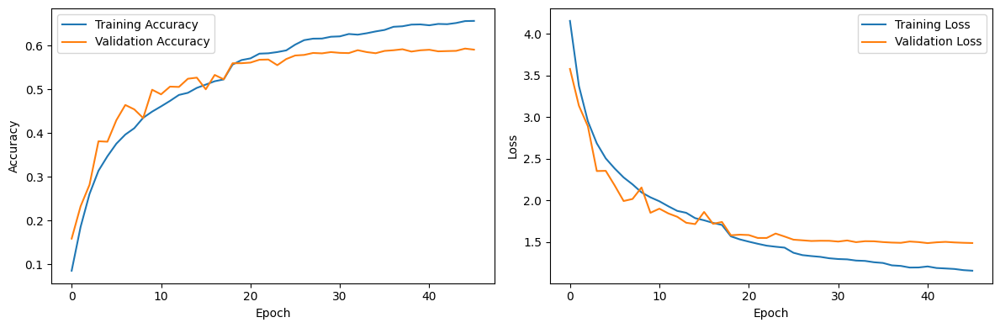

In [7]:
# Evaluate on test data
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f'Test loss: {test_loss:.4f}')
print(f'Test accuracy: {test_acc:.4f}')
# Make predictions on test data
y_pred = model.predict(x_test)

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

## Save the Model for TensorFlow.js

Now we'll save the model in a format that can be loaded by TensorFlow.js.

In [8]:
# First, save the model in Keras format
model.save('cifar100_model.h5')

## Test Model Loading

Let's verify that we can load the saved model back.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


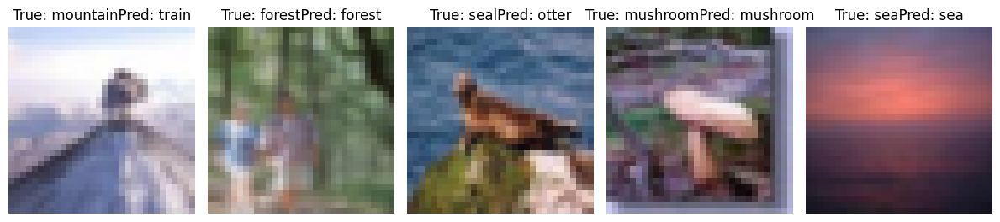

In [9]:
# Load the saved model
loaded_model = tf.keras.models.load_model('cifar100_model.h5')

# Test on a few examples
test_images = x_test[:5]
predictions = loaded_model.predict(test_images)

# Display the images and predictions
plt.figure(figsize=(12, 12))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(test_images[i])
    plt.title(f'True: {class_names[y_test[i][0]]}Pred: {class_names[np.argmax(predictions[i])]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

## Instructions for Using the Model in the Web App

After running this notebook, you'll have a TensorFlow.js model saved in the `models/cifar100` directory. To use this model in your web application:

1. Copy the entire `models/cifar100` directory to your web application's public directory
2. Make sure the model files are accessible at the path specified in your `loadModel` function (`./models/cifar100/model.json`)
3. The application should now be able to load your trained model instead of using the mock model

### Model Directory Structure

The converted model will have the following structure:
```
models/
  cifar100/
    model.json           # Model topology
    group1-shard1of1.bin # Model weights
```

### Notes on Model Size

- The converted model may be quite large (tens of MB)
- For production use, consider using model quantization or a smaller architecture
- TensorFlow.js also supports loading models from a server, which can be more efficient for large models

## Training a MobileNet or EfficientNet Model

If you want to train a MobileNet or EfficientNet model instead, you can use transfer learning with pre-trained models from TensorFlow Hub. Here's a brief example for MobileNet: